In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

In [2]:
def coth(a):
    if a>0: return (1+tf.math.exp(-2*a))/(1-tf.math.exp(-2*a))
    if a<0: return (tf.math.exp(2*a)+1)/(tf.math.exp(2*a)-1)
    if a==0: return 0

def tanh(a):
    if a>0: return (1-tf.math.exp(-2*a))/(1+tf.math.exp(-2*a))
    if a<0: return (tf.math.exp(2*a)-1)/(tf.math.exp(2*a)+1)
    if a==0: return 0

In [3]:
data=1000
batch=100
set=10
layer=10
n_ini=1.0
n_fin=0.1
dn=-0.1
m2=-1
lam=1
c_reg1=0.03
c_reg2=0

<tf.Variable 'Variable:0' shape=(10,) dtype=float64, numpy=
array([ 2.96411401,  0.6171641 ,  2.42264097,  1.9119733 ,  1.50130984,
        1.76612991,  3.21553891,  3.30134183,  3.02187932, 10.42032906])>
tf.Tensor(
[ 3.01490951  3.02722263  3.04978824  3.09134316  3.16854751  3.31437385
  3.59861219  4.18820179  5.58607614 10.29821491], shape=(10,), dtype=float64)


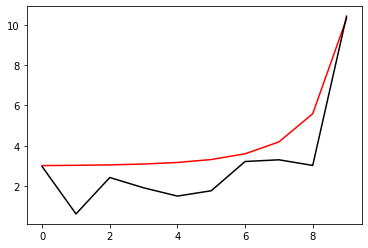

In [4]:
h=tf.zeros(layer)
h_in=[]
#h_in=[3.0205426, 3.022307 , 3.0291433, 3.04402  , 3.0732646, 3.131582 ,
# 3.2585216, 3.5762587, 4.59116  , 9.752249]
for i in range (layer):
#   midd=np.float64(10.0)
#    h_in.append(midd)
#    midd=3*coth(3*((i-layer)*dn)).numpy()
#    h_in.append(midd)
    mu=1/(1-i/10)
    h_inn=np.float64(np.random.normal(mu, 1))
    h_in.append(h_inn)
h=tf.Variable(h_in)
print(h)

h_real=tf.zeros(layer)
middd=[]
for i in range (layer):
    midd=3*coth(3*((i-layer)*dn)).numpy()
    middd.append(midd)
h_real=tf.constant(middd)
print(h_real)
plt.plot(h_real, 'r-')
plt.plot(h.numpy(), 'k-')
plt.show()

In [5]:
def F_func(a,b):
    return 2*b/n_fin-m2*a-lam*(a**3)

def t_func(a):
    return 0.5*(tf.math.tanh(100*(a-0.1))-tf.math.tanh(100*(a+0.1))+2)

In [6]:
def LP2(hh, phi, pi):
    for j in range (layer-1):
        phi1=phi+dn*pi
        pi1 =phi*m2*dn+(1-dn*hh[j])*pi+dn*lam*(phi1**3)
        phi=phi1
        pi=pi1
    return phi, pi
def NN_func_p(hh):
    Positive=[]
    while len(Positive)<batch:
        phi1=np.random.uniform(0.0, 1.5, 10000)
        pi1=np.random.uniform(-0.2, 0.2, 10000)
        phi_1, pi_1=LP2(hh, phi1, pi1)
        F=np.array(tf.math.abs(F_func(phi_1, pi_1)))
        for i in range (len(phi1[F<0.1])):
            Positive.append([phi1[F<0.1][i], pi1[F<0.1][i]])
            if len(Positive)>=batch: break
    return Positive
def NN_func_n(hh):
    Negative=[]
    while len(Negative)<batch:
        phi1=np.random.uniform(0.0, 1.5, 10000)
        pi1=np.random.uniform(-0.2, 0.2, 10000)
        phi_1, pi_1=LP2(hh, phi1, pi1)
        F=np.array(tf.math.abs(F_func(phi_1, pi_1)))
        for i in range (len(phi1[F>=0.1])):
            Negative.append([phi1[F>=0.1][i], pi1[F>=0.1][i]])
            if len(Negative)>=batch: break
    return Negative
def NN_func_01(hh, list1):
    PP=[]
    NN=[]
    phi=np.array(list1)[:, 0]
    pi=np.array(list1)[:, 1]
    F=np.array(tf.math.abs(LP2(hh, phi, pi)[1]))
    for i in range (len(phi[F<0.1])):
        PP.append([phi[F<0.1][i], pi[F<0.1][i]])
    for i in range (len(phi[F>=0.1])):
        NN.append([phi[F>=0.1][i], pi[F>=0.1][i]])
    return PP, NN

In [7]:
Positive=[]
Negative=[]
for i in range (set):
    Positive.insert(i, NN_func_p(h_real))
    Negative.insert(i, NN_func_n(h_real))
    print(i)

0
1
2
3
4
5
6
7
8
9


In [8]:
Positive0=[]
Positive1=[]
Negative0=[]
Negative1=[]
for i in range (set):
    Positive0.insert(i, NN_func_01(h, Positive[i])[0])
    Positive1.insert(i, NN_func_01(h, Positive[i])[1])
    Negative0.insert(i, NN_func_01(h, Negative[i])[0])
    Negative1.insert(i, NN_func_01(h, Negative[i])[1])

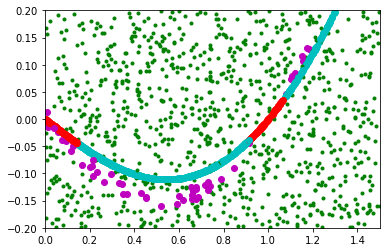

In [9]:
x_data1=[]
y_data1=[]
x_data2=[]
y_data2=[]
x_data3=[]
y_data3=[]
x_data4=[]
y_data4=[]
for i in range (set):
    x_data1.insert(i, [v[0] for v in Positive0[i]])
    y_data1.insert(i, [v[1] for v in Positive0[i]])
    x_data2.insert(i, [v[0] for v in Positive1[i]])
    y_data2.insert(i, [v[1] for v in Positive1[i]])
    x_data3.insert(i, [v[0] for v in Negative0[i]])
    y_data3.insert(i, [v[1] for v in Negative0[i]])
    x_data4.insert(i, [v[0] for v in Negative1[i]])
    y_data4.insert(i, [v[1] for v in Negative1[i]])
    plt.plot(x_data4[i], y_data4[i], 'g.')
    plt.plot(x_data2[i], y_data2[i], 'co')
    plt.plot(x_data1[i], y_data1[i], 'ro')
    plt.plot(x_data3[i], y_data3[i], 'mo')
plt.xlim(0.0, 1.5)
plt.ylim(-0.2, 0.2)
plt.show()

# Error function

$E=\sum_{data} \left\vert y(\bar{x}^{(1)}) - \bar{y} \right\vert+E_{reg}(W)$
, $E_{reg}=c_{reg}^{(1)}\sum_{n=1}^{N-1}(\eta^{(n)})^{4}(h(\eta^{(n+1)})-h(\eta^{(n)}))^{2}+c_{reg}^{(2)}(h(\eta^{(N)})-1/\eta^{(N)})^{2}$

In [10]:
def Error_func(hh, list1, list2):
    phi0=np.array([v[0] for v in list1])
    pi0=np.array([v[1] for v in list1])
    phi1=np.array([v[0] for v in list2])
    pi1=np.array([v[1] for v in list2])
    phi_0, pi_0=LP2(hh, phi0, pi0)
    phi_1, pi_1=LP2(hh, phi1, pi1)
    PPlist=t_func(pi_0)
    NNlist=t_func(pi_1)
    sum_p=sum(PPlist)/batch
    sum_n=(batch-sum(NNlist))/batch

    inside=0
    for k in range (layer-1):
        second=((n_ini+k*dn)**4)*((hh[k+1]-hh[k])**2)
        inside=inside+second
    E_reg1=c_reg1*inside
    E_reg2=c_reg2*((hh[layer-1]-1/n_fin)**2)
    return E_reg1+E_reg2+sum_p+sum_n

In [11]:
for i in range (set):
    print(Error_func(h_real, Positive[i], Negative[i]))
for i in range (set):
    print(Error_func(h, Positive[i], Negative[i]))

tf.Tensor(0.032384347237825184, shape=(), dtype=float64)
tf.Tensor(0.051886188266706684, shape=(), dtype=float64)
tf.Tensor(0.017196159644188212, shape=(), dtype=float64)
tf.Tensor(0.029378900318571616, shape=(), dtype=float64)
tf.Tensor(0.022514917844009958, shape=(), dtype=float64)
tf.Tensor(0.02219274510553351, shape=(), dtype=float64)
tf.Tensor(0.02002997395942559, shape=(), dtype=float64)
tf.Tensor(0.015039734415480033, shape=(), dtype=float64)
tf.Tensor(0.022084063243898614, shape=(), dtype=float64)
tf.Tensor(0.01267558062203491, shape=(), dtype=float64)
tf.Tensor(1.0543038887744138, shape=(), dtype=float64)
tf.Tensor(1.094758622255381, shape=(), dtype=float64)
tf.Tensor(1.0644006452563723, shape=(), dtype=float64)
tf.Tensor(1.033924731695822, shape=(), dtype=float64)
tf.Tensor(1.0753576101098246, shape=(), dtype=float64)
tf.Tensor(1.129647077038885, shape=(), dtype=float64)
tf.Tensor(1.0419321293943655, shape=(), dtype=float64)
tf.Tensor(1.0280553503272754, shape=(), dtype=float

0 1.0096661653043555
[ 2.86411449  0.71716384  2.32264176  2.01196841  1.6013038   1.86609523
  3.11554517  3.20135102  2.92188783 10.32041245]


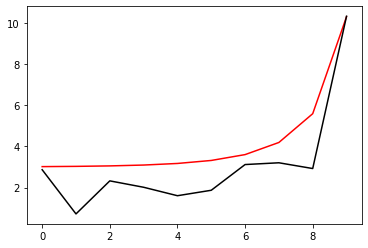

1100 0.17326116414442652
[3.51355247 1.96180334 3.12196838 3.48960108 3.12613031 3.29551171
 2.9786067  2.10865928 1.57622139 9.21314349]


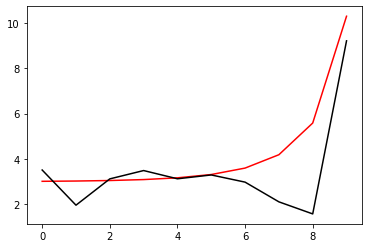

2200 0.04822445191897973
[3.14751511 2.36081692 2.9126473  3.32837892 3.25461402 3.33708579
 3.23711604 2.57050145 1.82206037 8.16108175]


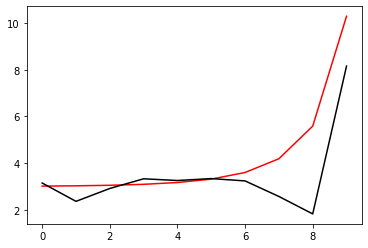

3300 0.04268437875807395
[3.04846076 2.76100703 3.01053269 3.33948313 3.50771832 3.68717063
 3.82380978 3.35863225 2.33515344 7.21302644]


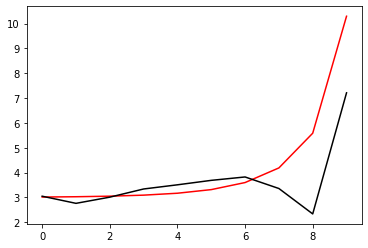

4400 0.03106545082742547
[2.94647642 2.9333804  3.05117986 3.27546874 3.53965624 3.80030189
 4.00764457 3.78760208 2.79361916 6.36212506]


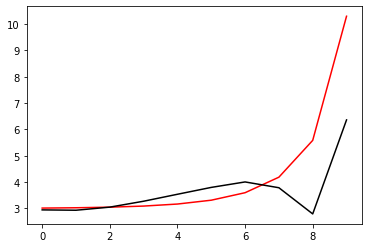

5500 0.02289101733996134
[2.86701    2.9394206  3.03618569 3.23464253 3.51242455 3.84
 4.16121632 4.19151073 3.34437152 5.60042479]


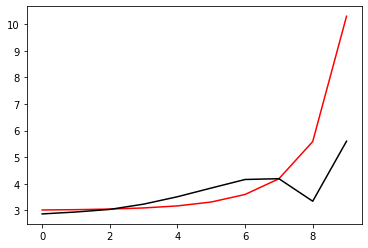

6600 0.03213562551044128
[2.7998691  2.87075465 2.96800523 3.1294166  3.35864808 3.63392285
 3.91412508 4.0516778  3.48980641 4.96152292]


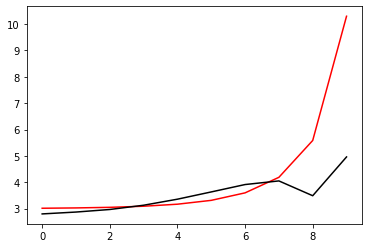

7700 0.08985569354767496
[2.66351665 2.73327225 2.86075503 3.05046976 3.30517868 3.62497009
 3.98670797 4.26074688 3.94357321 4.50213561]


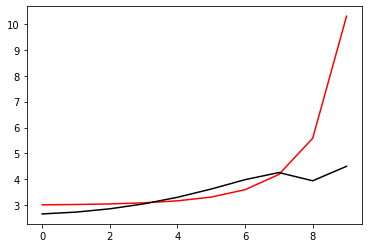

8800 0.01273354312273807
[2.7758951  2.83758759 2.95735219 3.13723002 3.38094863 3.69052441
 4.04945004 4.3514041  4.15834044 4.18734218]


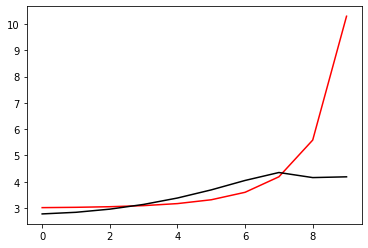

9900 0.013983000553911136
[2.91835749 2.96272653 3.06137206 3.2196503  3.4448251  3.74514256
 4.11893511 4.49785802 4.50697028 4.33891714]


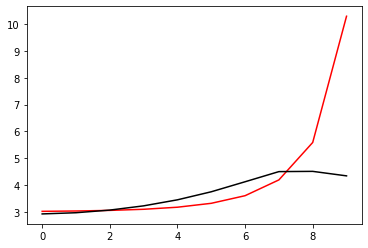

11000 0.031731376798034235
[2.89680683 2.94481829 3.04229502 3.19510252 3.40981753 3.69163755
 4.03128701 4.34757033 4.28978873 4.24675659]


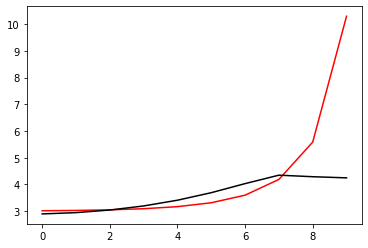

12100 0.051214106477198845
[2.89970319 2.94145111 3.03289996 3.18095831 3.39408165 3.68123103
 4.04235297 4.42065355 4.50050161 4.47180812]


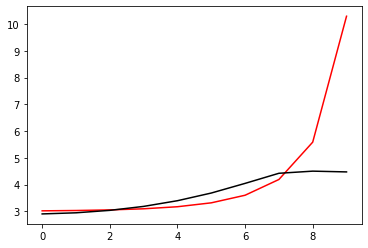

13200 0.013554931925442444
[2.93264892 2.96782126 3.05008229 3.19018866 3.40063181 3.69698897
 4.09345839 4.56483355 4.84060148 4.7472552 ]


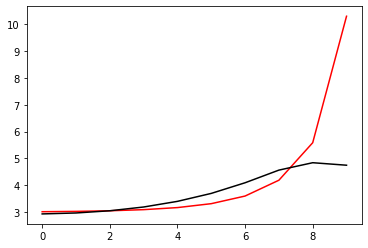

14300 0.030528219543191685
[2.9921209  3.00886609 3.06271746 3.16773543 3.33607623 3.57963558
 3.89911593 4.22613112 4.41285807 4.38999421]


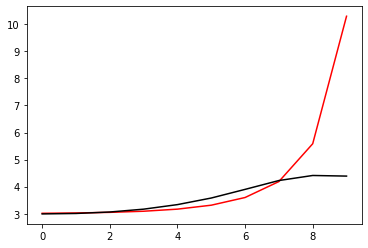

15400 0.02053993666521244
[2.93622645 2.95485184 3.00837747 3.11301828 3.28598669 3.5452117
 3.90088381 4.3110416  4.62179015 4.58800567]


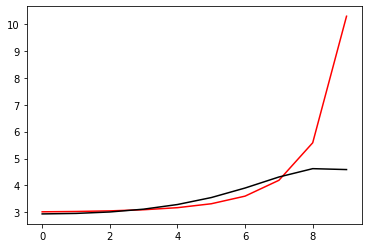

16500 0.021241470735541848
[2.91494122 2.93652577 2.99234817 3.0978663  3.27301776 3.54219743
 3.92867284 4.42225447 4.87475825 4.88886087]


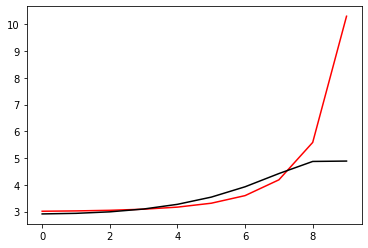

17600 0.022989017686081286
[2.902478   2.92776689 2.98812961 3.09755097 3.27698506 3.5555386
 3.96926363 4.54321551 5.16777529 5.25501243]


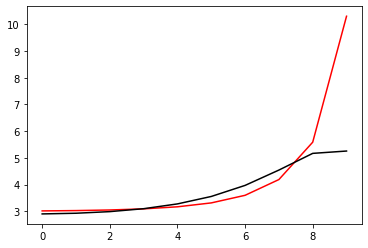

18700 0.28525472824504616
[2.62865289 2.66052987 2.73139861 2.85727013 3.06228334 3.38365384
 3.87401432 4.57893812 5.3801783  5.78024197]


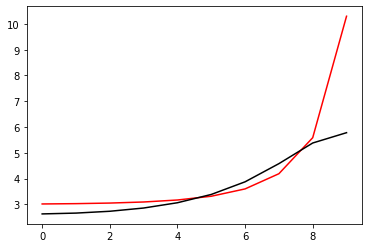

19800 0.02154991192393681
[2.95341174 2.99662775 3.07729443 3.20736343 3.40798861 3.70749677
 4.12357734 4.5640277  4.99577642 4.99837624]


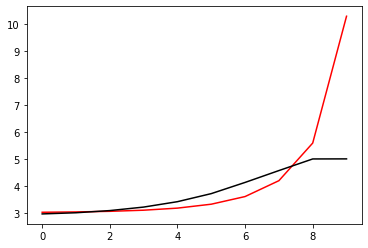

20900 0.012393947961721068
[2.9296354  2.96767896 3.04686443 3.17707673 3.37849049 3.67956263
 4.10565857 4.65169463 5.1738796  5.14582769]


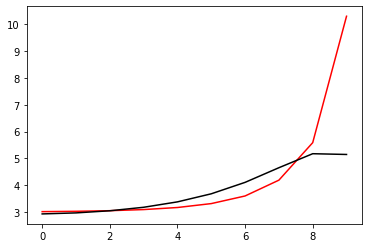

22000 0.031838102904192776
[2.9189364  2.95219673 3.02805694 3.15770164 3.36070328 3.6677771
 4.12287818 4.78278755 5.43843459 5.46910261]


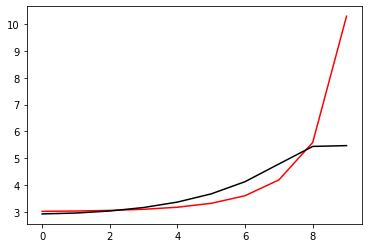

23100 0.03836810326826851
[2.9954625  3.03447901 3.11709052 3.2561618  3.47437267 3.81085483
 4.33163507 5.09944632 5.84810513 5.68854975]


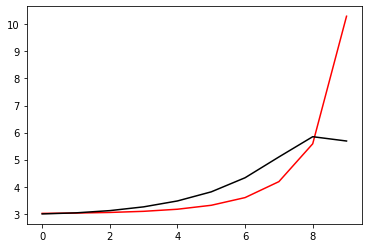

24200 0.012251406762627816
[2.9415594  2.97668492 3.05446723 3.18581423 3.39038244 3.70254932
 4.17843559 4.88271722 5.69406917 5.68606425]


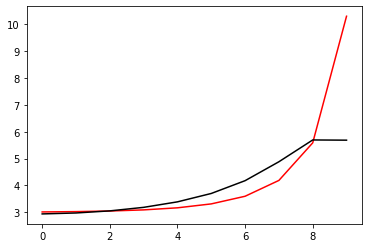

25300 0.023221508947375992
[2.86912409 2.91005551 2.99294848 3.1276194  3.33244208 3.63915353
 4.09917724 4.77919187 5.63871431 5.64275744]


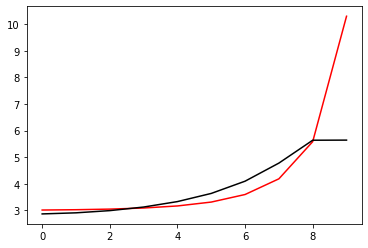

26400 0.011890772603548719
[2.82214428 2.86274128 2.95125868 3.09848462 3.32566036 3.6709322
 4.19909394 5.0026949  6.07635772 5.96165561]


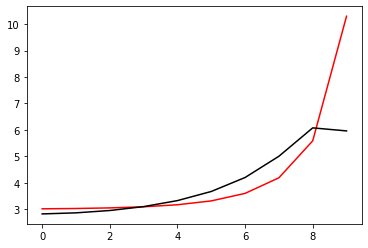

27500 0.03342129164393199
[2.76177216 2.80427607 2.89384909 3.03933948 3.2585275  3.58277774
 4.06262111 4.76524875 5.69004532 5.75328197]


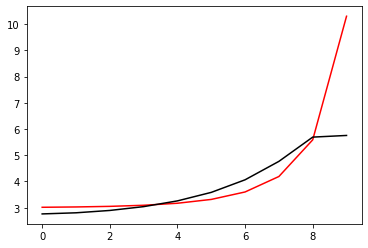

28600 0.023111962642414777
[2.84804492 2.88288306 2.964913   3.10441195 3.3189243  3.63932796
 4.11539099 4.81323951 5.73213385 5.71562705]


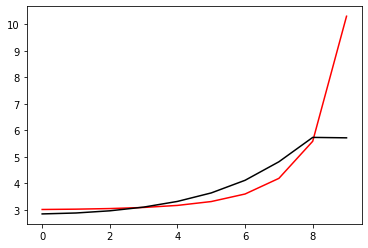

29700 0.01245945087625333
[2.88421099 2.91828202 2.9988991  3.13826475 3.3549238  3.68074631
 4.16736679 4.88358838 5.82758828 5.82769666]


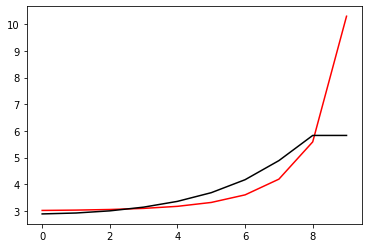

30800 0.012465667635546263
[2.86797288 2.90508087 2.98779203 3.12979986 3.35155963 3.68694689
 4.19126819 4.94012542 5.93489216 5.92279172]


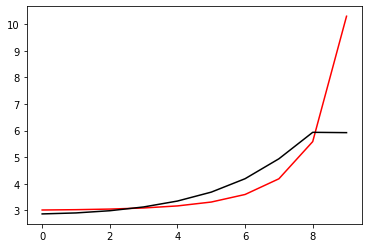

31900 0.01263559353448923
[2.92707012 2.95738938 3.03233894 3.16835221 3.38836593 3.72914876
 4.25069331 5.03762818 6.09810898 6.11744988]


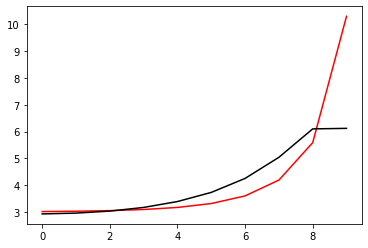

33000 0.03202520002626724
[2.89381718 2.91767421 2.98263476 3.1046124  3.30456355 3.61486485
 4.0872995  4.79524255 5.74833246 5.75099704]


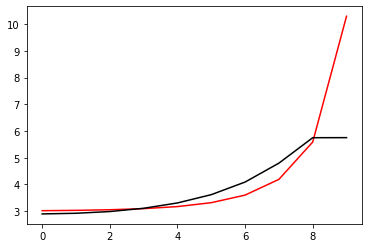

34100 0.046392742842345076
[2.86310162 2.89166777 2.96008496 3.08532019 3.29021355 3.60943393
 4.09821    4.83493116 5.83312919 5.81650067]


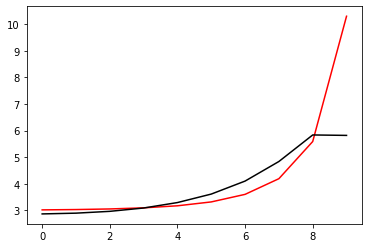

35200 0.012966384387756168
[2.912689   2.94192397 3.01126728 3.13743515 3.34505326 3.67160409
 4.17628907 4.94345685 5.99263137 5.98502744]


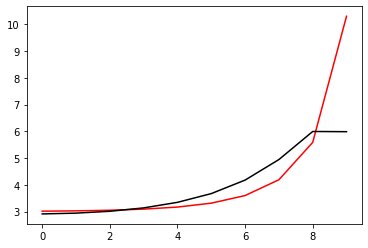

36300 0.02609814524937174
[2.92099202 2.96286493 3.05022235 3.19455156 3.4201769  3.76687494
 4.29599311 5.09375351 6.19190439 6.30131637]


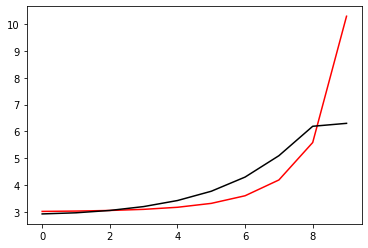

37400 0.03458517787939307
[2.76244263 2.79843172 2.88055953 3.0213098  3.24305796 3.58394779
 4.1051423  4.89330574 5.98104795 6.05126762]


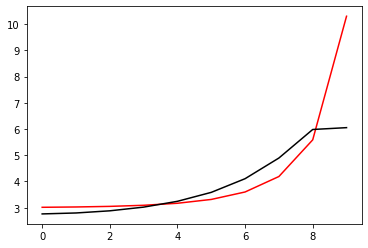

38500 0.02239583973834176
[2.90895143 2.93609673 3.00732949 3.13882756 3.35363359 3.68995061
 4.20991379 5.00331085 6.10704697 6.10869142]


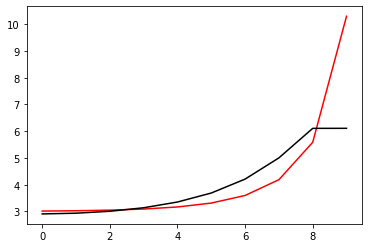

39600 0.01226050894583523
[2.94800993 2.98034774 3.05260979 3.17970901 3.38468018 3.70411454
 4.19804375 4.95746419 6.02935496 6.04327359]


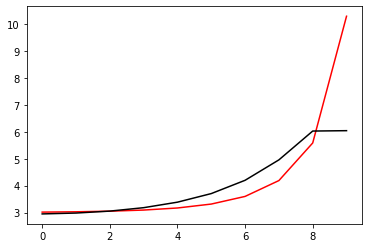

40700 0.02002165176832872
[2.87834831 2.90173669 2.9635857  3.07573878 3.25690662 3.53615622
 3.95952855 4.59946658 5.51315254 5.52597692]


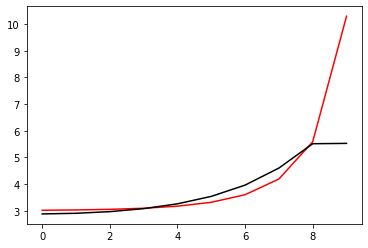

41800 0.012008423531634924
[2.89543109 2.92211359 2.98640556 3.1016048  3.28711359 3.57328187
 4.00832365 4.66569568 5.5945638  5.58902329]


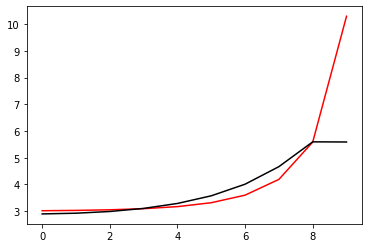

42900 0.011889369940390887
[2.86404635 2.89710272 2.96701033 3.08778645 3.28001675 3.57606462
 4.02807826 4.71456802 5.6791723  5.68650364]


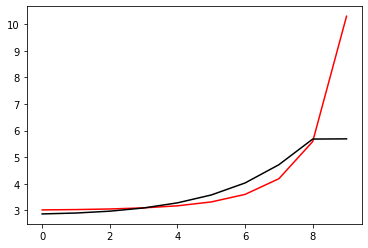

44000 0.031615988043288856
[2.96997749 2.99091956 3.04857073 3.15643575 3.33471213 3.61490486
 4.0473068  4.71025657 5.65951036 5.70082904]


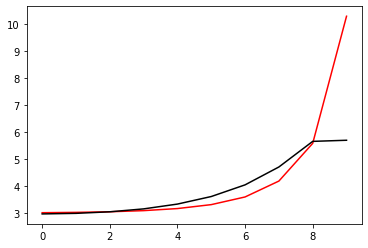

45100 0.04558643338716541
[2.84383622 2.88294289 2.96246493 3.09368929 3.2984781  3.61309925
 4.09768871 4.84194217 5.87916103 5.86500241]


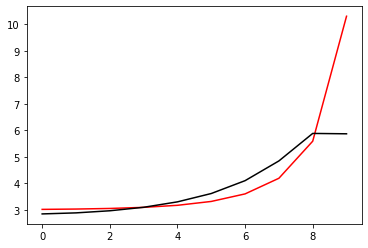

46200 0.0181298978268101
[2.87572607 2.90492717 2.97248324 3.09054874 3.2791217  3.57146577
 4.02222527 4.71756435 5.72926182 5.68361176]


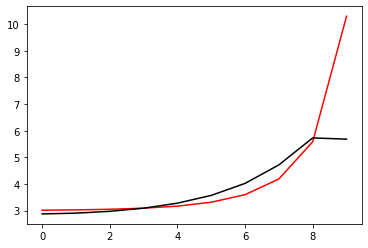

47300 0.032068207343980595
[2.83038856 2.86785564 2.94282885 3.06753031 3.26251627 3.56194927
 4.02366601 4.74120662 5.78786349 5.78092938]


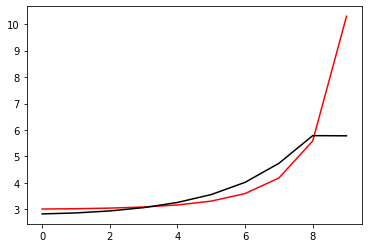

48400 0.018857270325821667
[2.9228667  2.9768213  3.07408429 3.22137021 3.43683755 3.75270072
 4.2231231  4.93235122 5.93688519 5.79092725]


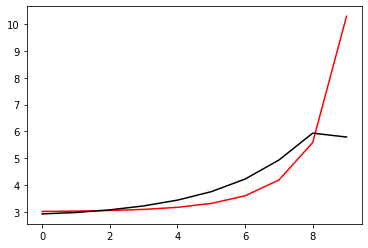

49500 0.012934917027290592
[2.80635658 2.85849631 2.9535928  3.09562693 3.29745973 3.58266787
 3.98764421 4.56869473 5.41069131 5.48268438]


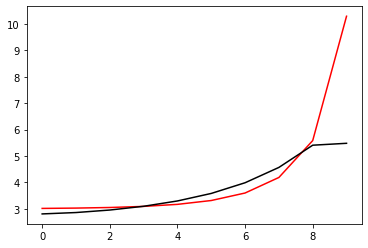

50600 0.02109723447367675
[2.87237098 2.9164445  3.00605599 3.14530532 3.34719883 3.63629508
 4.05162094 4.64862186 5.48643073 5.4792342 ]


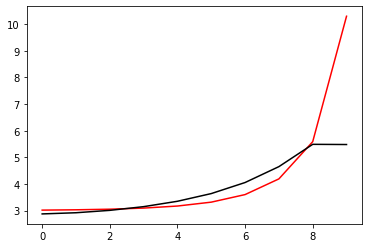

51700 0.012056156250867995
[2.90192586 2.94332386 3.03144306 3.17201271 3.37891903 3.67898425
 4.11691724 4.75301694 5.61226697 5.61776957]


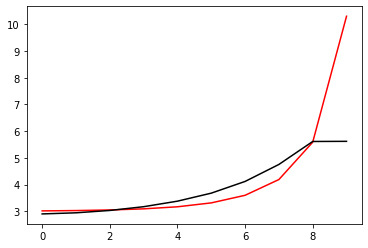

52800 0.046562487150091425
[2.79353447 2.80369267 2.8609045  2.971707   3.14910918 3.41793249
 3.81821222 4.39144509 5.1699222  5.22779163]


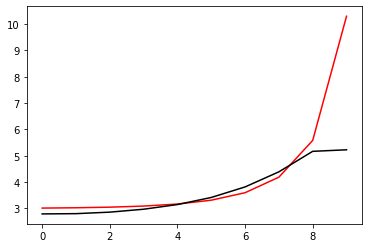

53900 0.011324836906416653
[2.8990985  2.90957614 2.9596524  3.062658   3.23208026 3.49175301
 3.88026552 4.44091082 5.20345091 5.20810598]


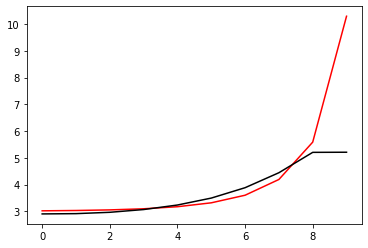

55000 0.03147281191947633
[2.94414206 2.96495095 3.02084743 3.12799335 3.30308237 3.57123128
 3.97232272 4.55545616 5.34786583 5.35413198]


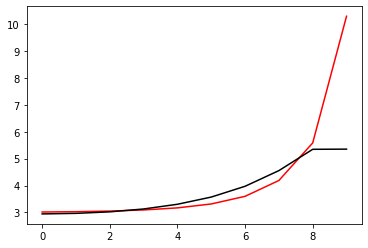

56100 0.050726045574726
[2.94598388 2.9700285  3.02800025 3.13482071 3.31010271 3.58185336
 3.993161   4.60231452 5.43788007 5.44816861]


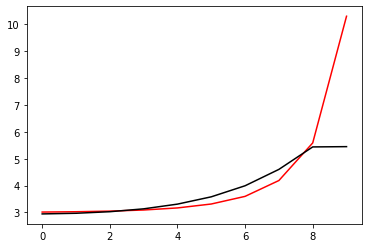

57200 0.013577883498365938
[2.93323882 2.95660605 3.01521355 3.12467424 3.30770211 3.59893637
 4.05179081 4.74085324 5.69651084 5.63746946]


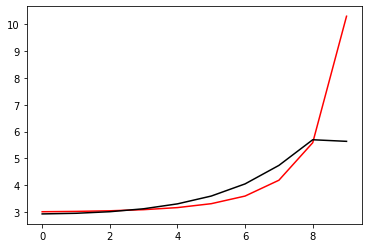

58300 0.029815430238521314
[2.84139014 2.88897107 2.97278324 3.10365886 3.30329752 3.60572419
 4.0644615  4.75633113 5.7127429  5.84923958]


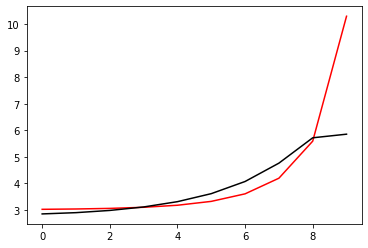

59400 0.012269334837613981
[2.8267479  2.8739445  2.96484954 3.10610898 3.31806881 3.63600971
 4.1162335  4.83990944 5.84194889 5.83259132]


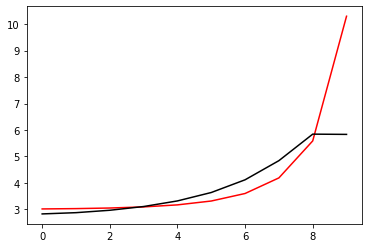

60500 0.02165981550393579
[2.87913684 2.90677631 2.9750877  3.09275891 3.27704025 3.55968017
 3.99400256 4.66259659 5.61558276 5.62337162]


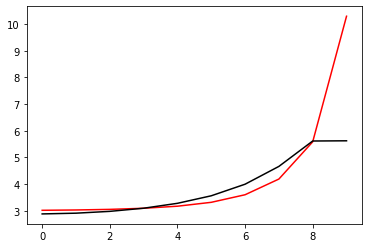

61600 0.01230186131927687
[2.93257684 2.96988215 3.04947779 3.18216117 3.38762779 3.70065578
 4.18013628 4.91552227 5.95400197 5.92207761]


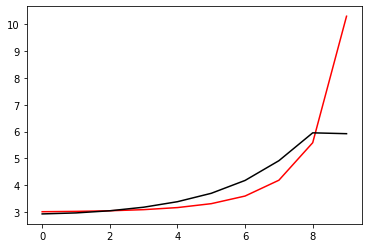

62700 0.011783108108980617
[2.92364984 2.96415298 3.04407738 3.17208165 3.36347295 3.64213573
 4.03729695 4.57005374 5.35936249 5.37442688]


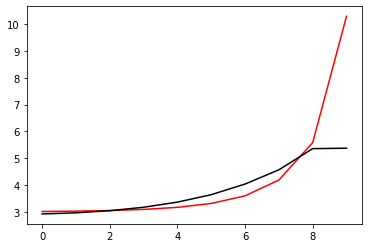

63800 0.021476929212293185
[2.93002881 2.96885407 3.04848741 3.17701266 3.37003541 3.65257781
 4.05899109 4.62448505 5.41781664 5.42072632]


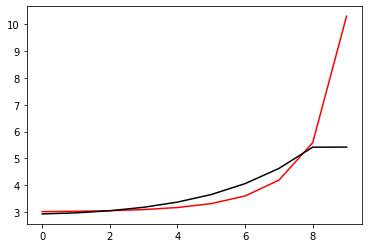

64900 0.012316224268716602
[2.93518446 2.97074552 3.04821903 3.17622808 3.37080133 3.65890869
 4.08258454 4.69664874 5.51225081 5.49704694]


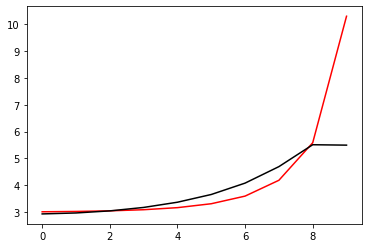

66000 0.031891841696294804
[2.91833591 2.9518795  3.0277054  3.15610829 3.35447148 3.65301409
 4.10336603 4.78397929 5.66082675 5.70104398]


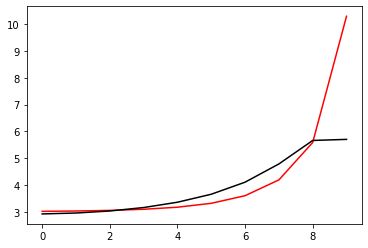

67100 0.04621183685593231
[2.8580612  2.88885947 2.96247107 3.09236265 3.30011183 3.62419054
 4.13478996 4.93888825 5.95725307 5.89202489]


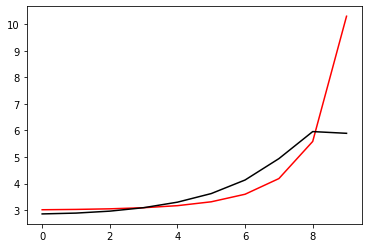

68200 0.014744892683537552
[2.84816535 2.88658548 2.96508658 3.10111717 3.32150706 3.66996882
 4.21600256 5.04660997 6.10839103 6.4839747 ]


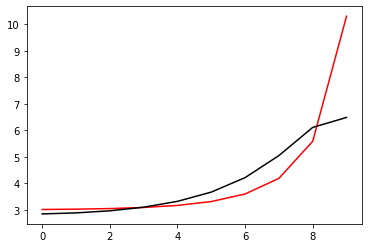

69300 0.10771078250770075
[2.72787357 2.76079935 2.83333632 2.9613428  3.17035805 3.50204394
 4.02329082 4.82388113 5.87784858 6.08021292]


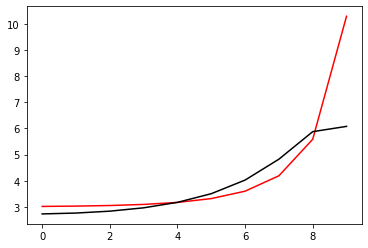

70400 0.015591968710278247
[2.90503611 2.92344278 2.97853276 3.08931745 3.28042125 3.59154527
 4.08694474 4.85497419 5.87979688 5.8568485 ]


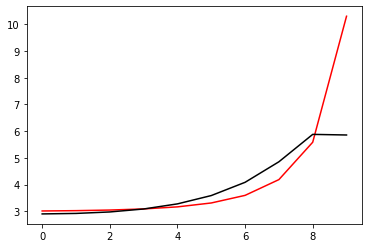

71500 0.022094463893426064
[2.97016722 2.98983503 3.04543278 3.15534324 3.34560108 3.65664695
 4.15322829 4.92590151 5.97359191 5.98785675]


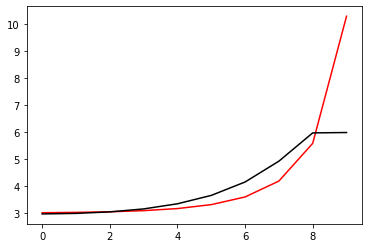

72600 0.011890148967539491
[2.9932282  3.0028369  3.04503716 3.13878675 3.30925738 3.59507911
 4.05808545 4.78839501 5.8056871  5.81166683]


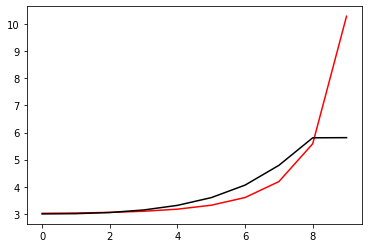

73700 0.011894592776244828
[2.9712188  2.99441107 3.04867459 3.15170285 3.32978483 3.62287969
 4.09499396 4.84143296 5.89912771 5.9107606 ]


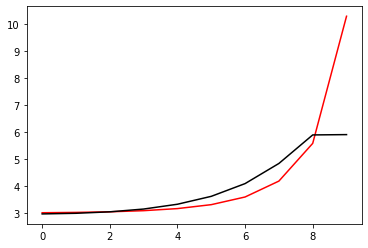

74800 0.022128960651514294
[2.98038864 3.01125022 3.07790738 3.19352916 3.38271791 3.68617584
 4.17038345 4.93671623 6.04088709 6.06560725]


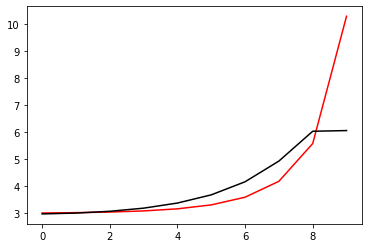

75900 0.012130900096885017
[2.8544451  2.87718737 2.93696709 3.04787218 3.23374775 3.53502734
 4.01819529 4.77733116 5.83089007 5.85488204]


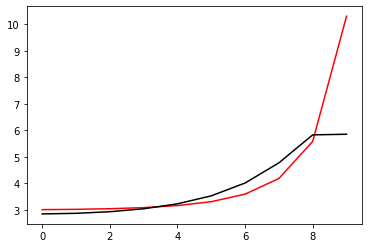

77000 0.032013206333917056
[2.90499875 2.92579358 2.98333574 3.09250325 3.27705153 3.57707133
 4.05833986 4.81416508 5.86489033 5.86733742]


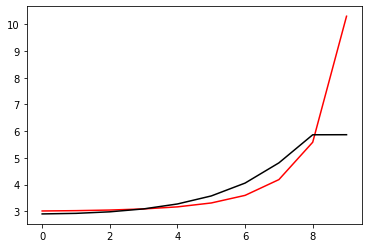

78100 0.04743777703982531
[2.88633535 2.91001626 2.96958798 3.08123988 3.26959778 3.5757884
 4.06765187 4.84247384 5.92424809 5.91199069]


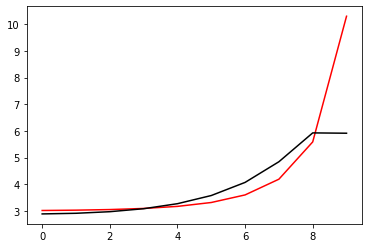

79200 0.013551379343164045
[2.84766376 2.87862584 2.94582381 3.06580775 3.26498331 3.58699244
 4.10403121 4.92021649 6.06251248 6.04089674]


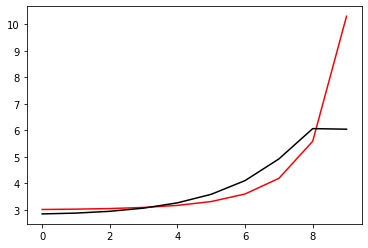

80300 0.02269160125393893
[2.88706999 2.91729153 2.98708337 3.11106645 3.3158094  3.64584105
 4.17483712 5.01127715 6.19347144 6.23772126]


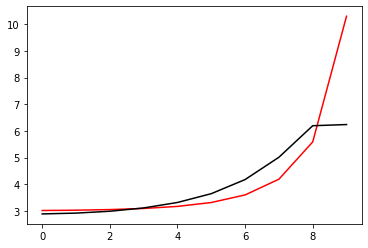

81400 0.012610305263383564
[2.86078952 2.8908264  2.95830819 3.07781125 3.27250602 3.57953342
 4.0546395  4.77378395 5.8012949  5.98426654]


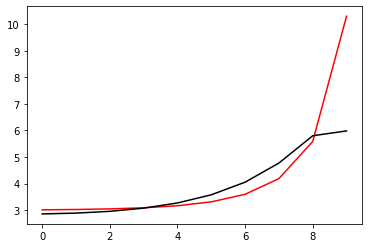

82500 0.022113824143659443
[2.8803167  2.91102696 2.98052382 3.10323354 3.30319339 3.61936449
 4.11175863 4.85961981 5.90193776 5.89755427]


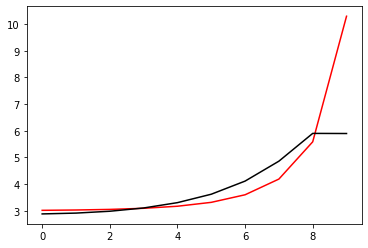

83600 0.02104437107050769
[2.87354996 2.90581613 2.97778716 3.10403115 3.30933461 3.63460283
 4.14503878 4.92875195 6.00625906 5.99812178]


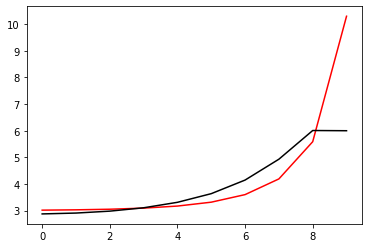

84700 0.012439870078807397
[2.9329493  2.96180885 3.0319132  3.15911105 3.36924691 3.70572288
 4.23883408 5.06259251 6.1784006  6.19842228]


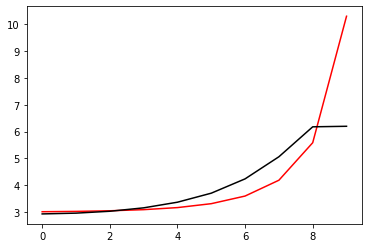

85800 0.013101146815404772
[2.81209625 2.85513743 2.9385075  3.07692982 3.29631557 3.64005949
 4.17950175 5.01633162 6.17521292 6.15825163]


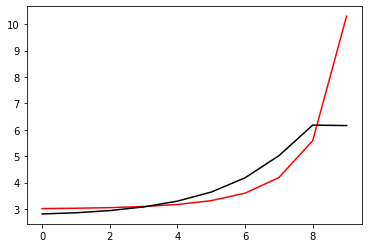

86900 0.012279530697128083
[2.97322916 2.98471414 3.03327209 3.13451373 3.31094181 3.59939186
 4.05915078 4.78044349 5.82805891 5.8254449 ]


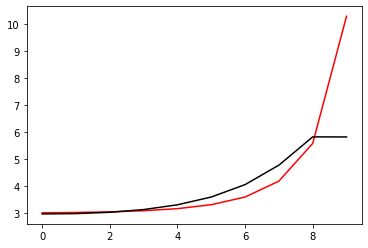

88000 0.03193347573421786
[2.95539571 2.97491691 3.02911297 3.1356346  3.31914987 3.6187612
 4.09909284 4.86149559 5.97621571 5.99264559]


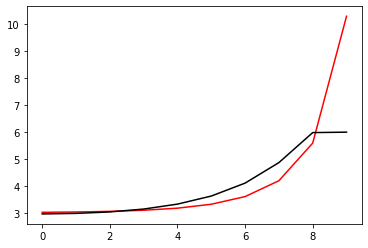

89100 0.05026676792593403
[2.96022286 2.96002687 2.99116468 3.07001461 3.2179242  3.46745092
 3.86920176 4.49535013 5.41661373 5.39664424]


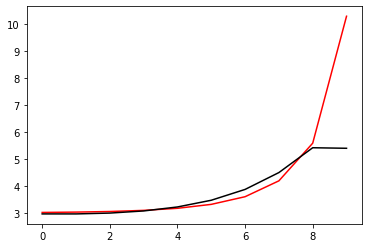

90200 0.012735766167256088
[2.98886656 2.99988029 3.03771123 3.12167635 3.27493019 3.53139259
 3.94394417 4.58994729 5.53783445 5.5101653 ]


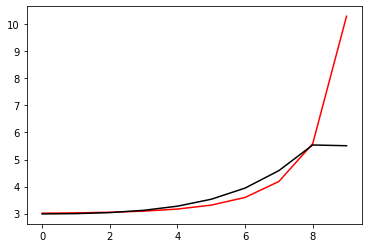

91300 0.028224763172886514
[2.97784823 2.99405418 3.0370421  3.12437699 3.28093926 3.54342518
 3.96914977 4.64414989 5.63725859 5.63717401]


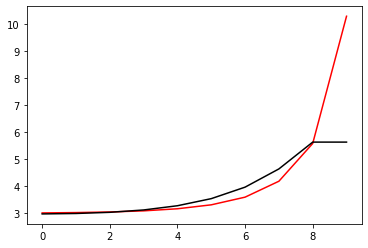

92400 0.013776722911428821
[2.85039217 2.87201037 2.92532519 3.0235514  3.19118554 3.46805891
 3.91845157 4.63987599 5.70072422 5.65356967]


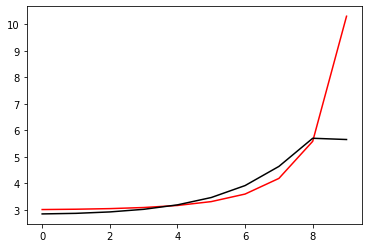

93500 0.022041585889360282
[2.91983219 2.94592812 3.00803882 3.11968987 3.30465586 3.60387364
 4.08592837 4.85495729 5.97372564 6.05032524]


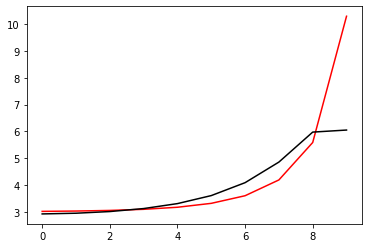

94600 0.012068346321147463
[2.95375893 2.99240002 3.06449806 3.18112829 3.36300652 3.64223198
 4.05623485 4.59915482 5.37603148 5.36240747]


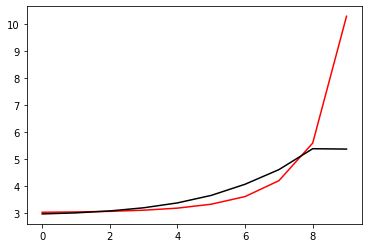

95700 0.01168043481060716
[2.95525577 2.99033953 3.06209734 3.17999286 3.36439473 3.64818875
 4.07607647 4.69765654 5.49142296 5.49572626]


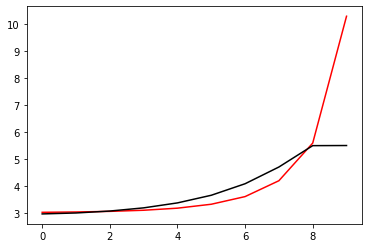

96800 0.021814922665639596
[2.95209249 2.98444001 3.0554123  3.17520947 3.36391834 3.65642552
 4.11012433 4.80919543 5.66472983 5.67365964]


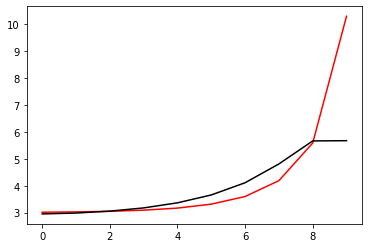

97900 0.011582446871946352
[2.8750875  2.8994728  2.96046187 3.06852952 3.24184877 3.51350531
 3.94369471 4.61723072 5.38391503 5.37995158]


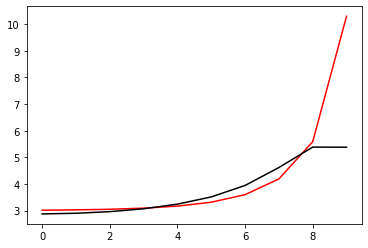

99000 0.0320932942042065
[2.87658392 2.9172105  2.99581447 3.12369959 3.32184249 3.62732744
 4.10472156 4.84051106 5.73112757 5.67381601]


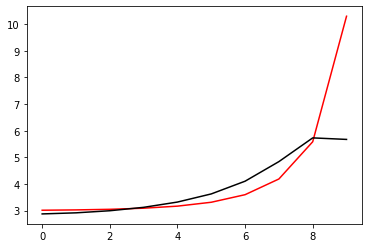

100100 0.4174026183995509
[3.05489164 3.09724561 3.18128108 3.31923498 3.53355223 3.86414295
 4.37787368 5.16337071 6.16317578 5.96178658]


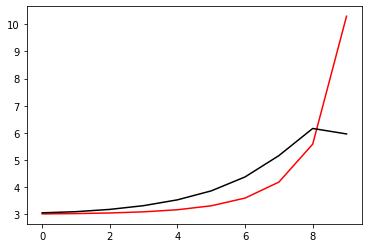

101200 0.01692050838118158
[2.88089574 2.91805393 2.99472067 3.12060719 3.3143008  3.60796646
 4.05296169 4.71560854 5.55990768 5.54482612]


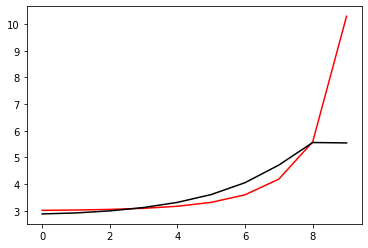

102300 0.0227192637467597
[2.88985069 2.92570768 3.00253748 3.13004505 3.32736073 3.62796397
 4.08610941 4.77107914 5.64253366 5.63305112]


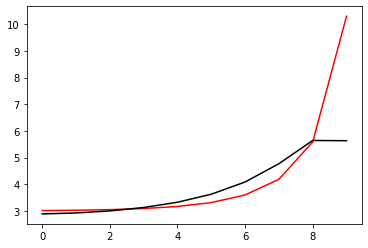

103400 0.012271823813683434
[2.83328802 2.87324786 2.955558   3.08984338 3.29619368 3.61043287
 4.09229328 4.82053666 5.7546506  5.73066201]


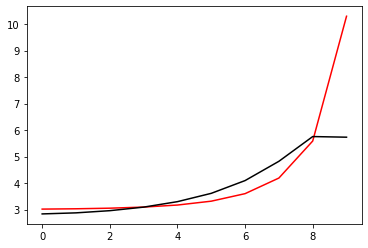

104500 0.022250660183498517
[2.92306041 2.96024267 3.04210882 3.17833554 3.38953244 3.71285215
 4.2088008  4.95085751 5.89757851 5.94929933]


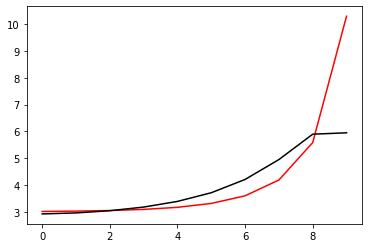

105600 0.08554407622013215
[3.04878942 3.0711817  3.13454918 3.24957416 3.43406618 3.7185046
 4.15049416 4.78725709 5.61954164 5.71938802]


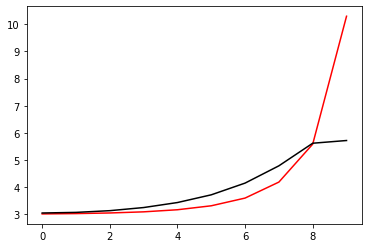

106700 0.012011598080366814
[2.9229419  2.95208813 3.0191383  3.13820203 3.32877321 3.62296135
 4.07306635 4.75127988 5.66962352 5.64810475]


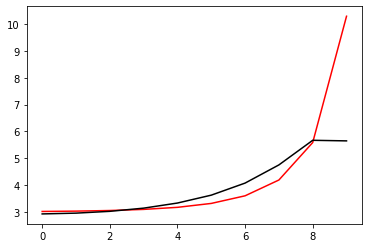

107800 0.02233566195788135
[2.99617146 3.02741224 3.09786186 3.22048746 3.41604584 3.7176147
 4.17615201 4.85864517 5.79615078 5.80873155]


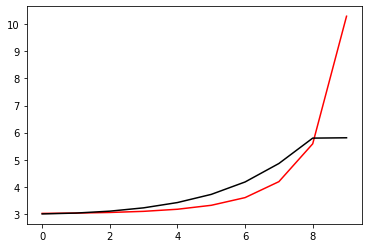

108900 0.012561839108785586
[2.93480869 2.9653662  3.03686397 3.16347145 3.36892932 3.69307991
 4.20357614 5.00428431 6.12300519 6.10244253]


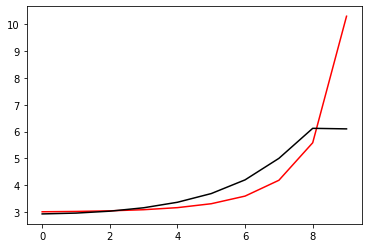

110000 0.032345394049968265
[2.86295673 2.89783339 2.97163904 3.09660553 3.2934195  3.59595752
 4.05907422 4.76362532 5.73163291 5.73129811]


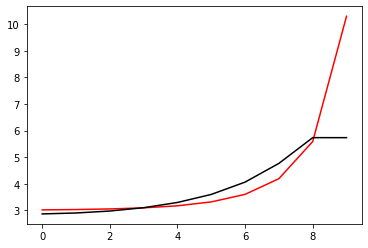

111100 0.04802019252338194
[2.86942286 2.904746   2.98012083 3.10757199 3.30836414 3.61776026
 4.09325398 4.81762412 5.80570102 5.7963533 ]


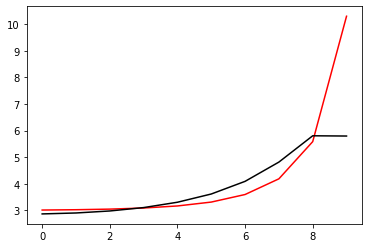

112200 0.015371706691442806
[2.87390805 2.90891595 2.98530712 3.11537836 3.32115957 3.63995942
 4.13338696 4.88884688 5.91408852 5.88958873]


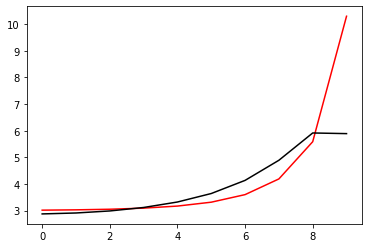

113300 0.02664840903176017
[2.84385691 2.88208914 2.96343414 3.10052806 3.31681171 3.65287088
 4.17688015 4.98496496 6.07804025 6.1140977 ]


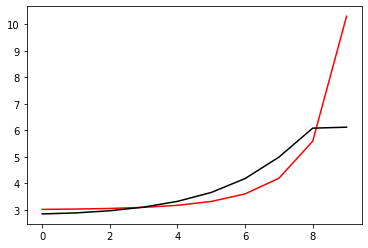

114400 0.017155758634201195
[2.94595495 2.97328764 3.04592533 3.17688414 3.39002196 3.72721468
 4.25807973 5.07982053 6.20252246 6.05068793]


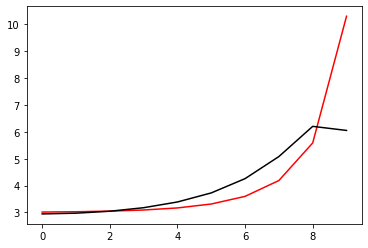

115500 0.013391562330408845
[2.83069327 2.85802874 2.92531753 3.04708111 3.24553482 3.55753675
 4.04271301 4.78172623 5.80591715 5.85901127]


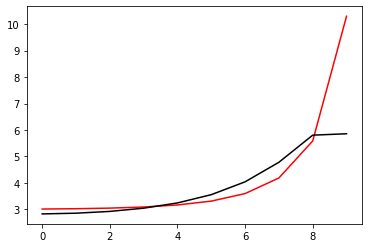

116600 0.01889057938113732
[2.90666887 2.92911821 2.99040835 3.10726863 3.3026714  3.61388306
 4.10124644 4.84842679 5.88845336 5.87972679]


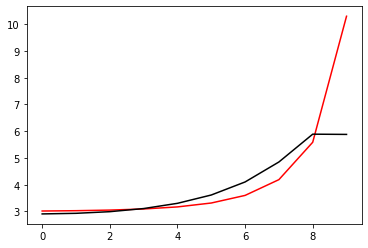

117700 0.012013523843778726
[2.96770535 2.98853996 3.04657637 3.15911993 3.35021232 3.65757919
 4.14194136 4.89088953 5.94430593 5.94795608]


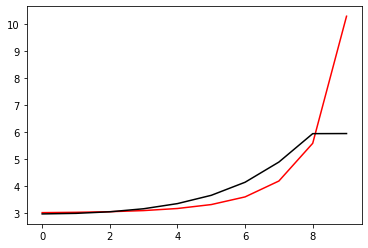

118800 0.031907929383525255
[2.82715122 2.84123735 2.88946121 2.98711224 3.15667299 3.43246249
 3.86951705 4.55294355 5.54353117 5.84678031]


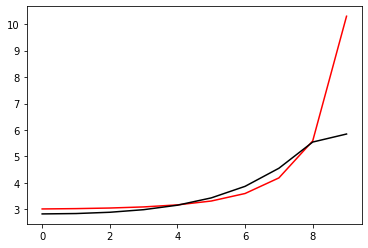

119900 0.011672044420162273
[2.9463864  2.96365126 3.01103421 3.10615652 3.27181769 3.5423976
 3.97304208 4.64893276 5.62892922 5.63665596]


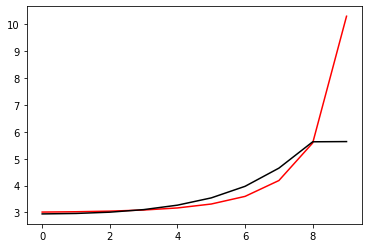

121000 0.03203644905749413
[2.89316112 2.92104016 2.98153126 3.09007104 3.27128704 3.56344782
 4.02876497 4.76379887 5.83215824 5.8296919 ]


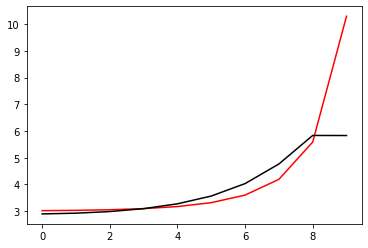

122100 0.04998024620520471
[2.9521397  2.97306096 3.02736048 3.13000677 3.30475828 3.58963295
 4.04552879 4.76182165 5.78007985 5.76430553]


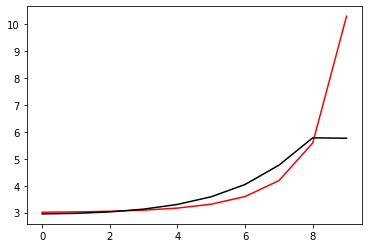

123200 0.014329321143670434
[2.85049156 2.88279406 2.95096692 3.07052225 3.26773876 3.58584453
 4.09668052 4.91114855 6.09576576 6.02093116]


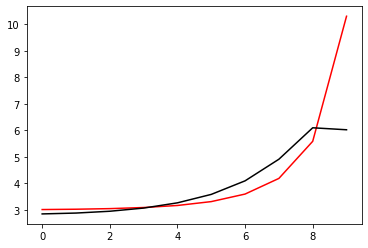

124300 0.12014954611044684
[2.7004595  2.73618395 2.81045408 2.93760375 3.14324002 3.47109021
 3.99475592 4.82899817 6.04604624 6.24353928]


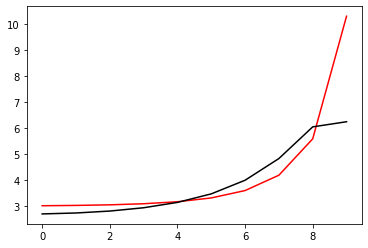

125400 0.013311326647407456
[2.88724707 2.91007709 2.97080519 3.08566308 3.27974372 3.59581029
 4.10660355 4.92697855 6.13324612 6.09773363]


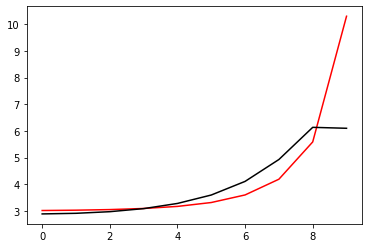

126500 0.014398413583349168
[2.87548477 2.88290345 2.92578899 3.02040175 3.19135374 3.47956521
 3.95586379 4.73873688 5.92495474 5.92423468]


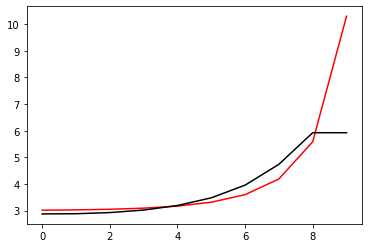

127600 0.012092262861853885
[2.99465341 3.01038988 3.05912184 3.15927545 3.33693316 3.63415371
 4.12242351 4.91930579 6.12152814 6.13735977]


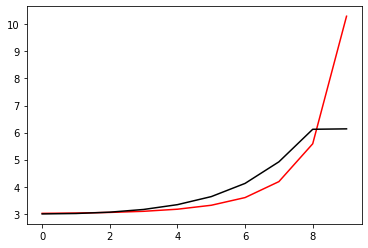

128700 0.018204846109198078
[2.96050823 2.95148648 2.97200105 3.03961255 3.17849796 3.42561521
 3.83990014 4.51328843 5.58022601 5.99188965]


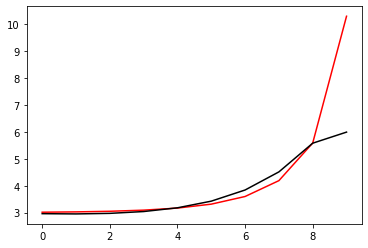

129800 0.021332180657746704
[2.98910552 2.99255015 3.01978167 3.09259326 3.23662148 3.4899406
 3.91342826 4.6034506  5.68624915 5.6906621 ]


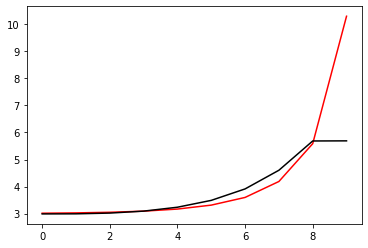

130900 0.011872551574315708
[2.9840785  2.99428728 3.02754261 3.10373007 3.25031302 3.50774535
 3.94074664 4.65320434 5.76358504 5.74881566]


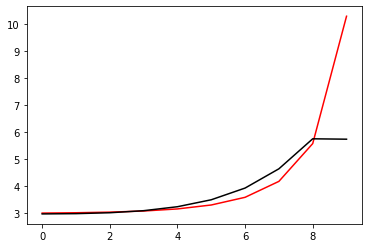

132000 0.03444547561647097
[2.88510778 2.91497545 2.96950834 3.0619274  3.21641104 3.47088087
 3.88720876 4.56831936 5.62800751 5.61505033]


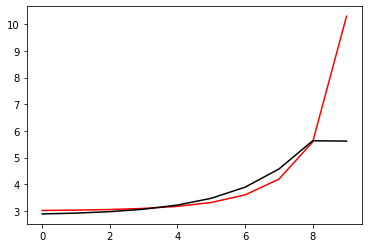

133100 0.032561062467755884
[2.99457765 3.02640352 3.09057555 3.19823864 3.37289556 3.65556822
 4.11505208 4.86144944 5.98748104 5.89116748]


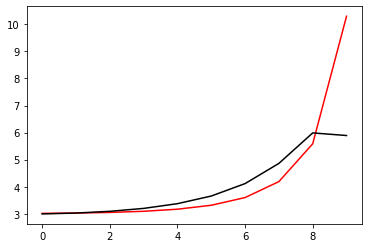

134200 0.42210344536310895
[2.59382343 2.63203684 2.70655987 2.82976908 3.02464858 3.33276655
 3.82620286 4.62052213 5.80677342 6.31237444]


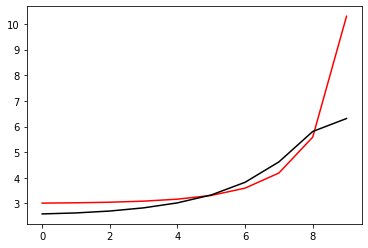

135300 0.024400536079341447
[2.90912196 2.92533924 2.97736167 3.07594303 3.24023035 3.50506359
 3.93113259 4.61885595 5.65937894 5.64600245]


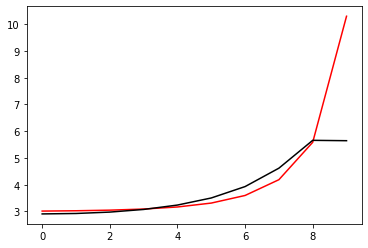

136400 0.016239575938578565
[2.90957063 2.93034183 2.98570588 3.08876148 3.25978163 3.53488346
 3.97708178 4.68916785 5.7581773  5.7474747 ]


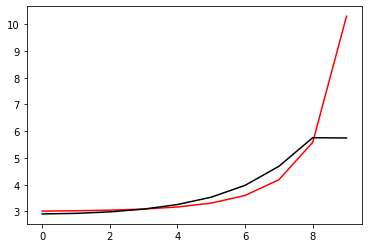

137500 0.03971963028832032
[2.76295165 2.8042686  2.87887828 3.00018497 3.19071331 3.48944553
 3.96451715 4.72623804 5.86032372 5.86082261]


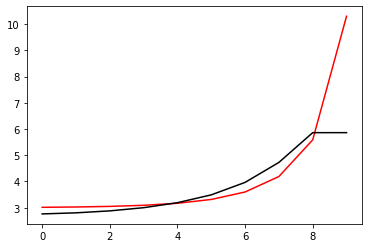

138600 0.012137992149089725
[2.95933286 2.98544472 3.04787037 3.15968739 3.34341337 3.63816031
 4.11135328 4.87071395 5.99656134 5.97946861]


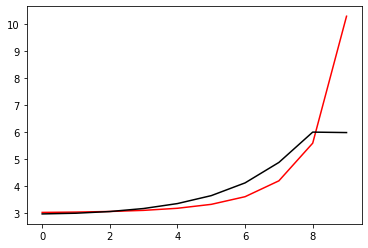

139700 0.013657881622952707
[2.88506863 2.92274626 2.99554275 3.113704   3.29792459 3.58380829
 4.03259867 4.74684189 5.82648305 5.79041497]


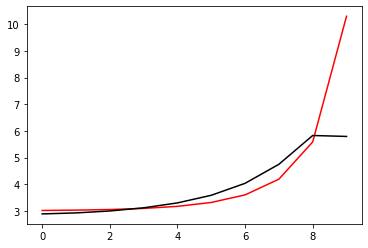

140800 0.021917087199409713
[2.97440308 3.00310228 3.06890264 3.1830807  3.36590737 3.65342207
 4.10782773 4.83195634 5.91951749 5.93414987]


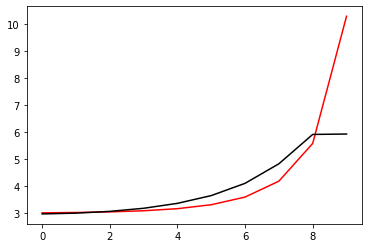

141900 0.014519881018456006
[2.97114271 3.00673368 3.07429772 3.18738141 3.36637702 3.64438003
 4.06785572 4.63962483 5.46383225 5.46758489]


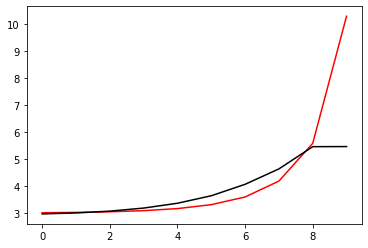

143000 0.032168915544899174
[2.8604373  2.90653992 2.98908531 3.11655655 3.30952634 3.60269693
 4.04962871 4.71553845 5.60091385 5.58175583]


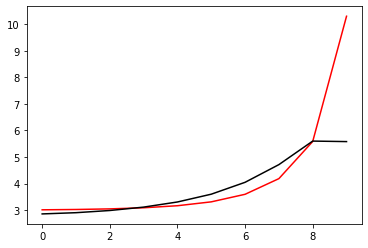

144100 0.045033032186826895
[2.83369156 2.87550192 2.95982701 3.09311475 3.29510969 3.60320015
 4.08215933 4.8306651  5.80200349 5.74712099]


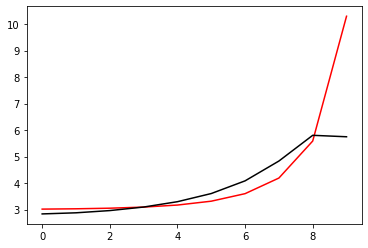

145200 0.18998134768927918
[2.61330168 2.65836107 2.74972103 2.89809041 3.12709191 3.48386543
 4.05288281 4.92809359 5.91064398 6.37338895]


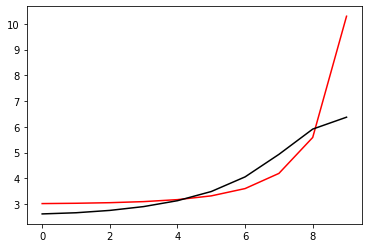

146300 0.02271979899496455
[2.8760895  2.91666279 3.00101595 3.13784458 3.34692208 3.66700041
 4.16441848 4.90926889 5.74177915 5.73396411]


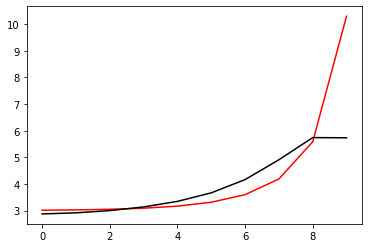

147400 0.013301234876931588
[2.85494393 2.89526197 2.98044157 3.12004029 3.33466    3.66440329
 4.17819258 4.952338   5.83807934 5.80993922]


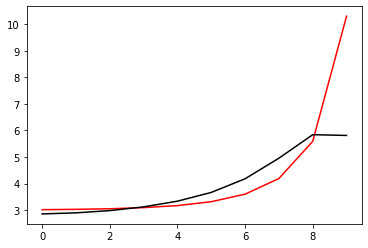

148500 0.015230342363450989
[2.82298202 2.86466353 2.95176685 3.09569458 3.31844482 3.66188294
 4.19818128 5.01226581 5.97524755 6.02138432]


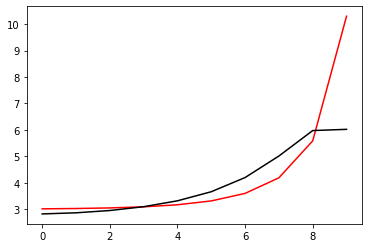

149600 0.016581220758966703
[2.8630998  2.90108561 2.98675345 3.13392253 3.36696366 3.7304334
 4.29941704 5.16178593 6.20835909 6.17797655]


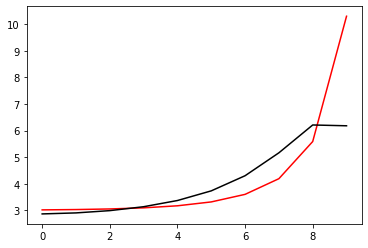

150700 0.04183310752898322
[2.84111229 2.84241864 2.88846279 2.99577562 3.18827449 3.50614888
 4.00966657 4.75771714 5.73714134 5.750286  ]


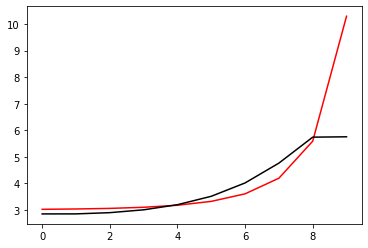

151800 0.011942989386419696
[2.89640651 2.90425637 2.94634146 3.04786514 3.23475035 3.54685672
 4.04451019 4.79323092 5.78490584 5.77785327]


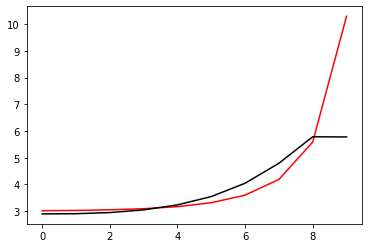

152900 0.011969547737721737
[2.92188919 2.94189741 2.99319747 3.09800565 3.28468523 3.59342689
 4.08434258 4.83118618 5.83741197 5.83274292]


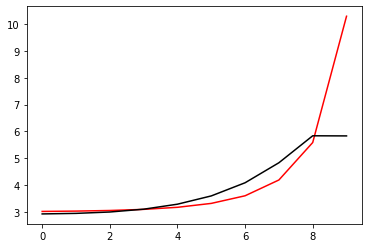

154000 0.03224666849237748
[2.87669283 2.90585519 2.96958261 3.08499156 3.27986583 3.59542265
 4.09335971 4.85795924 5.91398096 5.91660728]


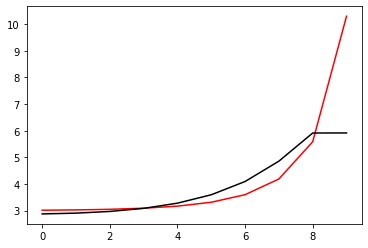

155100 0.05072958784712966
[2.97775839 2.97553619 3.00580127 3.08526966 3.23647335 3.49117213
 3.89023761 4.48174775 5.31264181 5.31249809]


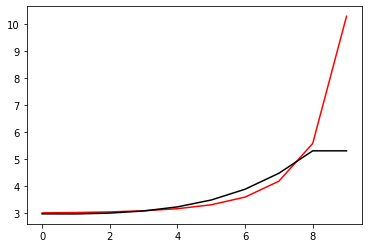

156200 0.013452007773671672
[2.99146022 2.99584174 3.02830429 3.10929948 3.26241215 3.52047455
 3.92769041 4.53819624 5.38995345 5.36706287]


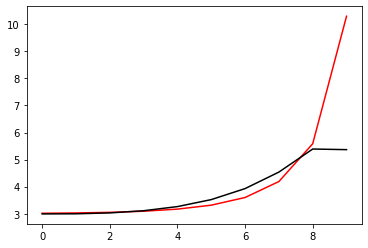

157300 0.028897385965656077
[2.98877033 2.99950676 3.03584043 3.11859879 3.27316243 3.5342329
 3.95094324 4.58778225 5.47722042 5.4821875 ]


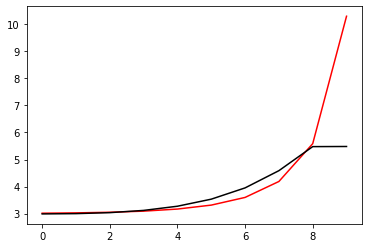

158400 0.02008936787321338
[2.95412949 2.97049294 3.01337966 3.10173101 3.26283455 3.53619363
 3.9813296  4.68135371 5.6626904  5.63492812]


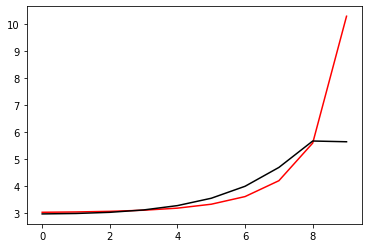

159500 0.013035020223433037
[2.84413507 2.8696343  2.92658666 3.02896946 3.2021632  3.48816097
 3.95467598 4.70172164 5.7686204  5.79428832]


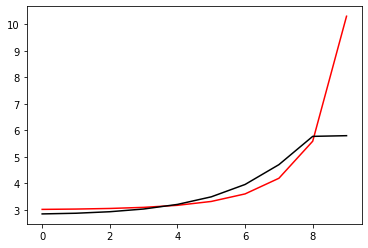

160600 0.02658094623553611
[2.93596006 2.94448912 2.98020293 3.05705152 3.19596824 3.42980589
 3.80668262 4.38879198 5.2071088  5.19372965]


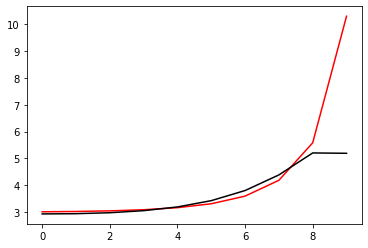

161700 0.011837515702884313
[2.96963324 2.98768049 3.0322784  3.11865499 3.26907903 3.51833046
 3.91852085 4.53614414 5.38688176 5.3653403 ]


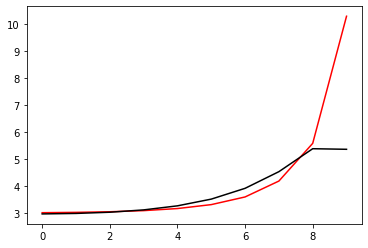

162800 0.021371697860838895
[2.99073265 3.0099948  3.0566466  3.14501073 3.29771725 3.55028103
 3.95734969 4.59251313 5.47511844 5.43912843]


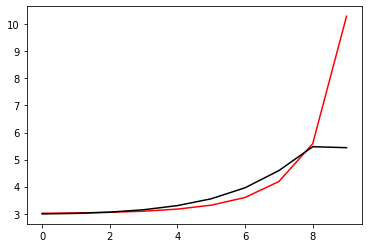

163900 0.011770323649878192
[2.95040052 2.97644945 3.03110466 3.12722873 3.28786116 3.55025929
 3.97405493 4.64542184 5.5957093  5.58314656]


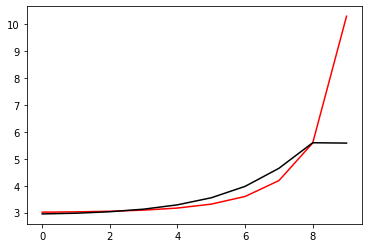

165000 0.03164686763503924
[2.92376455 2.94978617 3.00602275 3.10283392 3.26040824 3.51359985
 3.92062599 4.57164964 5.51998714 5.50671864]


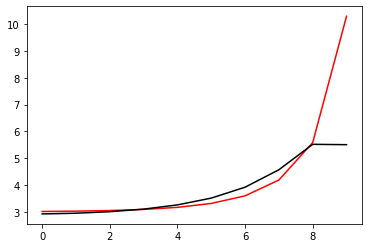

166100 0.05074393555334988
[2.96559379 2.9813647  3.02433162 3.10921503 3.25698945 3.50227203
 3.90480577 4.56449877 5.56659037 5.55531626]


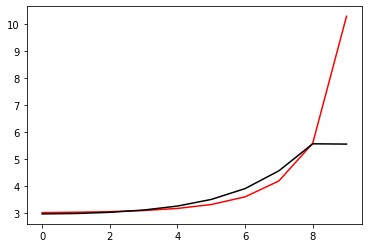

167200 0.01944640037007344
[2.85929331 2.90707301 2.98453494 3.10107736 3.2784637  3.5515487
 3.9713824  4.58114643 5.3567009  5.54369676]


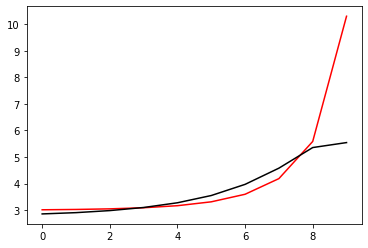

168300 0.023102589871144812
[2.89184675 2.93579312 3.01946668 3.14816017 3.34282443 3.64178585
 4.1047802  4.79672001 5.6673221  5.63881302]


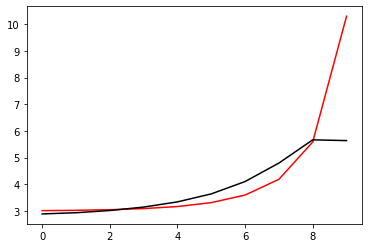

169400 0.012494724138155385
[2.85358795 2.88469578 2.95725552 3.07946928 3.27030537 3.56609339
 4.02708541 4.73781187 5.70900212 5.65396515]


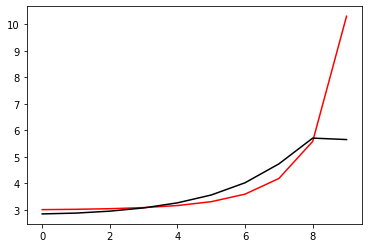

170500 0.022221719623741993
[2.91780689 2.95259507 3.02977053 3.16036009 3.36540109 3.68342306
 4.1807114  4.94590756 5.93866755 5.98579829]


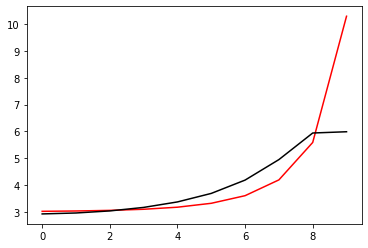

171600 0.012305817512618538
[2.94516803 2.98252238 3.05920843 3.18549673 3.37865697 3.66542455
 4.07281654 4.58295069 5.31211002 5.36717543]


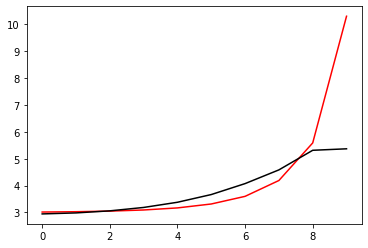

172700 0.01166465370845717
[2.94868009 2.98422757 3.06018948 3.18652553 3.38077525 3.67027135
 4.08717026 4.64181221 5.37424232 5.37288181]


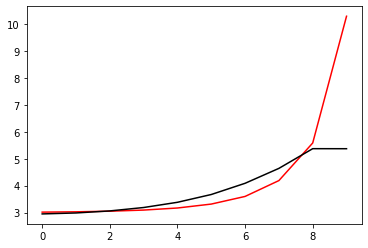

173800 0.021719577474523043
[2.95034337 2.98397427 3.05869478 3.18506319 3.38106591 3.67555556
 4.10927008 4.72260022 5.47603427 5.4819518 ]


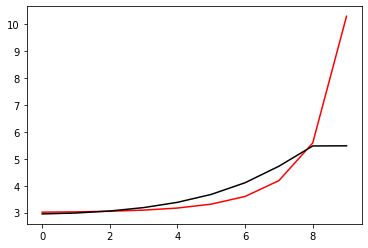

174900 0.01212812833918036
[2.92559053 2.95763239 3.03107903 3.15785251 3.35730835 3.66178378
 4.12411574 4.81921945 5.64724994 5.62151428]


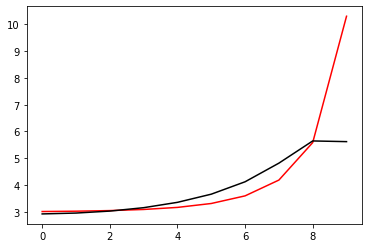

176000 0.03229866362136633
[2.89240187 2.92304378 2.99590904 3.12543672 3.3348426  3.66439983
 4.18289195 4.98965618 5.94457056 5.98264536]


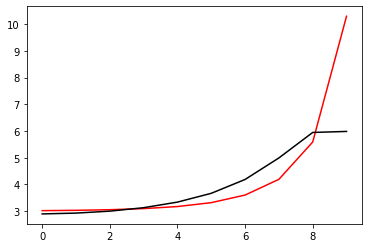

177100 0.04689337107239025
[2.88473505 2.89782732 2.95147285 3.06244133 3.25590873 3.57473002
 4.08245778 4.79785262 5.60093751 5.59342277]


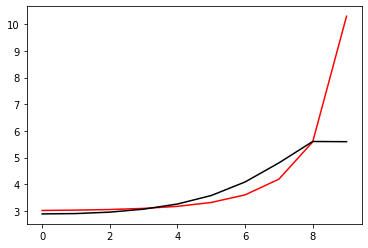

178200 0.01618099502323286
[2.8990811  2.91648454 2.97170797 3.08464224 3.2818968  3.60713001
 4.12427968 4.86394587 5.70583075 5.68142442]


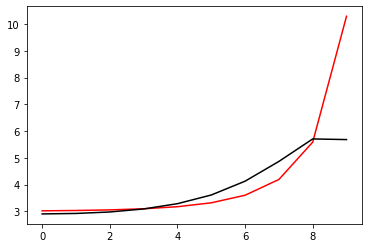

179300 0.031363286458941396
[2.84758863 2.87498837 2.93876285 3.05915237 3.26510687 3.60198559
 4.13636652 4.91885639 5.83783628 5.85986416]


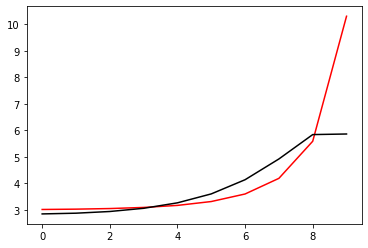

180400 0.01744231053093309
[2.91226456 2.94209112 3.01149692 3.13756448 3.34994606 3.69526161
 4.24118937 5.04899018 6.0156948  5.89403022]


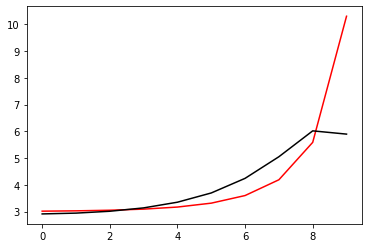

181500 0.03446408320072544
[2.77887893 2.81008332 2.87870447 2.99953404 3.19781251 3.51265056
 3.99772263 4.69954402 5.5408046  5.61213773]


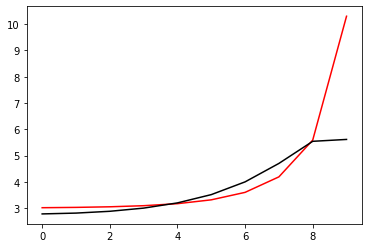

182600 0.013775211473313839
[2.94922379 2.96591329 3.02118728 3.12993224 3.31635985 3.61764152
 4.08396342 4.75817207 5.56723764 5.59225671]


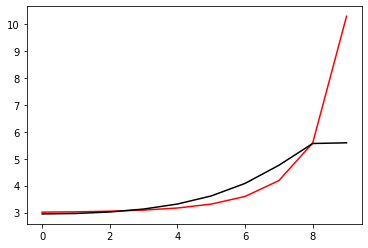

183700 0.011768457731622535
[2.96682468 2.98579209 3.04073075 3.14898291 3.33488625 3.63549606
 4.10213068 4.78353675 5.61520825 5.61932807]


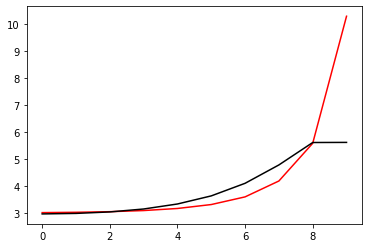

184800 0.021839791225878383
[2.97933447 3.00269299 3.0610301  3.17191905 3.36052775 3.66454276
 4.13790859 4.83870227 5.71478451 5.7082336 ]


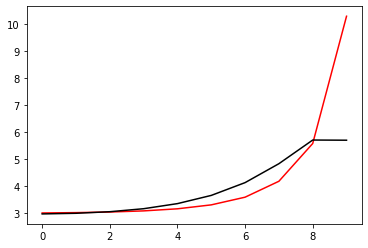

185900 0.012218805926110217
[2.93184814 2.95927001 3.02448112 3.14287159 3.34024225 3.65690277
 4.15376863 4.90628618 5.8810979  5.85582074]


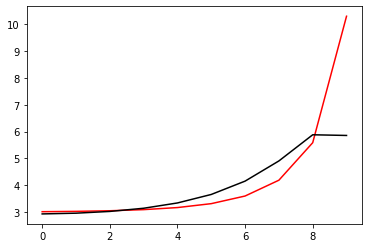

187000 0.03374217562590084
[2.88379204 2.90365583 2.96061791 3.06783391 3.24698609 3.53145988
 3.96894002 4.61405011 5.43766153 5.41355102]


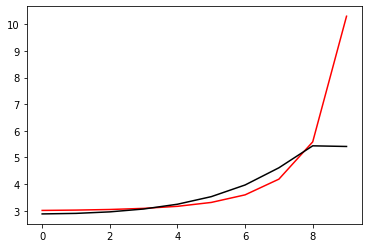

188100 0.04768051655354842
[2.88611491 2.90838595 2.96649463 3.07526105 3.25678201 3.54527455
 3.99070839 4.65211213 5.50268239 5.4899349 ]


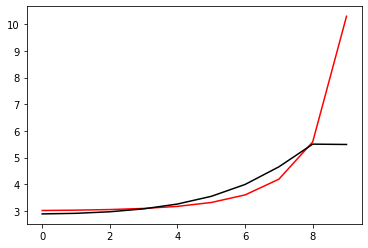

189200 0.013010008712581934
[2.94721631 2.96888436 3.02519368 3.13255569 3.31395703 3.60454766
 4.05671337 4.73448992 5.61547575 5.5903777 ]


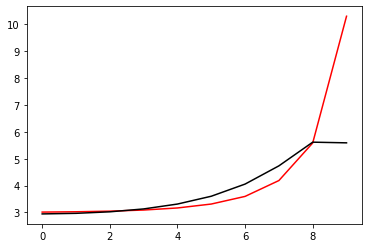

190300 0.022649293795245797
[2.88674027 2.9222742  2.99643458 3.12275995 3.32655563 3.64797358
 4.14885447 4.90750529 5.90047234 5.92726821]


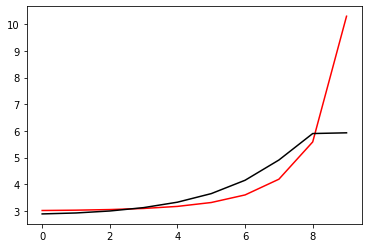

191400 0.05961962210380586
[2.69950473 2.72679958 2.79877342 2.92444472 3.12580193 3.4410837
 3.9292516  4.67124494 5.70034169 6.03580185]


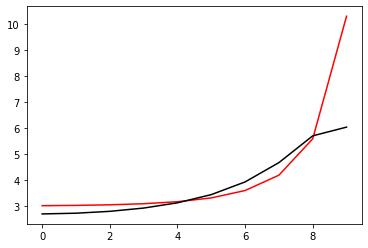

192500 0.021952215542181013
[2.99750446 3.01653522 3.07212151 3.179194   3.35790564 3.64161969
 4.08234253 4.75189277 5.6773781  5.68254464]


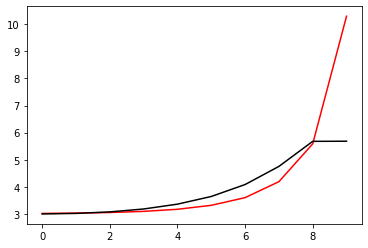

193600 0.011910916216831737
[2.98075597 3.00408405 3.0613209  3.16952712 3.35221903 3.64609264
 4.11045807 4.83179611 5.84376308 5.77936432]


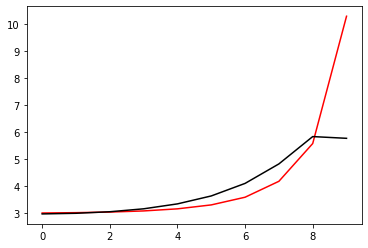

194700 0.011931726635774884
[2.99606115 3.01029648 3.05663471 3.15441145 3.32965417 3.62315059
 4.10151452 4.86873444 5.9900178  6.03220429]


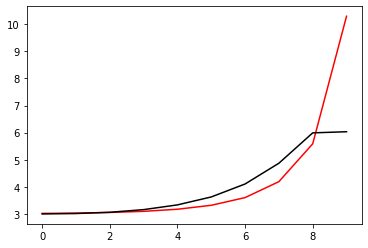

195800 0.022219220351062007
[2.98296399 3.00321201 3.05396759 3.15425154 3.33430909 3.6419624
 4.15532607 4.9978993  6.25379929 6.28040216]


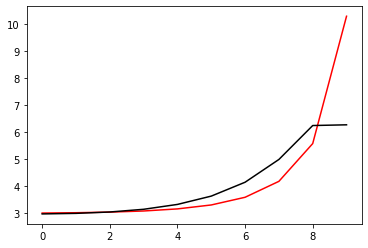

196900 0.012525055114050603
[2.93756336 2.96342854 3.02565109 3.14083778 3.33968711 3.67341243
 4.21675072 5.04659438 6.23524278 6.25032097]


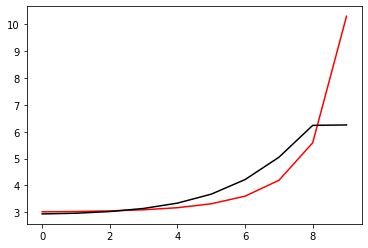

198000 0.03230387918032395
[2.88849621 2.90662375 2.95975379 3.06504603 3.25096619 3.56566952
 4.08228775 4.88480793 6.0044887  6.00642174]


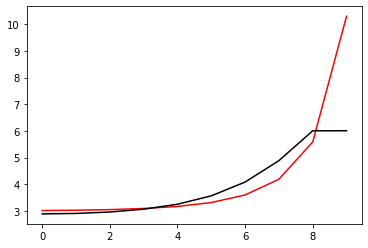

199100 0.03213298852988183
[3.02768416 3.04378434 3.09153355 3.19028355 3.36823203 3.67136936
 4.17041725 4.95416683 6.05949025 5.98333326]


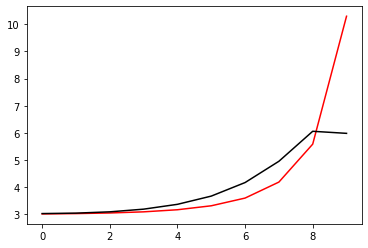

200200 0.01258374836950442
[2.84815611 2.86890256 2.92236291 3.02580984 3.20684541 3.51009089
 4.00625998 4.79364706 5.92219029 6.19272132]


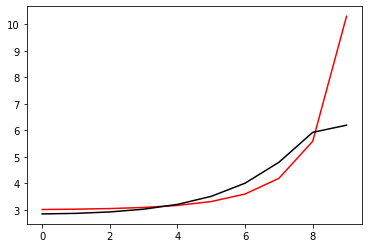

201300 0.022554726756190555
[2.90949769 2.93417911 2.99205713 3.09886727 3.28132309 3.58300811
 4.07409557 4.8570617  5.98942028 5.98656225]


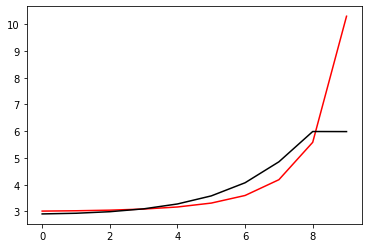

202400 0.01918325483926652
[2.98088166 3.0011738  3.05697494 3.16477883 3.35216889 3.66523603
 4.17973633 5.00376554 6.17788961 6.0113753 ]


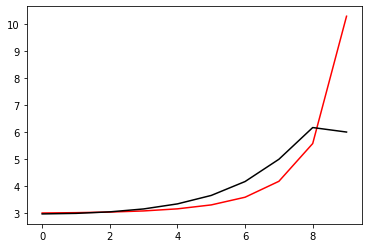

203500 0.021751638919267843
[2.93036161 2.93653478 2.97496329 3.06259885 3.22478539 3.50292508
 3.96607257 4.71973005 5.8322234  5.86963867]


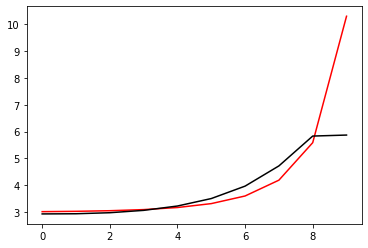

204600 0.0164623553627939
[2.95188679 2.96327172 3.00340597 3.09133877 3.25428561 3.53487265
 4.00365417 4.77228734 5.92737043 6.01723911]


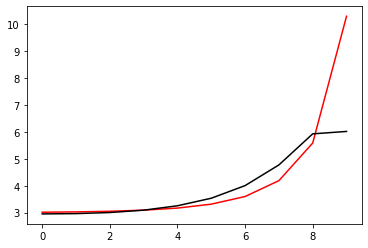

205700 0.16626807633335408
[2.67717893 2.7091847  2.76963026 2.87575155 3.05490244 3.35137501
 3.8397479  4.63987645 5.84484825 6.17960369]


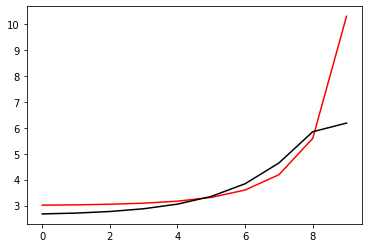

206800 0.01172110927104351
[2.83841539 2.8872695  2.9700515  3.09180497 3.27333672 3.54785286
 3.95926143 4.55189373 5.44332342 5.45766737]


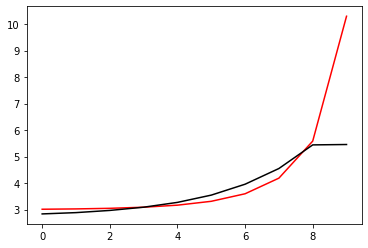

207900 0.012245476170037429
[2.83156229 2.88110603 2.97354846 3.11298575 3.3191375  3.62993505
 4.10691456 4.83529545 5.82690482 5.84275834]


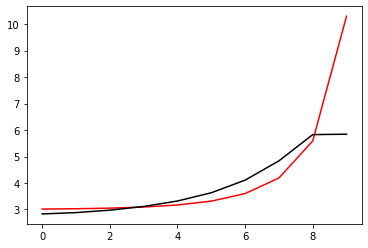

209000 0.07297573194592122
[2.73680339 2.76269645 2.83317485 2.95401431 3.14195627 3.4307069
 3.87356492 4.51288055 5.34302083 5.39308092]


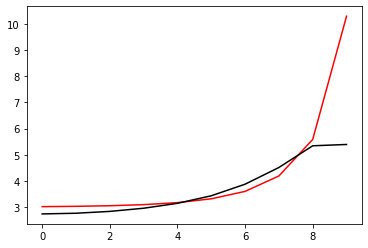

210100 0.0486686735773176
[2.8971011  2.91543559 2.97441443 3.0845876  3.26207357 3.53860892
 3.96487237 4.5851903  5.39334544 5.38621062]


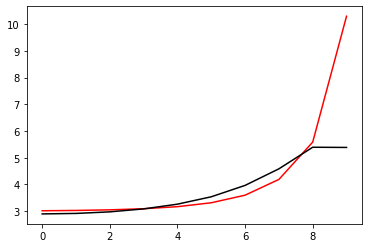

211200 0.01498391878040503
[2.929164   2.95097671 3.00959288 3.11942187 3.29861181 3.57898633
 4.01157516 4.64867236 5.48828903 5.46377297]


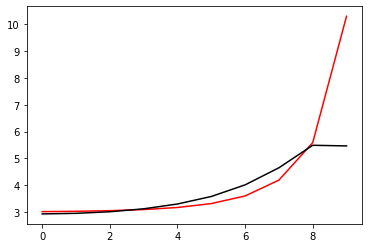

212300 0.026992802123817525
[2.94525106 2.97067133 3.0343243  3.14976417 3.33815267 3.63345249
 4.08945235 4.77068342 5.68294971 5.68707502]


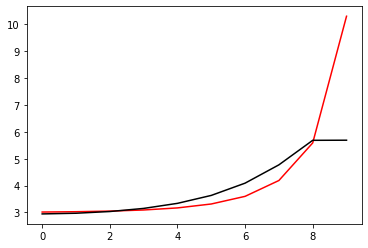

213400 0.018928490668600216
[2.92331691 2.95283867 3.02042431 3.14182024 3.34080307 3.65478755
 4.1427163  4.88325015 5.89217805 5.8500525 ]


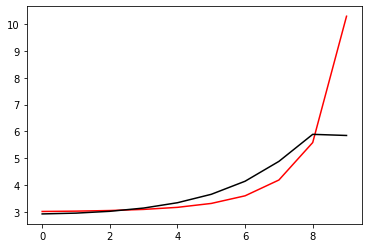

214500 0.02153406979414855
[2.99701811 3.00759537 3.0548254  3.15268766 3.32204749 3.59200132
 3.99164065 4.50206025 5.2908502  5.64889733]


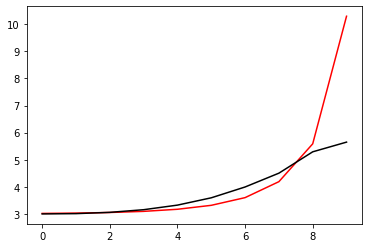

215600 0.011961745309648423
[2.98320606 3.00293434 3.05581266 3.15799049 3.33078146 3.60355361
 4.00790253 4.55015049 5.32525275 5.31203299]


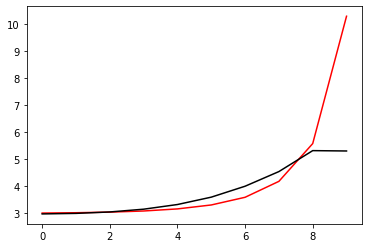

216700 0.011510622326460128
[2.98720359 3.00814037 3.06187806 3.16483468 3.33934561 3.61688047
 4.03944247 4.64971345 5.43153334 5.44529494]


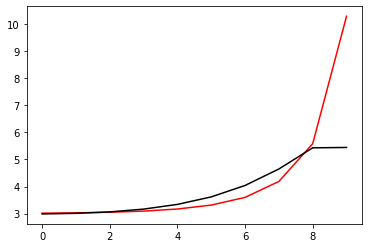

217800 0.021674575051235073
[2.99570996 3.01803426 3.0733886  3.17799537 3.35558841 3.64188943
 4.09286906 4.77637841 5.5948769  5.57568574]


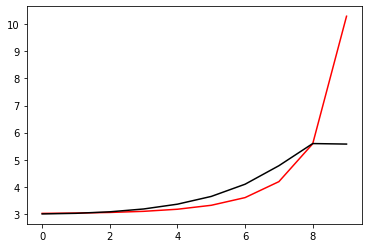

218900 0.012257175732798957
[2.9356294  2.96469019 3.02973774 3.14506094 3.33648069 3.64742164
 4.15118927 4.93934102 5.88046964 5.86704021]


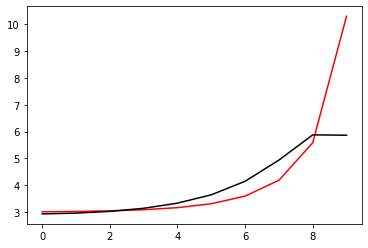

220000 0.031552725480917594
[2.95304314 2.98456304 3.05042203 3.16194145 3.34087434 3.62225932
 4.05366831 4.66235517 5.3823337  5.37870248]


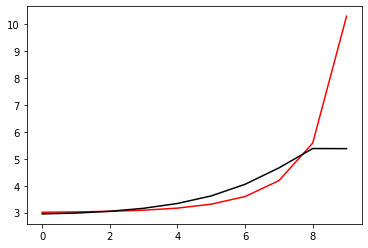

221100 0.04137021581796821
[2.96695729 2.99697928 3.0636204  3.17848824 3.36344101 3.65528254
 4.10897127 4.77801879 5.55291077 5.51197377]


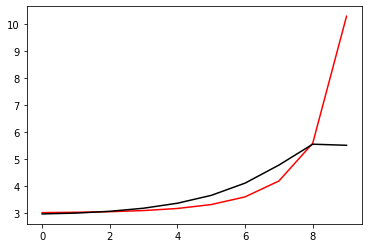

222200 0.01212951220152171
[2.96299475 2.99136095 3.05757809 3.17528789 3.36750144 3.67393996
 4.15934852 4.90082321 5.78911045 5.8160192 ]


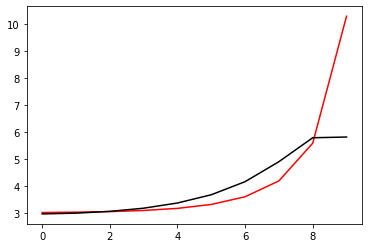

223300 0.12196974259137065
[2.70394652 2.73790362 2.80816373 2.92838242 3.12099533 3.4240255
 3.89766857 4.60225222 5.45639114 5.80327163]


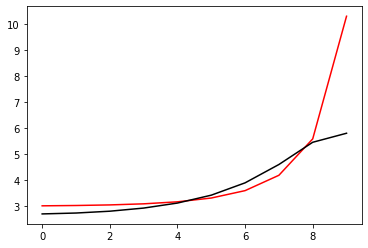

224400 0.01657102767769321
[2.90617635 2.92526353 2.98126271 3.08860737 3.2689999  3.55837937
 4.01199692 4.68410542 5.49830533 5.47685047]


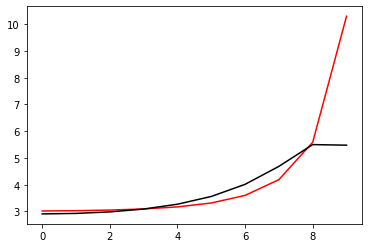

225500 0.02183353614147522
[2.89983487 2.92402539 2.98465616 3.0973314  3.28532106 3.58638408
 4.05882878 4.76444964 5.6319604  5.64023469]


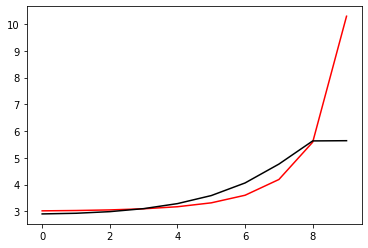

226600 0.020971037677401043
[2.88551381 2.91820013 2.98840457 3.10917137 3.30441875 3.61252685
 4.09217528 4.81225275 5.72670164 5.80514457]


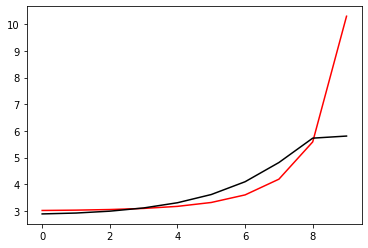

227700 0.012218215777475408
[2.93364192 2.96837405 3.04401606 3.17309444 3.37934028 3.7027668
 4.20551927 4.96310021 5.93740142 5.96485163]


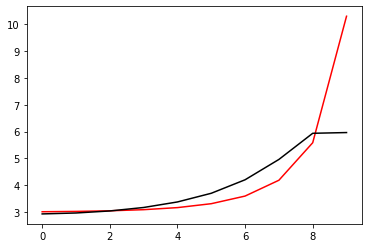

228800 0.02161719920515608
[2.96511309 3.00076785 3.07522437 3.19909549 3.39152582 3.68168709
 4.10108329 4.64748749 5.36517718 5.37622662]


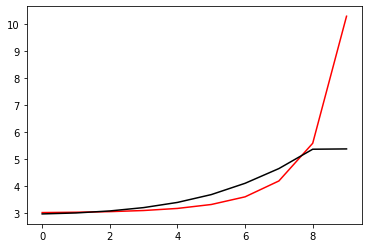

229900 0.013161762328013655
[2.94738273 2.9837743  3.06037882 3.18765094 3.38526821 3.68433383
 4.12538842 4.74126971 5.49350503 5.47398921]


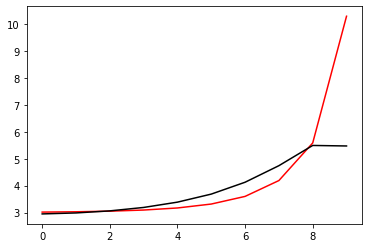

231000 0.03181375461219975
[2.88804391 2.92534059 3.00311323 3.12981359 3.32303319 3.61051378
 4.0283093  4.61003525 5.36729402 5.27218926]


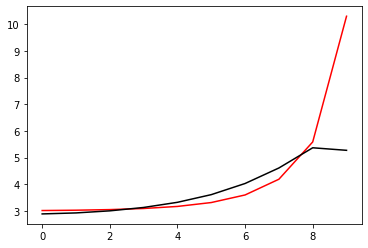

232100 0.04887258384148863
[2.85796457 2.90262787 2.99089473 3.13208692 3.34568012 3.664697
 4.13944777 4.82722806 5.69105631 5.69240273]


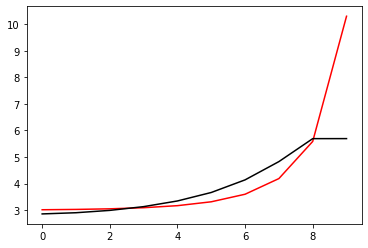

233200 0.019917930175032364
[2.80223469 2.84138905 2.9243664  3.05988782 3.26494622 3.56853199
 4.01507323 4.66780639 5.56459379 5.81776556]


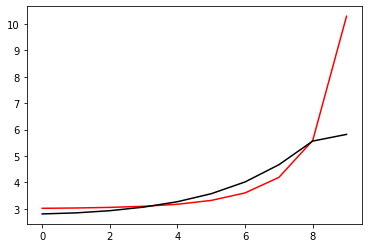

234300 0.02889075679501956
[2.94683827 2.97900413 3.05191173 3.17682903 3.37116247 3.66376427
 4.10187984 4.75612454 5.65159782 5.61426542]


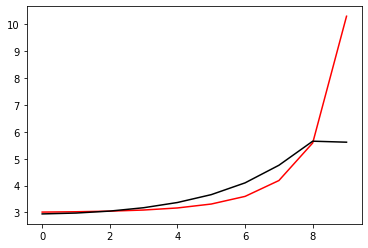

235400 0.01205609958700434
[2.83766643 2.86239899 2.9280501  3.0517909  3.25917399 3.59446707
 4.13748284 5.00540478 6.16376489 6.11545731]


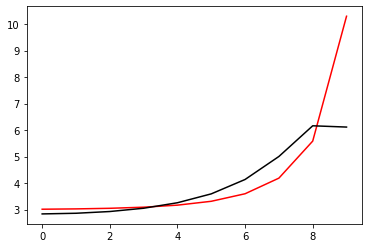

236500 0.02154125084236136
[2.91024678 2.92102529 2.96475745 3.0604721  3.2318506  3.51682464
 3.97453563 4.6376764  5.43433723 5.43169586]


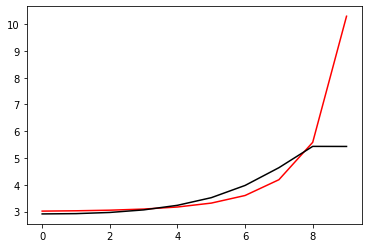

237600 0.1601232408963019
[3.10171176 3.11588491 3.16168222 3.25692669 3.42539985 3.70126645
 4.13010774 4.74404835 5.50444187 5.61852363]


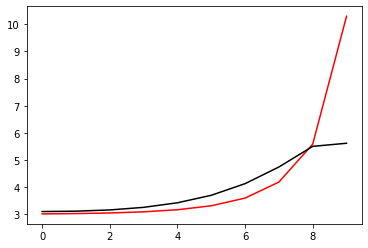

238700 0.014721443449315585
[2.98298217 2.97972635 3.00430456 3.07676101 3.21938091 3.46356876
 3.85180001 4.41865108 5.13374295 5.10950461]


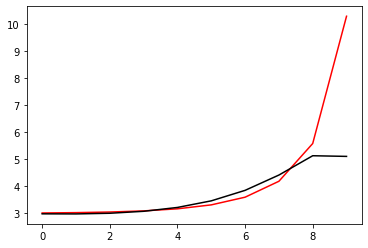

239800 0.021169372826790597
[2.99581139 3.00359099 3.03546017 3.11303598 3.26040171 3.51014142
 3.9068098  4.49278649 5.24414315 5.25808832]


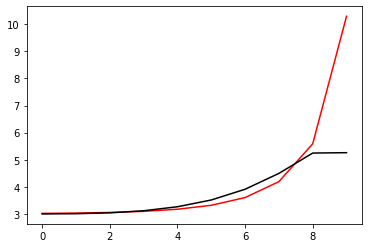

240900 0.011701678066994726
[2.97774148 2.98899301 3.02486738 3.10489228 3.25526761 3.51185642
 3.9246672  4.54981847 5.37644211 5.36897981]


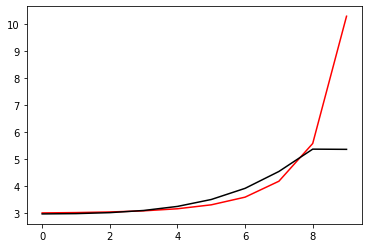

242000 0.031609054831670966
[2.94236939 2.95805025 3.00044071 3.08654108 3.24298136 3.50942924
 3.94415946 4.6220708  5.55222276 5.58337464]


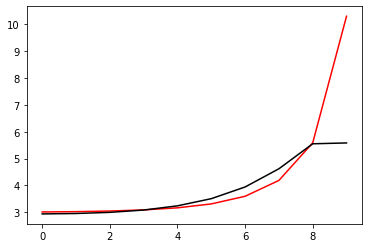

243100 0.04978963640921484
[2.95576362 2.99330538 3.05696459 3.16032691 3.32673752 3.59070902
 3.99792077 4.58348157 5.32301984 5.30132688]


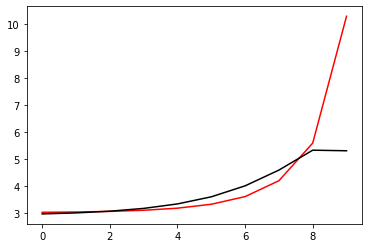

244200 0.01209496052230474
[2.96706854 2.9968837  3.06027045 3.16734153 3.34023751 3.61619645
 4.05287276 4.7283245  5.60839359 5.58609812]


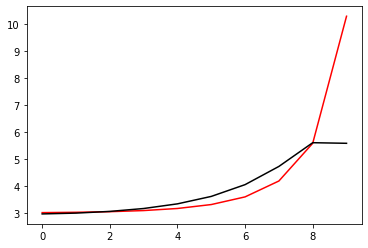

245300 0.0230506266861416
[2.88633547 2.91469869 2.9800992  3.09494711 3.28194628 3.58252858
 4.0710038  4.86897942 5.96756117 5.89804959]


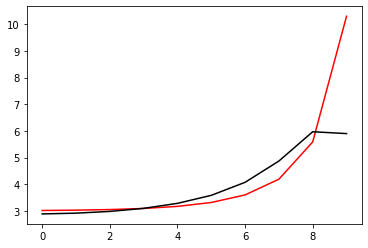

246400 0.014611675733557912
[2.90112593 2.91967979 2.97091282 3.07003246 3.23870387 3.51439135
 3.96151334 4.67069321 5.65699951 5.62254896]


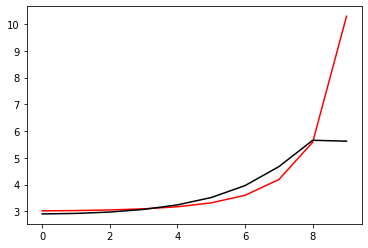

247500 0.021940197472086805
[2.93799917 2.96172302 3.01942807 3.12615346 3.30600904 3.59949197
 4.07530874 4.83382529 5.89728109 5.9196763 ]


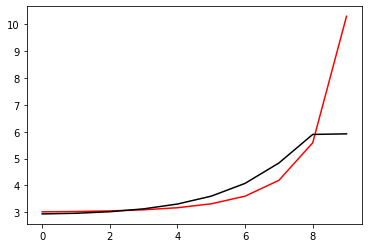

248600 0.0133450170957113
[2.99849629 3.0186148  3.07465638 3.18410948 3.37385304 3.68911706
 4.20607832 5.03633923 6.21136047 6.11568606]


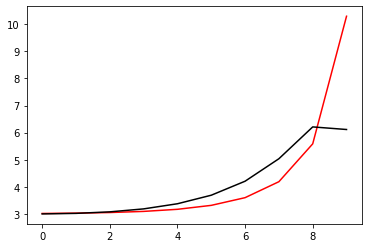

249700 0.012888668590135571
[2.92312331 2.93980644 2.99313557 3.09658321 3.27371812 3.56331984
 4.02525209 4.73288141 5.75016138 5.73022088]


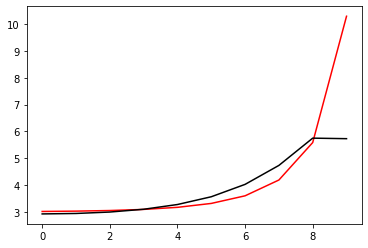

250800 0.0216746519448671
[2.95593003 2.97559073 3.02958323 3.13431664 3.3139726  3.6078734
 4.07748975 4.80333668 5.84848988 5.8555973 ]


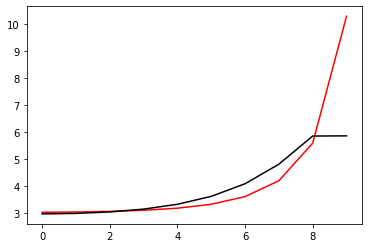

251900 0.012219024864736378
[2.9526222  2.97572346 3.03271914 3.14006113 3.32289593 3.62120434
 4.09845292 4.84412722 5.92212483 5.91750938]


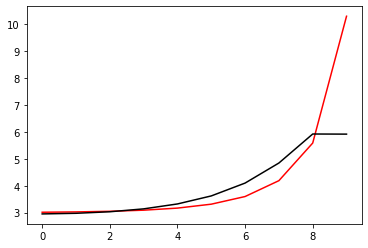

253000 0.03173592294920022
[2.95352221 2.97707334 3.03348984 3.13604863 3.30790334 3.5869228
 4.0349661  4.74718771 5.79585121 5.81606275]


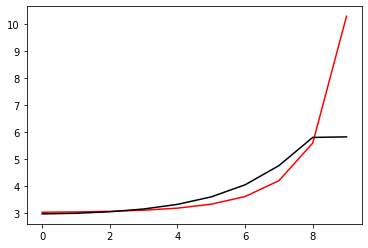

254100 0.03816791674332483
[2.96697971 2.9942205  3.05640155 3.16797838 3.35248818 3.64984067
 4.12710466 4.88891953 6.00620724 5.91377608]


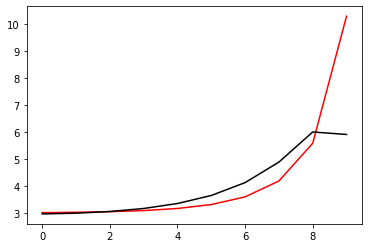

255200 0.012078759855778515
[2.95275483 2.99207765 3.06680887 3.19151222 3.38971799 3.69649031
 4.14571365 4.68350894 5.58469045 5.63505971]


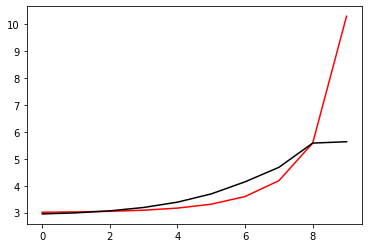

256300 0.0257793330513692
[2.97990085 3.01872261 3.09629342 3.22520379 3.42949268 3.74614821
 4.22030762 4.87207218 5.70705327 5.67056729]


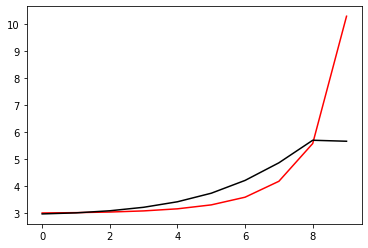

257400 0.016211077942294733
[2.87757619 2.91942126 3.00224809 3.13708716 3.34714972 3.67027094
 4.16329991 4.904527   5.81775581 5.74869216]


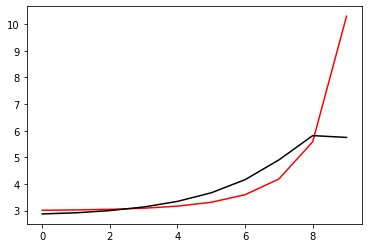

258500 0.06612654126879314
[2.71018912 2.75302996 2.83848774 2.97600346 3.18685846 3.50817868
 3.99961474 4.73849263 5.67053116 5.74442661]


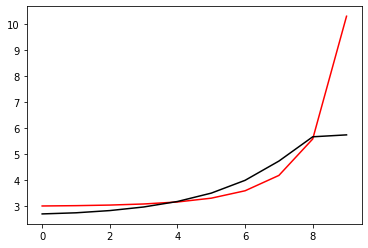

259600 0.012189686513878528
[2.94342795 2.97479361 3.04750976 3.17379918 3.37416818 3.68393325
 4.15969299 4.87413904 5.78871284 5.78480572]


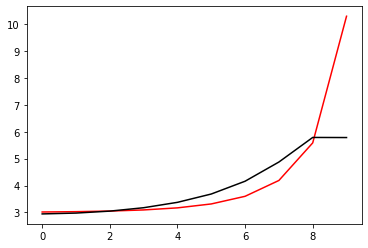

260700 0.011782502512661167
[2.95274506 2.98591068 3.0576314  3.17868003 3.36775629 3.65569505
 4.09192139 4.74647044 5.62530671 5.63304263]


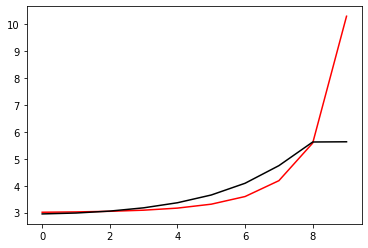

261800 0.02197846180074864
[2.94822353 2.9794773  3.05029897 3.17312105 3.3686714  3.67217953
 4.14293754 4.86997215 5.86884505 5.88545547]


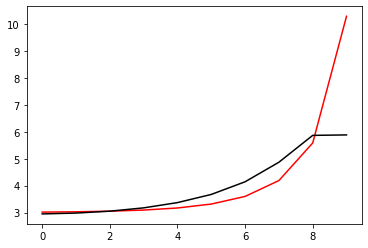

262900 0.01235218432617892
[2.91740437 2.95481742 3.03531643 3.16805628 3.37323009 3.68634342
 4.1681913  4.91373733 5.96692541 5.93148891]


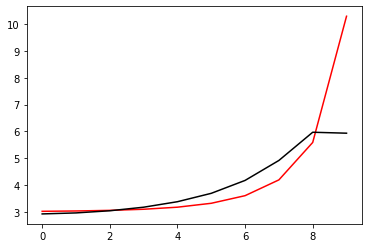

264000 0.031981121061977986
[2.9255727  2.96163848 3.04022429 3.16989916 3.36830311 3.667593
 4.12360583 4.82667608 5.83863014 5.85363069]


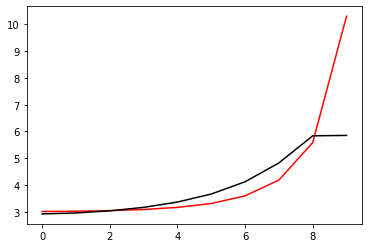

265100 0.07575372469443961
[3.00398919 3.05154187 3.14378318 3.28885318 3.5043878  3.82316576
 4.30270128 5.03488699 6.07620834 5.90341521]


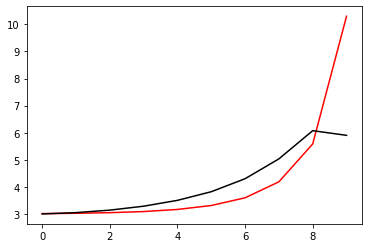

266200 0.01782778819863561
[2.86309095 2.9077076  2.99524835 3.13161819 3.33105861 3.61946147
 4.03962657 4.6557034  5.52256067 5.49656555]


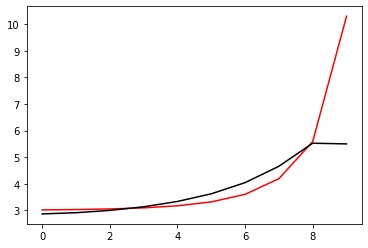

267300 0.03096475563033531
[2.83216731 2.87746382 2.96728051 3.10806211 3.31527051 3.6180595
 4.06786096 4.74394779 5.67037433 5.67446249]


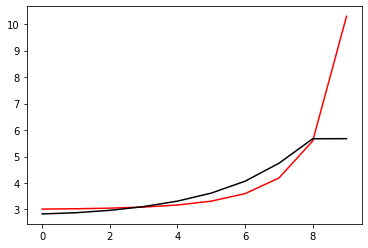

268400 0.019278880822091893
[2.93954144 2.97535942 3.05881526 3.19716128 3.40757845 3.72312451
 4.20244918 4.92361791 5.85823771 5.71847955]


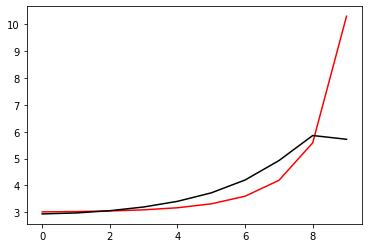

269500 0.022054634596659586
[2.88937038 2.92181054 2.99787373 3.12872901 3.3320658  3.6401379
 4.11034145 4.82546008 5.78712602 5.77571949]


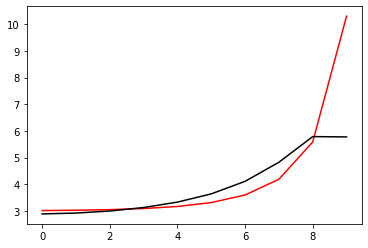

270600 0.013349543560035291
[2.91079777 2.94612156 3.02541607 3.15910965 3.36655745 3.68102443
 4.15947539 4.88758381 5.89224137 5.9735689 ]


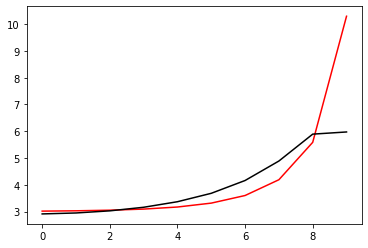

271700 0.01263713729020824
[2.95086553 2.98832726 3.07061059 3.21126374 3.43307149 3.77499578
 4.3023299  5.10802853 6.20540958 6.22935902]


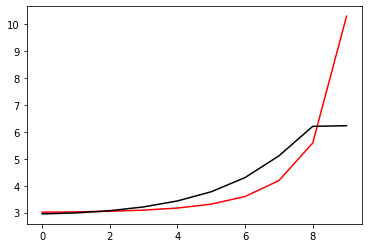

272800 0.07486776813491763
[2.70190486 2.71920849 2.78227569 2.90826577 3.12357939 3.47088286
 4.01404001 4.82560841 5.94870408 6.0601416 ]


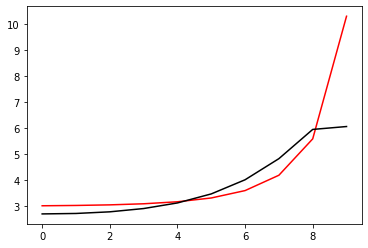

273900 0.012081981487568123
[2.95149494 2.95958708 3.00228622 3.10423812 3.29209241 3.60579592
 4.10653653 4.87225662 5.94822053 5.95384223]


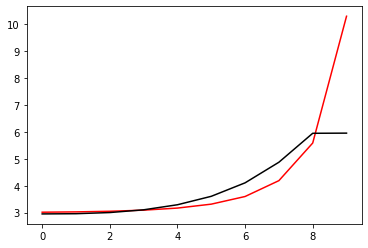

275000 0.07222389389420147
[2.78964705 2.78804647 2.81816639 2.90314971 3.07040034 3.35795281
 3.82290325 4.54252649 5.56334326 5.55718621]


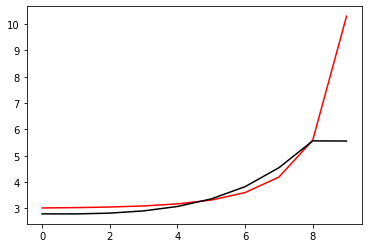

276100 0.049687008412170046
[2.9571342  2.95111638 2.9720123  3.04594724 3.20026631 3.47210859
 3.91698542 4.61140133 5.60083249 5.59668943]


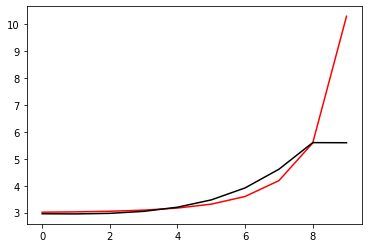

277200 0.013802362367275259
[2.97221629 2.97731411 3.00608127 3.08464473 3.24262186 3.51927376
 3.97286298 4.68526827 5.70524677 5.67973669]


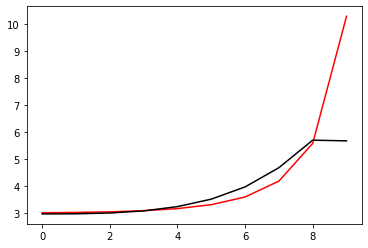

278300 0.02257055827464432
[2.92038485 2.93693869 2.97992405 3.07066063 3.24035758 3.53257954
 4.01198047 4.77097387 5.86482878 5.90467339]


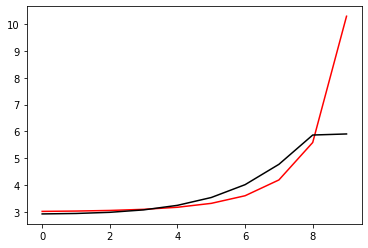

279400 0.012434679142105717
[2.8706826  2.89316124 2.94576268 3.0434028  3.21296963 3.49586174
 3.95469065 4.68548643 5.7755564  5.8601148 ]


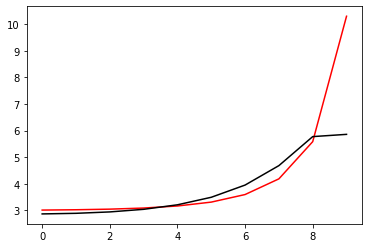

280500 0.0585769093339851
[2.75567264 2.78387357 2.84350881 2.94821787 3.12248582 3.40638805
 3.86546985 4.60630423 5.71940154 5.69257982]


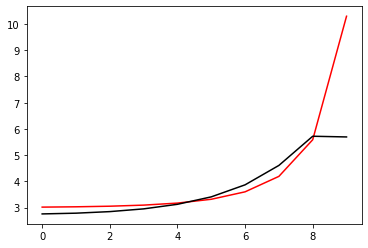

281600 0.0985797994670012
[3.08036835 3.10415176 3.15829351 3.25360825 3.40936643 3.65550542
 4.03438614 4.59841271 5.41350136 5.5193244 ]


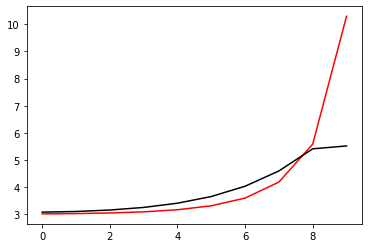

282700 0.019278512780570797
[2.91296983 2.93696598 2.98984201 3.08370862 3.23713716 3.47935123
 3.85485496 4.42905596 5.2857881  5.25184997]


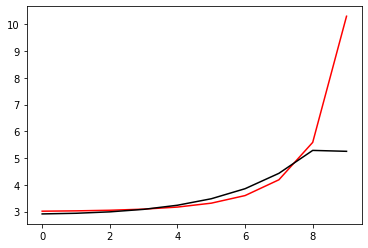

283800 0.02152537906544479
[2.99345382 3.02436134 3.08817933 3.19465454 3.36253365 3.62271262
 4.02456231 4.64289677 5.54670185 5.56038905]


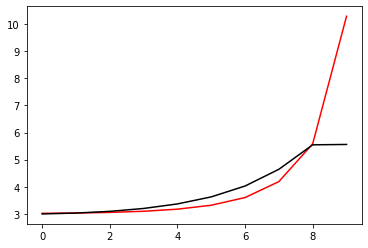

284900 0.011861798737265542
[2.92348891 2.9519616  3.01529293 3.12572258 3.30426744 3.58628289
 4.03149109 4.73469266 5.76661069 5.77857485]


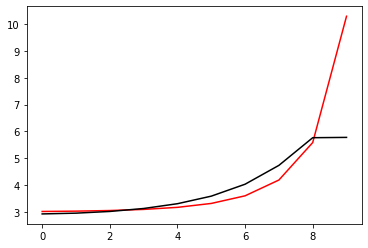

286000 0.03216344020137811
[2.89552372 2.91813219 2.97771823 3.089673   3.27742081 3.58142558
 4.07205501 4.86313287 6.02944693 6.08303948]


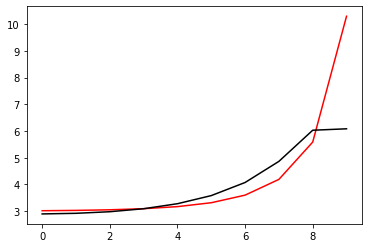

287100 0.04608806181283145
[2.87238884 2.89450749 2.94465075 3.04318535 3.21586269 3.50292778
 3.96815056 4.13655914 5.3692435  5.38556583]


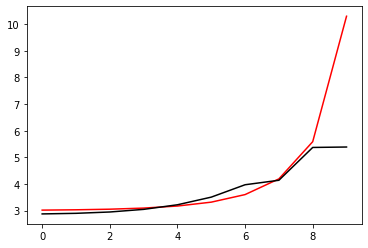

288200 0.018982431145982654
[2.91667154 2.93745066 2.98773177 3.08628391 3.25932305 3.54685792
 3.99515104 4.21662171 5.40980907 5.40051656]


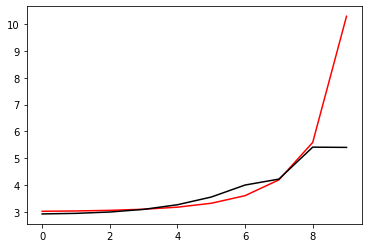

289300 0.023536740270707433
[2.92735614 2.95017045 3.00395245 3.10638709 3.28438621 3.57752594
 4.01661255 4.33527786 5.50064488 5.49085566]


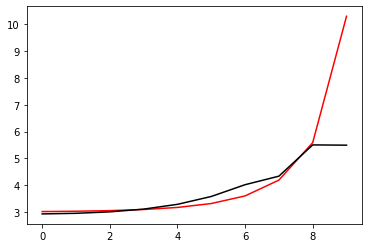

290400 0.014951242687924983
[2.88717711 2.91449253 2.97551116 3.08621687 3.27343745 3.57520637
 4.01669547 4.47300187 5.62642534 5.5962018 ]


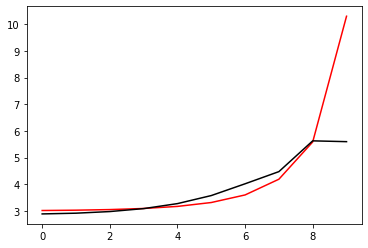

291500 0.021840215944101554
[2.9268544  2.94705218 3.00682956 3.12005816 3.31138442 3.61632129
 4.06806217 4.66136142 5.80061501 5.877769  ]


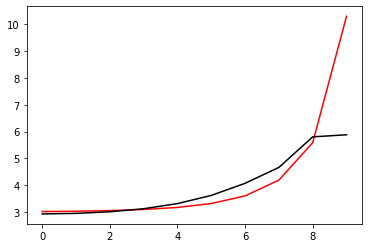

292600 0.02172990916256934
[2.94985109 2.96274625 3.01034238 3.10321094 3.25853575 3.49845094
 3.83831627 4.2740863  5.10401755 5.13233509]


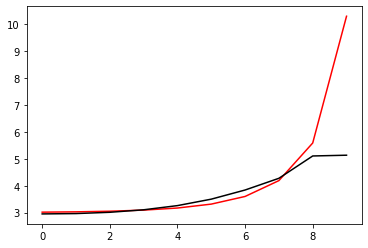

293700 0.011567224458780322
[2.98227695 2.99872153 3.04712145 3.14098728 3.29771434 3.5398549
 3.88675563 4.3479345  5.18288128 5.17174951]


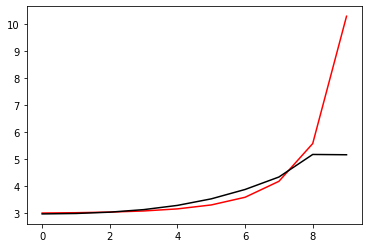

294800 0.021182639247673878
[2.99886054 3.01764516 3.0665321  3.16022064 3.31716132 3.56125842
 3.91863938 4.41866442 5.27132057 5.27164039]


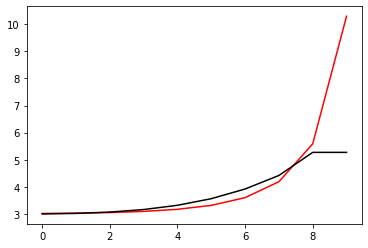

295900 0.011564829221787521
[2.95289596 2.97119595 3.02019103 3.11497954 3.27648192 3.53373331
 3.92672531 4.51400543 5.44933802 5.41774517]


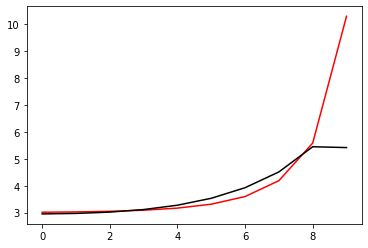

297000 0.03164453604249106
[2.93244311 2.95209956 3.0026248  3.09880252 3.26291057 3.52889841
 3.94986546 4.61011293 5.61875479 5.65581202]


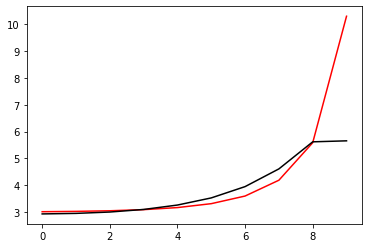

298100 0.043164588894481215
[2.8299988  2.85991136 2.92005497 3.02313737 3.19092338 3.45715114
 3.86703064 4.28917024 4.96884533 4.98997547]


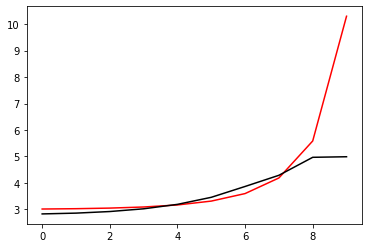

299200 0.018606298411611873
[2.91811227 2.94580299 3.00509611 3.10805089 3.27595655 3.54186721
 3.94529477 4.3832647  5.05951333 5.04881763]


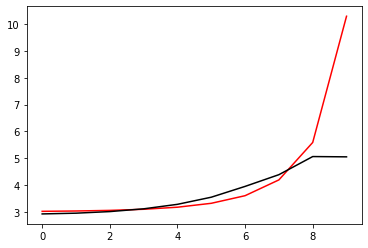

300300 0.02631602629314549
[2.93987191 2.9679414  3.02947654 3.13619141 3.30919491 3.58134553
 3.98894534 4.47038926 5.17669294 5.17373566]


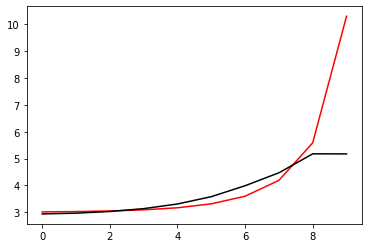

301400 0.020513919201789025
[2.93511576 2.96159589 3.02291524 3.13160519 3.30860497 3.58631352
 4.00174728 4.54272566 5.30208762 5.2537316 ]


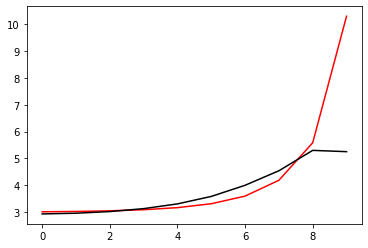

302500 0.02164841501021634
[2.92471579 2.95034435 3.01112131 3.12162901 3.30399059 3.59174318
 4.02944154 4.65295901 5.50682409 5.54818826]


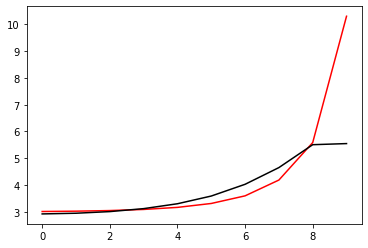

303600 0.015480798928838298
[2.90709125 2.94378658 3.02183588 3.15087158 3.35090779 3.65497352
 4.11092282 4.77337549 5.66183427 5.62960327]


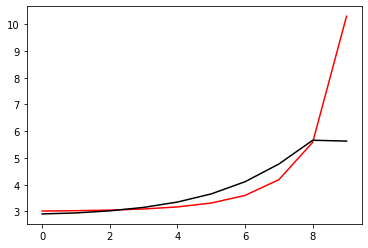

304700 0.012198980347623827
[2.95434027 2.98721472 3.06395085 3.19724858 3.40728353 3.72845504
 4.21591467 4.94642666 5.93898485 5.96602004]


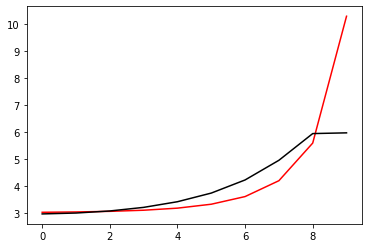

305800 0.018183956736292802
[2.82971559 2.84748825 2.90455266 3.01738259 3.2092102  3.51694435
 3.9987698  4.72501559 5.68534815 5.71771853]


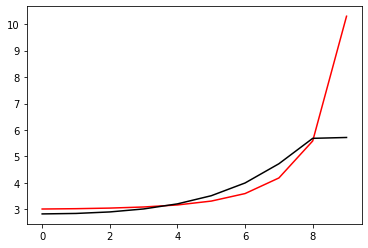

306900 0.011857505387358863
[2.91014501 2.92349467 2.9750489  3.08271053 3.26968112 3.57237222
 4.04790882 4.76639937 5.71924148 5.72122561]


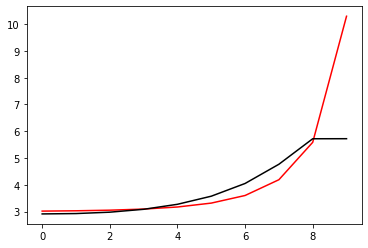

308000 0.03206259341473965
[2.8968718  2.91658538 2.97195411 3.08261751 3.2730425  3.5806616
 4.06411232 4.79781454 5.77797159 5.77727145]


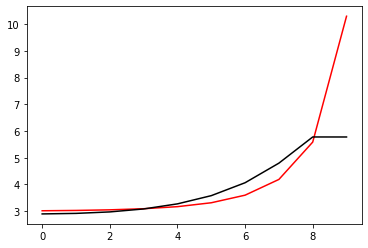

309100 0.044490527083484124
[2.85119698 2.87880456 2.9420722  3.06028395 3.26043642 3.58317618
 4.09206086 4.87090561 5.92240744 5.95694163]


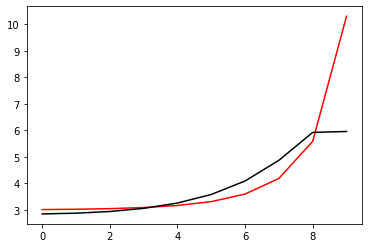

310200 0.03474363090244145
[2.79298796 2.81637582 2.87463817 2.98609207 3.17730224 3.48862971
 3.98315237 4.74905998 5.80761538 6.14202356]


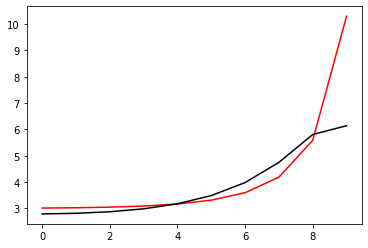

311300 0.02263058916599508
[2.89649716 2.92492623 2.99046118 3.10942891 3.30916132 3.63218534
 4.14549112 4.94488565 6.0622795  6.09090597]


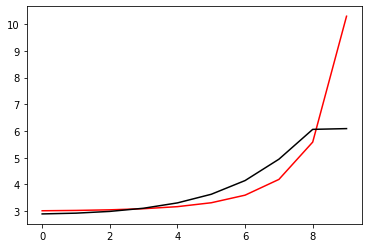

312400 0.011539024904778806
[2.84178967 2.86770973 2.9365364  3.06610478 3.28552278 3.64370428
 4.22092137 5.13267977 6.41018229 6.31723377]


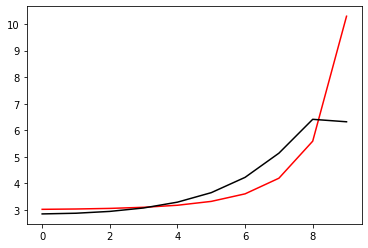

313500 0.023208569737222975
[2.99346772 3.02600701 3.09814975 3.22474192 3.43009788 3.75022148
 4.21426456 4.65521134 5.63723228 5.88828055]


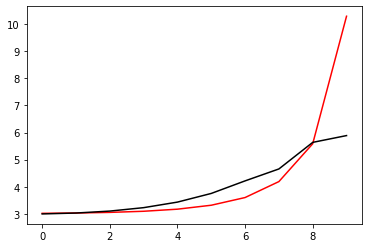

314600 0.012087258482442704
[2.96881411 3.00635741 3.08365608 3.2150619  3.4251284  3.74992514
 4.21972656 4.76869562 5.6955051  5.70275223]


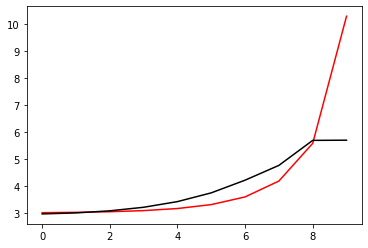

315700 0.012131942307524698
[2.9202903  2.96252595 3.04591113 3.18293519 3.39766277 3.72536982
 4.20195813 4.84716493 5.76705502 5.7713322 ]


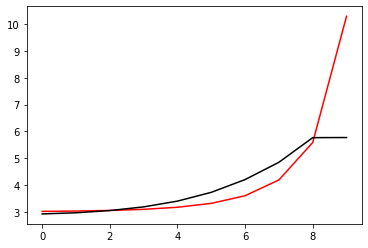

316800 0.02109002422092717
[2.90419324 2.94813412 3.03607214 3.17834345 3.3974246  3.72816421
 4.21574415 4.91767426 5.83825391 5.83642041]


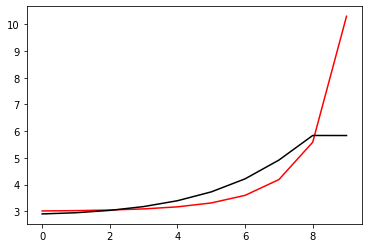

317900 0.01236587447437221
[2.94070441 2.96987376 3.04300562 3.16918502 3.36699059 3.667221
 4.11612419 4.7697928  5.59367618 5.60548885]


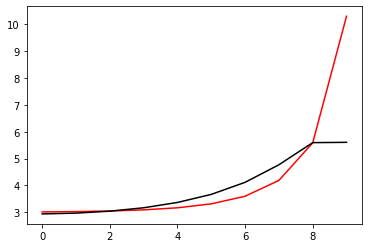

319000 0.031980434640028574
[2.9210823  2.95926953 3.04077677 3.17546399 3.3819039  3.69131794
 4.15269778 4.82997431 5.70560996 5.71501261]


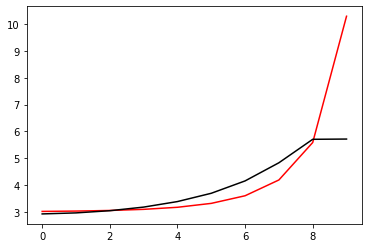

320100 0.030510360578520877
[2.97517766 3.02111183 3.11187039 3.25618823 3.47184944 3.78997165
 4.26051    4.95057023 5.85488474 5.72906373]


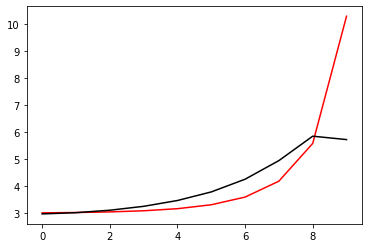

321200 0.012141886181556545
[2.95902188 3.00085194 3.08710909 3.22578167 3.43269086 3.73629491
 4.18427912 4.84651978 5.74045747 5.76816246]


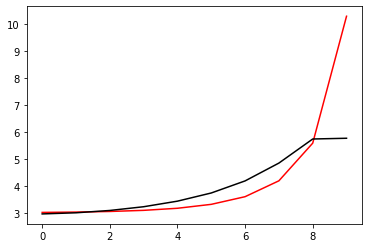

322300 0.02339659128082554
[2.89999971 2.93229363 3.0087207  3.13595448 3.32593829 3.59932108
 3.98700767 4.52794577 5.23982517 5.22063553]


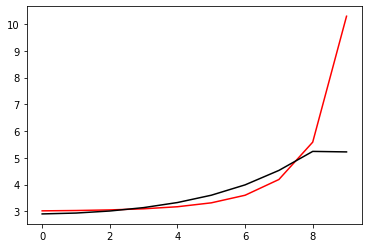

323400 0.01838836417001923
[2.8920174  2.92669308 3.00493465 3.13526643 3.33117365 3.61584913
 4.02612606 4.60856547 5.35914024 5.34662932]


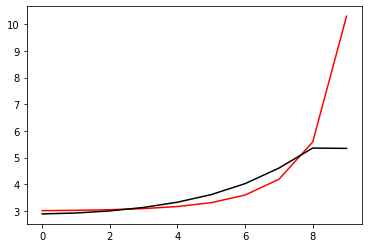

324500 0.021808769945050616
[2.90877623 2.94254529 3.01994932 3.15088902 3.3508432  3.64602424
 4.07943118 4.70620009 5.50457291 5.51697615]


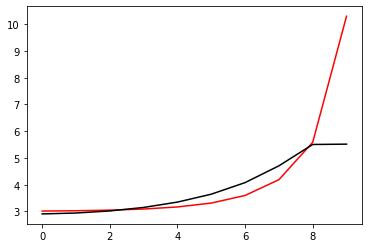

325600 0.012108882712104193
[2.94924844 2.98296215 3.05977758 3.1926383  3.40086674 3.71624204
 4.19095788 4.89011444 5.76826581 5.70293062]


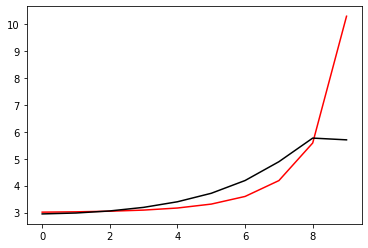

326700 0.013954207428565473
[2.91785294 2.93992458 3.00075375 3.11350905 3.29638459 3.57651354
 3.99039101 4.56677554 5.31618954 5.52640357]


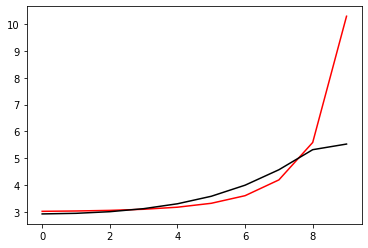

327800 0.011969796284509908
[2.88588221 2.91852794 2.98832197 3.10945897 3.30174932 3.59525083
 4.03479064 4.67179852 5.47208396 5.4641528 ]


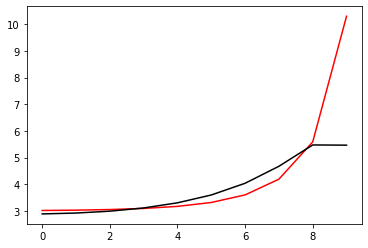

328900 0.012173181987667554
[2.93701101 2.96454121 3.03112053 3.15105171 3.34629381 3.65181313
 4.12398515 4.83659948 5.719963   5.68197256]


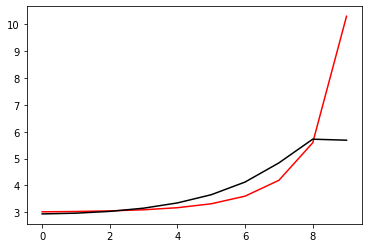

330000 0.03231211120997715
[2.85659286 2.89740576 2.97963481 3.11393428 3.32251043 3.64254006
 4.13466358 4.88339547 5.86479998 5.83756201]


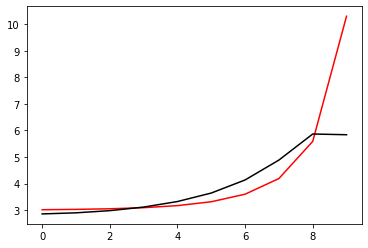

331100 0.6578453111179122
[3.11532815 3.15698005 3.24026856 3.38197339 3.60825719 3.96265436
 4.51529517 5.35446758 6.44371388 6.14611156]


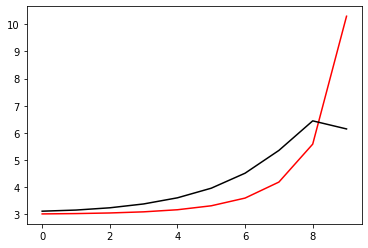

332200 0.03249677215451704
[2.78141637 2.81679863 2.89338577 3.02838964 3.24855773 3.59792616
 4.1479854  4.99458137 6.12538788 6.0602902 ]


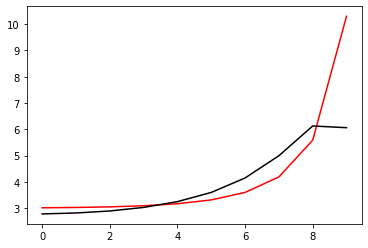

333300 0.031657165357448766
[2.85249177 2.88048795 2.94266416 3.05556368 3.24205808 3.53719917
 3.99575623 4.69746135 5.66672279 5.98228805]


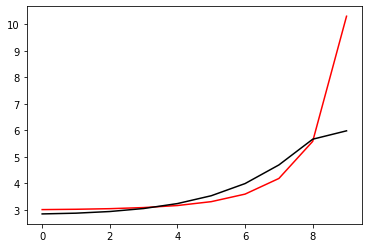

334400 0.01530721559582367
[2.89103469 2.91897067 2.98220164 3.09634811 3.2846755  3.58282693
 4.04630679 4.75363432 5.72414299 5.70846582]


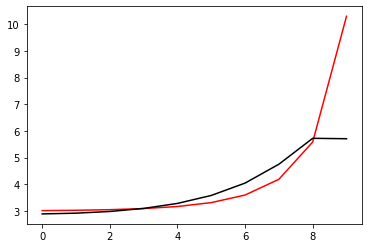

335500 0.021978982764467244
[2.88446449 2.91363486 2.97949343 3.09689648 3.28983106 3.59584801
 4.07429321 4.8084451  5.81180862 5.82073382]


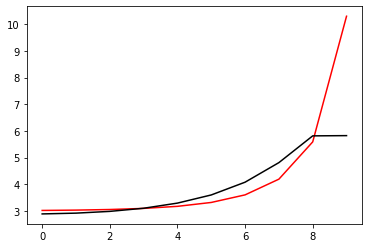

336600 0.012041707178991825
[2.97181498 2.99301434 3.05237584 3.1649569  3.3549837  3.66123787
 4.14487952 4.89027185 5.90971838 5.8994143 ]


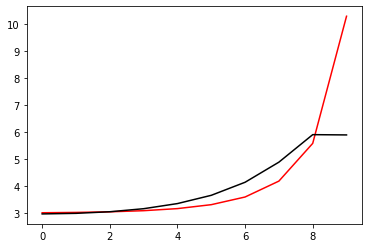

337700 0.012143906278432638
[2.9684074  2.99777005 3.06365701 3.18190808 3.37758089 3.69071017
 4.18526545 4.95130081 6.007899   6.01873616]


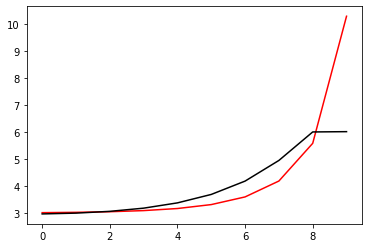

338800 0.016141439508831495
[2.81637925 2.84991323 2.91994869 3.04249608 3.24262515 3.56151485
 4.06689095 4.85928876 5.97725294 5.95359938]


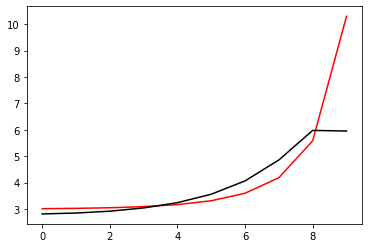

339900 0.011973345438002414
[2.8626935  2.89788265 2.96928379 3.08905951 3.27918302 3.5755438
 4.03695648 4.75457106 5.79012188 5.82431109]


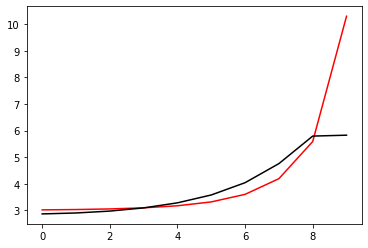

341000 0.032032020175751616
[2.93580956 2.96614144 3.03549597 3.15594954 3.34949939 3.65389441
 4.13222255 4.8836762  5.97114916 5.99501861]


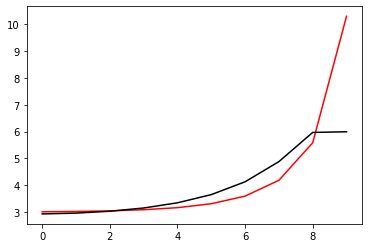

342100 0.04935161110711387
[2.8997491  2.92458006 2.98768599 3.09979568 3.27935252 3.55722419
 3.98182597 4.62146746 5.51695017 5.5125748 ]


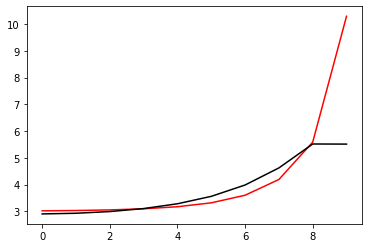

343200 0.018558405420991
[2.87439462 2.90480409 2.97281858 3.09067395 3.27801914 3.56777416
 4.01288441 4.68772608 5.62216262 5.60235295]


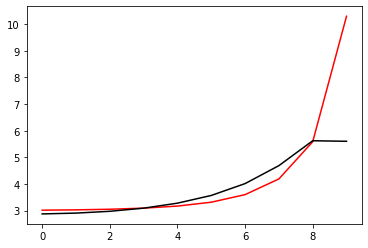

344300 0.02265213866105588
[2.90152516 2.93093533 2.99842231 3.11717205 3.3082447  3.60665901
 4.06965095 4.77797927 5.75329879 5.76375613]


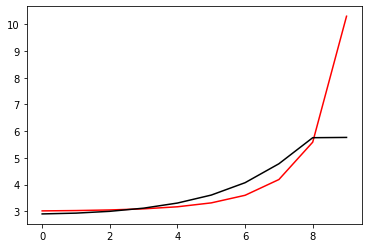

345400 0.012079549290383568
[2.84030393 2.87291466 2.94711882 3.076431   3.28438856 3.61142412
 4.12567456 4.92321089 6.00752812 5.91959018]


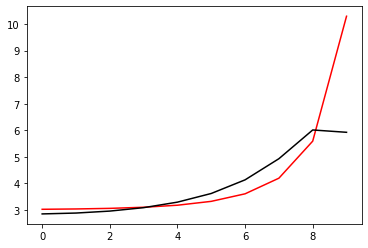

346500 0.022553593460627314
[2.88599748 2.91847698 2.99438652 3.12804202 3.34407991 3.68567963
 4.2258741  5.06532604 6.1971773  6.28498647]


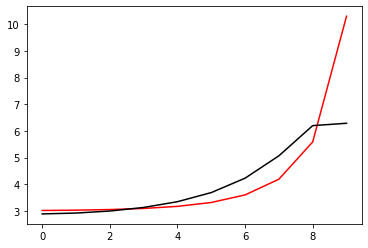

347600 0.014343515820426294
[2.89078614 2.9283912  3.00876661 3.14482685 3.36035076 3.69612801
 4.21887139 5.018754   6.0984918  6.08018103]


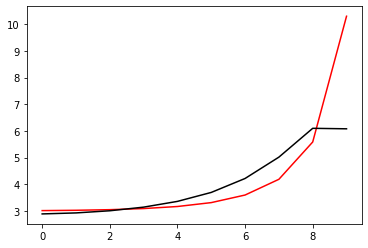

348700 0.012751849189231633
[2.86668142 2.9061884  2.99083779 3.13303055 3.35657001 3.70282203
 4.239949   5.06355746 6.18868108 6.18827199]


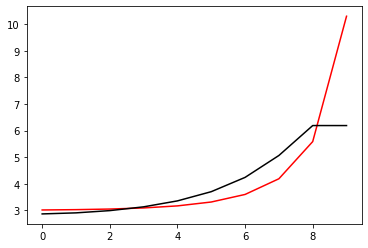

349800 0.020615993968654416
[2.91914559 2.94671192 3.01716332 3.14752929 3.36267053 3.70474156
 4.24438427 5.08598276 6.26299806 6.27020424]


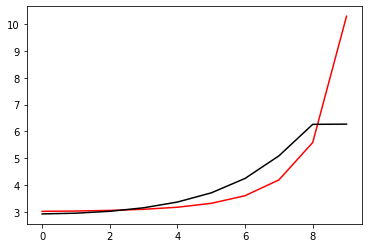

350900 0.01186871733664105
[2.90097963 2.92292876 2.98389539 3.09866161 3.28803978 3.58511681
 4.04351545 4.74493327 5.73149341 5.73233031]


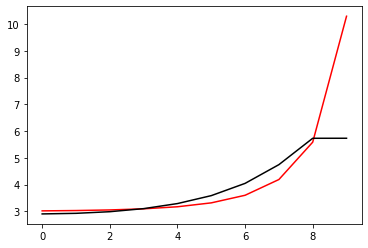

352000 0.03202119012652632
[2.89297052 2.91846624 2.9816997  3.0985499  3.29069927 3.59232425
 4.05910137 4.77569146 5.78441431 5.78743634]


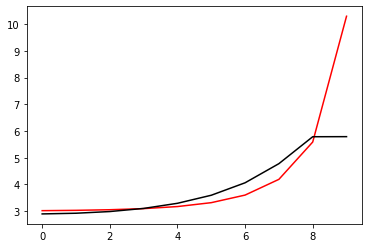

353100 0.04568909453058562
[2.86092458 2.88962495 2.95634145 3.07708939 3.27534077 3.58803473
 4.07583468 4.83068569 5.89474975 5.8731867 ]


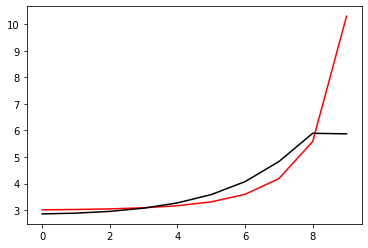

354200 0.0334298707560955
[2.77225439 2.81361272 2.89550948 3.03195065 3.24819915 3.58588685
 4.1144996  4.93751241 6.08763591 6.01514385]


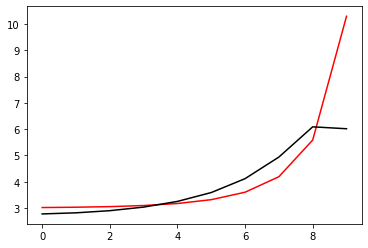

355300 0.03153982675402808
[2.84087666 2.87729825 2.95239296 3.07840571 3.27652398 3.5809112
 4.04378848 4.73713922 5.69979749 6.04958455]


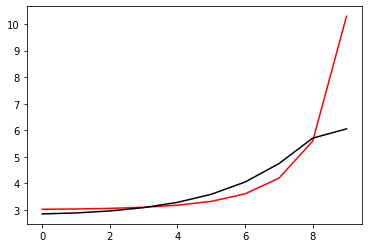

356400 0.014774805177082361
[2.87486811 2.91034293 2.98570274 3.11265954 3.31245922 3.61963839
 4.08727307 4.78730004 5.75186364 5.7341298 ]


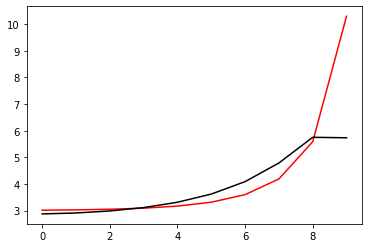

357500 0.02200583339771516
[2.86453578 2.90007499 2.9765858  3.10582496 3.30934844 3.62302387
 4.10355997 4.82907976 5.82449597 5.83098591]


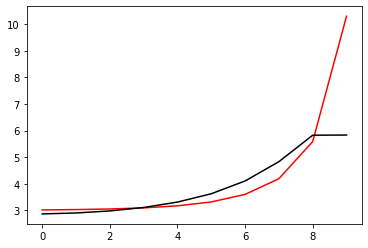

358600 0.01240343322234369
[2.93254908 2.96424722 3.03893999 3.16956794 3.37858058 3.70417322
 4.20770872 4.97095023 6.00153629 5.95826201]


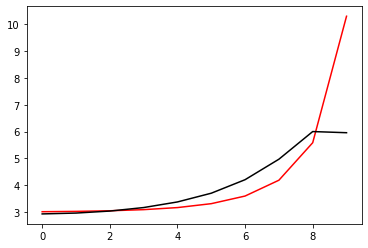

359700 0.011944646962728126
[2.93990591 2.95790494 3.01609143 3.12712211 3.31059392 3.59905512
 4.04461752 4.71889859 5.6387766  5.63334539]


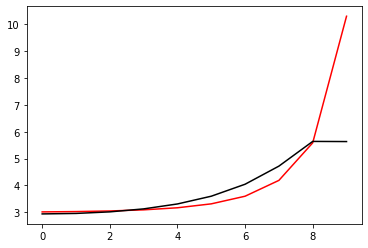

360800 0.012246523221185029
[2.83262566 2.86846148 2.94094081 3.06597798 3.26578972 3.57614793
 4.05542186 4.78703514 5.795613   5.78013006]


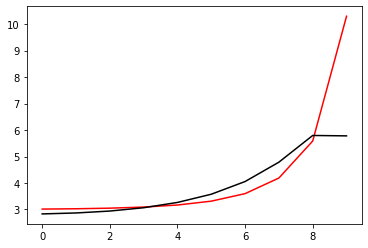

361900 0.011938538139913895
[2.92515699 2.95375465 3.02120916 3.1391095  3.32809112 3.62111797
 4.07003706 4.75126182 5.71223301 5.7447557 ]


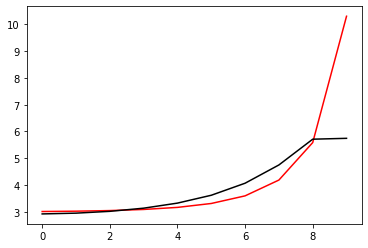

363000 0.03187301071639013
[2.94140641 2.96963608 3.03601791 3.15348855 3.34291538 3.6386026
 4.09696775 4.80551046 5.81851616 5.83488941]


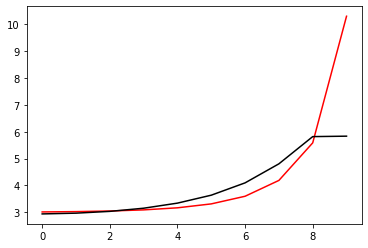

364100 0.049375860918660724
[2.88324267 2.91918836 2.99537592 3.12080087 3.31389876 3.60599338
 4.04914681 4.72701339 5.70943314 5.67794241]


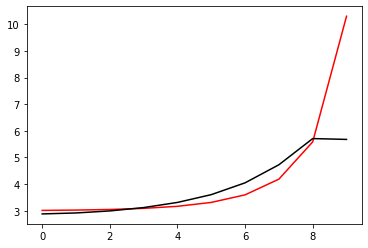

365200 0.014498502321160235
[2.83558349 2.85848119 2.92134802 3.03368317 3.21230298 3.48546269
 3.89503913 4.48209881 5.31349727 5.39338577]


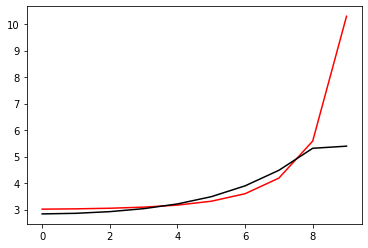

366300 0.023187789958753428
[2.9254771  2.94230788 2.99802017 3.10449117 3.27853519 3.54800124
 3.95414999 4.53958707 5.36345278 5.34725465]


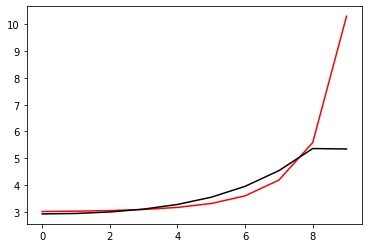

367400 0.016158956551279174
[2.8982259  2.92169417 2.98167981 3.09258351 3.2729527  3.55228677
 3.97530998 4.59378734 5.45727049 5.44509707]


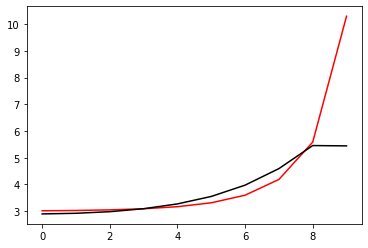

368500 0.01990207440454364
[2.85962962 2.89031656 2.95779969 3.0760106  3.26567155 3.55896306
 4.00567625 4.66997112 5.5910134  5.66675529]


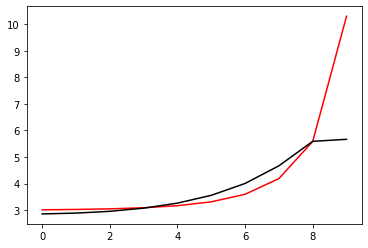

369600 0.012176857614523182
[2.94356125 2.98058545 3.05940793 3.19068384 3.39597547 3.71073861
 4.18985623 4.90521538 5.87703851 5.85585632]


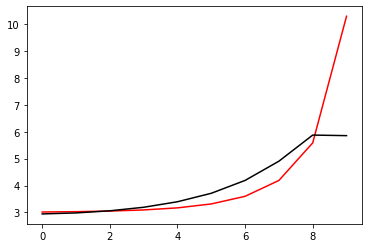

370700 0.012283569307286987
[2.93279942 2.97871851 3.06820635 3.20975391 3.42328334 3.74318829
 4.22520881 4.94926607 5.94428139 5.96101666]


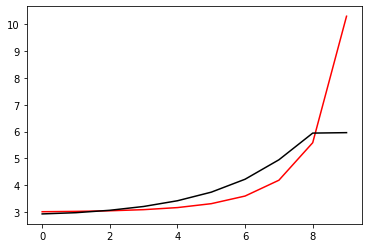

371800 0.011814468185832276
[2.84292715 2.87602231 2.95289943 3.07998183 3.27310556 3.56050211
 3.98776062 4.62223517 5.49708814 5.50330185]


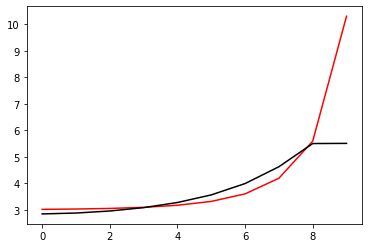

372900 0.011751981817836614
[2.90682722 2.93488943 3.00617582 3.12886181 3.31853542 3.60308394
 4.02777676 4.65919514 5.5293438  5.53088606]


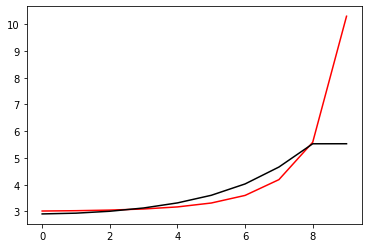

374000 0.03220956299719387
[2.86836883 2.90315454 2.97907254 3.10684655 3.3032289  3.59754623
 4.03845376 4.69773652 5.60553411 5.59530793]


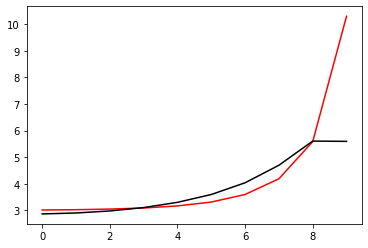

375100 0.046022893640588376
[2.85206801 2.88596285 2.961578   3.08954629 3.28796437 3.58779238
 4.0411424  4.72637928 5.67617901 5.62475091]


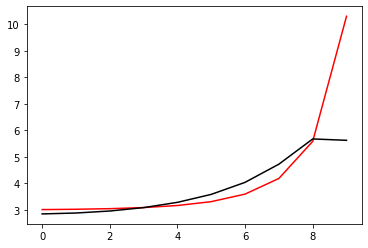

376200 0.012749024402940809
[2.94228087 2.97083523 3.03816181 3.15613647 3.34216478 3.62487683
 4.05157452 4.69509934 5.60227217 5.55537447]


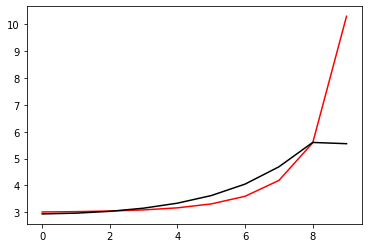

377300 0.024422573416890924
[2.96003359 3.00239717 3.08676749 3.22615077 3.44277145 3.77386748
 4.28101995 5.04589905 6.06587105 6.07242993]


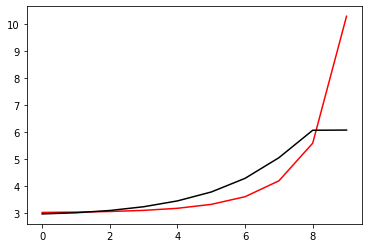

378400 0.041170218684195334
[2.74892595 2.78733664 2.86833176 3.00393622 3.21564553 3.540527
 4.04059384 4.80336827 5.8375297  5.9546573 ]


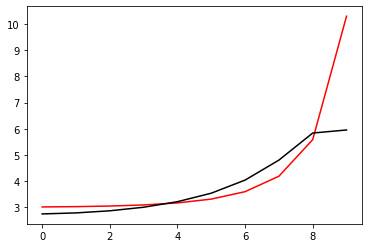

379500 0.022022774692334216
[2.90369238 2.92778268 2.99210606 3.11197712 3.30835054 3.61677095
 4.09699068 4.83530595 5.84631996 5.843977  ]


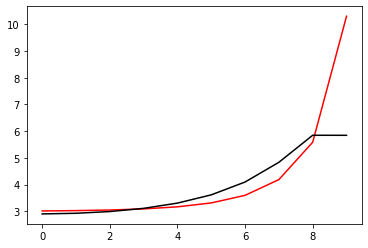

380600 0.020636911754840385
[2.8826533  2.9120744  2.98098511 3.10547432 3.30866592 3.62811375
 4.12636881 4.89489347 5.95706212 5.94406618]


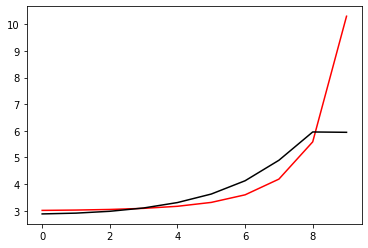

381700 0.0121419643254339
[2.9742483  2.99599653 3.05625329 3.1719634  3.36736875 3.68136356
 4.17795974 4.95349262 6.0461496  6.04790654]


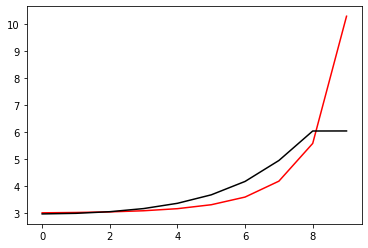

382800 0.011967933938067922
[2.89422008 2.91321502 2.96621801 3.07202153 3.25495062 3.55297107
 4.02853789 4.77726478 5.84740925 5.83972202]


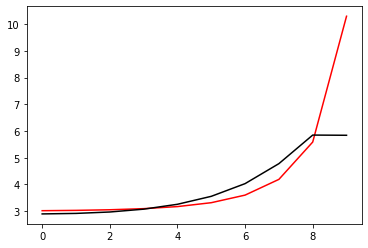

383900 0.012104917573795263
[2.96519264 2.9778511  3.02237785 3.11853576 3.29277907 3.58562333
 4.06356883 4.83057756 5.94725252 5.91859197]


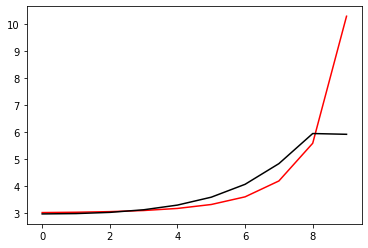

385000 0.03210496972051376
[2.94285563 2.96988653 3.03166476 3.14340116 3.33183213 3.63994273
 4.13840413 4.93814361 6.1094353  6.13308683]


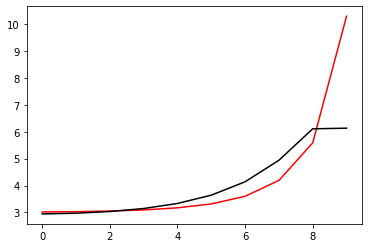

386100 0.0462619427603888
[2.86982605 2.89978774 2.96348878 3.07347903 3.25271274 3.53755699
 3.98500176 4.68262275 5.69864719 5.68797375]


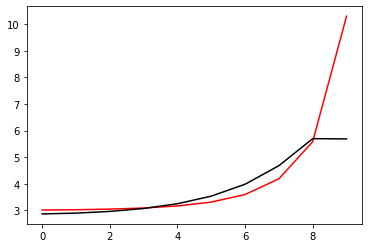

387200 0.017287168310666966
[2.88327738 2.91496469 2.98173334 3.09574902 3.28015541 3.57251923
 4.03227054 4.74815208 5.77865612 5.76046902]


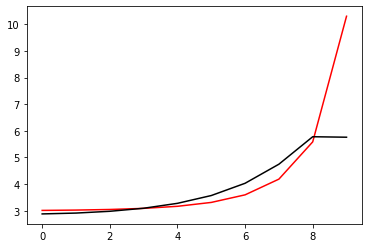

388300 0.02266526756807824
[2.89178085 2.92152141 2.98898043 3.10568328 3.29489318 3.59575665
 4.07158688 4.81586797 5.87883768 5.91359641]


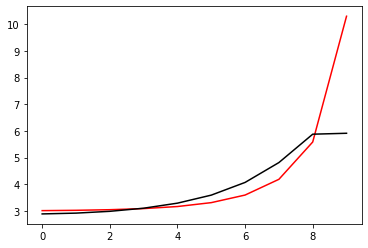

389400 0.02022079712541213
[2.97358552 2.99591379 3.05766325 3.17105719 3.35905789 3.66094858
 4.14034747 4.89097329 5.96653377 5.87130366]


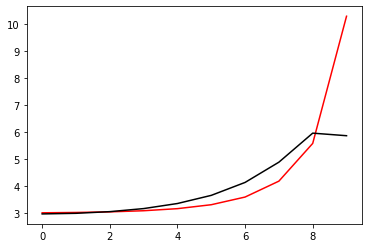

390500 0.018148175399659322
[2.85849663 2.88638018 2.95049959 3.06462219 3.25116353 3.54787935
 4.01908629 4.76853946 5.8716078  5.87024557]


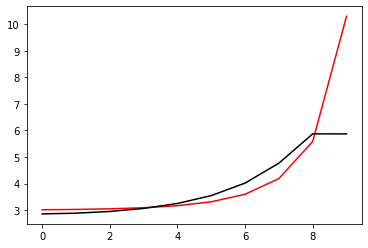

391600 0.012510372559876765
[2.93790458 2.97115779 3.04549233 3.17442538 3.38280527 3.71389835
 4.24117504 5.07310149 6.24225758 6.26643059]


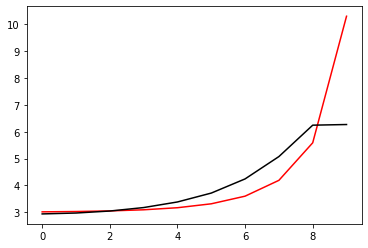

392700 0.0118739827981418
[2.98144952 2.9912423  3.04231575 3.1471026  3.32715998 3.62037477
 4.09090758 4.83301945 5.88392706 5.89712972]


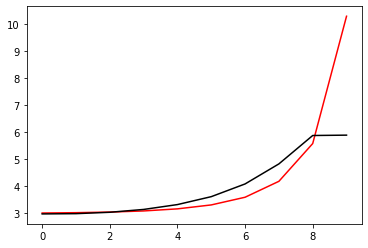

393800 0.021970188212105224
[2.98039126 3.00015678 3.05618286 3.16546527 3.35083821 3.65063995
 4.1296942  4.88473173 5.95819797 5.96344406]


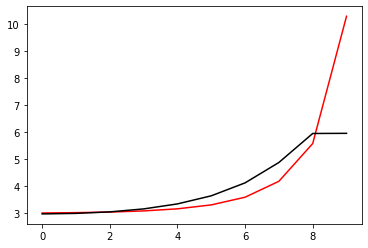

394900 0.08817505794212019
[2.74993913 2.75762281 2.80040883 2.89394872 3.06045607 3.33546201
 3.77832    4.4799925  5.49032202 5.512874  ]


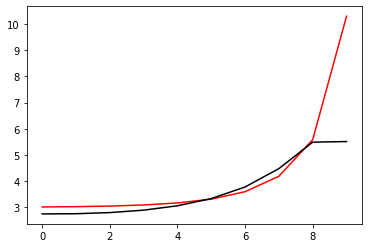

396000 0.03215096373583495
[2.93573477 2.93878219 2.97307747 3.05699849 3.21215767 3.47251676
 3.8947791  4.56663305 5.53672404 5.52854535]


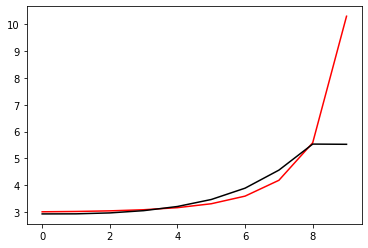

397100 0.05015763774164391
[2.94452621 2.95453749 2.99245843 3.07871046 3.23673743 3.5017582
 3.93202248 4.61797326 5.61300587 5.60905196]


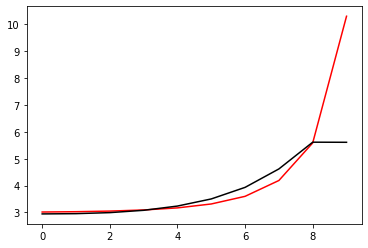

398200 0.01362977948301659
[2.94979902 2.96811871 3.01466383 3.10795582 3.27366895 3.54973335
 3.99771459 4.71339757 5.75791938 5.68899323]


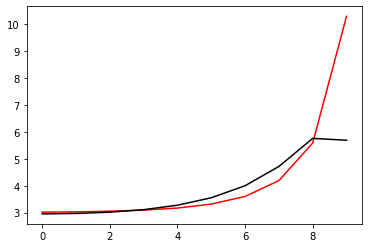

399300 0.029279520138714318
[2.99008171 3.01653774 3.07401107 3.17725738 3.35128545 3.63542829
 4.09321878 4.82377334 5.89556338 5.83995548]


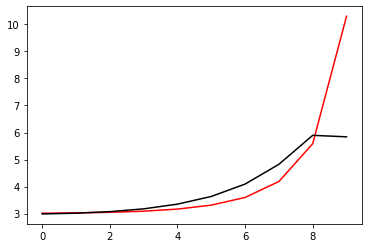

400400 0.011992507815155654
[2.84449204 2.87040078 2.93323558 3.05076169 3.25142006 3.58290477
 4.12466473 4.99554051 6.25502705 6.22441805]


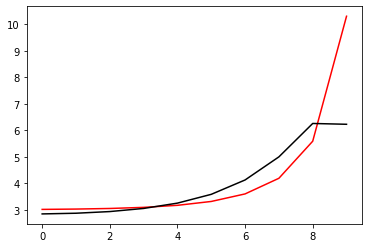

401500 0.012833817815033628
[2.86190195 2.88177647 2.93309567 3.02887391 3.19001503 3.44845417
 3.84989073 4.46279382 5.41945447 5.41342355]


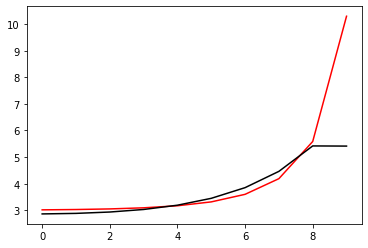

402600 0.023079751817784485
[2.9107517  2.93102197 2.98305723 3.08076978 3.24559681 3.51058014
 3.9237108  4.55294249 5.50750142 5.4886538 ]


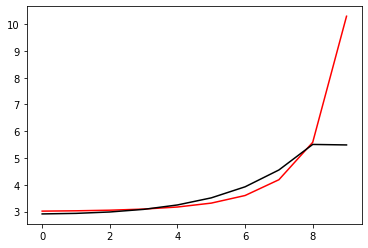

403700 0.012058549948220892
[2.94038322 2.96301031 3.01798985 3.11961308 3.29015252 3.56432999
 3.99404833 4.65087877 5.61827665 5.62145345]


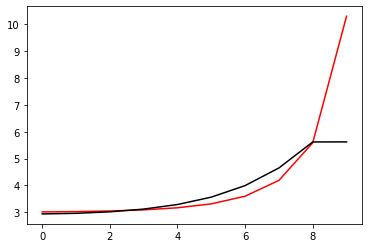

404800 0.011924820473431835
[2.86541356 2.90175069 2.97058204 3.08580089 3.2709392  3.56379219
 4.02381827 4.73502149 5.7554381  5.73995459]


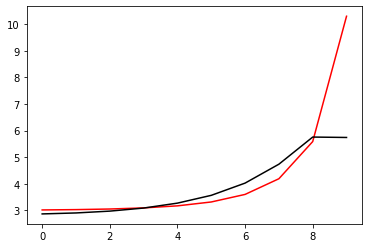

405900 0.01189799539762265
[2.86576649 2.89893835 2.96788138 3.08405683 3.26917599 3.55948682
 4.01321705 4.71959509 5.75171006 5.77703264]


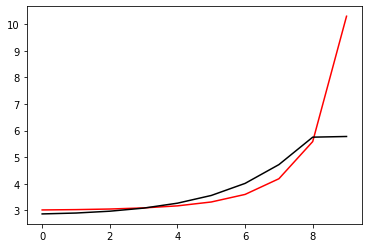

407000 0.03176265679308717
[2.94798429 2.9700955  3.0275167  3.13333337 3.30887738 3.58986037
 4.03545185 4.74455888 5.80439339 5.84505206]


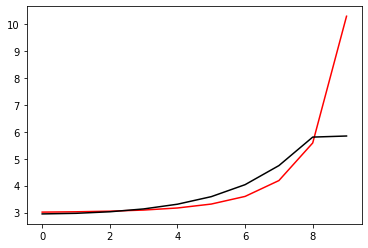

408100 0.03156482495739743
[2.99494538 3.02590669 3.0920389  3.20836993 3.39878557 3.70368654
 4.19209189 4.96667938 6.07237308 5.9205533 ]


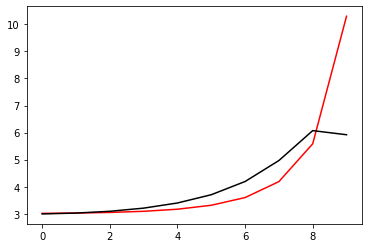

409200 0.013809033915685668
[2.90343749 2.93889776 3.01100104 3.13116812 3.32045166 3.61564089
 4.08113607 4.82488716 5.93992013 6.04411528]


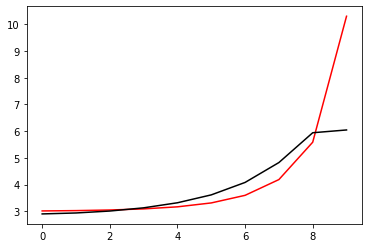

410300 0.03171824036418188
[2.88698131 2.89164102 2.93246061 3.02004274 3.17155209 3.41635974
 3.80137344 4.39668778 5.31279974 5.30454571]


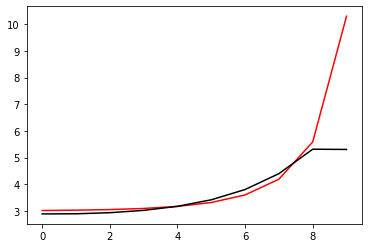

411400 0.01719173903969109
[2.92801994 2.93715255 2.97960112 3.06948526 3.22484136 3.47572665
 3.87034453 4.48066207 5.40945782 5.40171521]


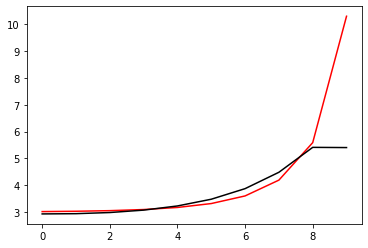

412500 0.021452186820768767
[2.9185951  2.93547754 2.98301791 3.07749033 3.23878074 3.49823867
 3.90654404 4.54045199 5.49545734 5.50479532]


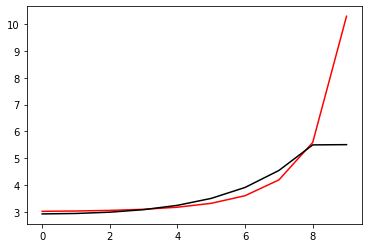

413600 0.01834889559828782
[2.93262771 2.95669879 3.0118515  3.11336204 3.28319315 3.55496765
 3.98285611 4.6496953  5.64094969 5.51878979]


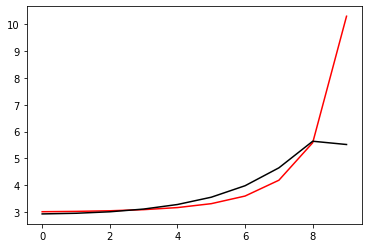

414700 0.05166103117890314
[2.81892446 2.84059693 2.89673605 2.9999866  3.17142767 3.44536467
 3.8783872  4.56210206 5.58656228 5.81029081]


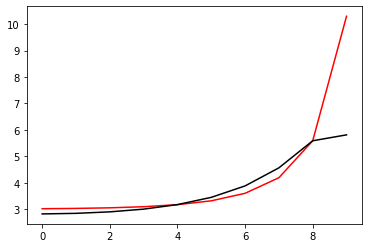

415800 0.021460572022363508
[3.00314644 3.02353618 3.07398406 3.16835239 3.32697452 3.58210447
 3.98710437 4.62899701 5.58883129 5.59871479]


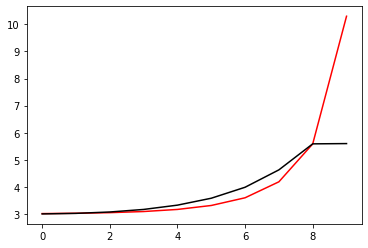

416900 0.011860215755492901
[2.94639741 2.96853785 3.02111888 3.11897653 3.28585461 3.56025951
 4.00745519 4.73358461 5.81708571 5.82493127]


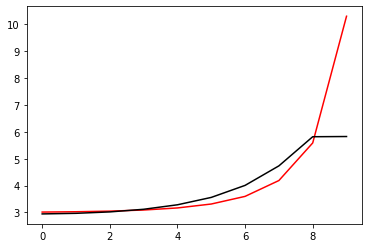

418000 0.03131303051947803
[2.99733187 3.03236656 3.09865763 3.2087817  3.38499042 3.66203705
 4.08509722 4.66497807 5.49570729 5.56534624]


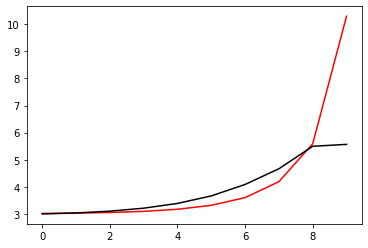

419100 0.046410556258425
[2.83864735 2.88881468 2.97684076 3.10885935 3.3068521  3.60869936
 4.07359819 4.7822138  5.71084982 5.66132439]


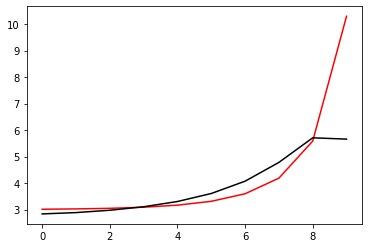

420200 0.0132336702447789
[2.80842568 2.85248402 2.93951215 3.07511213 3.27825189 3.58641253
 4.06498315 4.82428749 5.83304341 5.73798319]


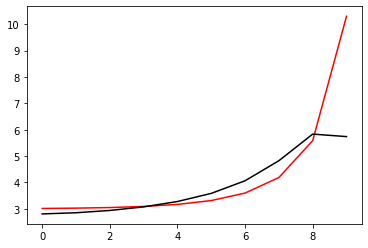

421300 0.023457641353658094
[2.8824182  2.92330261 3.00460264 3.13222676 3.32057064 3.5967208
 4.00152534 4.57358618 5.3977553  5.40994324]


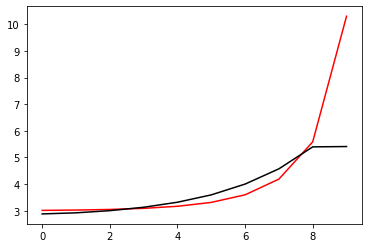

422400 0.018367852203734242
[2.90619186 2.95401233 3.04798549 3.19550922 3.41461792 3.73919648
 4.22497212 4.93916785 5.88041304 5.80606934]


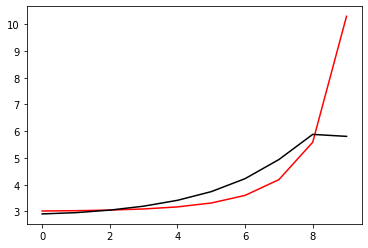

423500 0.013270420905740814
[2.80270814 2.8517925  2.94752036 3.09675559 3.3158128  3.63529866
 4.10708027 4.80484883 5.74943276 5.73539874]


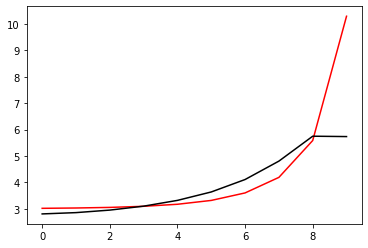

424600 0.4892256451806432
[3.08390585 3.12665634 3.21516342 3.35510078 3.56016816 3.85477631
 4.27550216 4.85820915 5.61278464 5.77005209]


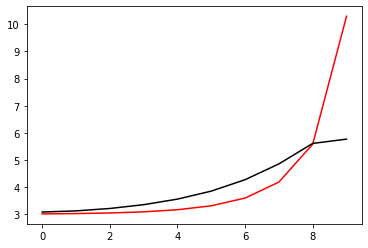

425700 0.011838942400276076
[2.94691718 2.9696882  3.03240439 3.14607723 3.32374683 3.58780329
 3.97343106 4.52352028 5.26776871 5.2334753 ]


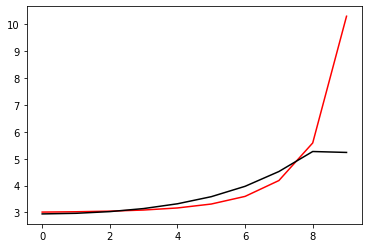

426800 0.021360781756019267
[2.95219392 2.97864831 3.04174968 3.15460341 3.33318104 3.60171795
 3.99823823 4.57331318 5.35488702 5.36259062]


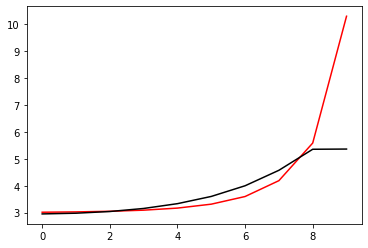

427900 0.011792359727422999
[2.93125548 2.96023971 3.02579505 3.14029238 3.3228181  3.60203578
 4.02228754 4.6456238  5.50027463 5.48429971]


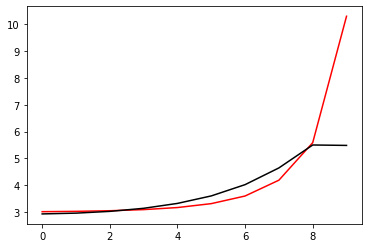

429000 0.031875883013286026
[2.89793298 2.92748223 2.99274214 3.10543473 3.28428126 3.55872257
 3.97508568 4.60077429 5.4673242  5.39621457]


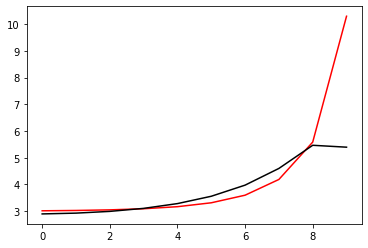

430100 0.04316945434394515
[2.83873062 2.866006   2.92545987 3.02643468 3.18479823 3.42530752
 3.78736322 4.33515697 5.12865323 5.12660276]


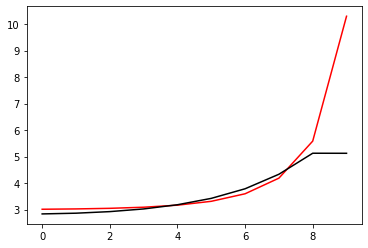

431200 0.01243446524530516
[2.97966579 3.00659151 3.06548494 3.16628768 3.32517778 3.56829282
 3.93811184 4.50121796 5.30811989 5.23776074]


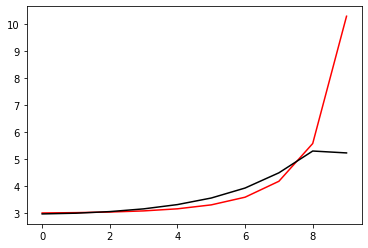

432300 0.023630995615776463
[2.9356225  2.95697385 3.01132549 3.1122306  3.28041186 3.5503866
 3.9803268  4.65889798 5.63002152 5.63590459]


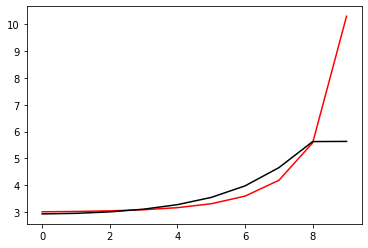

433400 0.01780939068473853
[2.92686641 2.95589087 3.0230768  3.14428535 3.34580832 3.67140426
 4.19275055 5.00903243 6.14176963 6.00539962]


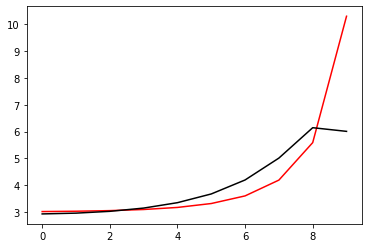

434500 0.015674970769177232
[2.87774214 2.86701853 2.88681657 2.95965516 3.11177516 3.38457608
 3.839794   4.53980784 5.59216661 5.59950479]


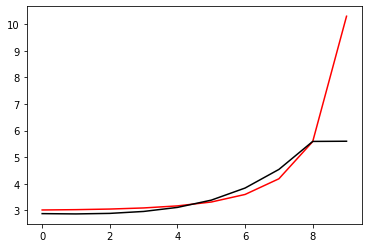

435600 0.030288585760781004
[2.94796485 2.93619597 2.94111199 2.99125677 3.11434899 3.3491892
 3.75471871 4.40690562 5.41539496 5.41595187]


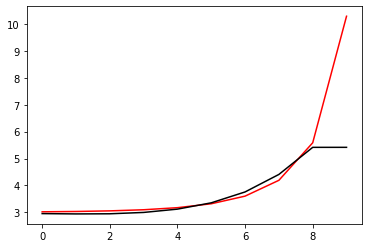

436700 0.011349222628951952
[3.03928786 3.04501457 3.0690483  3.13272663 3.26489775 3.50461697
 3.9086523  4.5577023  5.55124842 5.55797409]


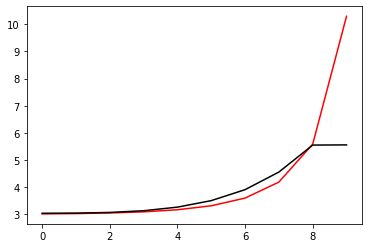

437800 0.02143888063661752
[2.99238442 3.0076442  3.04341581 3.11746104 3.25773959 3.50621092
 3.92810788 4.62330966 5.67989426 5.67346531]


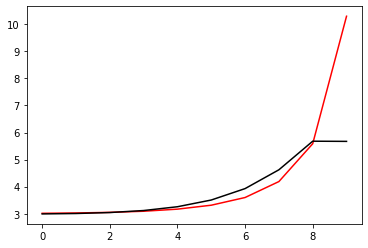

438900 0.01903516409449682
[2.99764557 3.04125349 3.10684692 3.20860093 3.37161326 3.63503219
 4.05150785 4.62282785 5.35920135 5.48058373]


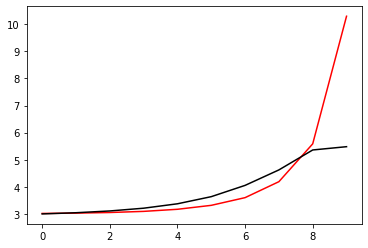

440000 0.031672334115496796
[2.90031585 2.94645208 3.02362989 3.13699357 3.30898775 3.57701135
 3.99155209 4.59585527 5.40900628 5.41604859]


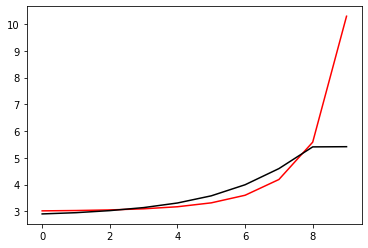

441100 0.04728406064049386
[2.8488682  2.89693871 2.98578007 3.11915883 3.31841606 3.6273289
 4.12479626 4.93394635 5.88237146 5.84857091]


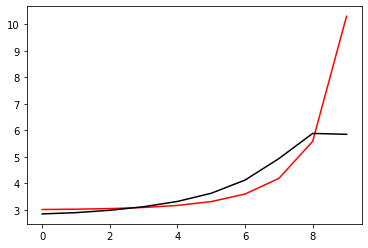

442200 0.013031797618836265
[2.8387592  2.86199511 2.92907785 3.04390188 3.22446956 3.51133053
 3.97936066 4.71152273 5.50205812 5.52061418]


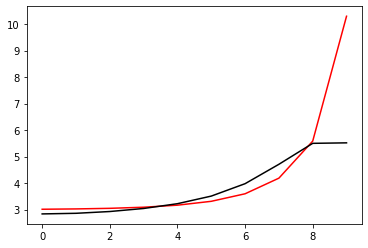

443300 0.022733735329583563
[2.91551751 2.93382679 2.99385545 3.10375051 3.28132547 3.56615163
 4.030578   4.75535415 5.5522391  5.53567804]


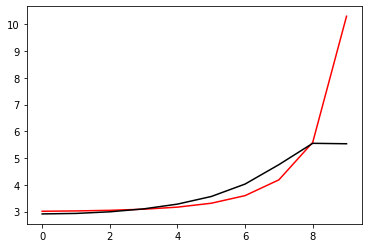

444400 0.01345141469454704
[2.8760783  2.90181694 2.96663204 3.08295087 3.27084077 3.57118135
 4.05768665 4.81570212 5.68287161 5.66686333]


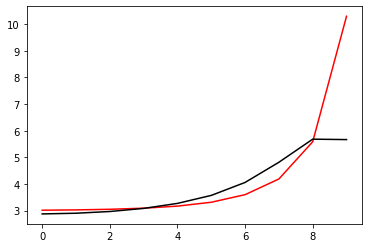

445500 0.022054429757989314
[2.9451389  2.9718554  3.03804035 3.15659605 3.34967091 3.65817634
 4.15289145 4.91802451 5.83014798 5.90014244]


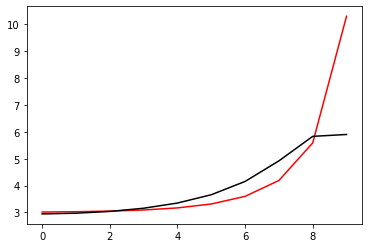

446600 0.022414131749639285
[2.86732633 2.90499936 2.98017524 3.10356572 3.29632857 3.59532434
 4.06231377 4.77887069 5.69450753 5.78217057]


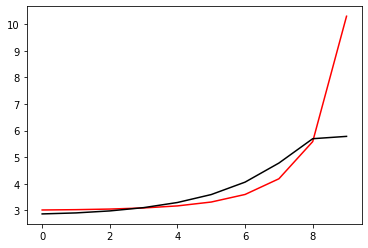

447700 0.011591443563831266
[3.01348503 3.02549445 3.07761158 3.1794343  3.34973714 3.62172469
 4.0466414  4.66846792 5.44684763 5.81502569]


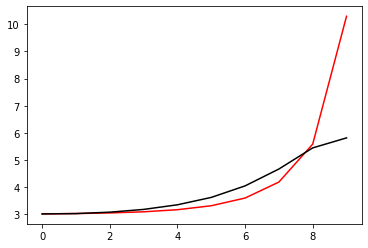

448800 0.02153142968054519
[2.99189894 3.00861428 3.05912371 3.1597076  3.33112636 3.60733698
 4.04089268 4.68688977 5.51332317 5.52114328]


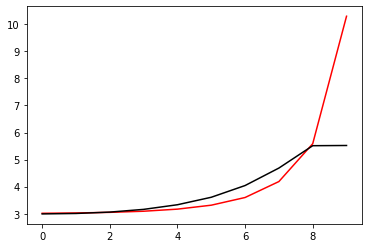

449900 0.011838437927729154
[2.9414633  2.95943906 3.01072172 3.11267359 3.29030523 3.58186056
 4.04610244 4.75404606 5.68365892 5.6460691 ]


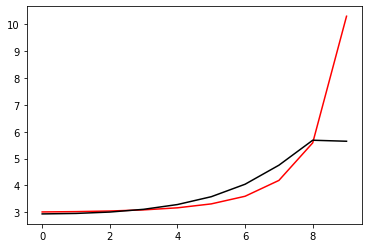

451000 0.03194692415007709
[2.90642283 2.9286827  2.9827255  3.08638741 3.26548966 3.55925114
 4.02913645 4.76271706 5.77643948 5.77659761]


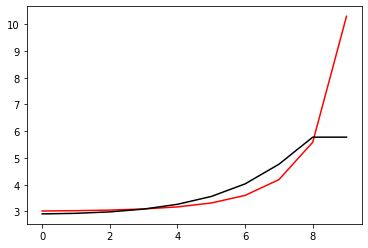

452100 0.08809249859770248
[3.02623475 3.06356347 3.13749699 3.26318413 3.46724599 3.79268306
 4.30587225 5.0924556  6.15060301 5.92606119]


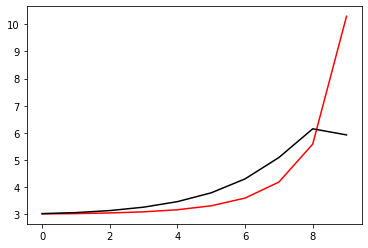

453200 0.01874314632484104
[2.85938076 2.89686639 2.96942555 3.08860398 3.27675709 3.56836609
 4.01093525 4.65661496 5.52384419 5.50200289]


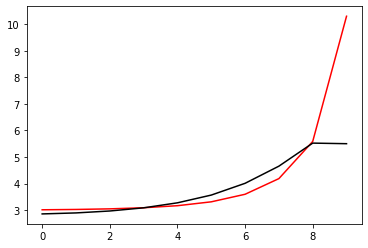

454300 0.02380144600804647
[2.91064582 2.94548901 3.01962622 3.14351336 3.34007309 3.6467618
 4.11806512 4.80983205 5.69578416 5.65542347]


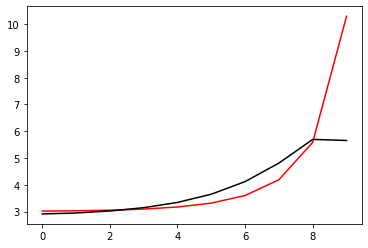

455400 0.016758692785201427
[2.87933118 2.92387783 3.00869747 3.14453031 3.3543333  3.67710298
 4.17202435 4.90446672 5.83297542 5.78246915]


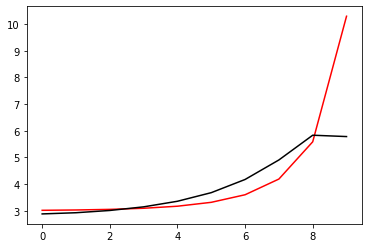

456500 0.02766730966273439
[2.78532662 2.8265778  2.9080466  3.03769867 3.23439016 3.53032832
 3.97165468 4.60417263 5.39091122 5.4568674 ]


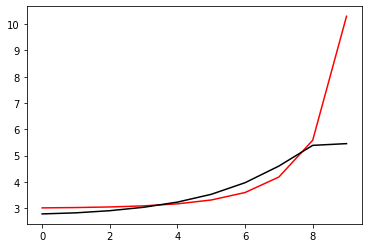

457600 0.021431992263013594
[2.8927401  2.9229337  2.99441986 3.11621455 3.30657124 3.59681633
 4.03182178 4.65571762 5.43027543 5.4228305 ]


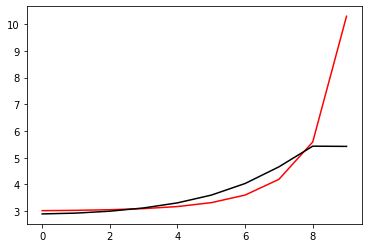

458700 0.012193864195142918
[2.90970068 2.9415667  3.01445024 3.13910313 3.33444913 3.63283041
 4.08201471 4.73139696 5.53800223 5.53278561]


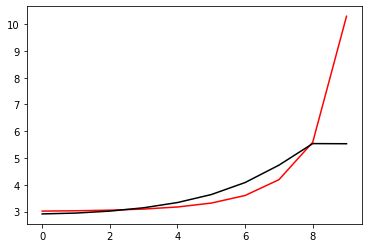

459800 0.02174144336765297
[2.99879467 3.02507616 3.09169295 3.20931654 3.39641357 3.68327916
 4.11382262 4.73665705 5.53228916 5.58294489]


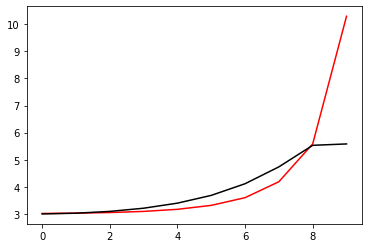

460900 0.012060309031859017
[2.86239731 2.90339869 2.9858886  3.12035481 3.32654973 3.63749498
 4.1051433  4.79503123 5.68485032 5.70805534]


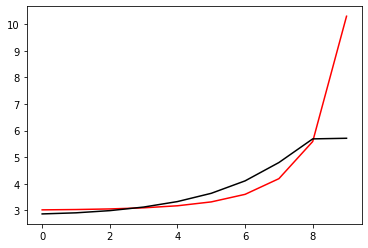

462000 0.0323229840546647
[2.90160783 2.93489056 3.01284365 3.14786891 3.36220558 3.69425794
 4.20693537 4.98444581 6.00112972 6.03579902]


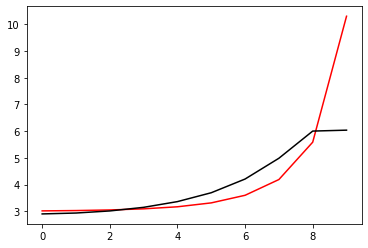

463100 0.4397526550632276
[3.02669956 3.07574835 3.17061068 3.32595465 3.56611903 3.93164484
 4.48711006 5.31963941 6.41893505 6.20094416]


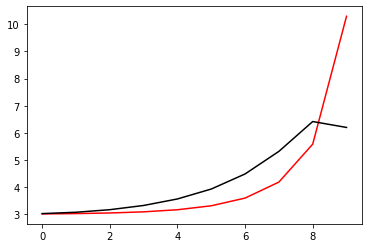

464200 0.014968884109246981
[2.87148436 2.91111645 2.99520258 3.13526385 3.35128377 3.67514591
 4.15432037 4.85274647 5.78725523 5.77138891]


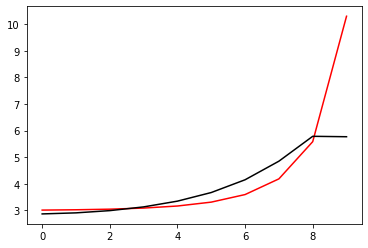

465300 0.022703590625478963
[2.8748589  2.91281604 2.99606619 3.13622111 3.3535898  3.68121855
 4.17006349 4.88904777 5.84716183 5.84548295]


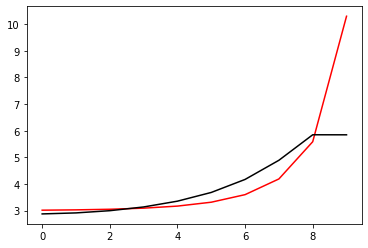

466400 0.012328547675769661
[2.84556538 2.88421674 2.96927562 3.11348408 3.3386001  3.68128421
 4.20112624 4.97746836 5.99734138 5.9421839 ]


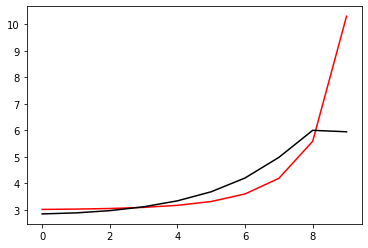

467500 0.03245757142139151
[2.7560816  2.80507064 2.9005951  3.05616636 3.29562473 3.66009864
 4.21880554 5.06549346 6.17359822 6.25506535]


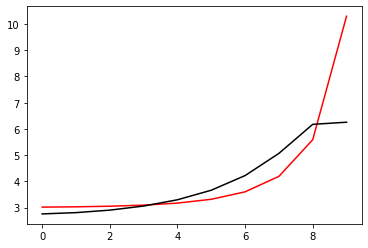

468600 0.022572532899295984
[2.87904011 2.90473215 2.97381245 3.0988188  3.29880761 3.603881
 4.05640264 4.69938369 5.54139095 5.5259648 ]


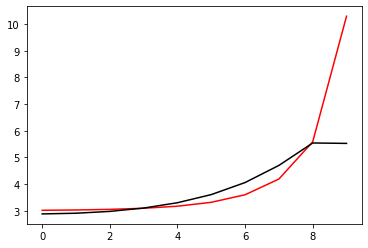

469700 0.012486000484501781
[2.90039916 2.92873891 2.99915686 3.12610493 3.32969208 3.6414349
 4.10719596 4.77687501 5.64480685 5.63128247]


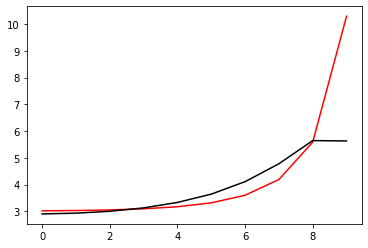

470800 0.02201657671409506
[2.94530077 2.97368593 3.04372547 3.17113939 3.37791073 3.69815687
 4.18339312 4.89425011 5.81077615 5.76096442]


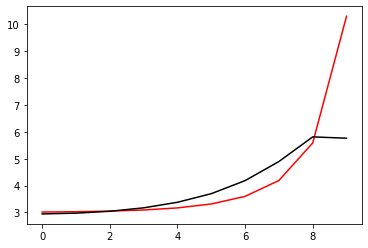

471900 0.012497183680852493
[2.94604082 2.97481581 3.04405511 3.16700901 3.36518094 3.6712803
 4.13445507 4.82044126 5.73874482 5.71450094]


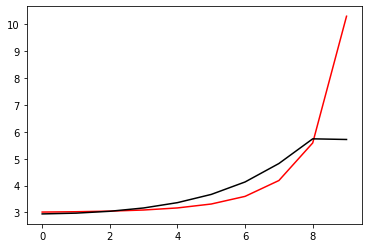

473000 0.03183435214146404
[2.94059647 2.94391181 2.98651244 3.08061072 3.24447866 3.50592492
 3.90442376 4.48180599 5.24825063 5.23084275]


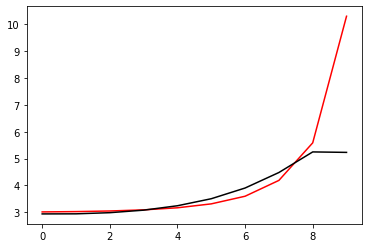

474100 0.05075119861957112
[2.95281203 2.96517633 3.01100914 3.10762088 3.27451558 3.54034355
 3.94644013 4.53996721 5.3315191  5.32970058]


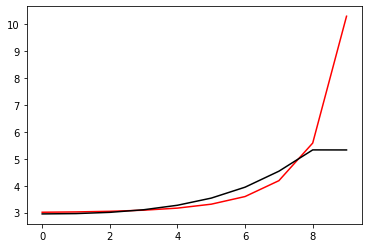

475200 0.012660454096690657
[2.97162501 2.99085688 3.04129821 3.14051516 3.31042421 3.58179487
 3.99951283 4.61931633 5.4546377  5.42099146]


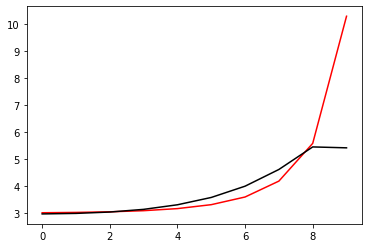

476300 0.027725544940620645
[2.95950249 2.9822914  3.03698002 3.13900838 3.31138011 3.58801891
 4.01960885 4.67433544 5.57376289 5.59395685]


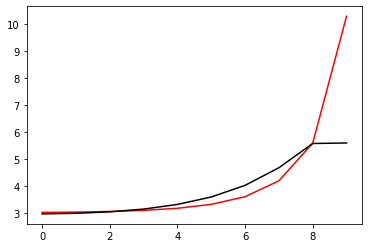

477400 0.020053002923489622
[2.91850461 2.95907507 3.03716259 3.1609594  3.35078204 3.63916213
 4.07571956 4.72753102 5.61098189 5.52692839]


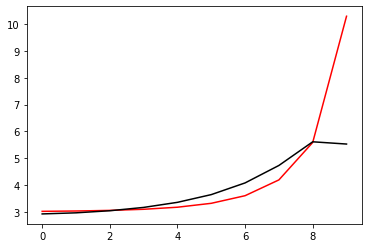

478500 0.02204690808715685
[2.9713017  2.99320458 3.05610643 3.17286036 3.36469175 3.66841799
 4.14380609 4.87468122 5.88169623 5.94927062]


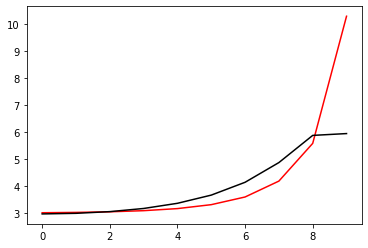

479600 0.416275714082201
[2.64992357 2.65639845 2.69837833 2.79531022 2.97389476 3.27574852
 3.76500954 4.52305259 5.601039   6.04069467]


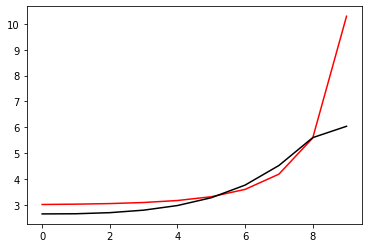

480700 0.019798965003233526
[2.93735455 2.93193085 2.9577276  3.03517807 3.18804248 3.45214211
 3.88163981 4.54552555 5.49050154 5.4816098 ]


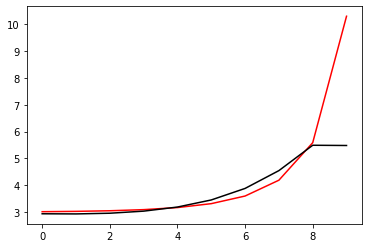

481800 0.01951141752010538
[2.96480935 2.96803975 2.99795428 3.07822241 3.23436102 3.50321574
 3.94050096 4.61906068 5.58299024 5.59196468]


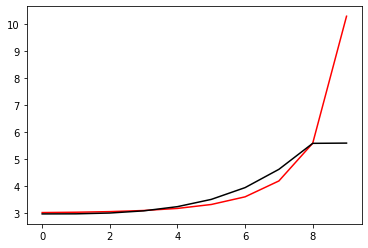

482900 0.011677773918725109
[2.9516872  2.96527612 3.00377053 3.08969538 3.25097391 3.52653805
 3.97513752 4.67701767 5.67706647 5.69544596]


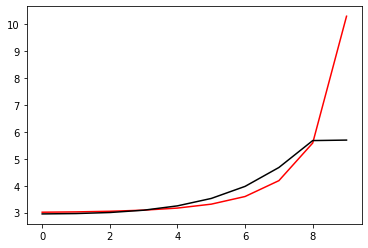

484000 0.05077144095088169
[2.90678162 2.88574535 2.89064511 2.94111644 3.06324832 3.29304251
 3.68243198 4.30199478 5.20574073 5.21091013]


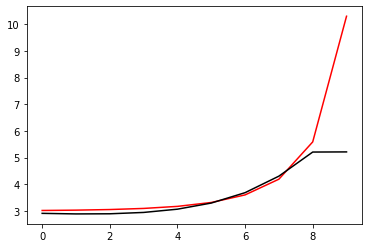

485100 0.050299013141373125
[2.9840286  2.9766348  2.9888316  3.04485026 3.17147095 3.40529073
 3.79930724 4.42633377 5.33985266 5.34323149]


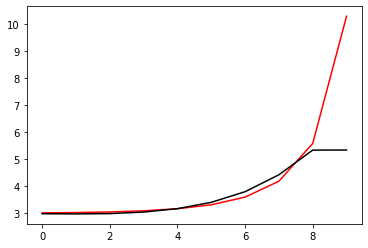

486200 0.012700621071857338
[3.0191406  3.02216959 3.04289347 3.10456251 3.23561263 3.47434511
 3.87650049 4.52004652 5.46019147 5.44078851]


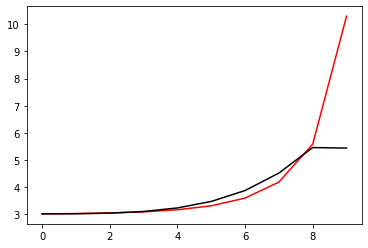

487300 0.028636369475385535
[2.99799111 3.00695656 3.03544115 3.1033047  3.2396998  3.48621024
 3.90431316 4.58175759 5.57877125 5.60217934]


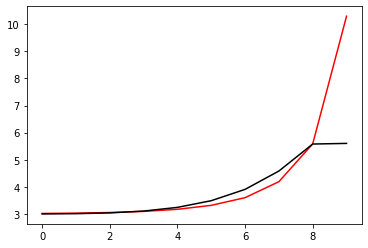

488400 0.018974318450301224
[2.94162561 2.95960204 3.00299275 3.08692635 3.23871981 3.50260495
 3.94766634 4.67508229 5.75312889 5.67764475]


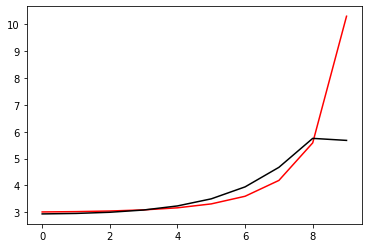

489500 0.021980800062821708
[2.89770555 2.93708102 3.00835956 3.12123068 3.30113948 3.59077216
 4.05699818 4.79536796 5.89020516 5.90461277]


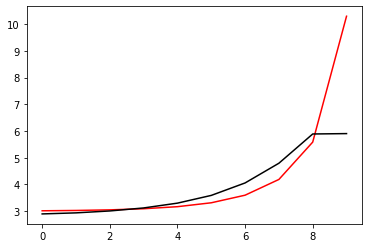

490600 0.012511245372043189
[2.94181107 2.96722792 3.03016823 3.14545453 3.33552313 3.64273929
 4.14211928 4.94531364 6.10390122 6.03792842]


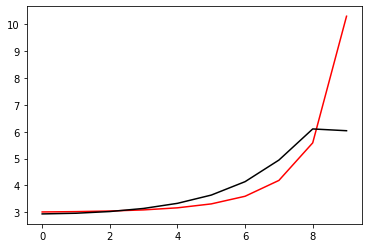

491700 0.05163834844017454
[2.82943027 2.85109552 2.90379369 2.99753172 3.15030206 3.39079126
 3.76376278 4.33708527 5.23532605 5.27193264]


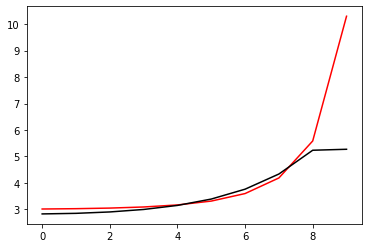

492800 0.01129831607021053
[2.90182772 2.91972355 2.96863369 3.05944524 3.20985409 3.44820963
 3.81872083 4.38844615 5.27493196 5.2737294 ]


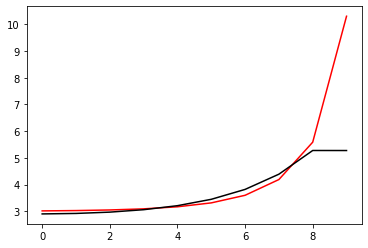

493900 0.011478230854341059
[2.95076438 2.97109575 3.02179946 3.1151678  3.26943121 3.51367936
 3.89349667 4.47763398 5.37202354 5.37139343]


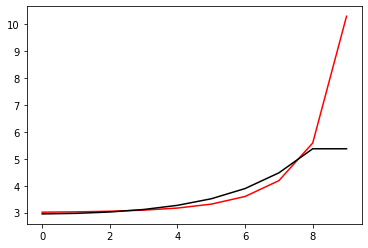

495000 0.03140991371991966
[2.95438403 2.97698526 3.0298099  3.12543826 3.2828699  3.5322356
 3.92164181 4.52520322 5.43922339 5.43055535]


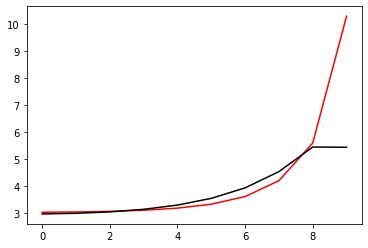

496100 0.05028707977883977
[2.96602352 2.98836155 3.04154031 3.13819983 3.29817361 3.55335378
 3.95580349 4.58753544 5.53479278 5.51585075]


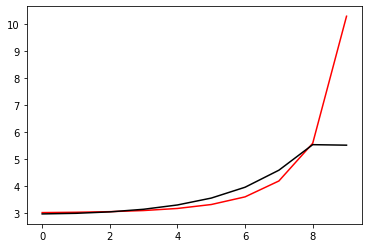

497200 0.015263659856830914
[2.92354328 2.95634321 3.02120422 3.12706539 3.29311987 3.55154992
 3.95584793 4.59208675 5.54121889 5.4846262 ]


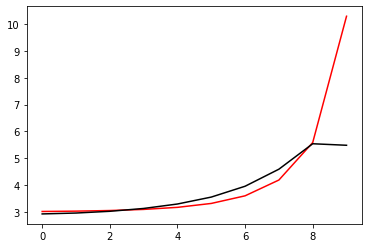

498300 0.022890897409050804
[2.91371213 2.94167707 3.00665692 3.12036683 3.303577   3.59312376
 4.05268201 4.7822441  5.84726632 5.81479256]


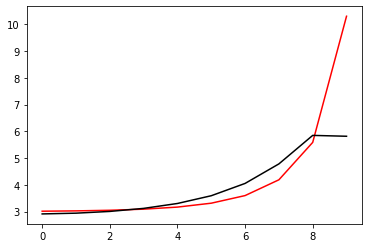

499400 0.0136098959350507
[2.8531223  2.88535415 2.95438493 3.07084457 3.25392242 3.53690461
 3.96665306 4.40784428 5.14087075 5.12217341]


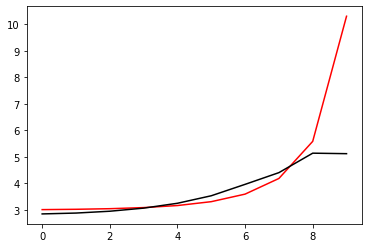

In [12]:
optimizer=tf.optimizers.Adam(learning_rate=0.001)
for j in range (5000):    
    with tf.GradientTape() as g:
        loss=Error_func(h, Positive[j%10], Negative[j%10])
        gradients=g.gradient(loss, [h])
    for i in range (100):
        optimizer.apply_gradients(zip(gradients, [h]))
    if j%11==0: 
        print(j*100, Error_func(h, Positive[j%10], Negative[j%10]).numpy()), print(h.numpy())
        plt.plot(h_real, 'r-'), plt.plot(h.numpy(), 'k-'), plt.show()

0 0.03125725591704254
[3.04587439 3.06970396 3.13062041 3.23923587 3.21530529 3.48833042
 3.90151485 4.33315757 5.04014779 5.15799612]


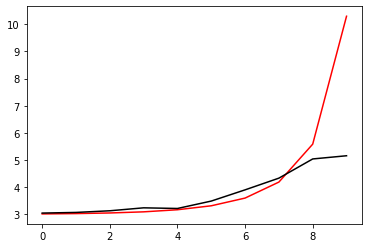

1100 0.05080853034918317
[2.98898242 3.01353989 3.0730643  3.16425805 3.18903736 3.43747513
 3.84752626 4.30434177 5.02332379 5.02305151]


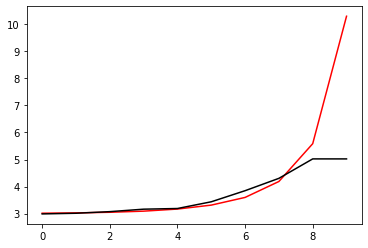

2200 0.013183113599629485
[3.00104779 3.02382334 3.07622217 3.15323296 3.24144247 3.46892155
 3.87488057 4.38448296 5.1418413  5.12230165]


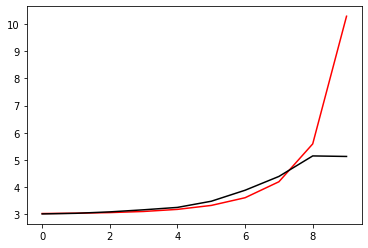

3300 0.02428453280877168
[2.94803665 2.9696494  3.01873422 3.10180244 3.23514133 3.47389892
 3.88546699 4.47464723 5.309659   5.33392375]


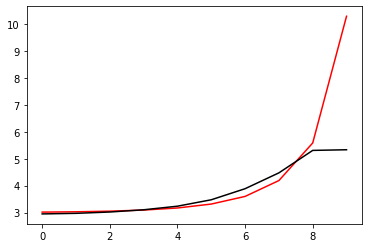

4400 0.02419543121091028
[2.81316574 2.84127163 2.90242785 3.00917693 3.1828475  3.46572528
 3.92396124 4.62719195 5.60430037 5.56312011]


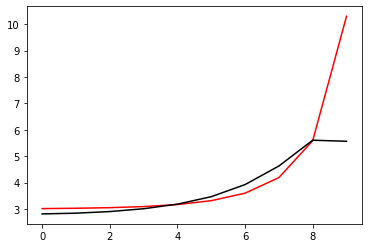

5500 0.021103298146334916
[2.91760965 2.92742338 2.96231561 3.03786525 3.17477657 3.40738311
 3.79248359 4.40780429 5.29789501 5.31392044]


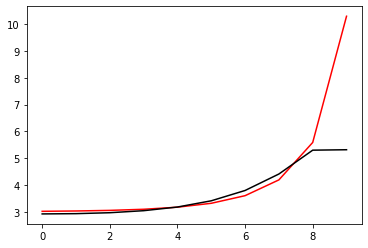

6600 0.01297540816028829
[3.01895258 3.04233991 3.09377089 3.18790144 3.34810078 3.61234613
 4.04224358 4.72378298 5.68489717 5.57249349]


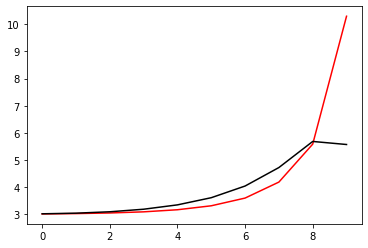

7700 0.011435618307788092
[2.98972213 3.01245902 3.06457862 3.15798647 3.31295849 3.56328919
 3.96293964 4.58655027 5.51234299 5.4445837 ]


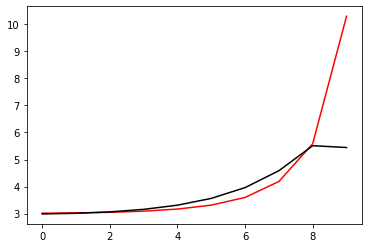

8800 0.03780998997949842
[2.79289723 2.83397236 2.90371002 3.01442534 3.18723066 3.45852744
 3.89064824 4.57002177 5.50929724 5.65662227]


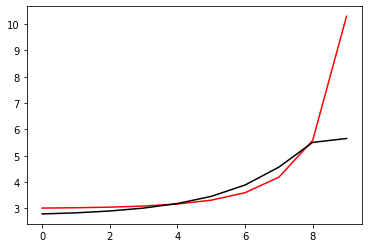

9900 0.011595712564649264
[2.85315984 2.89521    2.970169   3.08501767 3.2580992  3.52164528
 3.92801048 4.54421919 5.3738326  5.37302384]


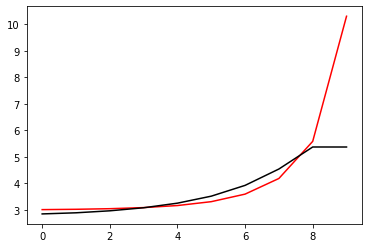

11000 0.03211898198161914
[2.86598703 2.91783875 3.01095674 3.14981795 3.35219498 3.65221
 4.10676473 4.79407306 5.72886853 5.66506976]


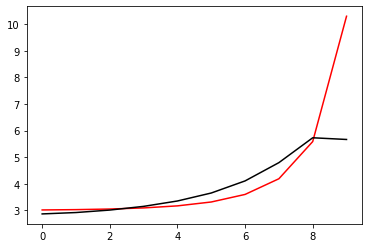

12100 0.04547642725872711
[2.98801955 3.03792341 3.13527    3.2847069  3.50241162 3.82074352
 4.29370557 4.99627158 5.954684   5.90578688]


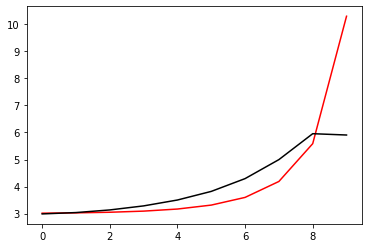

13200 0.013372943823777357
[2.88848396 2.93525411 3.02613643 3.1689024  3.37866907 3.6849576
 4.13983477 4.82414496 5.7856951  5.86126631]


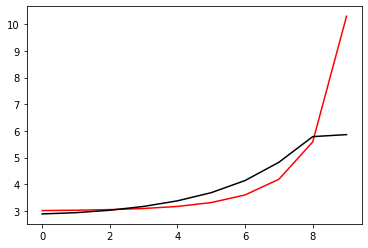

14300 0.02487508994340693
[2.94736845 2.98826037 3.07794331 3.22499471 3.44778416 3.78078327
 4.28470048 5.05226293 6.12309993 6.03505568]


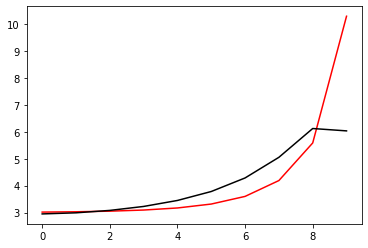

15400 0.013291722825939637
[2.88374115 2.91167405 2.98602358 3.12160033 3.34183395 3.68654335
 4.22384789 5.0723466  6.31636726 6.3179201 ]


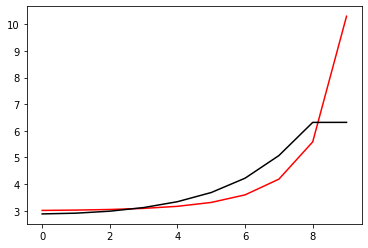

16500 0.015801799882269964
[2.84320681 2.86936678 2.94031935 3.07125391 3.28649127 3.62635981
 4.15887958 4.98735223 6.16920475 6.20771452]


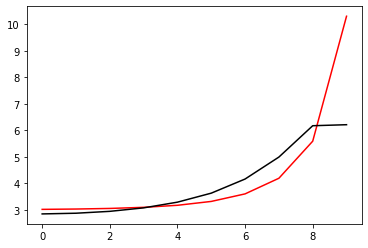

17600 0.012718987319675367
[2.92547952 2.95247151 3.02188985 3.15198387 3.36855621 3.71333033
 4.2559274  5.10289264 6.31566539 6.30679876]


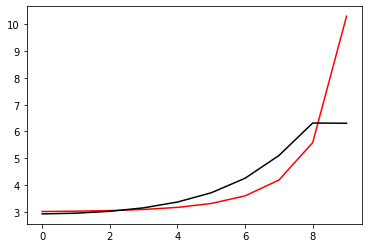

18700 0.012839276269012836
[2.91456445 2.94914834 3.02778793 3.1669124  3.39376832 3.75226054
 4.31468032 5.19227405 6.4520032  6.4592824 ]


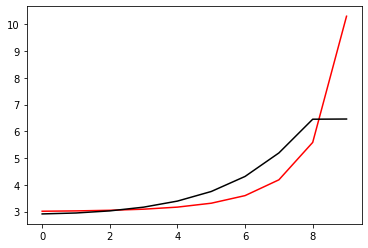

19800 0.042867883120996514
[2.75578386 2.80214183 2.89508625 3.05343593 3.30673953 3.70397138
 4.32572858 5.29222524 6.6676016  6.66050913]


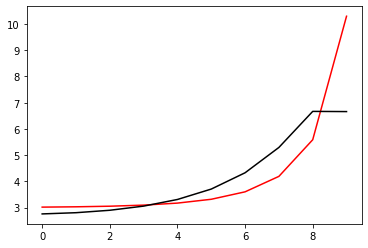

20900 0.0120008820644146
[2.88838579 2.89899689 2.94849769 3.0553307  3.24258298 3.5461507
 4.02414599 4.78063893 5.94388527 5.94081215]


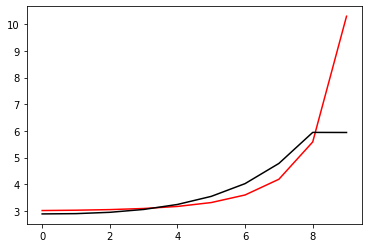

22000 0.03184154454851288
[2.95712537 2.97051684 3.01752119 3.11829479 3.29662527 3.58784957
 4.04988609 4.78572429 5.92245409 5.92703827]


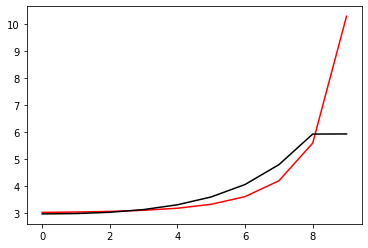

23100 0.058818536476038664
[3.03652618 3.06506471 3.12665252 3.24058184 3.43302066 3.74290404
 4.2333945  5.00856447 6.17293302 6.02513118]


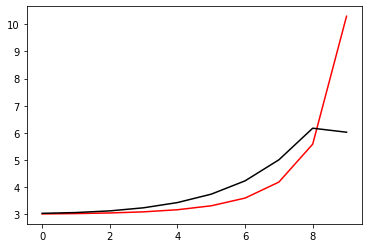

24200 0.018012863171800723
[2.88225068 2.90208922 2.95355159 3.05544412 3.23370321 3.5274462
 4.00076306 4.76037484 5.91307286 5.86912554]


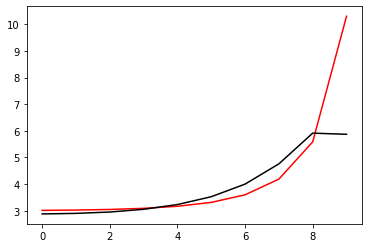

25300 0.0369126814180048
[3.02874015 3.05535557 3.1111847  3.21213451 3.38270525 3.66008755
 4.10421291 4.81427765 5.89406253 5.96494359]


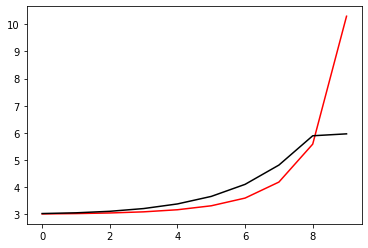

26400 0.04251824267450109
[2.75340475 2.78542447 2.85096687 2.96238475 3.14272485 3.43014025
 3.8891189  4.62807975 5.75311899 6.05676891]


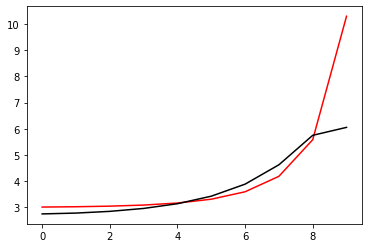

27500 0.022246231645003566
[2.91772497 2.95299009 3.0265011  3.14947856 3.34504285 3.65366168
 4.14479544 4.93204176 6.10917058 6.12534028]


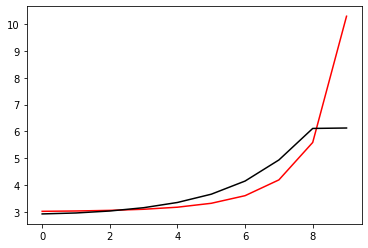

28600 0.0872152030809973
[2.79830434 2.83056056 2.90060641 3.01725866 3.19915477 3.47967422
 3.91620003 4.60435428 5.63383814 5.67545399]


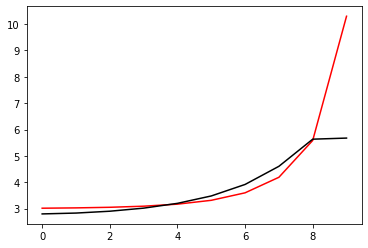

29700 0.017858450460434834
[2.87813568 2.90709956 2.97383309 3.08847548 3.26958807 3.55040324
 3.98791746 4.67556914 5.69760572 5.68212281]


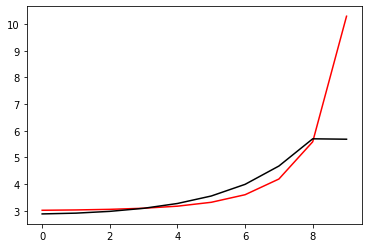

30800 0.011962475399479963
[2.86610645 2.8995278  2.97008262 3.08975864 3.27825587 3.57044111
 4.02656096 4.74383002 5.80104619 5.79567053]


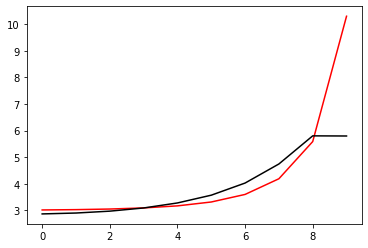

31900 0.01223804181910439
[2.83897306 2.87729321 2.95424021 3.08175654 3.28096974 3.58887347
 4.06967548 4.82581503 5.93067129 5.95409754]


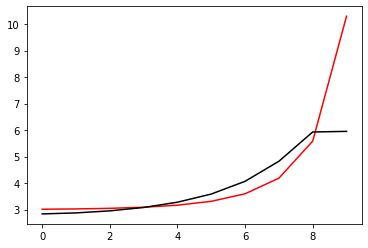

33000 0.03203163071865345
[2.94303275 2.96972603 3.03541874 3.15365858 3.34613418 3.65036253
 4.13127181 4.89424373 6.01683386 6.03434122]


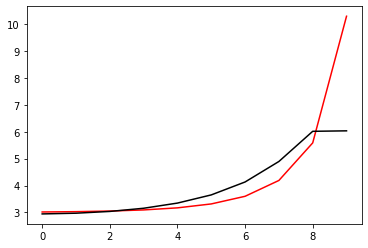

34100 0.04721835704854916
[2.87224812 2.90290871 2.96995462 3.0851055  3.26695007 3.54574425
 3.96915416 4.60821887 5.53893777 5.52093636]


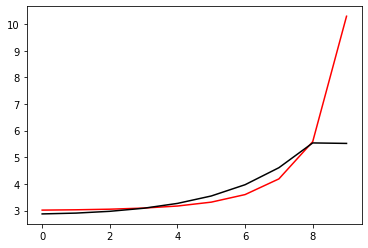

35200 0.017599676770900366
[2.88001602 2.91362096 2.98468536 3.10494012 3.29419001 3.58502077
 4.0297876  4.7031628  5.65662352 5.63479793]


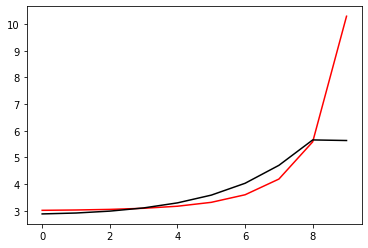

36300 0.029560491536224795
[2.97939502 3.00485938 3.07013214 3.18637923 3.37417862 3.66749716
 4.12025962 4.80562568 5.76168103 5.83003478]


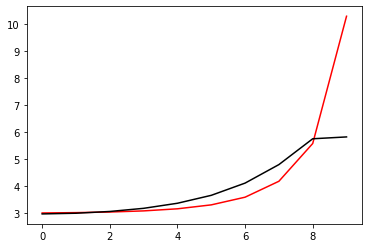

37400 0.017095267458170117
[2.89674439 2.93079882 3.00294295 3.12696341 3.32511552 3.63450525
 4.11706874 4.8622516  5.89228238 5.83921702]


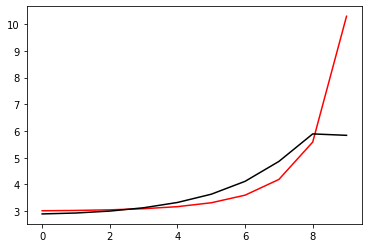

38500 0.02215458561813699
[2.95401146 2.98579625 3.05748055 3.18139775 3.37950971 3.68906991
 4.17174741 4.91638599 5.94703588 5.936252  ]


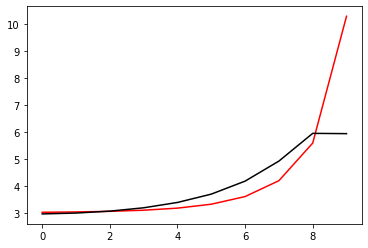

39600 0.08962844238007286
[3.06390393 3.07988093 3.13343009 3.23677287 3.40959592 3.68461979
 4.11530361 4.77964238 5.70563372 5.76835854]


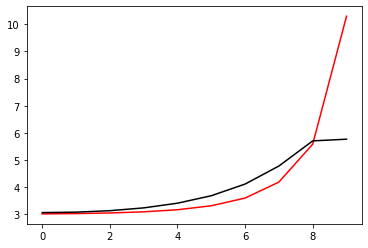

40700 0.011992817541844515
[2.93499214 2.95880254 3.01711538 3.1253873  3.30456515 3.58874366
 4.03474451 4.7290905  5.7155525  5.68997722]


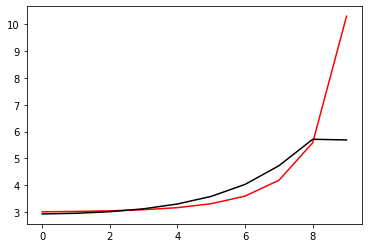

41800 0.01220914160803321
[2.83691699 2.87358461 2.94700005 3.0709296  3.26828341 3.57651457
 4.05840497 4.81126412 5.89017068 5.89018371]


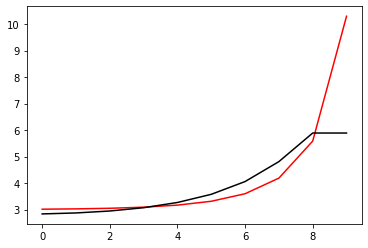

42900 0.012795806472666859
[2.84363447 2.89455272 2.99107635 3.14274577 3.3731343  3.7236527
 4.26284689 5.08975366 6.24765153 6.27703834]


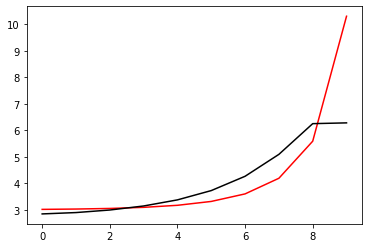

44000 0.03249751279098856
[2.92019632 2.95603007 3.03779809 3.17828772 3.399815   3.74185787
 4.27240385 5.10829747 6.33960573 6.35540978]


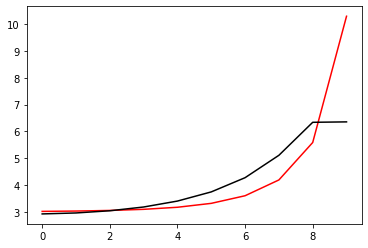

45100 0.043951128304313795
[2.82732405 2.86010611 2.93870358 3.07729193 3.2980867  3.63993273
 4.16810003 4.97957341 6.13541068 6.12293926]


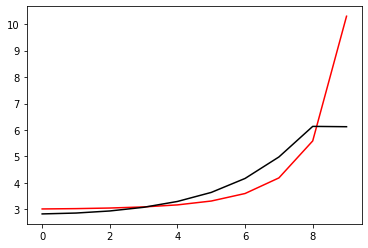

46200 0.3867264119480297
[2.59655321 2.6311552  2.7087131  2.84501425 3.06291106 3.40049056
 3.92206642 4.72669933 5.87979213 6.31974966]


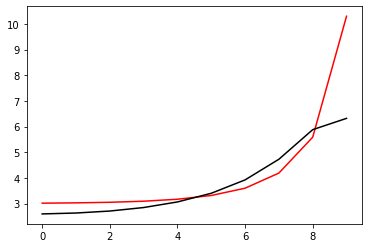

47300 0.0226730955931123
[2.90378735 2.92589093 2.98842392 3.10553056 3.29627602 3.5909112
 4.03835479 4.71511113 5.69444162 5.68106308]


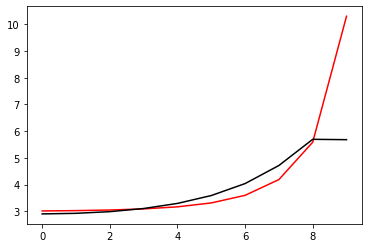

48400 0.014603373831113667
[2.88583107 2.91155238 2.97675501 3.09698809 3.29293529 3.59723125
 4.06351384 4.77415238 5.78984658 5.77232441]


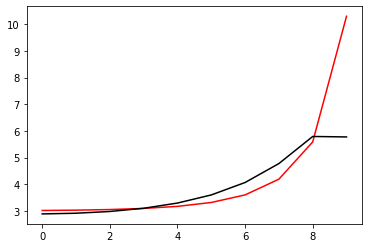

49500 0.033541534193199454
[2.77070841 2.81103135 2.88972422 3.02188148 3.23036384 3.55143131
 4.0458763  4.80785301 5.88939512 5.90521921]


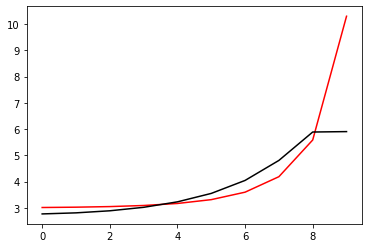

50600 0.012233076567805935
[2.96076503 2.98749416 3.05507782 3.17824552 3.38070248 3.7008374
 4.20111658 4.97190087 6.04648452 6.07085966]


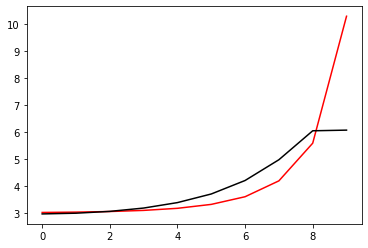

51700 0.021423522418160666
[2.86583238 2.8861233  2.94458556 3.05525763 3.23890762 3.52826879
 3.97414987 4.64414828 5.56287419 5.57104477]


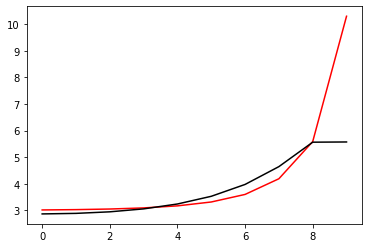

52800 0.011822707469567047
[2.87934312 2.9041039  2.96584948 3.07981461 3.26745421 3.56236689
 4.01672283 4.69975926 5.63207425 5.63284379]


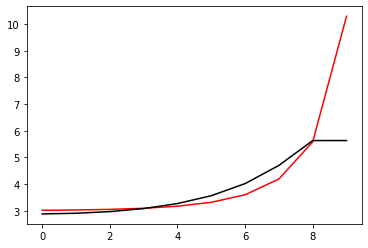

53900 0.011964225549415966
[2.87171284 2.90227079 2.96933724 3.08877491 3.28338428 3.58869211
 4.06030128 4.77273127 5.74235839 5.74832919]


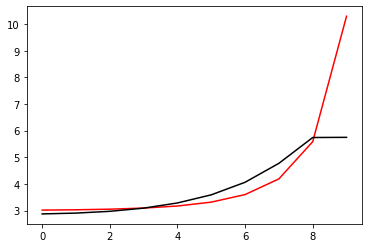

55000 0.031766548940562904
[2.95101264 2.97377614 3.03301041 3.14352651 3.3276571  3.62002494
 4.07456253 4.76785917 5.7309625  5.76761911]


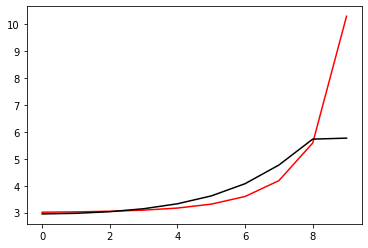

56100 0.0349508554374131
[2.97186941 2.99974515 3.06447998 3.18159863 3.3748961  3.68220174
 4.1637853  4.90485912 5.92735574 5.83025137]


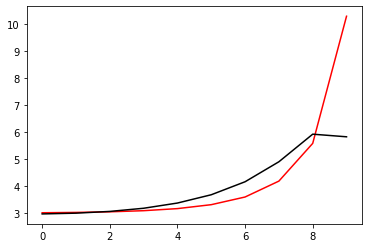

57200 0.016378808991974053
[2.9728304  2.98013923 3.01790499 3.10006899 3.24500869 3.48025888
 3.84679147 4.40445309 5.21766943 5.18501317]


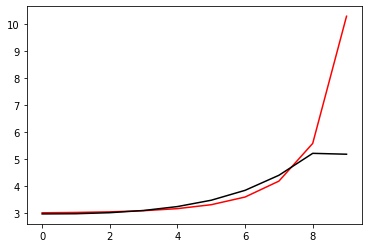

58300 0.028625822902136347
[2.9799929  2.99549858 3.03925375 3.12729465 3.27993602 3.52705767
 3.91451243 4.51010125 5.37304805 5.36388135]


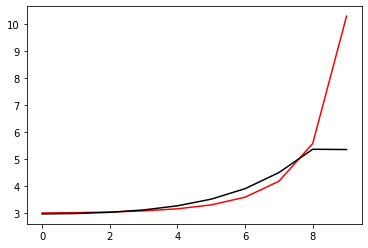

59400 0.02031106633460806
[2.95458691 2.97166326 3.01771326 3.10898765 3.26866908 3.53182657
 3.95382514 4.61751362 5.58004933 5.54564332]


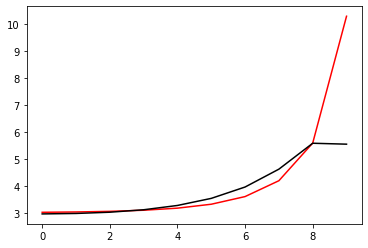

60500 0.06362392890560772
[2.72979662 2.76754015 2.84087047 2.95966716 3.14546028 3.43485043
 3.88780487 4.59672497 5.62576501 5.59429174]


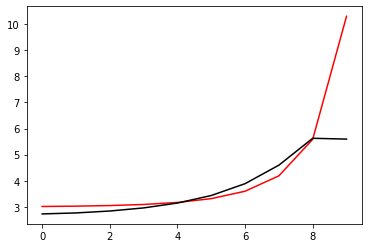

61600 0.0230700316915696
[2.96602967 2.96536657 2.99768224 3.07339496 3.20881879 3.432023
 3.7876613  4.34108266 5.13360179 5.11711512]


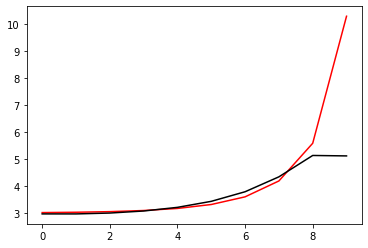

62700 0.011746087443578287
[2.99244107 3.0021214  3.03939968 3.11961744 3.26036957 3.49017417
 3.85496489 4.42261432 5.23626945 5.21553187]


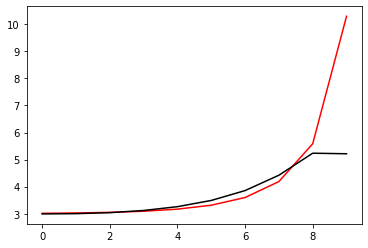

63800 0.021158665288019494
[3.01352483 3.02706028 3.0658705  3.14596169 3.28724707 3.51954462
 3.89079208 4.47301892 5.31325267 5.29076515]


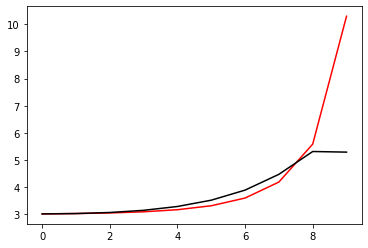

64900 0.011486631532812722
[2.95632919 2.97180589 3.01393692 3.09838314 3.24798319 3.49712386
 3.90032576 4.53974669 5.46929217 5.43355149]


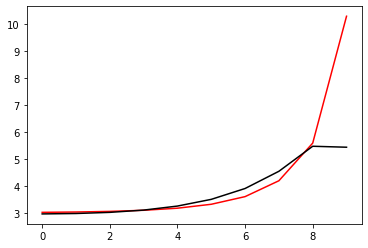

66000 0.03166019195858755
[2.92567745 2.95415318 3.01470945 3.11753091 3.28491804 3.55289891
 3.97846929 4.6473466  5.61830702 5.62757896]


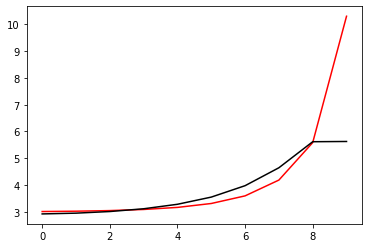

67100 0.050033741385570436
[2.97121714 3.00420951 3.06726848 3.17076072 3.3329719  3.5814398
 3.94074244 4.35836945 5.04550763 5.04028903]


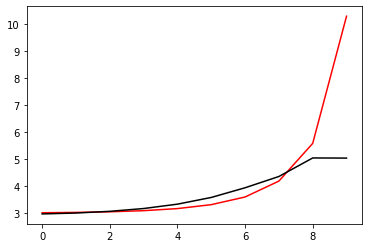

68200 0.012287213784661227
[2.97876904 3.0087269  3.07130446 3.17603806 3.34163407 3.59746531
 3.9795599  4.50909134 5.17233415 5.14994083]


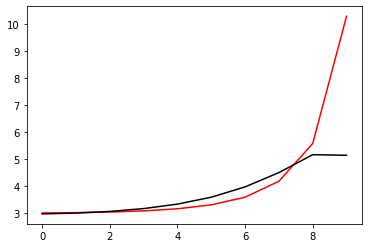

69300 0.029835600018650425
[2.9688296  2.99607887 3.05740836 3.1634078  3.3332684  3.59945733
 4.01468552 4.65046044 5.35451683 5.35385713]


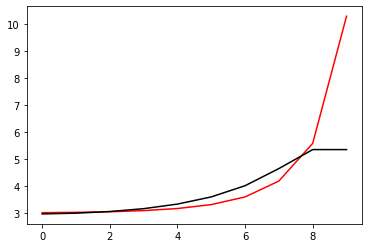

70400 0.01565466957930415
[2.89556389 2.92267972 2.98506877 3.09600284 3.27771303 3.57085927
 4.05308806 4.84236902 5.69389693 5.65090438]


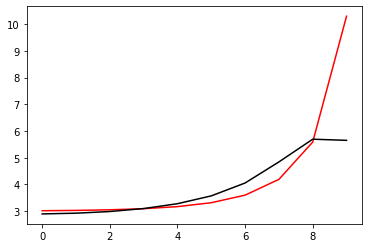

71500 0.022112356549227233
[2.94768036 2.97211317 3.03326756 3.14609409 3.33541528 3.64640353
 4.15807394 4.96267759 5.9211812  5.97445618]


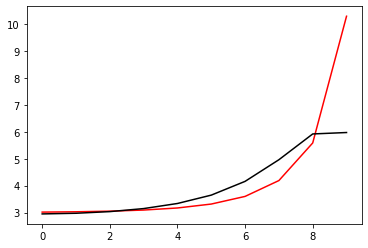

72600 0.016523725652011285
[2.99899396 3.02713122 3.09057308 3.20515012 3.3985868  3.7161557
 4.21591157 4.93668784 6.04687151 6.25680541]


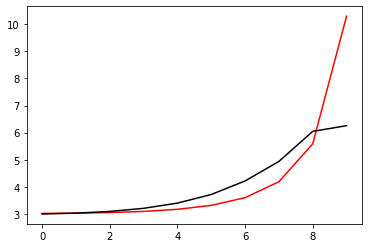

73700 0.01186307950457905
[2.92513088 2.96600317 3.04315246 3.16527173 3.35108253 3.6295906
 4.04389172 4.67278818 5.70103342 5.6970778 ]


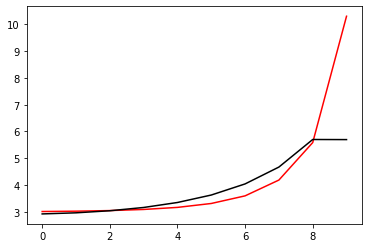

74800 0.021959394614562415
[2.95806387 2.98942184 3.0591315  3.17881962 3.36816985 3.66130539
 4.11711017 4.83508535 5.92283765 5.95377911]


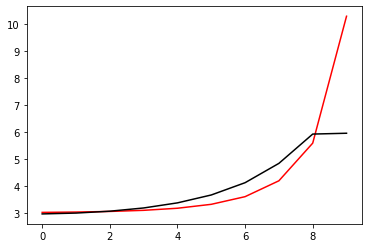

75900 0.011608114192900585
[2.90757559 2.89771713 2.92449709 3.00597053 3.1655774  3.44232768
 3.89558543 4.58620959 5.62244973 5.64573656]


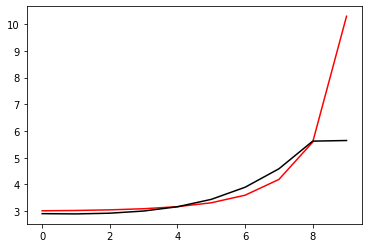

77000 0.031757366632437396
[2.94282882 2.95286137 2.99067387 3.07983848 3.24702642 3.53177077
 3.99432067 4.70751859 5.76785428 5.77309011]


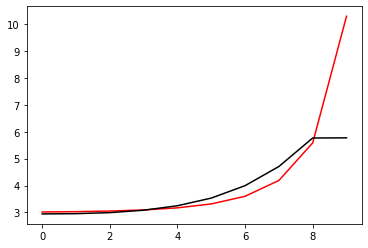

78100 0.04915796260062588
[2.97439209 2.99009957 3.03277715 3.12229743 3.28648431 3.5655852
 4.02062205 4.73751925 5.80762905 5.78602495]


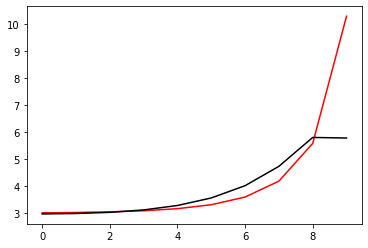

79200 0.012188318814087764
[2.97398806 2.99364099 3.04277186 3.13864227 3.30856774 3.59547076
 4.06723019 4.82605983 5.95489649 5.97601129]


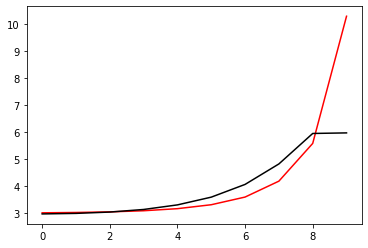

80300 0.030450340724457636
[3.00213082 3.03136295 3.08759327 3.18616827 3.35127898 3.61744994
 4.0201005  4.51880291 5.29808134 5.29845587]


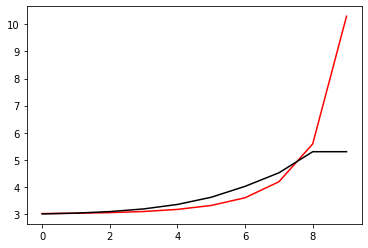

81400 0.022851159254632315
[2.9762385  3.00339751 3.06093538 3.16200614 3.33055916 3.60225501
 4.02237739 4.63712647 5.42168677 5.37847061]


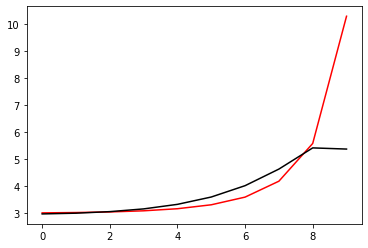

82500 0.021620031373947003
[2.94660503 2.97155162 3.02875324 3.13092308 3.30072415 3.57422034
 4.007702   4.69440565 5.53967193 5.58721776]


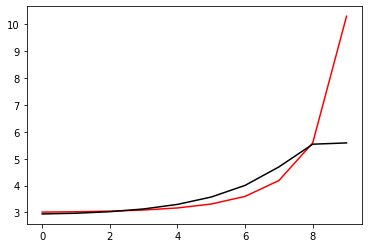

83600 0.027992431639192985
[2.84746393 2.88384583 2.95254826 3.06628032 3.24845417 3.5395378
 4.01041021 4.74754403 5.73085692 5.8588549 ]


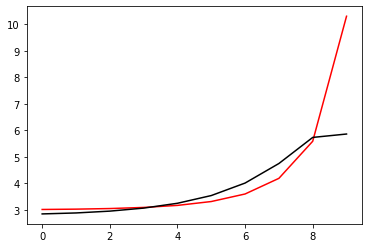

84700 0.05126253399177269
[2.79342272 2.8251205  2.89515036 3.01231763 3.19946004 3.50162111
 4.00653042 4.82977182 5.56238374 5.63799229]


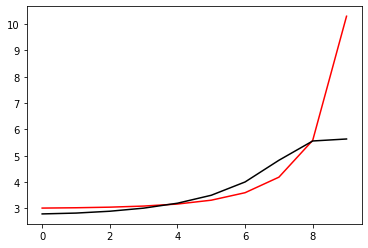

85800 0.01195824181095827
[2.87603326 2.90145428 2.96524725 3.07778083 3.26134226 3.56017573
 4.0588537  4.86560233 5.60202661 5.60048635]


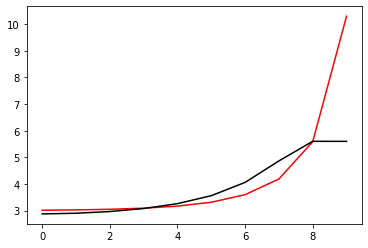

86900 0.012047223265326873
[2.8890043  2.91785058 2.98411824 3.10038693 3.28966644 3.59674266
 4.10477095 4.91657494 5.70042898 5.7039986 ]


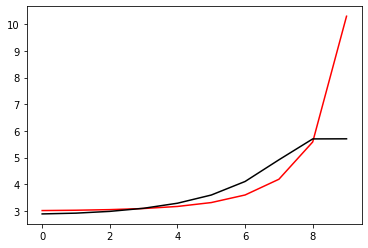

88000 0.03225468449967355
[2.87324685 2.90580812 2.97599766 3.09726421 3.29385307 3.61106258
 4.12994911 4.94895785 5.80777148 5.80181212]


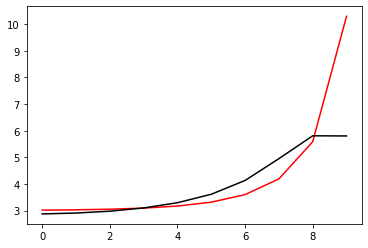

89100 0.03474894829462016
[3.01702689 3.04243183 3.10379431 3.21879814 3.41364296 3.73406403
 4.25715188 5.07319273 6.0006422  5.8826932 ]


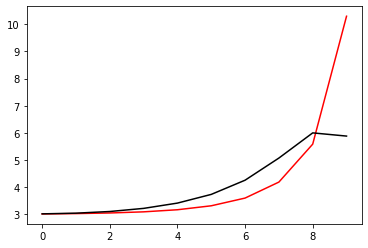

90200 0.02773221978039567
[2.80295083 2.83583371 2.90666178 3.02954499 3.23029968 3.55377552
 4.07539468 4.89354645 5.92095415 5.84394325]


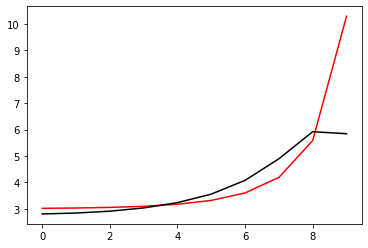

91300 0.02323250698226884
[2.95299015 2.95209731 2.98410293 3.06560228 3.2179131  3.47622914
 3.89497809 4.53635352 5.34846655 5.33414571]


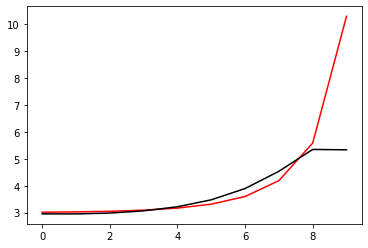

92400 0.019510990929996072
[2.94855794 2.95866751 2.99682251 3.0833551  3.24206373 3.50938615
 3.94196008 4.60853852 5.47244463 5.46805479]


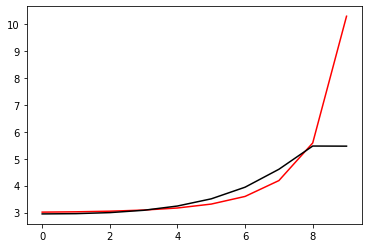

93500 0.021535995510060617
[2.95406604 2.9701317  3.0131359  3.10162984 3.26134144 3.53025336
 3.96695573 4.64811702 5.56117623 5.6031357 ]


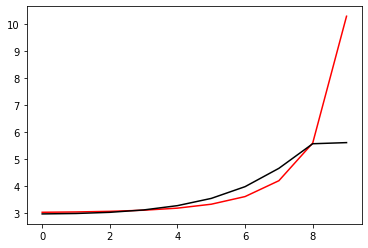

94600 0.614735575442707
[3.2203321  3.23434494 3.27719915 3.36535895 3.52460854 3.79280439
 4.21946918 4.83544973 5.65769407 5.81709122]


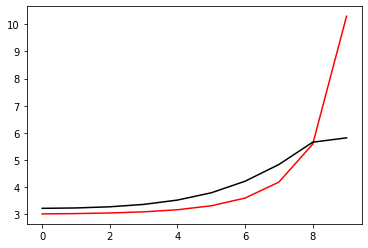

95700 0.011203223033422992
[3.046097   3.04819747 3.07111812 3.13527482 3.26543226 3.49733837
 3.88098824 4.4707824  5.32538909 5.32984231]


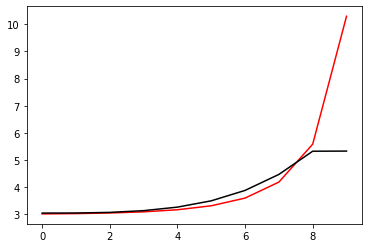

96800 0.02124807399606629
[3.02010378 3.0290554  3.0579399  3.12639439 3.26131659 3.50131542
 3.90273984 4.53793926 5.45463657 5.45239872]


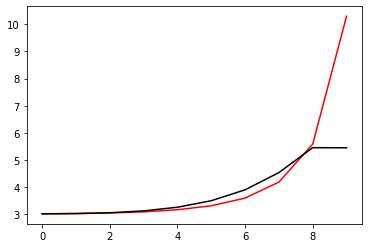

97900 0.011570931904447482
[2.93396329 2.94440578 2.98001    3.05731815 3.20440153 3.46542065
 3.90940525 4.63277564 5.67668597 5.62193859]


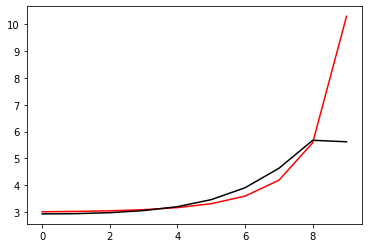

99000 0.032193913191135966
[2.95779244 2.96424174 2.99128364 3.05670466 3.1846038  3.41219168
 3.79679586 4.42598225 5.38347046 5.29008683]


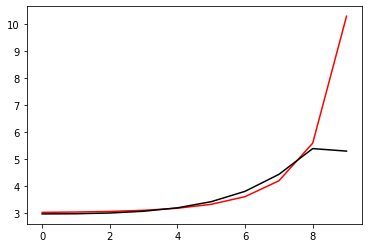

100100 0.046353383796778086
[3.04376678 3.07777134 3.13612487 3.23461682 3.39965914 3.67273602
 4.11943827 4.833244   5.85980744 5.76090847]


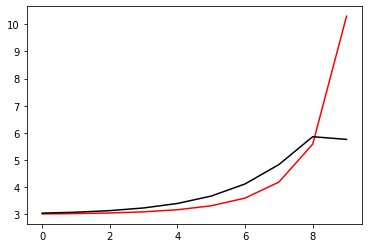

101200 0.012382477637492603
[2.95943257 2.9854875  3.04271777 3.14298252 3.30987648 3.58450201
 4.03524548 4.76717812 5.84906849 5.76329968]


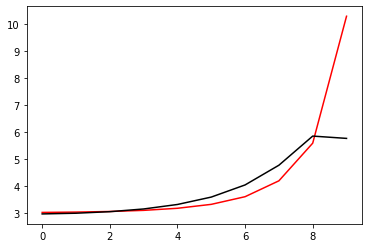

102300 0.029777880193240847
[3.00984111 3.04375218 3.10694826 3.21054886 3.37530675 3.63447136
 4.0270764  4.51641371 5.21951492 5.20501898]


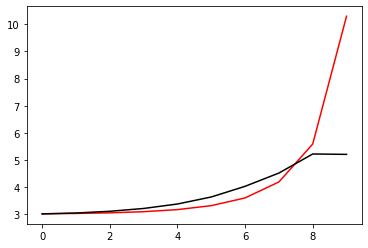

103400 0.026046205943206745
[2.98516175 3.01982752 3.08697054 3.19606623 3.36804215 3.63777259
 4.05432763 4.66081213 5.35577443 5.31250683]


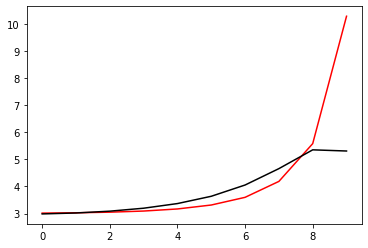

104500 0.021648583809612182
[2.93531378 2.9647298  3.02938259 3.13879409 3.312767   3.58636348
 4.01836001 4.70484739 5.49882761 5.54537417]


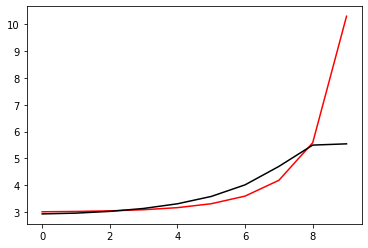

105600 0.014251713623519685
[2.89625566 2.94849512 3.03428597 3.16519864 3.36319889 3.66923211
 4.15872253 4.86715583 5.66291677 5.85855497]


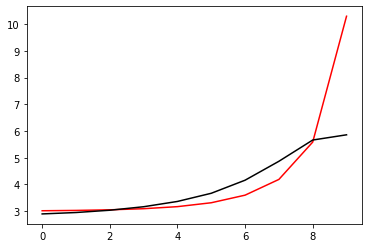

106700 0.011966808766300777
[2.91063009 2.95418927 3.03735727 3.16406695 3.35152077 3.63413104
 4.07036488 4.72004523 5.32909371 5.31047035]


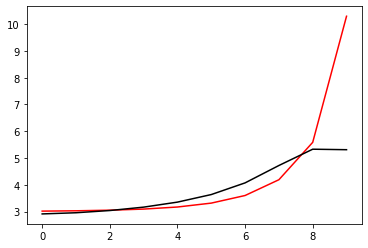

107800 0.013207749726447338
[2.79998687 2.85144478 2.94599859 3.08946239 3.29992416 3.61474039
 4.09869702 4.8240094  5.60396545 5.58003313]


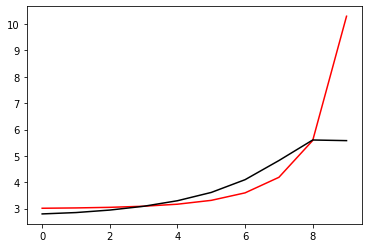

108900 0.012357892799833663
[2.91324534 2.95120262 3.03448241 3.17214138 3.38288023 3.7029784
 4.19409933 4.93107371 5.80618854 5.80582764]


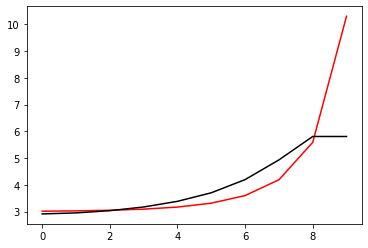

110000 0.03169017672601273
[2.93135582 2.96899539 3.04928409 3.18046968 3.3781493  3.66963013
 4.0934883  4.67729281 5.35414013 5.35384021]


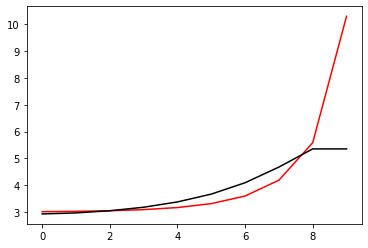

111100 0.036111710761651546
[2.95967251 2.99571748 3.07513532 3.20791002 3.41121838 3.71499045
 4.16564623 4.80781046 5.53995854 5.48528933]


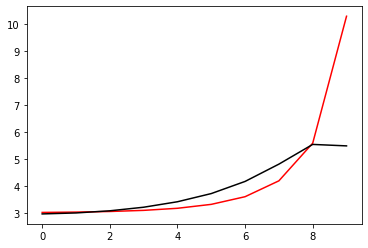

112200 0.012378937788286066
[2.93380836 2.96748679 3.04463258 3.17674758 3.38257333 3.69435594
 4.16555308 4.86448059 5.71188843 5.71252528]


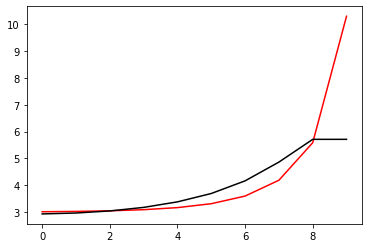

113300 0.02907422471927798
[2.9788734  3.00945907 3.07995595 3.20332437 3.3975656  3.69184542
 4.13323421 4.78448067 5.61589241 5.57314346]


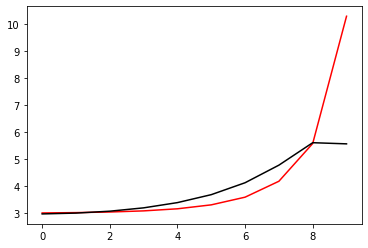

114400 0.4400335962397183
[2.59457607 2.62965371 2.70541299 2.83578568 3.04245253 3.36122971
 3.85196488 4.58915442 5.51606038 5.99706674]


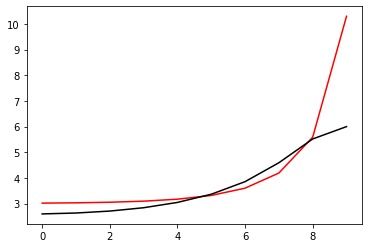

115500 0.02153623041113257
[2.91063815 2.93301495 2.99392804 3.1061051  3.28748374 3.5661763
 3.98545397 4.59352452 5.34590268 5.34265085]


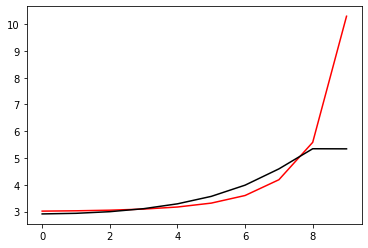

116600 0.02054729774494545
[2.90663109 2.93402551 2.9989771  3.11536888 3.30266948 3.59128878
 4.02855625 4.66875932 5.4603349  5.44217122]


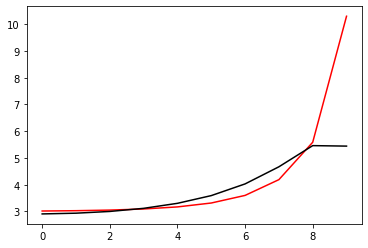

117700 0.10561064532932485
[2.74797449 2.75598919 2.80316458 2.90164269 3.07104584 3.34136189
 3.75542543 4.35072733 5.09264129 5.47338477]


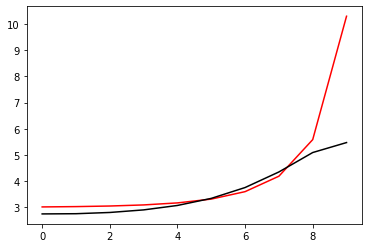

118800 0.011454922528581756
[2.92402863 2.9269807  2.96440248 3.05212446 3.20873475 3.46229654
 3.85285945 4.4165531  5.11838364 5.11368655]


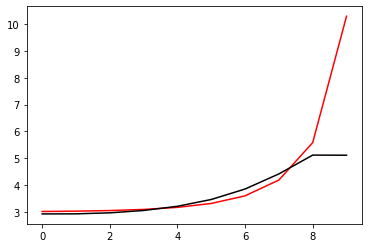

119900 0.011599764459478336
[2.9655509  2.97755695 3.01997266 3.11147837 3.2723036  3.53137479
 3.9300817  4.50938079 5.23883256 5.23046396]


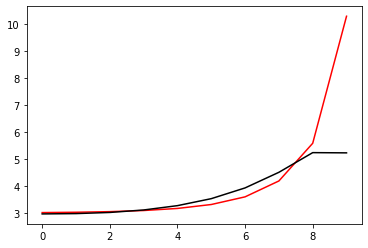

121000 0.0313587025092307
[2.96941467 2.98521164 3.02978129 3.12124563 3.28197176 3.54277439
 3.94775626 4.54601522 5.31685633 5.29779724]


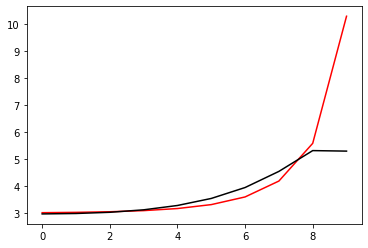

122100 0.050753830914412976
[2.95124893 2.96934793 3.01689985 3.11060346 3.27453304 3.54341287
 3.96777189 4.61044315 5.46656887 5.44638405]


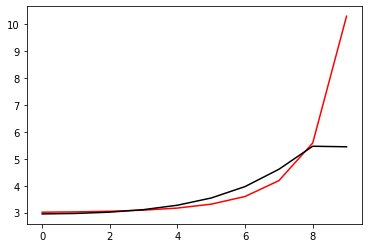

123200 0.011869793344714896
[2.98680742 3.01777002 3.07844004 3.17948894 3.34150787 3.59593887
 3.98943749 4.58568558 5.4040835  5.37971419]


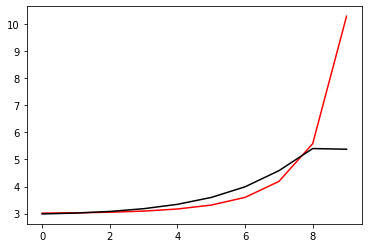

124300 0.02888193934718875
[2.88211651 2.9019412  2.95582369 3.05890102 3.23539684 3.52695217
 4.00378805 4.764587   5.80462982 5.78467466]


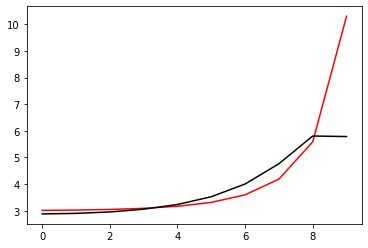

125400 0.02122205587601193
[2.9592275  2.9864499  3.04406284 3.14618436 3.31542482 3.58708978
 4.01260743 4.64443799 5.45840483 5.40329253]


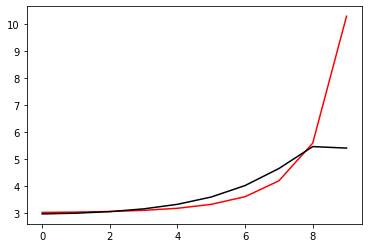

126500 0.02171164060182576
[2.94385249 2.9696045  3.02831116 3.13317965 3.30715099 3.58775467
 4.0346681  4.73002758 5.63772169 5.64722431]


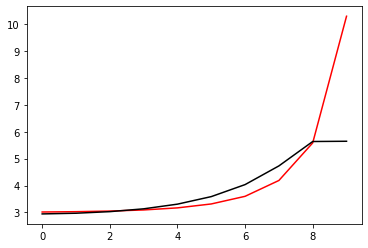

127600 0.012375010293927026
[2.98924438 3.01217959 3.07190598 3.18327075 3.37181306 3.68218909
 4.19296714 5.01359046 6.04976115 5.93462505]


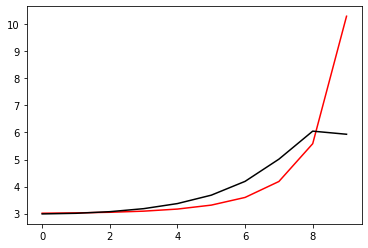

128700 0.012636027457087992
[2.9120555  2.93807053 3.00110181 3.11913059 3.3215459  3.65907692
 4.21996089 5.13250538 6.37943783 6.40749934]


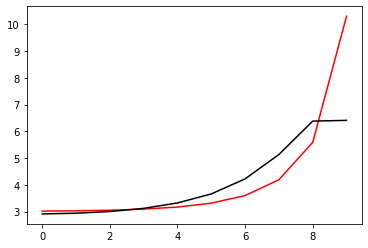

129800 0.012230964715282382
[2.88787032 2.9124685  2.97487735 3.08975442 3.28354137 3.60141543
 4.11282251 4.88750614 5.98120278 5.97148537]


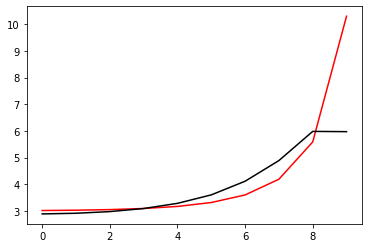

130900 0.01235402502407672
[2.86135768 2.89177452 2.95934267 3.08077308 3.28328285 3.61235556
 4.13888741 4.94675488 6.08931033 6.0963076 ]


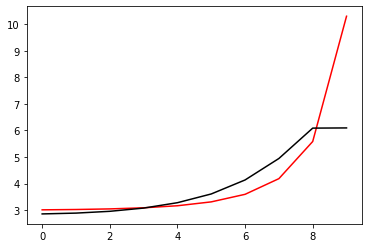

132000 0.032114579174659985
[2.95765742 2.97555913 3.02812981 3.13543628 3.32545491 3.64310174
 4.16020023 4.97603712 6.14848791 6.15842955]


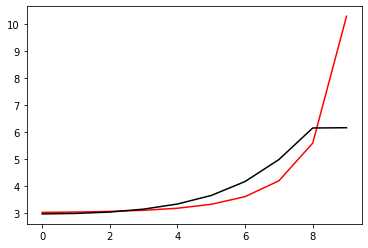

133100 0.04719185343334902
[2.88577161 2.91040988 2.9664114  3.07114715 3.24923594 3.53797837
 3.9935381  4.69294332 5.70276608 5.6954083 ]


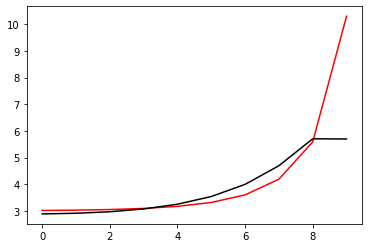

134200 0.017066727884245847
[2.89332199 2.91946676 2.97820734 3.08620698 3.26894356 3.56542484
 4.03530364 4.75996243 5.7921793  5.77303127]


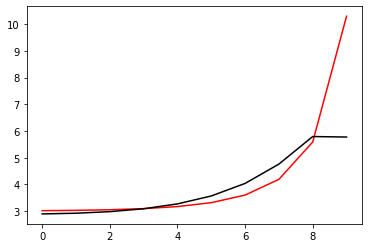

135300 0.022870525816929582
[2.91780509 2.94162603 3.00104212 3.11085063 3.29697908 3.6001728
 4.08372767 4.83470872 5.89490065 5.93638755]


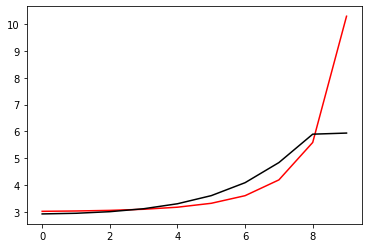

136400 0.012111680199688474
[2.85258485 2.88140264 2.94684245 3.06485357 3.26220401 3.58317221
 4.10021243 4.91649062 6.05676531 6.02552079]


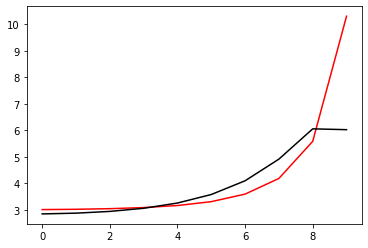

137500 0.02866803156526153
[2.79889553 2.83014924 2.89683709 3.01100058 3.19534498 3.48663007
 3.93927532 4.61626149 5.54414593 5.62123497]


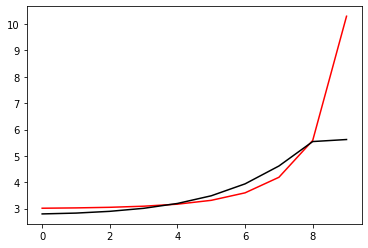

138600 0.023753872995097777
[2.88518976 2.90976854 2.97043619 3.08000091 3.26071422 3.54875669
 3.99762408 4.66947712 5.58716104 5.57090803]


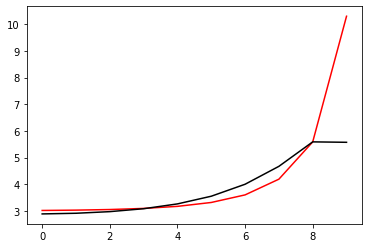

139700 0.012384704032940941
[2.91773867 2.9433923  3.00508658 3.1167141  3.3008767  3.59434847
 4.05224432 4.74041333 5.67613615 5.66204624]


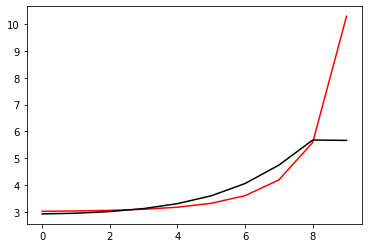

140800 0.011971585488131311
[2.87244825 2.9054587  2.97529971 3.09435022 3.28556483 3.58645573
 4.05465581 4.76440298 5.73605625 5.78890624]


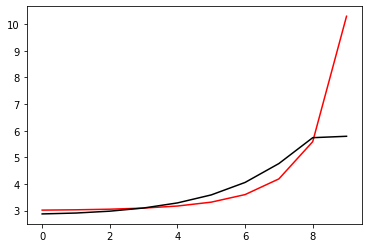

141900 0.015576587510310594
[2.98703697 3.01186135 3.07414228 3.18718348 3.37343973 3.6697643
 4.13309241 4.8396074  5.8183709  5.89501252]


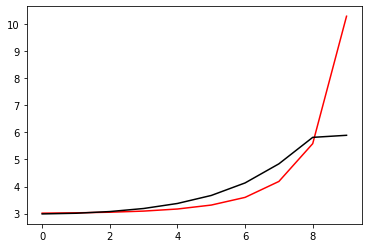

143000 0.0482139169724897
[2.8579687  2.87669804 2.92981003 3.02754459 3.18752558 3.43804549
 3.82229108 4.40120485 5.22975586 5.25567021]


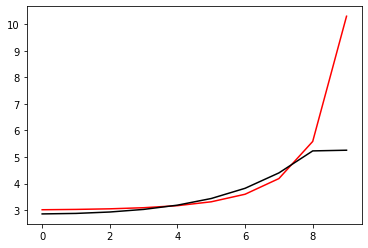

144100 0.05019847709596625
[2.91948475 2.94497359 3.00297668 3.10577949 3.27164155 3.52957831
 3.92507793 4.52426774 5.37846683 5.37079896]


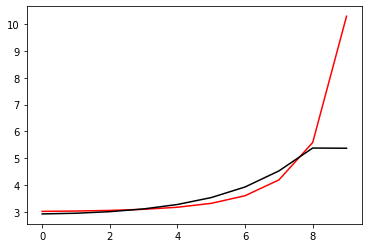

145200 0.028755192620006552
[2.85149549 2.8513823  2.88304557 2.95902899 3.09583748 3.31861422
 3.66454874 4.18445013 4.93174642 4.94009248]


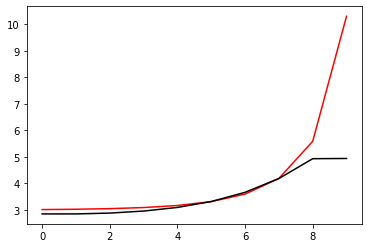

146300 0.024629779056988214
[2.95977386 2.96434421 2.996458   3.07248859 3.2097467  3.43361559
 3.78199449 4.30746791 5.06107992 5.0441198 ]


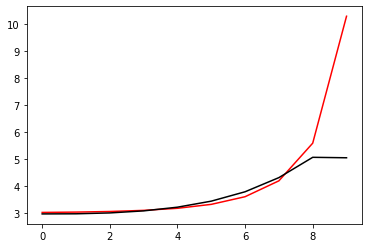

147400 0.021021952934542853
[2.975779   2.98760188 3.02498752 3.10509003 3.24749319 3.47943716
 3.84179026 4.39253493 5.18246544 5.15470643]


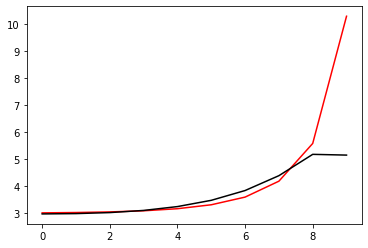

148500 0.021239335713119974
[2.95964072 2.97422406 3.01451022 3.09672977 3.24274076 3.48339814
 3.86510275 4.45511531 5.30576472 5.38376016]


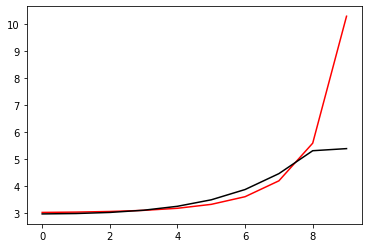

149600 0.012248619858326773
[2.9852343  3.00539409 3.0523041  3.14105872 3.29467019 3.54803663
 3.95512293 4.5955987  5.52474487 5.44203112]


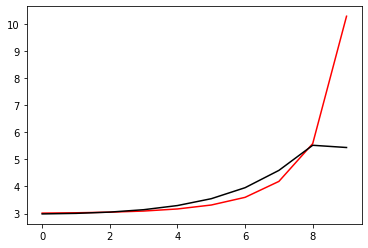

150700 0.03913485288591971
[2.85048606 2.86908751 2.91545391 3.00106127 3.14664934 3.3851563
 3.77056846 4.39869957 5.37977031 5.53582521]


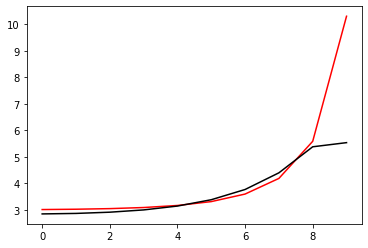

151800 0.06272605531058395
[2.76341948 2.79529269 2.8529008  2.9491344  3.10439419 3.35234052
 3.75070328 4.39384744 5.3624192  5.37884383]


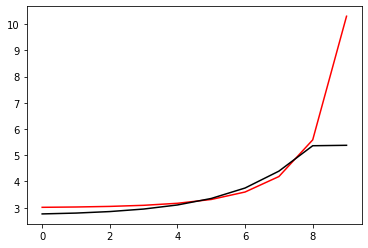

152900 0.011701483978006754
[2.93294691 2.96208261 3.02673511 3.13330652 3.30005434 3.56029359
 3.97097349 4.62223655 5.57647319 5.52757127]


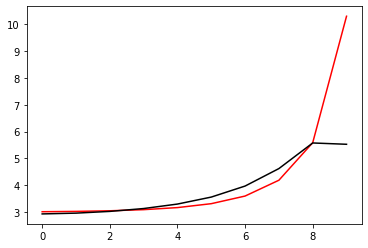

154000 0.05079319205251221
[2.87434887 2.87030328 2.90035921 2.9762039  3.11455735 3.34451747
 3.7095859  4.25518843 5.09245084 5.10628776]


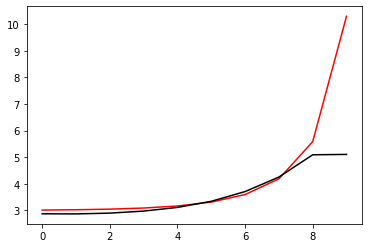

155100 0.050729763916495633
[2.99736723 2.99499887 3.01796084 3.08537517 3.21540384 3.43626795
 3.7908633  4.33010203 5.15456549 5.1545987 ]


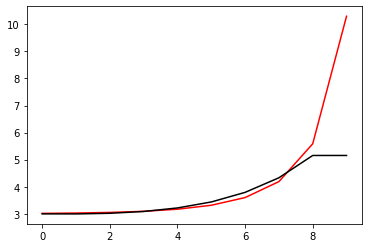

156200 0.012813019345628077
[3.01817305 3.02502332 3.05338637 3.12307671 3.25642537 3.48410496
 3.85225654 4.4228783  5.28538902 5.24339872]


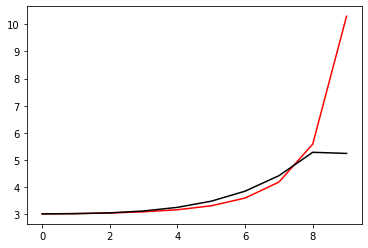

157300 0.02654189198265241
[2.97627474 2.9889726  3.02466014 3.10070312 3.24201397 3.48450286
 3.88211486 4.51255935 5.45445803 5.49680076]


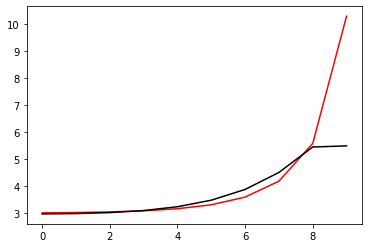

158400 0.014264430751480164
[2.89944407 2.92197014 2.9722719  3.06676494 3.23184943 3.50978608
 3.96764514 4.70289917 5.78039194 5.72974614]


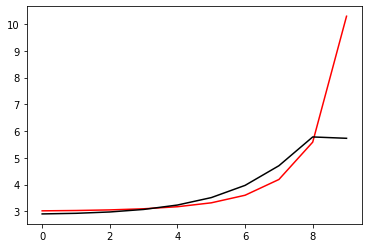

159500 0.038258716136862395
[3.03465347 3.04895722 3.10083256 3.20505023 3.38827416 3.69501103
 4.19611496 4.9984885  6.17611276 6.2844234 ]


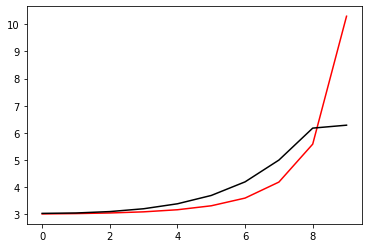

160600 0.02041334675414529
[2.90530807 2.93703034 3.00309018 3.11551444 3.29627428 3.58018699
 4.0156987  4.65613044 5.58703518 5.5599592 ]


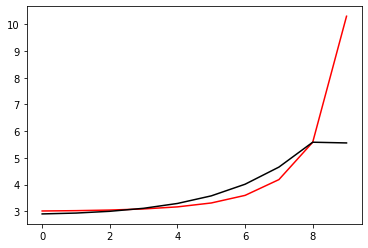

161700 0.012954544352075183
[2.88708955 2.92493993 3.00032203 3.12378938 3.31711684 3.61689036
 4.07834475 4.76478004 5.71364851 5.66881426]


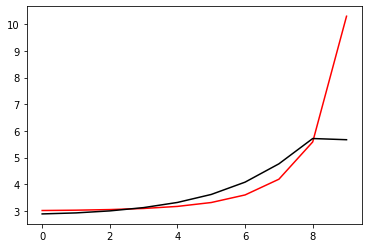

162800 0.021862805867499772
[2.97297971 3.00023273 3.06529897 3.18067228 3.36759157 3.66202429
 4.11980439 4.81949865 5.79467203 5.80637474]


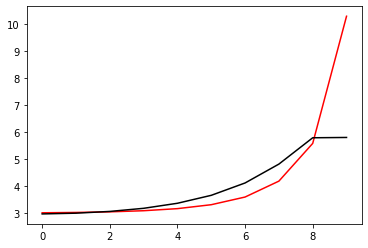

163900 0.012242728821047958
[2.91052182 2.9421162  3.01169647 3.13306612 3.33036317 3.6447005
 4.14552033 4.93747338 6.02533831 6.03359046]


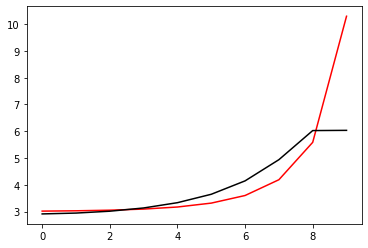

165000 0.032304083940462094
[2.88590821 2.92358286 3.00399986 3.137837   3.34868942 3.67616833
 4.17322506 4.90094663 6.03464091 6.06310277]


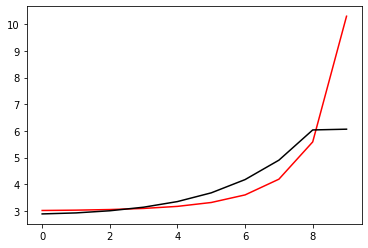

166100 0.049280872939512006
[2.8543443  2.90526231 2.99849748 3.14714649 3.37621069 3.73076374
 4.28313726 5.05198086 5.88095269 5.89894113]


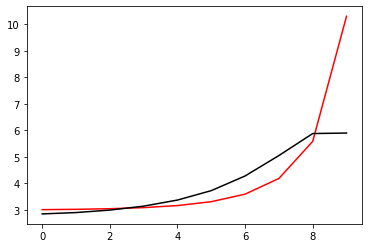

167200 0.014063011680926489
[2.84465773 2.89248174 2.98712562 3.13923309 3.37422875 3.73878225
 4.30765118 5.13948903 6.03699178 5.99593746]


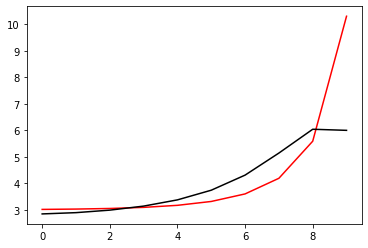

168300 0.024874453503014128
[2.92060582 2.95762878 3.04484267 3.1936639  3.42943789 3.79928307
 4.37896201 5.23247908 6.19305092 6.28628626]


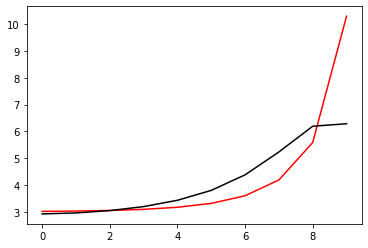

169400 0.01235333744863723
[2.83300519 2.87165841 2.95304651 3.09075791 3.3067603  3.63910739
 4.14522872 4.86058159 5.6479179  5.91755616]


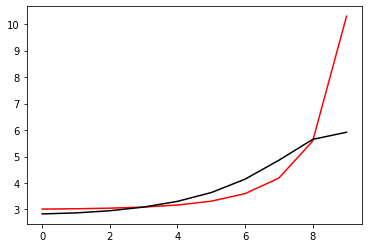

170500 0.021560087172081334
[2.84449591 2.88481518 2.96832595 3.10814195 3.32658443 3.6618811
 4.17133159 4.89237647 5.68904862 5.68693452]


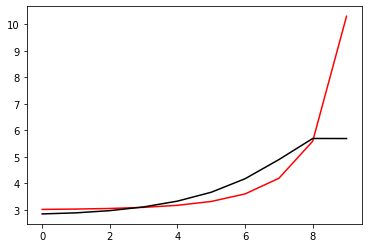

171600 0.01968904746577581
[2.86802211 2.90648279 2.98960627 3.13025277 3.35132669 3.69187657
 4.21047337 4.94974415 5.77338629 5.76500648]


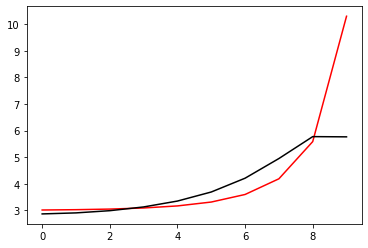

172700 0.012690167054976897
[2.86808523 2.90618675 2.98967431 3.13178203 3.35589471 3.70172422
 4.22941811 4.9914407  5.8626537  5.87985183]


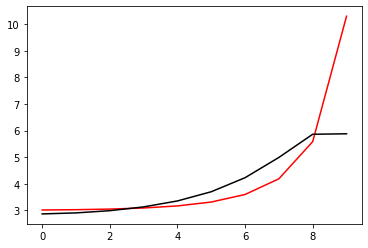

173800 0.012657842211873495
[2.86039919 2.89944351 2.98477121 3.13043589 3.36086371 3.7173015
 4.26353392 5.06578048 6.01644731 6.02157934]


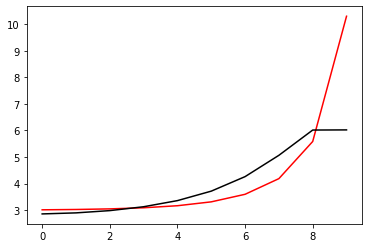

174900 0.014009461103497347
[2.84868696 2.85826547 2.91251335 3.02453358 3.2150126  3.51715631
 3.97748262 4.63566591 5.42463659 5.43573896]


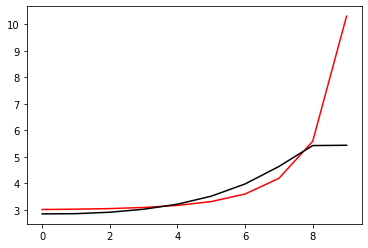

176000 0.03247220706149346
[2.89643484 2.90725431 2.95968214 3.07010397 3.25939264 3.5604543
 4.01948881 4.67700178 5.467422   5.45764033]


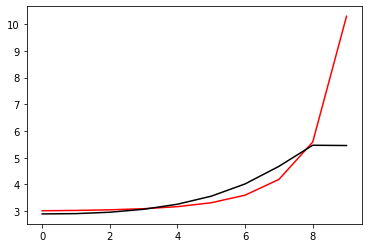

177100 0.04721576805734512
[2.88178474 2.90046472 2.95708468 3.07138393 3.26622709 3.5761415
 4.05058441 4.73685687 5.57148292 5.56479731]


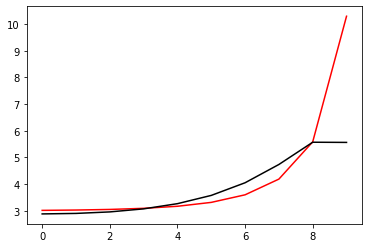

178200 0.013601268985595726
[2.92631399 2.94740014 3.00466432 3.11847375 3.31405717 3.62768651
 4.11178035 4.82156667 5.70127216 5.63671645]


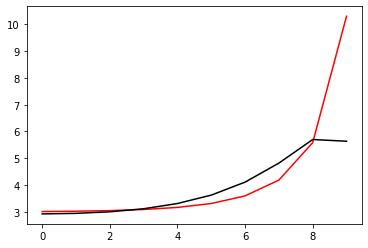

179300 0.024394352314976834
[2.91641471 2.94997581 3.0211891  3.14723398 3.35474154 3.68280981
 4.18835871 4.93693403 5.88488521 5.79042283]


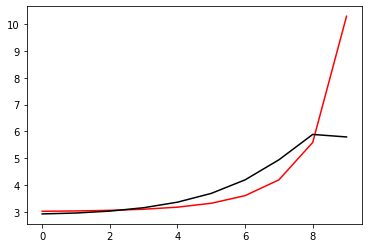

180400 0.012611797165310794
[2.84489678 2.89141121 2.97877726 3.12009272 3.34022247 3.67876804
 4.19575127 4.96702516 5.97046744 5.89383454]


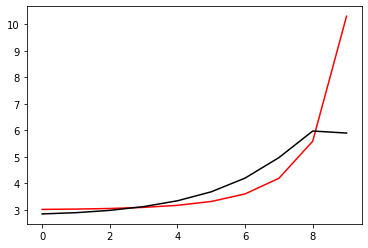

181500 0.02264285908769184
[2.90621942 2.94595674 3.03246001 3.17736759 3.4041908  3.75378267
 4.29122401 5.10385598 6.19101981 6.19888541]


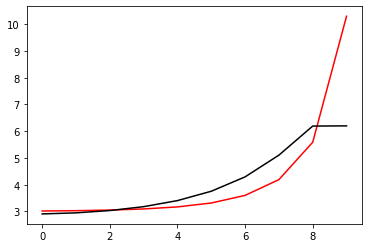

182600 0.013076514785302744
[2.89844507 2.94023394 3.03203308 3.18740483 3.43125998 3.80659382
 4.38390755 5.26015916 6.44139429 6.46602347]


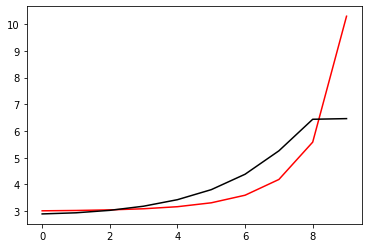

183700 0.012152862492320296
[2.96120337 2.98888156 3.05673341 3.18020022 3.38068978 3.69259214
 4.17399902 4.92491463 6.04504144 6.06485625]


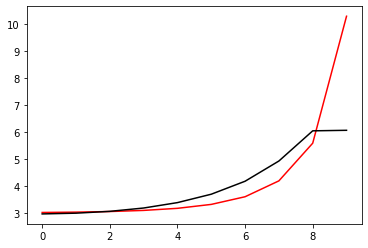

184800 0.02204921641230247
[2.94390886 2.97222875 3.03894907 3.1595263  3.35739183 3.6701206
 4.16016246 4.92616596 6.04523565 6.07348997]


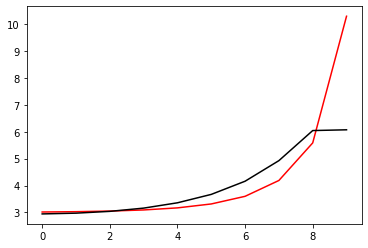

185900 0.011717982396127782
[2.86463423 2.88445367 2.94159388 3.04868333 3.22534964 3.50255288
 3.93081782 4.59203765 5.55987707 5.57062766]


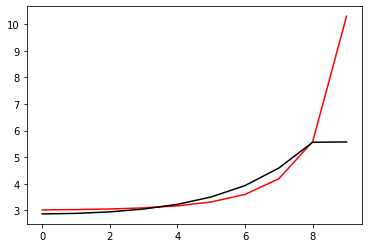

187000 0.03230114235222875
[2.88737278 2.91205869 2.97279415 3.08356437 3.2646282  3.54792363
 3.98545029 4.65979776 5.63944028 5.62419566]


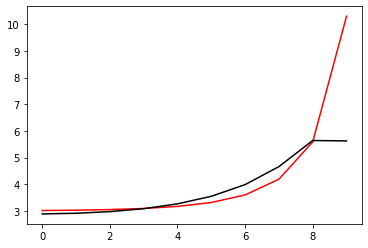

188100 0.04546520321849267
[2.8565634  2.88822417 2.95636171 3.07539593 3.26746288 3.56761832
 4.03326796 4.75323021 5.78871954 5.77811825]


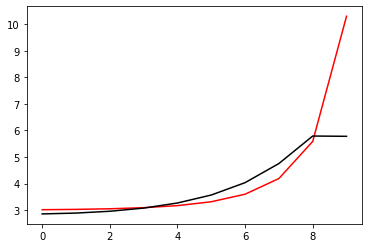

189200 0.013722542686494973
[2.90971725 2.94211199 3.00996548 3.12873221 3.32076437 3.62180012
 4.09042615 4.81734228 5.86259786 6.02289774]


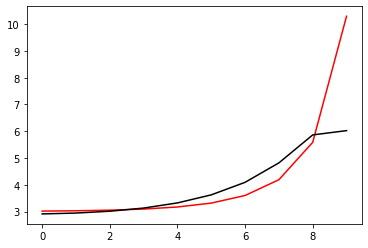

190300 0.02716893984895411
[2.93156956 2.96944964 3.04831647 3.17992462 3.38740596 3.70961498
 4.20972316 4.97983125 6.07014198 6.11953756]


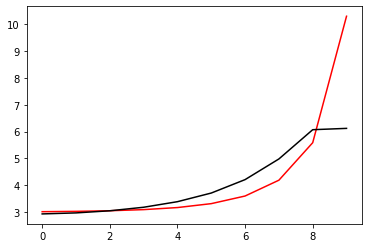

191400 0.014733358877976442
[2.87133091 2.90917398 2.98619918 3.11325311 3.30950884 3.6067558
 4.05386593 4.72136908 5.67040704 5.85549267]


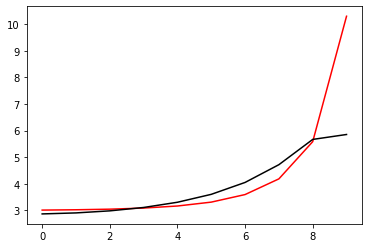

192500 0.02195049311743803
[2.87402814 2.91099009 2.98828815 3.1164074  3.31481775 3.6161494
 4.07171621 4.75529959 5.71852637 5.71571069]


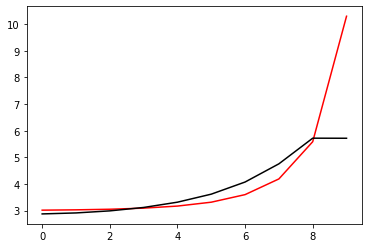

193600 0.020884763411687032
[2.87549337 2.91216775 2.99046567 3.12095024 3.32360487 3.63260234
 4.10323577 4.81439767 5.80327955 5.79527348]


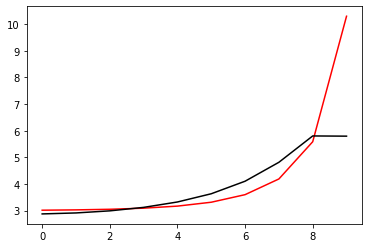

194700 0.012201206669639066
[2.93281768 2.9646827  3.03976984 3.17024694 3.37704214 3.69660665
 4.18900114 4.93732912 5.9588779  5.98180382]


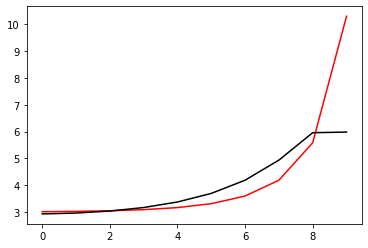

195800 0.022035751875817796
[2.95746613 2.99005408 3.06299916 3.18841698 3.38685131 3.69265223
 4.16239555 4.88116874 5.88881897 5.89667857]


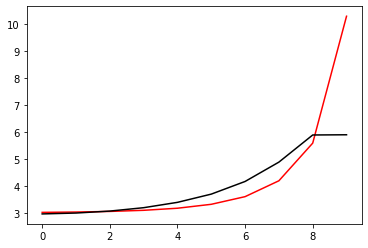

196900 0.012142848442438355
[2.95199859 2.9741938  3.03372693 3.14482372 3.32804176 3.61741098
 4.07041833 4.77746183 5.7907133  5.77734626]


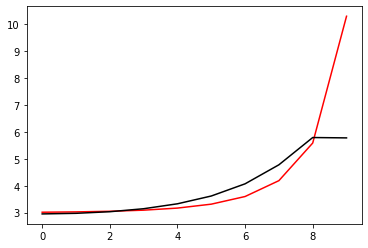

198000 0.03144339716228626
[2.96494067 2.98276822 3.0335009  3.13081552 3.29359426 3.5517402
 3.95477253 4.58145751 5.48807285 5.49452464]


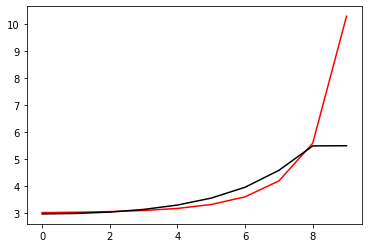

199100 0.050635206117086606
[2.94318046 2.96236432 3.01361663 3.11212372 3.27996756 3.55242955
 3.98897623 4.68468738 5.70030416 5.6857751 ]


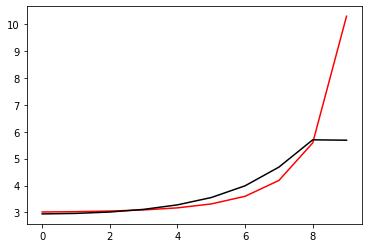

200200 0.016139128680124737
[2.87783893 2.92794175 3.01234921 3.14113112 3.33729099 3.63548407
 4.0742203  4.62322473 5.53400267 5.47814331]


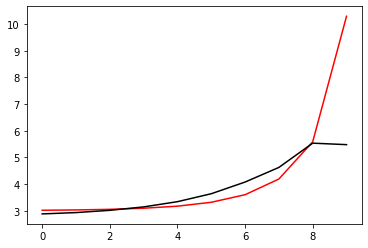

201300 0.0291001705321688
[2.94058848 2.98022053 3.06333144 3.19652121 3.40100429 3.7138369
 4.18784536 4.86882281 5.77484786 5.85959885]


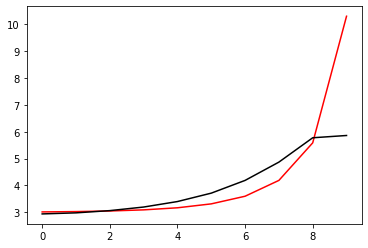

202400 0.018926119839260163
[2.91091243 2.94566011 3.02266843 3.15244914 3.35479816 3.66557191
 4.14461567 4.8689798  5.80491264 5.73491686]


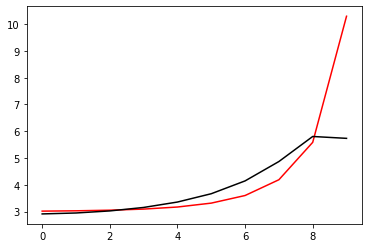

203500 0.021874085250425647
[2.91508148 2.93960237 3.00497737 3.12330476 3.31398748 3.61104221
 4.07149154 4.77417705 5.71228516 5.70366986]


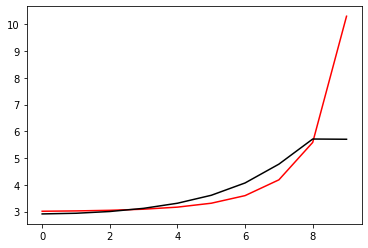

204600 0.013998836590123721
[2.92131407 2.95408347 3.0259584  3.14867649 3.3425994  3.64119572
 4.09946901 4.79775654 5.76187274 5.88033541]


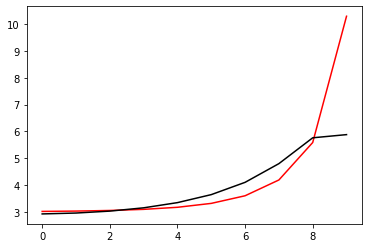

205700 0.012168693388283157
[2.9458696  2.97824213 3.05117153 3.17762064 3.37946502 3.6938094
 4.18274831 4.93796967 5.98359407 5.99647903]


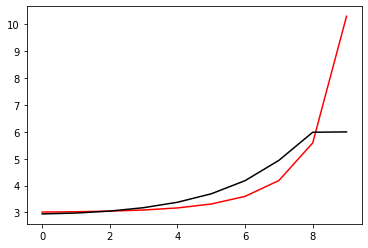

206800 0.021517263445169917
[2.975654   3.01049086 3.0831794  3.20525959 3.39492921 3.67827834
 4.07719265 4.5534469  5.31922284 5.33566463]


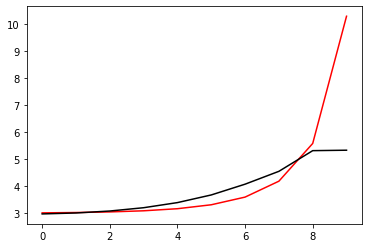

207900 0.013814515344404033
[2.95541165 2.99188675 3.06747827 3.19305656 3.38754826 3.6791006
 4.09978176 4.66488431 5.42389421 5.40929056]


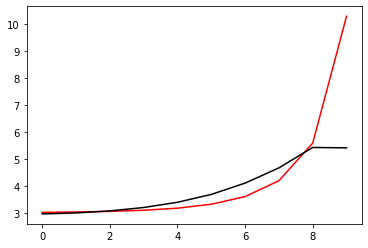

209000 0.03234142486686147
[2.83731123 2.89083259 2.98633574 3.13073228 3.34354407 3.65678212
 4.11844177 4.7812268  5.57211352 5.55543093]


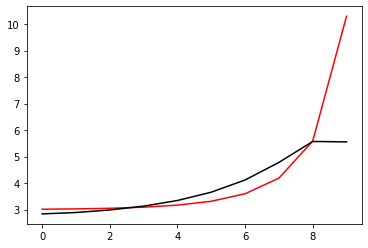

210100 0.030972058141400863
[2.97158111 3.01422582 3.10239669 3.24516929 3.46210247 3.78904491
 4.28338206 4.98886287 5.76402963 5.65043277]


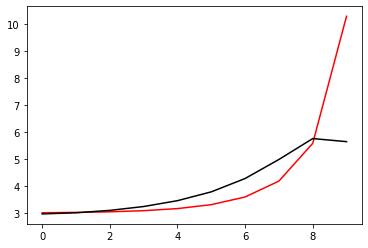

211200 0.032458212743210466
[2.79981505 2.81781768 2.88236701 3.00027011 3.18747261 3.47372059
 3.9040375  4.50134017 5.17856659 5.19732928]


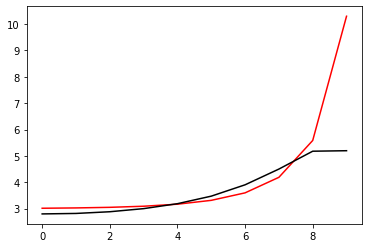

212300 0.023567110548656
[2.92585248 2.94285222 3.00228898 3.11598412 3.30013146 3.58387352
 4.01130108 4.60929113 5.29560953 5.27511456]


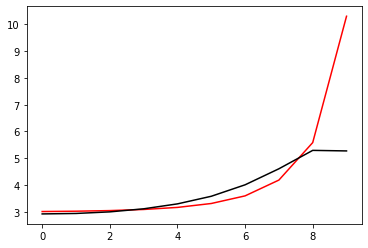

213400 0.015227632242317057
[2.88628375 2.9108681  2.97409059 3.09166367 3.28240786 3.57668951
 4.02033986 4.64988105 5.39457312 5.37860052]


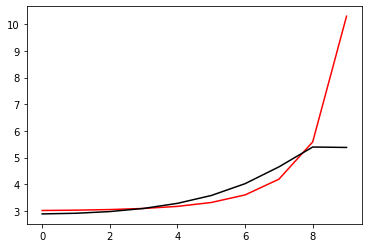

214500 0.021799619623040584
[2.87612872 2.90621482 2.97550274 3.09847671 3.29647574 3.60201755
 4.06354677 4.72988722 5.54768915 5.63141748]


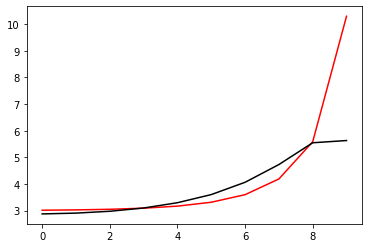

215600 0.01279705340437435
[2.98192625 3.01067338 3.08380019 3.21358453 3.42140329 3.7423666
 4.22966158 4.94633697 5.86051943 5.76382166]


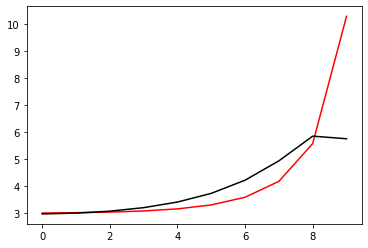

216700 0.01205202299128595
[2.91033283 2.95508474 3.04133394 3.17810401 3.38435345 3.69088404
 4.14530889 4.81020521 5.68203699 5.64064001]


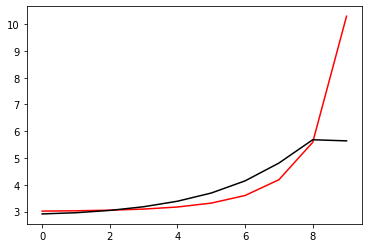

217800 0.01236736215355834
[2.84030652 2.87945126 2.96315266 3.1032979  3.32019705 3.6494836
 4.15090167 4.91155131 5.94650265 5.94257318]


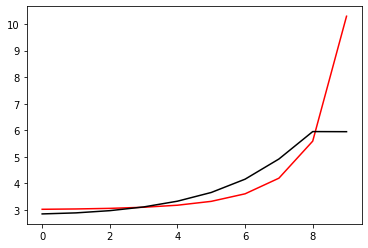

218900 0.011541569533992413
[2.91264436 2.91868543 2.96044596 3.05696409 3.22844355 3.50693389
 3.9421336  4.59138471 5.48347735 5.48879604]


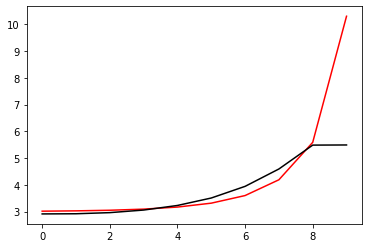

220000 0.031679519859936854
[2.95139792 2.97294319 3.02595144 3.12919096 3.30708717 3.59403729
 4.04212132 4.71863396 5.65327076 5.65721809]


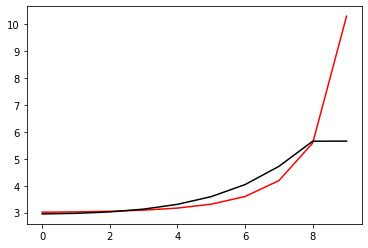

221100 0.038913625820631716
[2.97296129 3.0010215  3.06321615 3.173407   3.35535531 3.64619023
 4.102816   4.80484011 5.78935537 5.73697659]


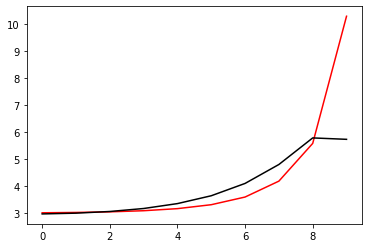

222200 0.012271490528938299
[2.94514045 2.97854471 3.05312214 3.17950869 3.37747973 3.68314718
 4.15759702 4.89351577 5.94363997 5.95162049]


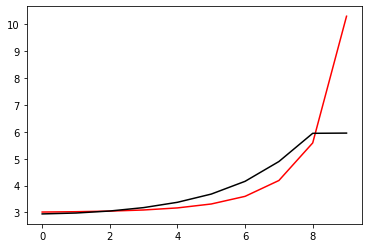

223300 0.02435636875526015
[2.90764884 2.92342513 2.97871608 3.08565044 3.26131974 3.53376012
 3.94721648 4.57418163 5.491653   5.4788761 ]


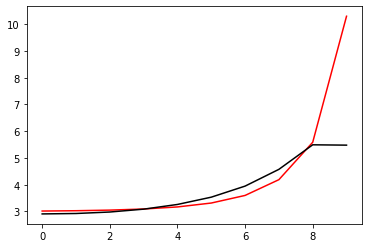

224400 0.018541569911059562
[2.91865429 2.93975589 2.99868878 3.11009645 3.29293534 3.57746593
 4.01219272 4.67252341 5.62135041 5.61724106]


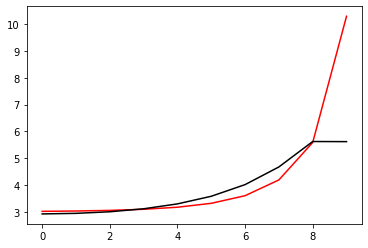

225500 0.021520926470418943
[2.87376635 2.90076991 2.96412755 3.07948737 3.2680738  3.5628858
 4.01792473 4.71640186 5.71375254 5.75881118]


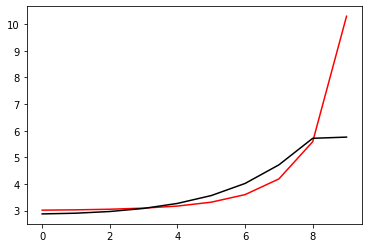

226600 0.012440425755944676
[2.93267947 2.96566735 3.03887478 3.16400226 3.36357284 3.6735421
 4.15086633 4.87980436 5.91000555 5.97627889]


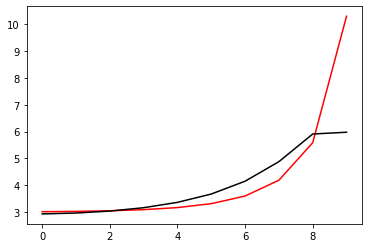

227700 0.011813367456664996
[2.98277095 3.00850083 3.07151782 3.18447673 3.36762525 3.65416121
 4.09819978 4.7845793  5.77619302 5.79117526]


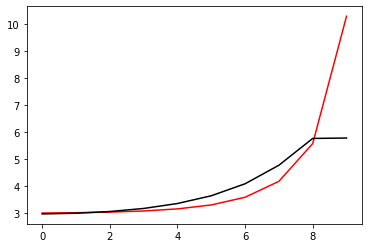

228800 0.02194624518106921
[2.96360049 2.99024474 3.05278249 3.16584834 3.35197761 3.64802893
 4.1162497  4.85577139 5.92768679 5.94225267]


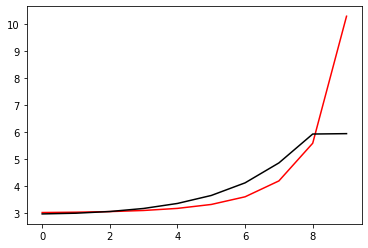

229900 0.012150379290650107
[2.93944467 2.96327138 3.02424096 3.13614595 3.3222326  3.62156408
 4.10032624 4.86411585 5.98497425 5.9425254 ]


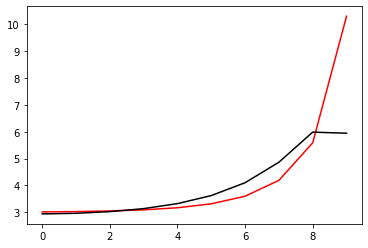

231000 0.03220435765188131
[2.86524924 2.91913792 3.01037569 3.14913176 3.35677671 3.6679344
 4.13465449 4.8228433  5.83026175 5.86421862]


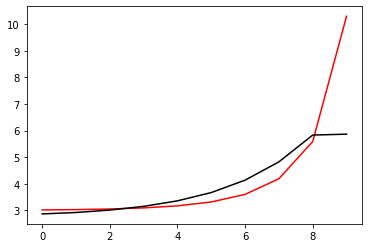

232100 0.04743957629768021
[2.8829762  2.9037458  2.96639778 3.08033236 3.26535803 3.55699755
 4.01340301 4.70520461 5.61517432 5.59621319]


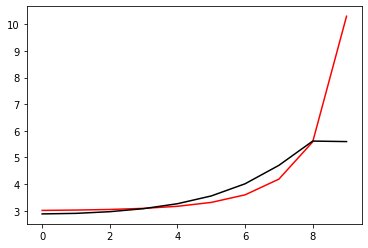

233200 0.011956737096861788
[2.98140936 3.0060622  3.06756468 3.18036464 3.3651542  3.65720225
 4.11427086 4.81141601 5.74254132 5.74029736]


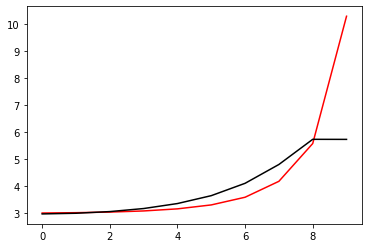

234300 0.030078092108092636
[3.0095882  3.04199264 3.10851709 3.22234731 3.4041901  3.68708072
 4.12429622 4.79116114 5.70276815 5.74083087]


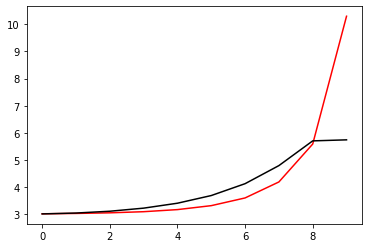

235400 0.019327191574688426
[2.93668911 2.96440646 3.029526   3.14578387 3.33615601 3.63904177
 4.11810276 4.86495209 5.89949534 5.82532436]


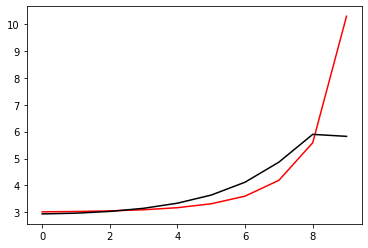

236500 0.016492300943542995
[2.85779826 2.87991408 2.93909173 3.05269996 3.2469517  3.56606774
 4.08572983 4.92053827 6.10539918 6.14047694]


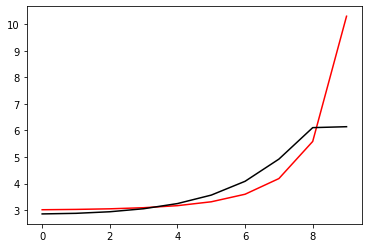

237600 0.012145873506886925
[3.00791704 3.0025736  3.02760792 3.10553843 3.26264132 3.54104921
 4.00696046 4.7343061  5.77148479 5.73699318]


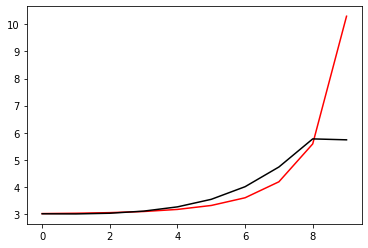

238700 0.013337477283430908
[2.92266616 2.94233536 2.9860095  3.0769145  3.24558913 3.53635297
 4.01730052 4.77785728 5.86600078 5.92019537]


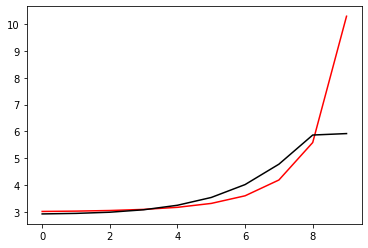

239800 0.02189352549279897
[2.97516008 3.00188638 3.0603199  3.16389632 3.3393154  3.62927118
 4.10008077 4.84614128 5.92155318 5.93144172]


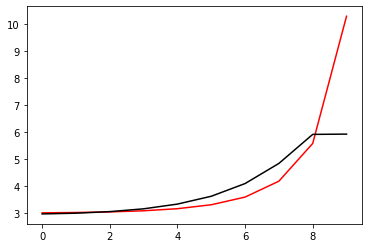

240900 0.0121005522947768
[2.84870211 2.88439243 2.95559841 3.0728937  3.25985284 3.55760888
 4.03376088 4.79109179 5.8984175  5.9138363 ]


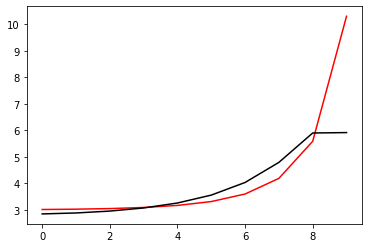

242000 0.03227179175177604
[2.92120069 2.94975211 3.01797484 3.1386605  3.33538208 3.65059006
 4.1576495  4.97324999 6.17715489 6.20993031]


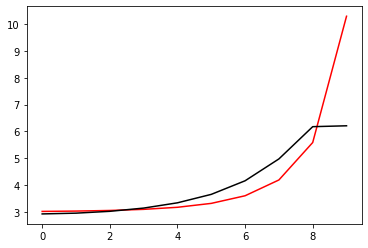

243100 0.04391073459210973
[2.82784171 2.86559205 2.94523629 3.07664872 3.28145437 3.5988129
 4.0967204  4.88402968 6.03839449 5.98442456]


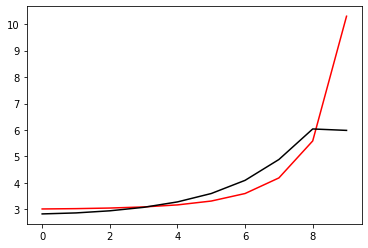

244200 0.030211151698626645
[2.79760449 2.83246176 2.9061635  3.03071785 3.22643175 3.52929517
 4.00237545 4.75013846 5.86266213 6.15073897]


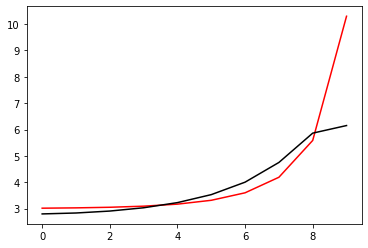

245300 0.0289691649133432
[2.99770077 3.03185808 3.10284828 3.22398636 3.41626507 3.71533357
 4.18278764 4.91717245 5.98824627 5.91236933]


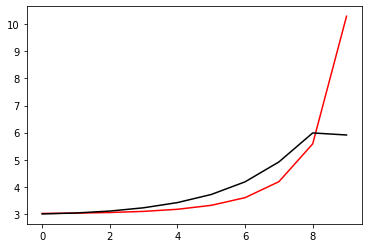

246400 0.01588391983760817
[2.90611403 2.92531096 2.98203896 3.08817097 3.26354365 3.54216799
 3.98329889 4.68502255 5.7265677  5.77317454]


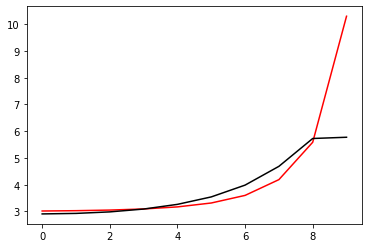

247500 0.028395319139917247
[2.80396884 2.83127444 2.89393334 3.00773343 3.19604977 3.49778398
 3.98084973 4.75749535 5.91587875 5.91936101]


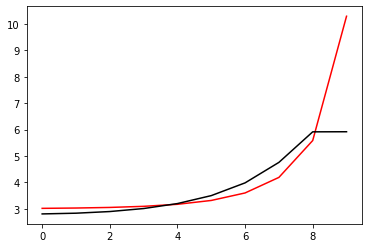

248600 0.030023293647776946
[2.91654781 2.92036836 2.95083628 3.02708041 3.17022902 3.4115581
 3.79964965 4.40526799 5.35234698 5.35957146]


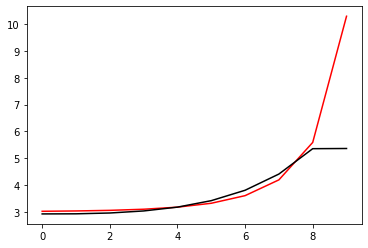

249700 0.01154313255751046
[3.0161616  3.03657385 3.08347346 3.17287232 3.32780913 3.5816356
 3.98573693 4.61816578 5.58553849 5.60230509]


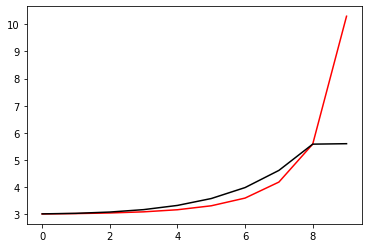

250800 0.021587084428310675
[2.99792885 3.01932227 3.06970338 3.16350756 3.32415203 3.58839303
 4.01477462 4.6946049  5.72226245 5.71074461]


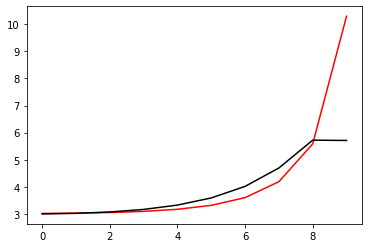

251900 0.011396618787480387
[2.9347686  2.94602017 2.98367544 3.06532853 3.21412037 3.46547609
 3.87399546 4.51974196 5.48034308 5.48016038]


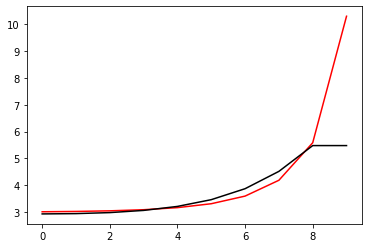

253000 0.03181071524303465
[2.9423476  2.9747138  3.0351207  3.13926531 3.31342157 3.59834844
 4.05871057 4.78566906 5.81601908 5.68856696]


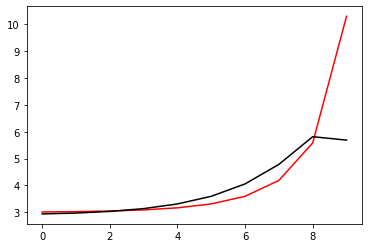

254100 0.044677458128047506
[2.93743628 2.97403937 3.04850927 3.16926555 3.35875135 3.65758182
 4.13228896 4.88101418 5.95066793 5.89105253]


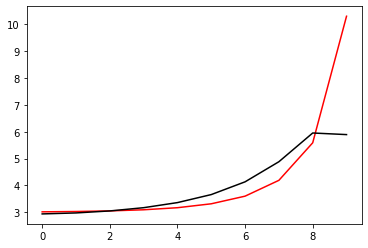

255200 0.02865200529199352
[2.78703637 2.82701624 2.91127127 3.05129709 3.27042953 3.61354263
 4.16135626 5.03446103 6.26334982 6.16703748]


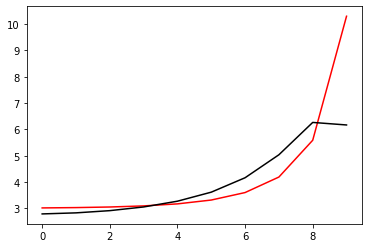

256300 0.029920306920490167
[3.00352412 3.00745112 3.04226496 3.12768597 3.28518602 3.55019978
 3.97858443 4.63616463 5.6330795  5.62684066]


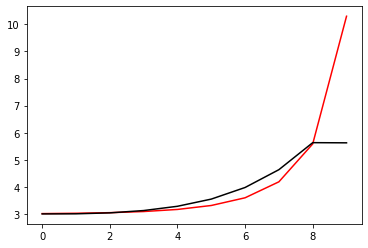

257400 0.018705377627120764
[2.94098099 2.95353992 2.99406043 3.08383933 3.2499395  3.53202562
 3.99169593 4.7132746  5.78528427 5.76616912]


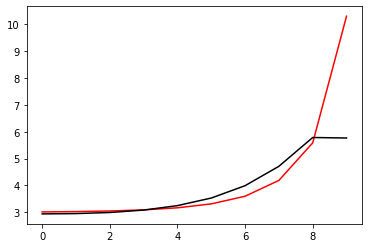

258500 0.04818328739246272
[3.07025651 3.0742737  3.108509   3.19224405 3.35397572 3.63672245
 4.10647501 4.86090911 5.98251746 6.07695744]


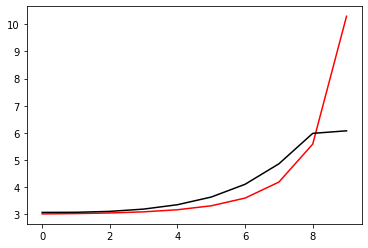

259600 0.018380909486588368
[2.93691017 2.95987749 3.01052344 3.10515695 3.26912037 3.54094036
 3.97998346 4.67192818 5.66314205 5.5802004 ]


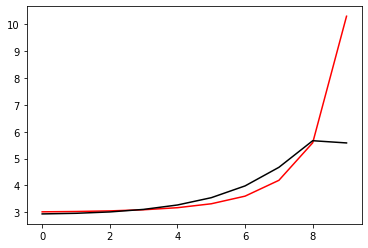

260700 0.012750717682731852
[2.90912875 2.93863874 2.99981066 3.10645648 3.28358151 3.57220146
 4.03826548 4.77400804 5.82785485 5.71771863]


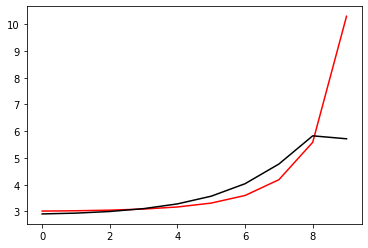

261800 0.02240313303187627
[2.94170115 2.9752679  3.04737583 3.17129815 3.373585   3.70163161
 4.23502244 5.08328628 6.2361826  6.2584876 ]


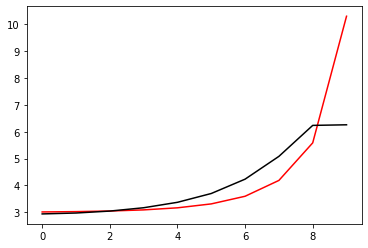

262900 0.0122901874463279
[2.91650905 2.9496383  3.02163567 3.14388462 3.34043639 3.6547644
 4.15957815 4.95396246 6.03846728 6.04408137]


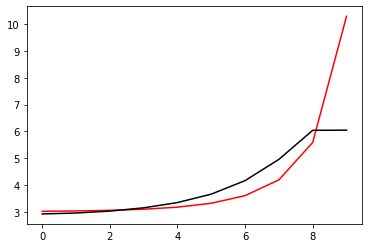

264000 0.03227898482120568
[2.92345809 2.9572004  3.03137309 3.15815323 3.36119099 3.68318814
 4.19648022 5.00478025 6.12659194 6.13328367]


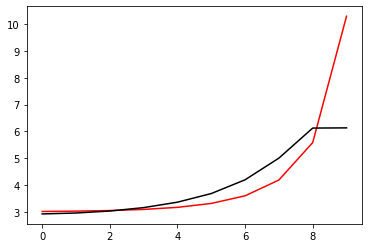

265100 0.04406542712945275
[2.84318799 2.87220849 2.94105816 3.06341107 3.26219732 3.5782353
 4.08144291 4.87575165 5.99422238 5.96696646]


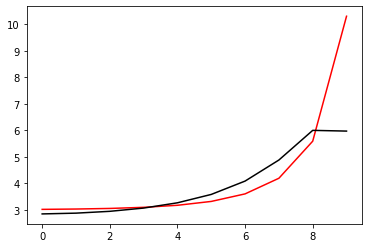

266200 0.30030151846626885
[2.63054531 2.65714028 2.72011218 2.83649384 3.03039151 3.34220843
 3.84043446 4.62866538 5.75147241 6.2324006 ]


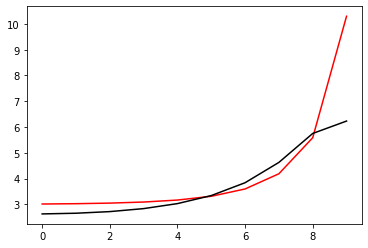

267300 0.022786978997171265
[2.90731747 2.93610547 2.99874169 3.10928886 3.28855727 3.56892058
 3.99940242 4.64475308 5.56317756 5.54596967]


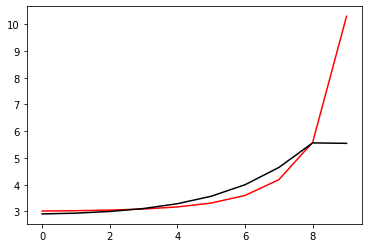

268400 0.017901477451912975
[2.90572923 2.93557666 3.00164015 3.11701468 3.30390419 3.59799903
 4.05606721 4.75194701 5.70179146 5.68746247]


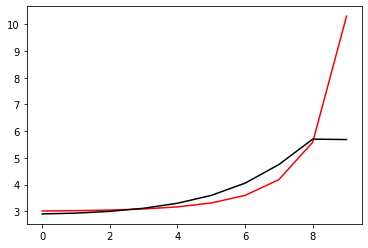

269500 0.021379197227507904
[2.86222191 2.89477611 2.96481733 3.08519857 3.27878243 3.5839087
 4.06424224 4.80915985 5.81655895 5.85470067]


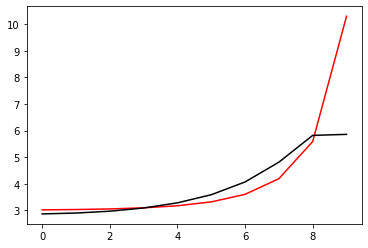

270600 0.01228077534206442
[2.95157391 2.98198753 3.05353715 3.17896115 3.38211285 3.70473179
 4.21485003 4.99825102 6.02903792 6.04406249]


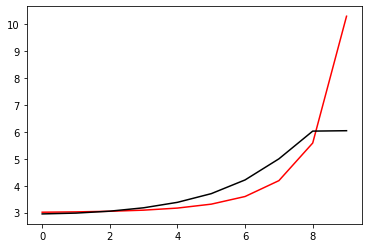

271700 0.051507521304795856
[2.80668834 2.83153531 2.89461535 3.00891268 3.19578465 3.49167101
 3.9541997  4.64933934 5.54925635 5.56086324]


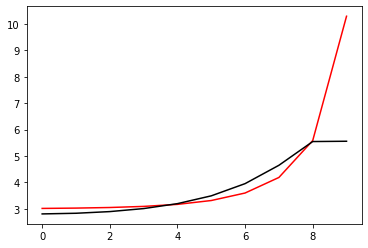

272800 0.017230256360485835
[2.93551097 2.94927924 3.00105342 3.10522747 3.28267509 3.56844114
 4.01752014 4.69364889 5.57182493 5.56838524]


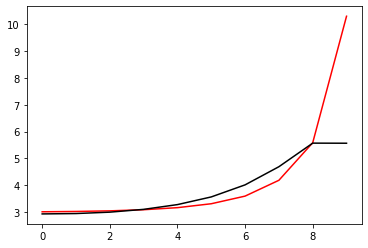

273900 0.011781767078138309
[2.89348269 2.91591804 2.97313414 3.08214818 3.26522493 3.5584725
 4.01904137 4.71686488 5.63270581 5.63841196]


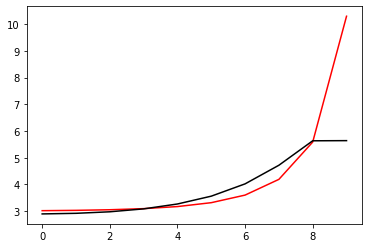

275000 0.031780858349942764
[2.95907986 2.97970208 3.03454571 3.14122446 3.32384228 3.61991905
 4.08853697 4.80555792 5.75932485 5.74297881]


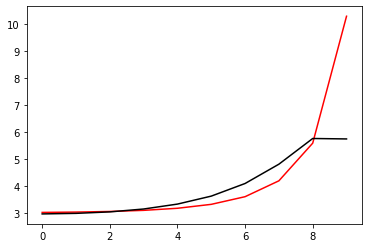

276100 0.03299838054409235
[3.01281008 3.04319207 3.10931168 3.2262412  3.41866914 3.72554757
 4.20759987 4.94580955 5.94005895 5.83554912]


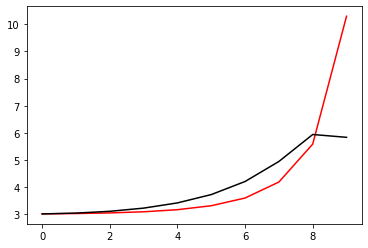

277200 0.012067138483963714
[2.97487131 3.01000655 3.08232398 3.20276179 3.39263616 3.68796334
 4.14672414 4.8527362  5.83295554 5.87349802]


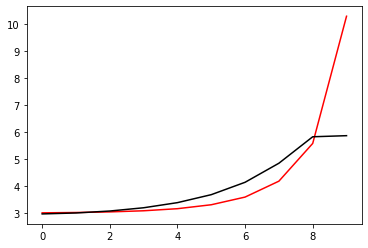

278300 0.02492310018629319
[2.91843971 2.95537375 3.03157722 3.15486833 3.34391419 3.63095541
 4.06677187 4.71812175 5.58951815 5.53386109]


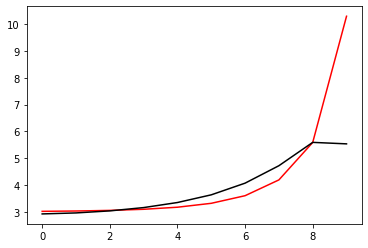

279400 0.03707091776408628
[2.75829227 2.8055289  2.89184255 3.02667737 3.22847933 3.53042215
 3.98780635 4.67988931 5.62113865 5.82644441]


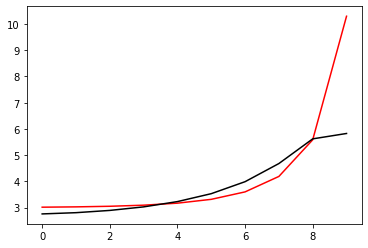

280500 0.07485499184434875
[2.67724669 2.73053262 2.83073425 2.98574711 3.2159626  3.55999787
 4.0852895  4.89202296 5.99308711 5.98259027]


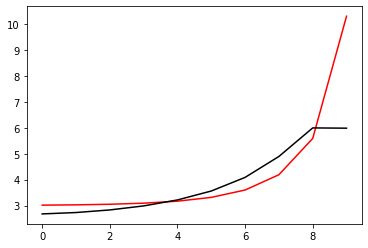

281600 0.014179410473693803
[2.95061291 2.97295748 3.03561116 3.14795839 3.32495829 3.59389043
 3.99917463 4.60286072 5.44061524 5.4109043 ]


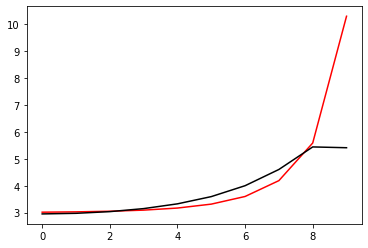

282700 0.0116584714550244
[2.98920919 3.01659356 3.08034226 3.1933748  3.37317338 3.64847625
 4.06684053 4.69826873 5.58154044 5.61196681]


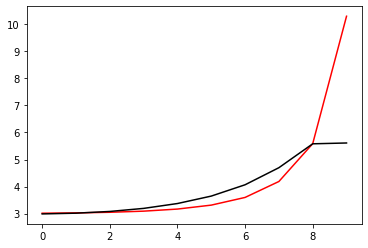

283800 0.020677308941552227
[2.93335659 2.96118591 3.02458948 3.13778255 3.3219025  3.6105068
 4.05925836 4.75410423 5.74547505 5.72652204]


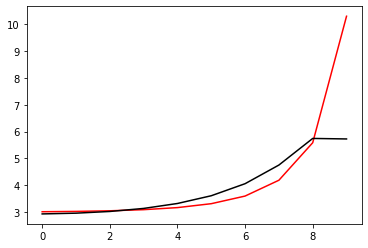

284900 0.012071045053048372
[2.90725734 2.94774549 3.02782196 3.15689598 3.35561579 3.65657967
 4.10728599 4.77665273 5.77121705 5.77802239]


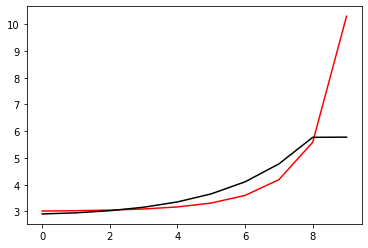

286000 0.07202043214377526
[2.76100749 2.77630854 2.83386131 2.94422789 3.12621305 3.413649
 3.86171687 4.51951639 5.40823263 5.41263462]


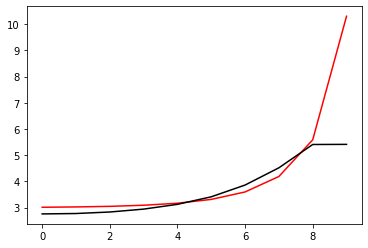

287100 0.04827800268558614
[2.90965525 2.91707468 2.96354984 3.06364368 3.23570891 3.51197323
 3.94445867 4.58198486 5.4425808  5.43504554]


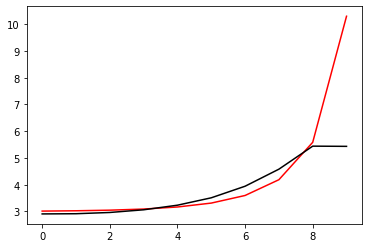

288200 0.016072791053300357
[2.93150538 2.94512605 2.99320077 3.09432026 3.26898862 3.55029069
 3.99105126 4.64725847 5.53654643 5.51770897]


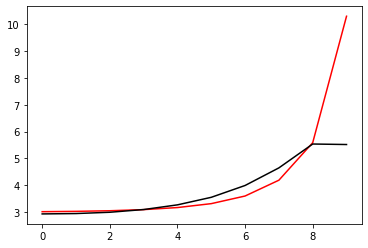

289300 0.02292562725034492
[2.92261571 2.94402571 2.99916986 3.10587195 3.28777308 3.5803342
 4.03904126 4.73098707 5.675595   5.72602971]


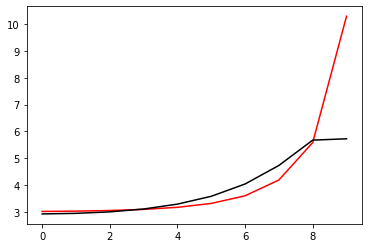

290400 0.012111463499667451
[2.83514898 2.87012668 2.94362273 3.07000191 3.27519657 3.60016154
 4.1087449  4.88553447 5.95166617 5.86174197]


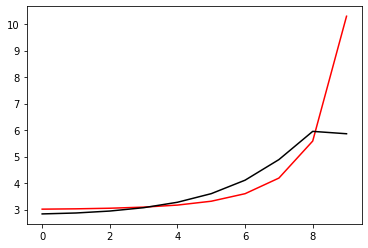

291500 0.021341687944162652
[2.93375716 2.94845044 3.00245027 3.10475604 3.27343589 3.53594965
 3.92396424 4.4663033  5.26686785 5.39515051]


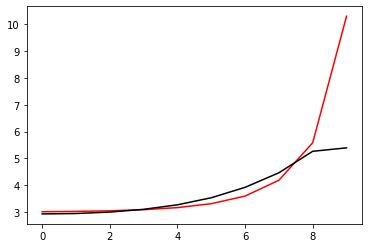

292600 0.020381827478733235
[2.93216032 2.95072254 3.00629799 3.11075758 3.28256155 3.55024918
 3.95000876 4.5181746  5.32370121 5.31495675]


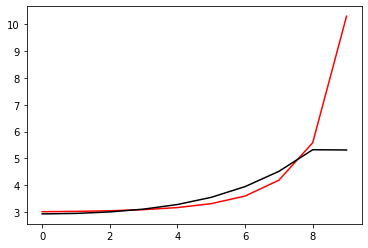

293700 0.01206616291566905
[2.93618458 2.96030272 3.01995661 3.12910685 3.30759907 3.5863565
 4.00905644 4.62012657 5.43238804 5.41563424]


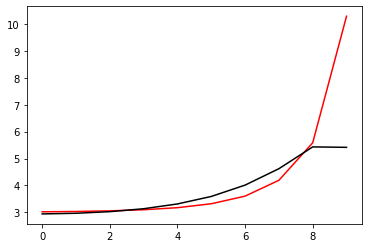

294800 0.011900152153087179
[2.87224079 2.90850579 2.97982686 3.10020173 3.29157655 3.58893339
 4.04711409 4.72988767 5.59319006 5.5494805 ]


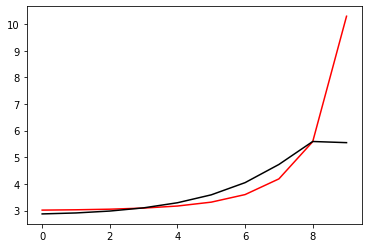

295900 0.012065690741710187
[2.90679355 2.93996364 3.0122223  3.13606218 3.33394128 3.64378723
 4.12597547 4.85198436 5.76215961 5.76630154]


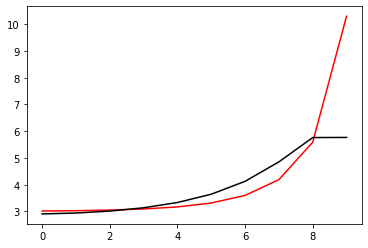

297000 0.03183860883817387
[2.95769859 2.99205859 3.06579417 3.19162557 3.39213665 3.70421863
 4.18066047 4.87806654 5.84919136 5.82924097]


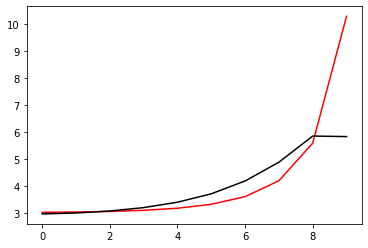

298100 0.047191266313903905
[2.8713101  2.89705437 2.96255879 3.07935562 3.26800494 3.56271364
 4.0117611  4.63636556 5.40365294 5.39146299]


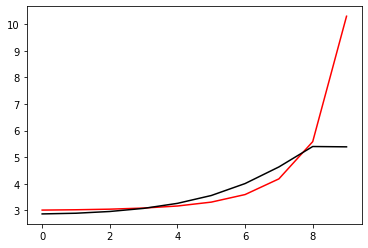

299200 0.017462374639598963
[2.89046685 2.91851089 2.98565606 3.1047925  3.29693013 3.59669523
 4.05299843 4.6935811  5.48102699 5.46582642]


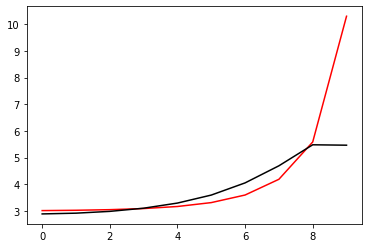

300300 0.03159174201990127
[2.8396039  2.87544126 2.9502301  3.07736944 3.27917627 3.59192467
 4.06802601 4.74888584 5.59390453 5.60820924]


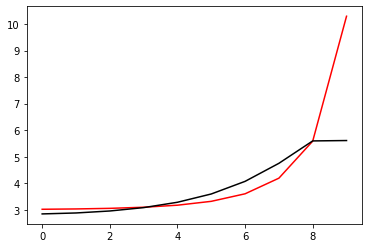

301400 0.02038700506871501
[2.95439503 2.98295339 3.05292766 3.17667134 3.37660442 3.68901589
 4.1662399  4.85715298 5.72037494 5.60490523]


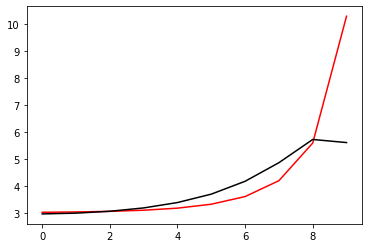

302500 0.022181327588467352
[2.87266279 2.90658511 2.98176269 3.11208741 3.32080738 3.645944
 4.146652   4.89446426 5.85533004 5.89273373]


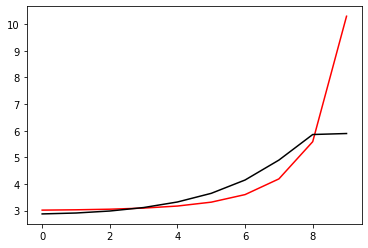

303600 0.01308320834652688
[2.97733074 2.99058046 3.04201692 3.14413493 3.31547588 3.58381086
 3.98313803 4.53534769 5.26233344 5.25007873]


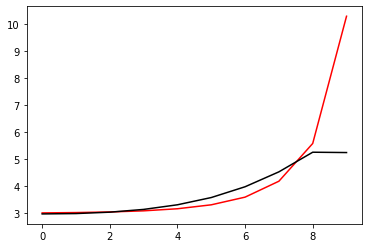

304700 0.011441653415800553
[2.99056212 3.00736598 3.05881552 3.16096147 3.33356957 3.60581994
 4.01711166 4.60393667 5.35446097 5.35666335]


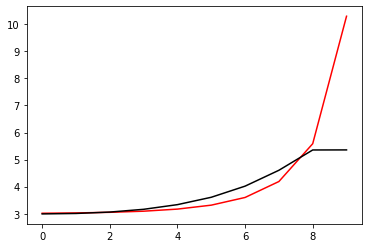

305800 0.02154594635973054
[2.9987778  3.01868665 3.07134515 3.17391219 3.34853312 3.62745142
 4.05841926 4.69671836 5.50056923 5.49594347]


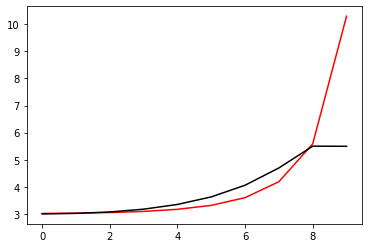

306900 0.011954061522448689
[2.84601296 2.88379863 2.95377617 3.06998131 3.25673809 3.55125197
 4.01311344 4.72736547 5.66327091 5.67034393]


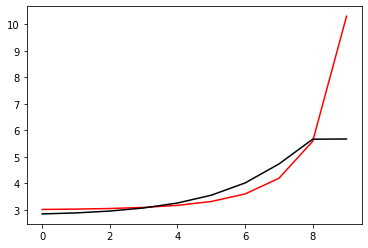

308000 0.03219806241127575
[2.91224388 2.95675641 3.0451702  3.18320003 3.3920771  3.71046978
 4.20019096 4.94228926 5.90822683 5.91921731]


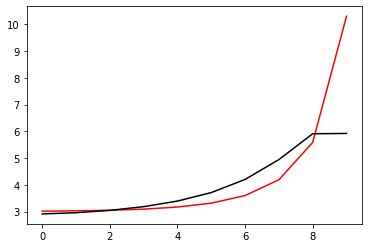

309100 0.04647014915315323
[2.8524718  2.88759021 2.96606398 3.09258922 3.28445804 3.5742603
 4.01314164 4.66496492 5.4914024  5.47606869]


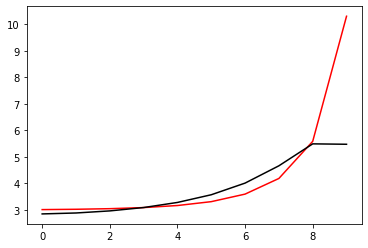

310200 0.013160754588681238
[2.9361643  2.96383422 3.03371742 3.15309638 3.33844838 3.62104476
 4.05044971 4.68918646 5.50554695 5.49287017]


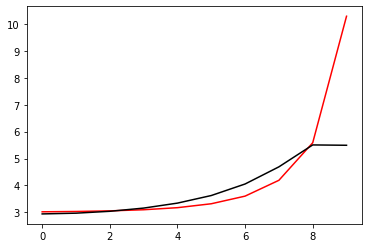

311300 0.02365048053486816
[2.91554994 2.94528603 3.0154358  3.13665291 3.32650033 3.61714641
 4.06127179 4.72774618 5.59196077 5.57981369]


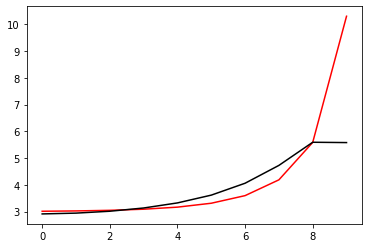

312400 0.012308067430621102
[2.84538219 2.87789022 2.95129619 3.07826414 3.2791757  3.58957422
 4.06935554 4.80023638 5.76494841 5.69142715]


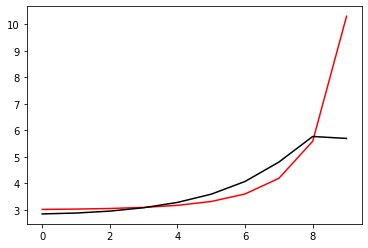

313500 0.021264705438288893
[2.94663409 2.9476531  2.98667463 3.07638632 3.23364314 3.48650487
 3.87945763 4.46807564 5.24145026 5.23953638]


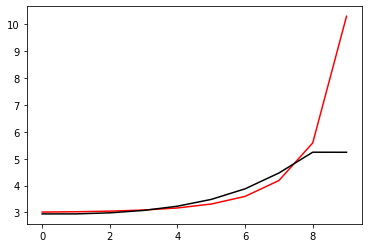

314600 0.018563289484861224
[2.96057287 2.97065063 3.01290413 3.10501466 3.26572497 3.52405945
 3.92605591 4.53140146 5.33594232 5.31886216]


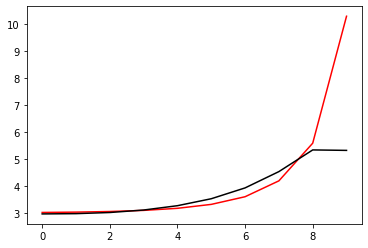

315700 0.01143481612368761
[2.99354217 3.00994768 3.05558492 3.14847373 3.31016139 3.57152727
 3.98078142 4.60337996 5.44574859 5.49516454]


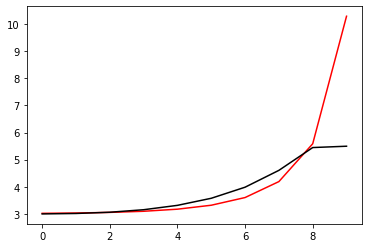

316800 0.011703060558449973
[2.87565053 2.91012952 2.97295081 3.07975698 3.25446625 3.53221611
 3.96725936 4.63669208 5.56504349 5.54389982]


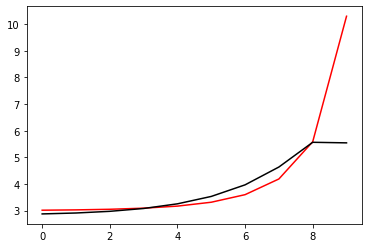

317900 0.012359807623791005
[2.91413582 2.96601557 3.05702828 3.19257584 3.39226129 3.68719471
 4.11564772 4.71354883 5.5796742  5.54712513]


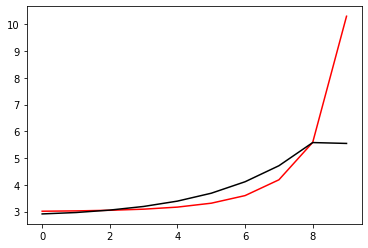

319000 0.03192710416357186
[2.87863796 2.92048502 3.00406303 3.13225978 3.31950802 3.5927791
 3.99157466 4.55921756 5.27267881 5.2425961 ]


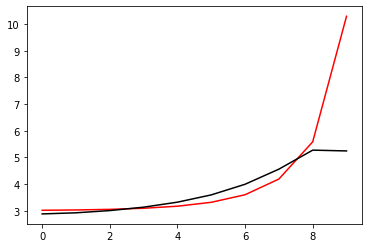

320100 0.0492199577784417
[2.87348503 2.9118323  2.99255189 3.1217568  3.31401864 3.5972166
 4.01605191 4.62706302 5.4167939  5.40075179]


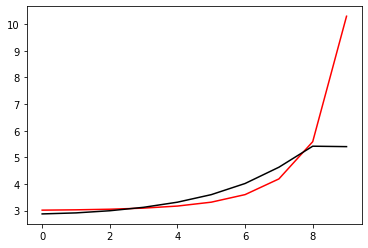

321200 0.013154013220259386
[2.92199944 2.95731918 3.03440303 3.16200291 3.35594377 3.64472719
 4.07546408 4.71333218 5.56223598 5.47881861]


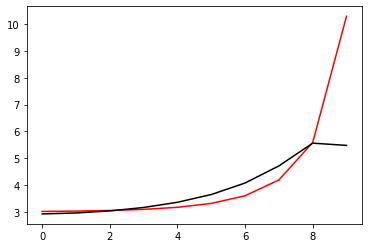

322300 0.023135118953756084
[2.8975944  2.9278214  2.99701074 3.11555157 3.29947065 3.57595303
 3.99045523 4.60909764 5.44880487 5.4114425 ]


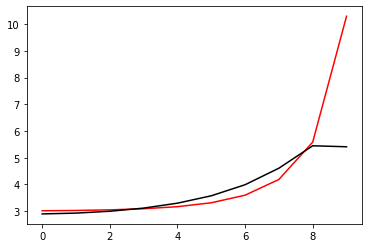

323400 0.020206776566482974
[2.9290531  2.95646266 3.01973639 3.12913234 3.2994635  3.55366109
 3.92668204 4.46881542 5.25144004 5.23410668]


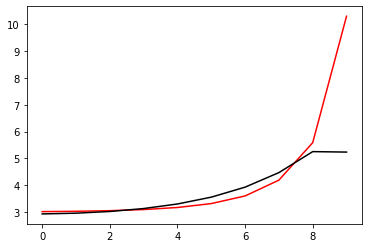

324500 0.021562188808646195
[2.93284516 2.95828691 3.01952127 3.12813849 3.30195485 3.57013053
 3.98164871 4.61170693 5.49656025 5.52962246]


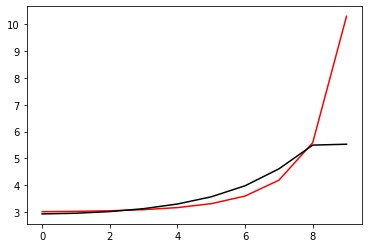

325600 0.02950894896734063
[2.84975638 2.88771521 2.9654189  3.08868837 3.27214472 3.5400145
 3.93081459 4.4997094  5.26537831 5.30712104]


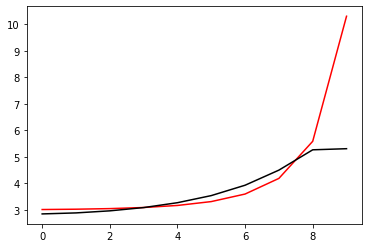

326700 0.013741937782250196
[2.89744519 2.93419337 3.01148514 3.13582708 3.32192755 3.59471347
 3.99365742 4.57336664 5.34635948 5.32527216]


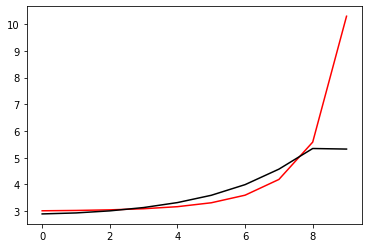

327800 0.011820553130475867
[2.86737609 2.90886181 2.99085968 3.12096677 3.31450588 3.59809215
 4.01460701 4.62314086 5.43265967 5.4287344 ]


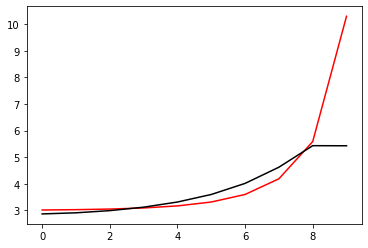

328900 0.012247586235726743
[2.93561125 2.9691188  3.04478647 3.1715516  3.36543336 3.65456219
 4.08489817 4.71957753 5.56399489 5.58906225]


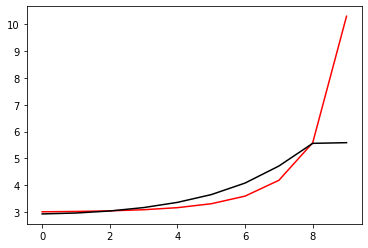

330000 0.03190781146054384
[2.91380352 2.94669698 3.02183775 3.14995284 3.3487315  3.64852414
 4.10005091 4.77574535 5.68431977 5.75737498]


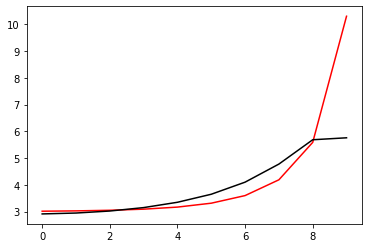

331100 0.04902523473336411
[2.90259694 2.92225556 2.97966028 3.09278286 3.28363302 3.58720219
 4.0634914  4.80465087 5.83306045 5.7679163 ]


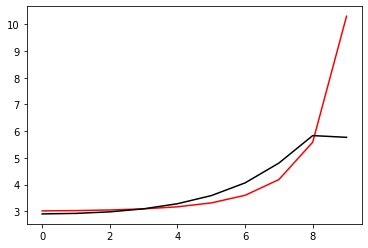

332200 0.013776349787056948
[2.94918451 2.958657   3.00082843 3.09728314 3.27361224 3.56816164
 4.04138709 4.77021093 5.74487504 5.70401673]


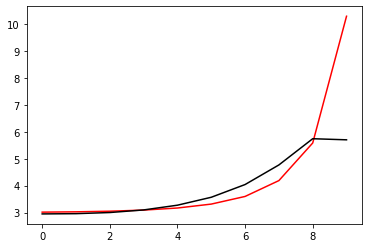

333300 0.037328330189264264
[3.0084983  3.04004574 3.10463403 3.22113991 3.41769257 3.73533005
 4.2357782  4.99839442 6.01894973 5.92643359]


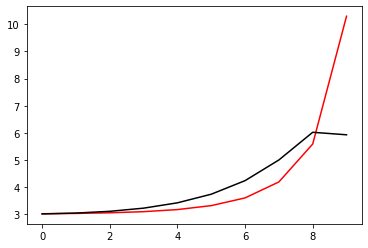

334400 0.012762139652468231
[2.86582516 2.89469742 2.96155897 3.07915164 3.27229689 3.5804706
 4.06436837 4.80722389 5.82372553 5.79600024]


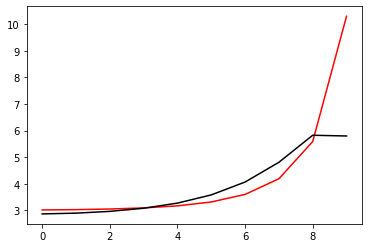

335500 0.021773574940401483
[2.87698435 2.90287741 2.96764896 3.08306308 3.27171411 3.57131899
 4.04162539 4.77020125 5.79907064 5.8031776 ]


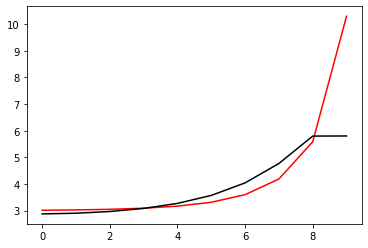

336600 0.02014756081154994
[2.86923745 2.90365948 2.97969493 3.11117758 3.32266328 3.65641799
 4.18284158 5.00687849 6.17036058 6.15229142]


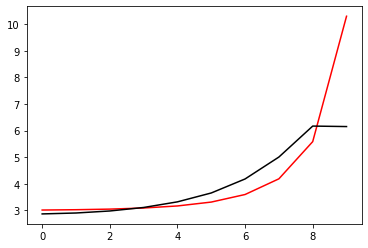

337700 0.012534245849098128
[2.94455697 2.97288922 3.04221996 3.16889004 3.3786632  3.71502127
 4.25083207 5.09965636 6.32136673 6.33652539]


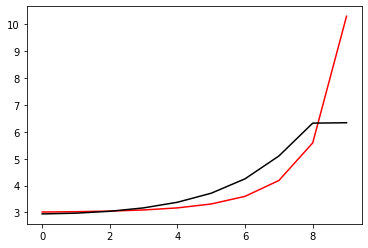

338800 0.02220078785441122
[2.95281408 2.983086   3.05289763 3.1757811  3.37526898 3.69034769
 4.18560991 4.96133692 6.08770567 6.0981733 ]


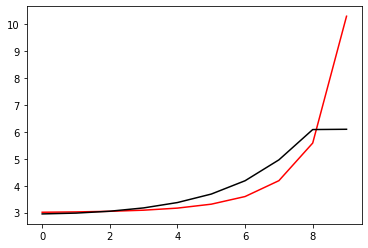

339900 0.012700110891851829
[2.82299292 2.86537567 2.94931596 3.08711006 3.30229604 3.63484325
 4.15175092 4.95783761 6.12649931 6.13404046]


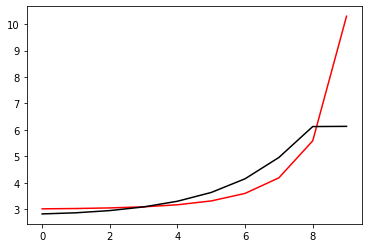

341000 0.03263659278775398
[2.86659871 2.90393971 2.98583195 3.12474897 3.34414456 3.68516669
 4.21797297 5.05392293 6.27169658 6.28010053]


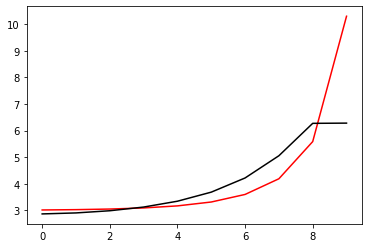

342100 0.49256021038233283
[3.04385957 3.08959134 3.17955832 3.32875439 3.56151125 3.91885744
 4.46867271 5.31643793 6.54244258 6.35020185]


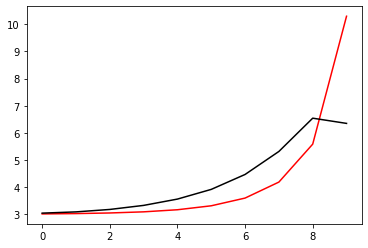

343200 0.013836879509954535
[2.88286254 2.92333365 3.00612018 3.14316201 3.35497112 3.67472372
 4.15448625 4.87635914 5.94004656 5.92595779]


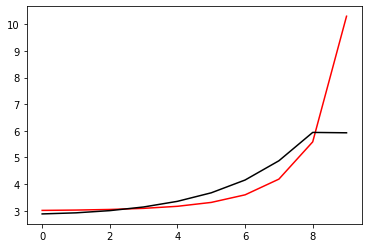

344300 0.022722458653058795
[2.87494953 2.91438613 2.99821745 3.13762397 3.35384749 3.68242752
 4.18169306 4.94169493 6.03577874 6.02420055]


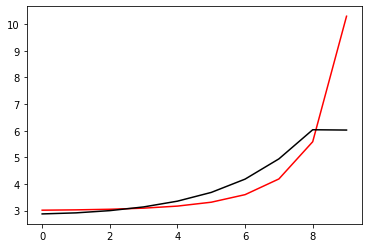

345400 0.01187919715458202
[2.85392798 2.89271897 2.97828438 3.12316795 3.35038211 3.70058062
 4.24385663 5.081977   6.24064679 6.16977249]


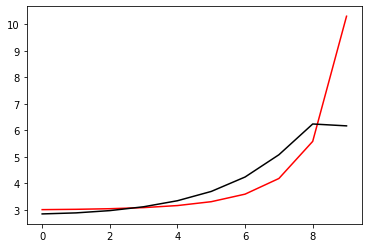

346500 0.022212692881306773
[2.95672484 2.98527549 3.05635373 3.18325955 3.38663248 3.7007576
 4.18208359 4.92342161 6.01727083 6.03157474]


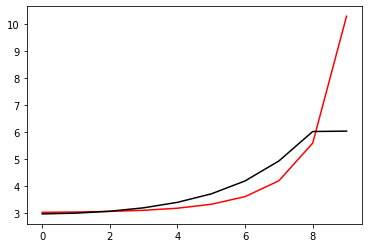

347600 0.015288143417007653
[2.92715559 2.95957779 3.03006568 3.15129498 3.34105117 3.62585134
 4.04135963 4.62665548 5.48798401 5.50489741]


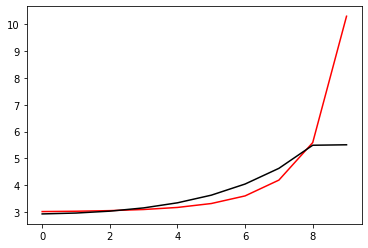

348700 0.011841000137191403
[2.9295489  2.9620927  3.03338248 3.15563473 3.34730717 3.63634503
 4.06321818 4.67869073 5.55174034 5.54632629]


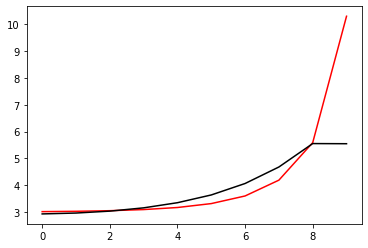

349800 0.011951556000442358
[2.8612412  2.90068212 2.97858217 3.10695093 3.3051669  3.60385799
 4.05230404 4.72491619 5.65215665 5.64222984]


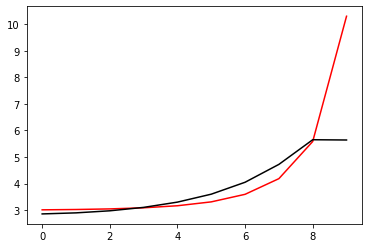

350900 0.012160551257041194
[2.94756487 2.97019106 3.03239883 3.14788258 3.33679663 3.63224195
 4.08978627 4.79743713 5.76255685 5.72695253]


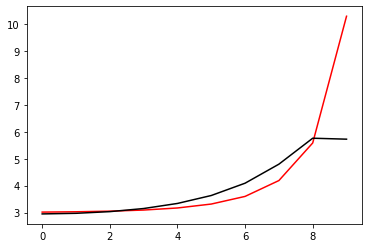

352000 0.03201977790159093
[2.91553904 2.94864892 3.02087624 3.14459578 3.34119243 3.64588221
 4.11739842 4.84540331 5.85248528 5.86472926]


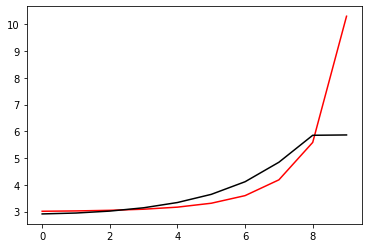

353100 0.03526192362796679
[2.96246183 2.98871831 3.05237292 3.17112006 3.36972907 3.68923916
 4.20055405 5.00716843 6.12596123 6.00697879]


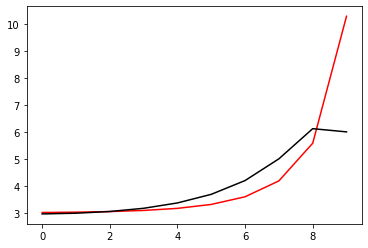

354200 0.01231578031410361
[2.93879356 2.97801989 3.05450485 3.18146622 3.38177155 3.68890139
 4.1387472  4.71467573 5.54558749 5.53238406]


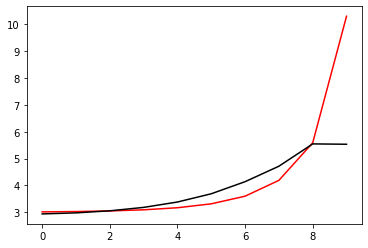

355300 0.036831962508497317
[2.99503709 3.03426402 3.11449537 3.24788224 3.45805687 3.7826735
 4.27381266 4.94311385 5.71092263 5.65683995]


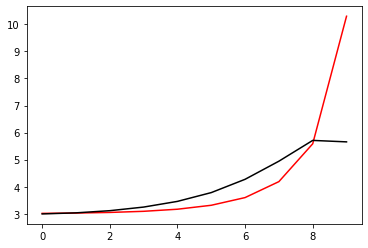

356400 0.012327692051724536
[2.81928554 2.87100684 2.96648425 3.11332043 3.33232962 3.65873806
 4.14539176 4.85410915 5.73479217 5.67775505]


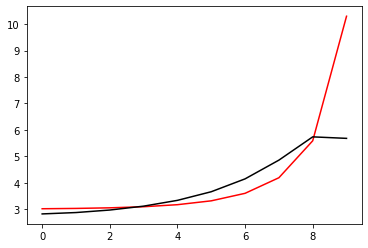

357500 0.02137807589172639
[2.89847774 2.91563331 2.97688014 3.08860459 3.26690394 3.53955004
 3.94269717 4.49258358 5.15729821 5.15442018]


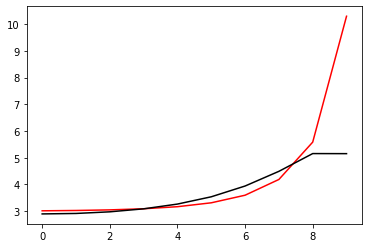

358600 0.019533090819755714
[2.92413196 2.94743942 3.01119209 3.12643083 3.30980182 3.58940719
 4.00319596 4.57526858 5.27595522 5.2628614 ]


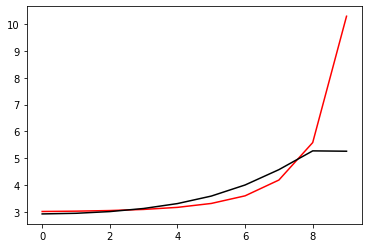

359700 0.011911383977069133
[2.9262347  2.95695505 3.0263259  3.14756154 3.33910714 3.63006186
 4.06146685 4.66912015 5.4284401  5.45678865]


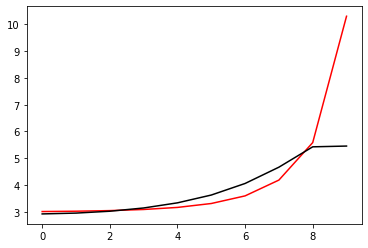

360800 0.021002607436293605
[2.91990605 2.95641763 3.03347995 3.16219505 3.36214298 3.66385871
 4.11181601 4.7551326  5.57961192 5.64193852]


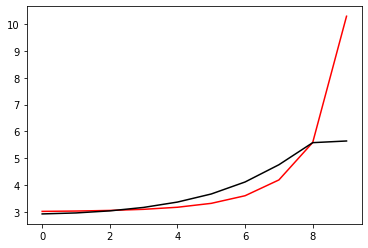

361900 0.023259860924411013
[2.99263668 3.02985883 3.1083571  3.23859463 3.43906036 3.73879193
 4.17939235 4.81184543 5.65896654 5.83757711]


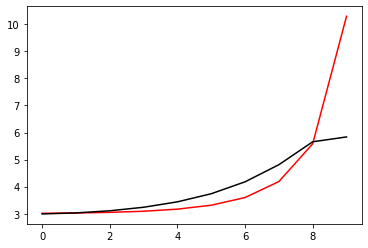

363000 0.07182457981138793
[2.74376964 2.77560664 2.85011274 2.97590911 3.16944807 3.45853883
 3.88408666 4.4619958  5.16203214 5.20910767]


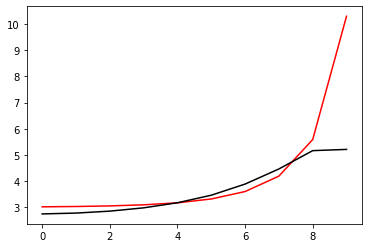

364100 0.049473199490242134
[2.89784139 2.91974287 2.98271354 3.09788395 3.28105208 3.55864885
 3.96910942 4.53021773 5.20937339 5.2038617 ]


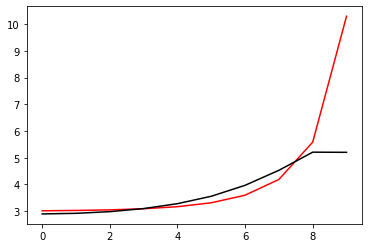

365200 0.015268436616033226
[2.92676435 2.95164843 3.01493333 3.13040493 3.31534115 3.59694532
 4.01467611 4.59521887 5.30827815 5.28358967]


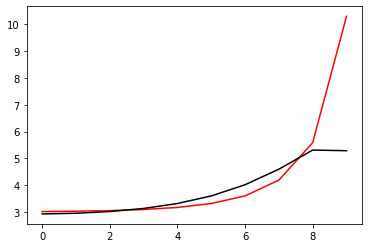

366300 0.023006432289488874
[2.89189423 2.92315042 2.99336483 3.11597863 3.31072706 3.60743786
 4.0495607  4.67827162 5.46946452 5.51482065]


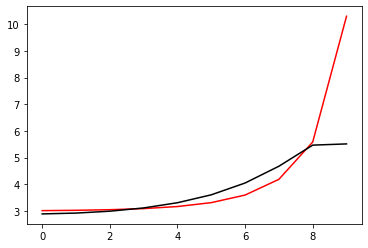

367400 0.014421784620649615
[2.86029226 2.89880412 2.97331322 3.09316992 3.27405494 3.53803574
 3.91162735 4.41315143 5.03003867 5.17252642]


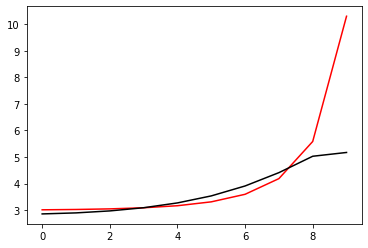

368500 0.02144708559991691
[2.90155959 2.93754348 3.01174787 3.13266195 3.31627902 3.58600026
 3.97127307 4.49341952 5.12317513 5.12251657]


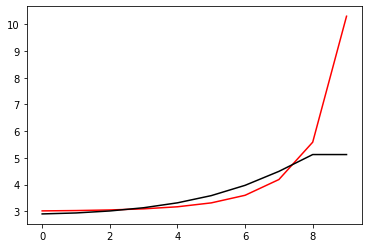

369600 0.02043415810293097
[2.9000134  2.93715784 3.01407742 3.13921012 3.32891578 3.60866331
 4.01322591 4.57321009 5.24390295 5.21930727]


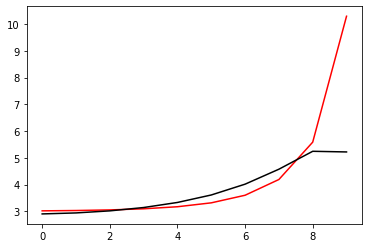

370700 0.11129565004842305
[2.73601133 2.74861949 2.80348397 2.90832547 3.07844484 3.33827783
 3.72056082 4.24969712 4.88998689 5.27376646]


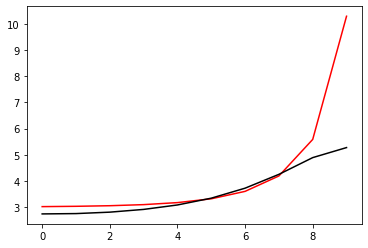

371800 0.018856582644123866
[2.95254765 2.96056103 3.0053788  3.09936966 3.25673836 3.49967043
 3.85792962 4.35384401 4.94889068 4.95074288]


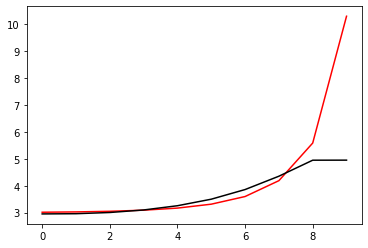

372900 0.011818578407249182
[2.96777689 2.98385144 3.03232791 3.12915415 3.29080285 3.54073219
 3.91124225 4.43127085 5.06757154 5.05196608]


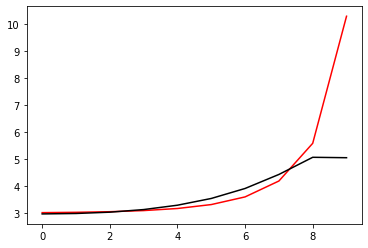

374000 0.031327015632586094
[2.95946772 2.9775114  3.02650513 3.12253441 3.28517799 3.54103229
 3.92732784 4.48413331 5.18868932 5.20223537]


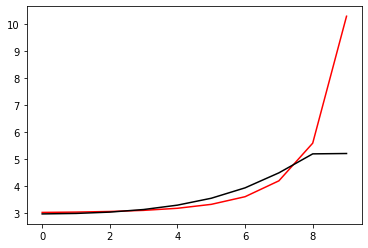

375100 0.05006095167296307
[2.92578662 2.94432092 2.99386381 3.09033976 3.25599617 3.52279263
 3.93710937 4.55665052 5.37493263 5.34852703]


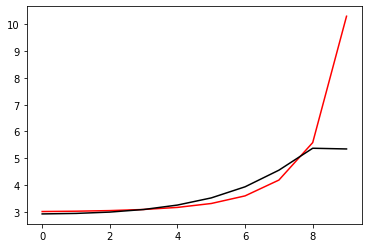

376200 0.011793514826643526
[3.00258836 3.02186235 3.06941938 3.16226756 3.32383079 3.58856957
 4.00894339 4.65745775 5.55164336 5.45736534]


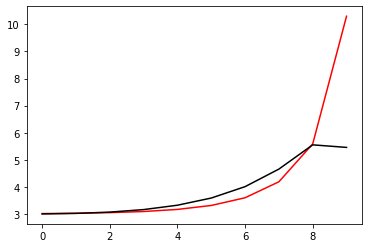

377300 0.029054210366641443
[2.97613938 3.02961685 3.11141814 3.23437118 3.42218636 3.70867928
 4.12881547 4.60123557 5.12799454 5.10697166]


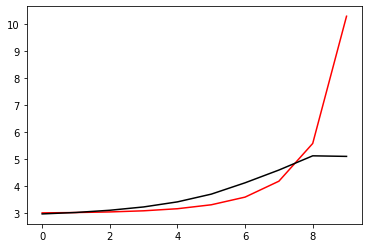

378400 0.01585846055798658
[2.85369363 2.90971519 3.00153534 3.13495188 3.331757   3.6254537
 4.05344797 4.62687475 5.26834841 5.22683876]


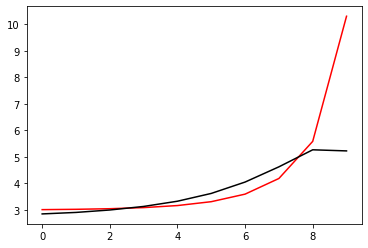

379500 0.022387296682637833
[2.91010927 2.95966413 3.05611976 3.20287972 3.42109961 3.75193271
 4.26314745 5.03338495 5.74221657 5.76761365]


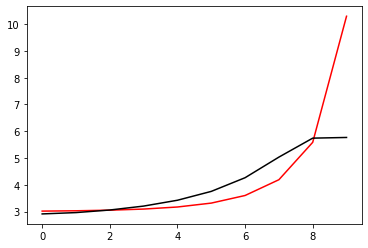

380600 0.012644828233893166
[2.92320039 2.96777351 3.05681849 3.19491132 3.39752268 3.6953561
 4.13116282 4.71426296 5.23936777 5.25626804]


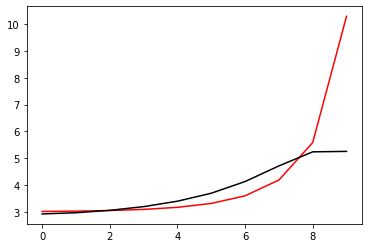

381700 0.011841456604155625
[2.93168973 2.97338393 3.06041283 3.19846893 3.40311043 3.70503337
 4.14892587 4.7559093  5.32396376 5.32316355]


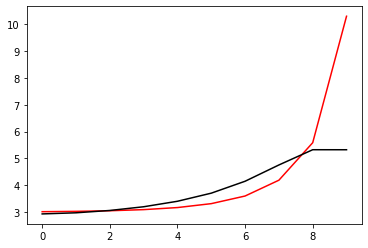

382800 0.0219064442312726
[2.93879723 2.97767888 3.06219904 3.20040501 3.40865324 3.71814666
 4.17695596 4.82181207 5.46366558 5.4680773 ]


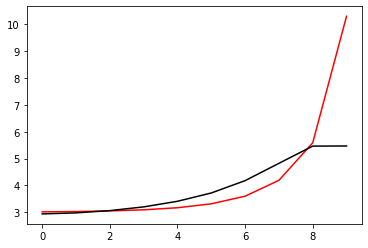

383900 0.011612009783706323
[2.87562389 2.90677698 2.97995729 3.10433211 3.29511468 3.57971832
 4.00160997 4.59842159 5.2198396  5.22461367]


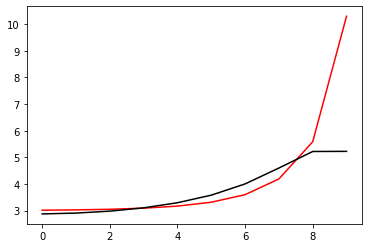

385000 0.0318005950734782
[2.89604124 2.92917347 3.00246365 3.12745722 3.32173192 3.61441336
 4.05137191 4.68066242 5.39808674 5.39971678]


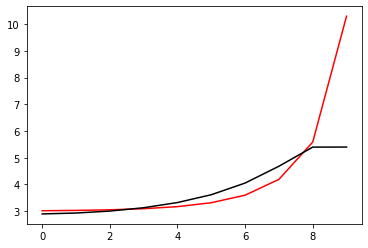

386100 0.0473144682724602
[2.88128012 2.90276104 2.96325974 3.07948395 3.27412335 3.58354636
 4.06696483 4.8015137  5.72866117 5.68276346]


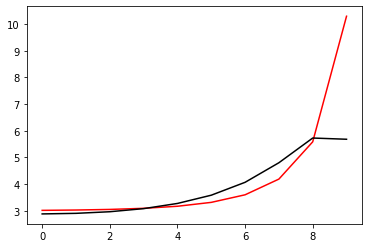

387200 0.017101195519649247
[2.94656473 2.95682864 3.00113825 3.09671089 3.26433424 3.53227854
 3.933252   4.48506424 5.19941694 5.18385774]


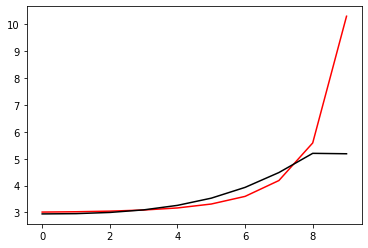

388300 0.023607362377999232
[2.93580757 2.95238697 3.00105182 3.10055995 3.27341654 3.55059134
 3.97283513 4.57486268 5.31772498 5.29602113]


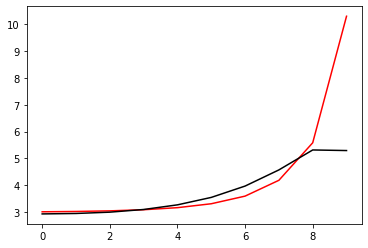

389400 0.015772669114114013
[2.89907694 2.9221867  2.97746294 3.08273911 3.26251013 3.55179139
 4.00234658 4.67341059 5.48146063 5.46358382]


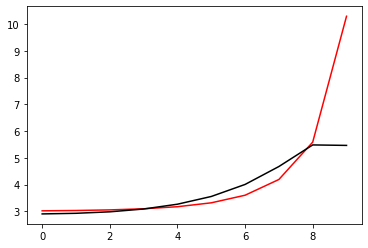

390500 0.013856779285135224
[2.84725616 2.87466264 2.93786521 3.05184653 3.24217627 3.54948851
 4.03924304 4.79622848 5.7142049  5.80328403]


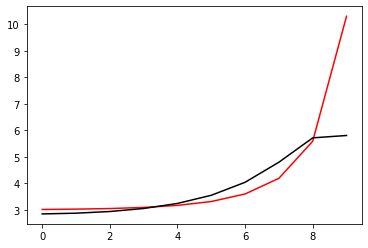

391600 0.012128088823998512
[2.94955306 2.98356871 3.05495005 3.17631699 3.37220276 3.68260244
 4.1693233  4.90748881 5.83139035 5.85579237]


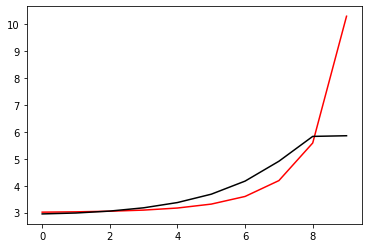

392700 0.012508610708304254
[2.98217518 3.01304796 3.08420134 3.20811129 3.40740074 3.72018604
 4.2045614  4.93655071 5.94034379 5.95137676]


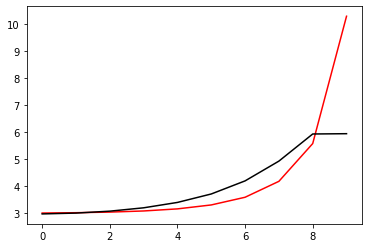

393800 0.012243304000265727
[2.89093352 2.91675858 2.97949323 3.09482977 3.28727455 3.59938799
 4.1075747  4.9073607  5.88143189 5.86662208]


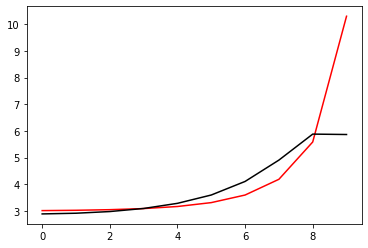

394900 0.012344511725661913
[2.9357583  2.96135043 3.02354584 3.13902138 3.33399457 3.65279158
 4.17084538 4.98998426 6.06165712 6.07064048]


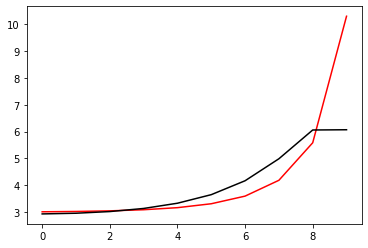

396000 0.032418132036568896
[2.86145314 2.89571164 2.96759801 3.09148974 3.29289196 3.61491401
 4.12967328 4.94008561 6.04532224 6.02774192]


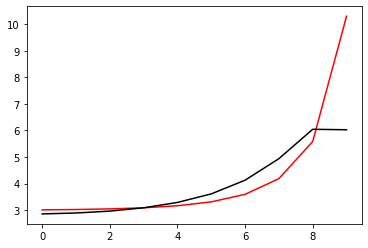

397100 0.5919916887976143
[3.080349   3.1231472  3.20659294 3.3466223  3.57085026 3.92627172
 4.4906656  5.37638919 6.6067597  6.36808269]


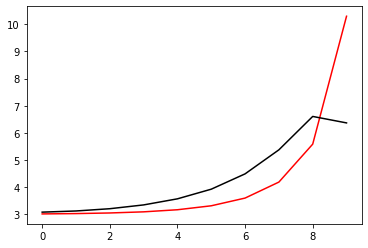

398200 0.014995172165188505
[2.87068922 2.89888588 2.96730125 3.09175553 3.29810881 3.63092907
 4.16554497 5.01494661 6.2166388  6.1815892 ]


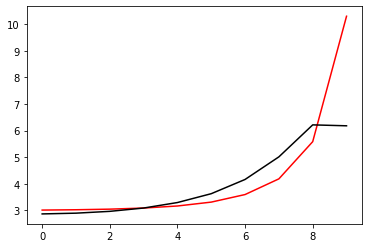

399300 0.03550808780437534
[3.00853698 3.03030519 3.09176458 3.20902681 3.40830904 3.73324987
 4.25752377 5.09603478 6.30585935 6.38011432]


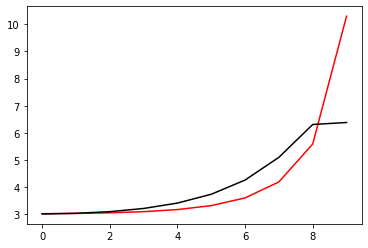

400400 0.01600748707866031
[2.95406572 2.97891377 3.0429003  3.16514185 3.37499199 3.72082431
 4.28351717 5.18562299 6.4883205  6.435827  ]


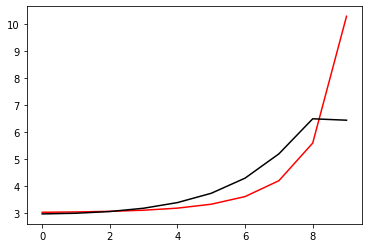

401500 0.014560978501808543
[2.85239799 2.87558043 2.93590693 3.04948484 3.24307271 3.56068901
 4.07696683 4.91235337 6.15156642 6.20096942]


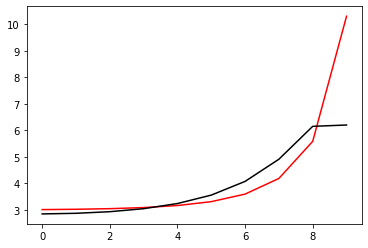

402600 0.012510293714232904
[2.94514132 2.97108708 3.03413443 3.15146314 3.35032732 3.67576343
 4.20382024 5.0566049  6.32228497 6.2871537 ]


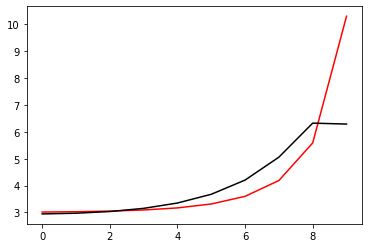

403700 0.018809338920343074
[2.89790558 2.91028864 2.95829364 3.05628531 3.22723353 3.50868693
 3.9637903  4.69815429 5.80732736 5.81073192]


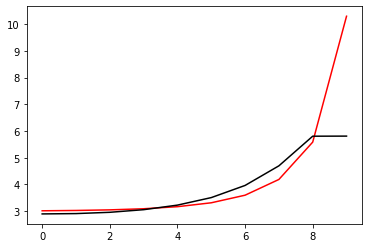

404800 0.01209850967211187
[2.91168423 2.92723231 2.97655439 3.07632834 3.25011361 3.53633464
 3.99964309 4.74659792 5.86900733 5.86502752]


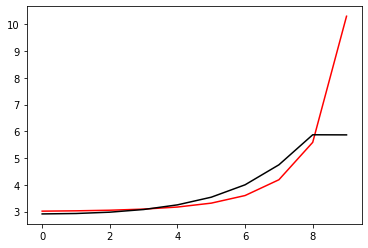

405900 0.011989532166448205
[2.88678509 2.90999678 2.96527348 3.07056014 3.2507551  3.54585055
 4.02325879 4.79269432 5.94305679 5.94840962]


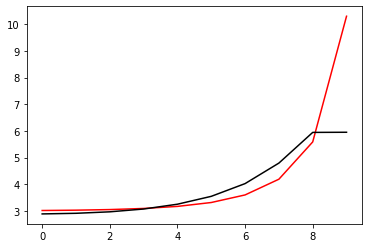

407000 0.032134337629279315
[2.89079158 2.91764088 2.97764789 3.08615678 3.26850659 3.56535763
 4.04483666 4.81794431 5.97669603 6.02732232]


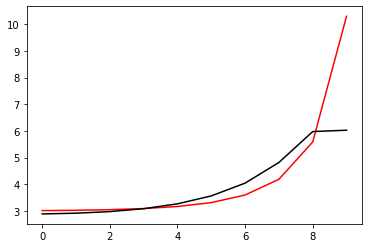

408100 0.03482103942432536
[2.99132748 3.01163893 3.06456644 3.16664623 3.3430412  3.63492586
 4.11098171 4.88154685 6.03925788 5.93481557]


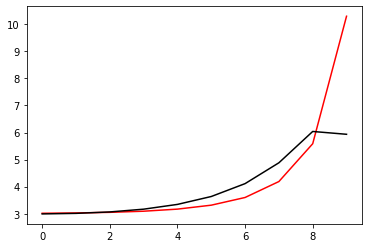

409200 0.01565902775713484
[2.97356857 2.97757504 3.00935301 3.08544825 3.22804822 3.47198689
 3.87176475 4.50392914 5.48639248 5.4591771 ]


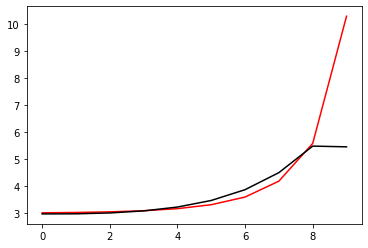

410300 0.026383953174853383
[2.97000932 2.98447646 3.025233   3.10987719 3.26252114 3.51982097
 3.93974276 4.60853078 5.63000243 5.62468095]


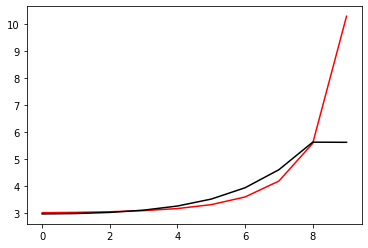

411400 0.01283695598095867
[2.88995399 2.90683222 2.95346249 3.04735201 3.21532666 3.49986548
 3.96948882 4.72767719 5.86236334 5.81456092]


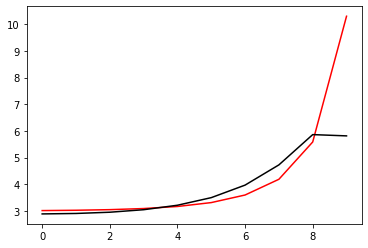

412500 0.02115841063667323
[2.99385327 2.98965326 3.00471706 3.06058198 3.18181286 3.40437159
 3.78335453 4.40136226 5.37216263 5.37902867]


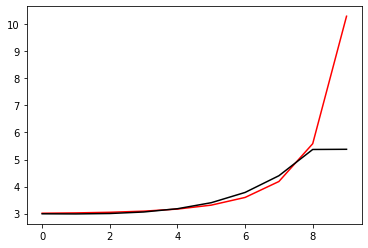

413600 0.011774653418124347
[3.02287462 3.03173052 3.05872889 3.12350062 3.2530441  3.4865939
 3.88483878 4.54074964 5.55514877 5.49457848]


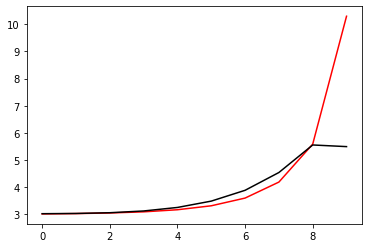

414700 0.0219163555512537
[2.93250335 2.94709568 2.97908541 3.04450808 3.16597428 3.37621262
 3.72008359 4.25661093 5.11881449 5.28547215]


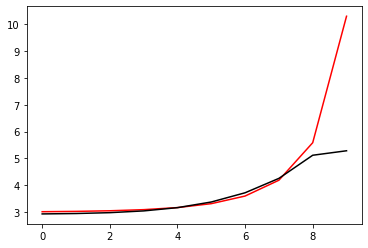

415800 0.0211469654185792
[2.99403499 3.01457024 3.05687756 3.133845   3.26858697 3.49670199
 3.87092887 4.45842698 5.30289594 5.31687223]


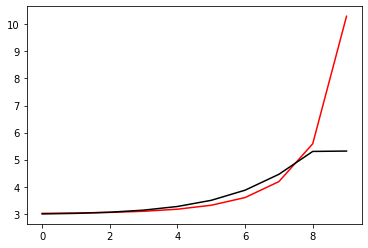

416900 0.011560811352180808
[2.96260732 2.97864602 3.0208596  3.10183373 3.24487493 3.48964122
 3.90241243 4.58280504 5.53817787 5.48333914]


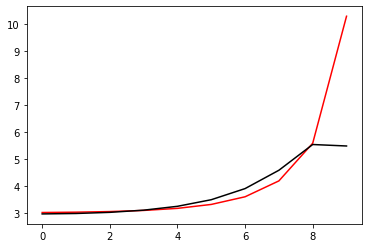

418000 0.03160535472279277
[2.9559517  2.97411445 3.01982158 3.10688084 3.25913785 3.51772101
 3.95272238 4.67285288 5.71994656 5.75449783]


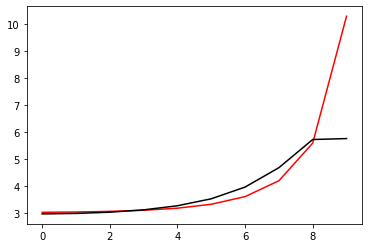

419100 0.049777571501696365
[2.93273077 2.95411292 3.00796903 3.11119388 3.29157587 3.59730072
 4.11116323 4.95641721 6.15681443 6.07895079]


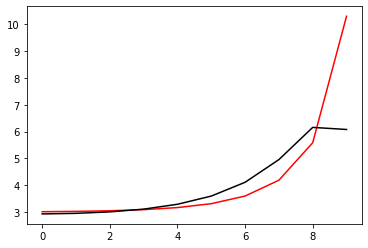

420200 0.015033699921672358
[2.92273386 2.94669377 3.00453285 3.10994961 3.28893891 3.58699433
 4.07468093 4.68831693 5.52996667 5.50954537]


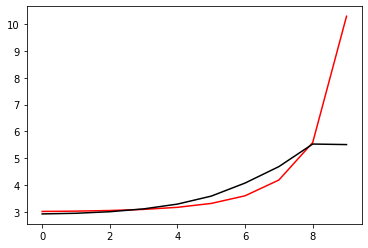

421300 0.030648953330958892
[2.85006123 2.88529849 2.95657085 3.0771679  3.27391189 3.59300381
 4.09936355 4.78348641 5.69693892 5.68968938]


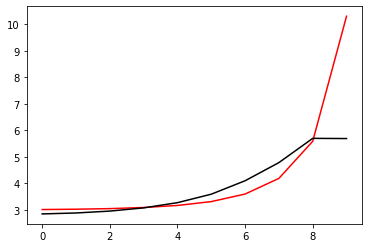

422400 0.014854240957839649
[2.89548408 2.91560833 2.97099584 3.07503412 3.25140213 3.53988338
 3.99397871 4.6340393  5.50339762 5.47800366]


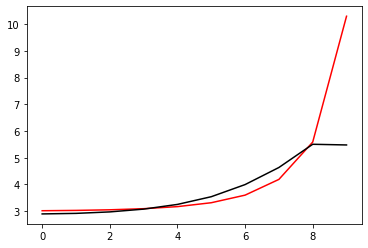

423500 0.029928694658156597
[2.79500049 2.82458969 2.89094315 3.00907394 3.20407546 3.51711864
 4.00823419 4.73694964 5.72969652 5.75021196]


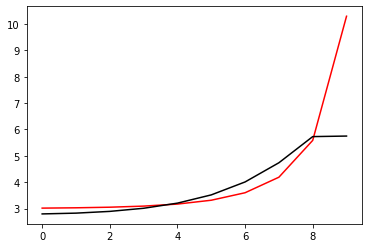

424600 0.011784368484425151
[2.99391899 3.01104319 3.05819229 3.15170584 3.31327786 3.5754893
 3.98357836 4.58924417 5.45235329 5.39595873]


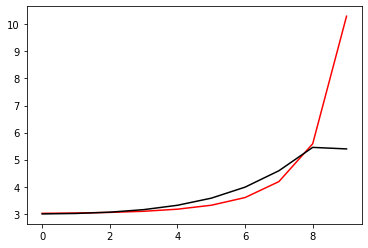

425700 0.011712736787653144
[2.95535747 2.98114653 3.03606394 3.13633963 3.30551206 3.57887367
 4.00948503 4.66965778 5.61060132 5.71978161]


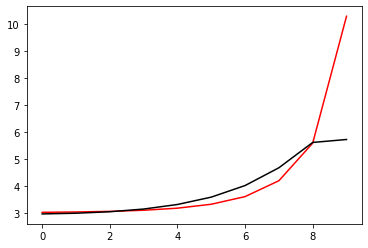

426800 0.02152335481234032
[2.9716366  3.00591635 3.07100883 3.1779085  3.34654146 3.60823892
 4.01088516 4.62726318 5.52999499 5.67240826]


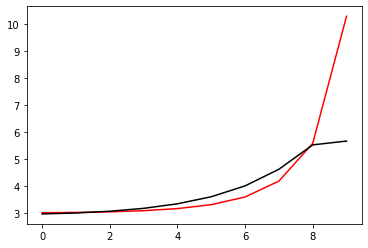

427900 0.011808838903358794
[2.92603152 2.9525971  3.01605479 3.12587567 3.30156108 3.57783057
 4.01467587 4.70907847 5.71529393 5.66860383]


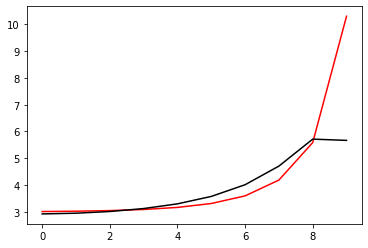

429000 0.032247777454238576
[2.86831634 2.9065203  2.98415689 3.11257773 3.31435239 3.62737671
 4.11161902 4.85713615 5.95201024 5.93268992]


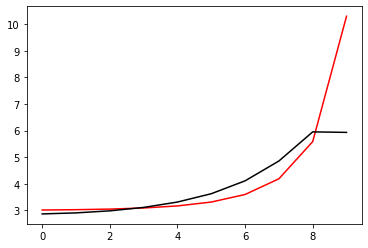

430100 0.050806016763213446
[2.95635675 2.97401671 3.02805099 3.13044775 3.29997711 3.56544237
 3.96001664 4.48812128 5.26484166 5.26460942]


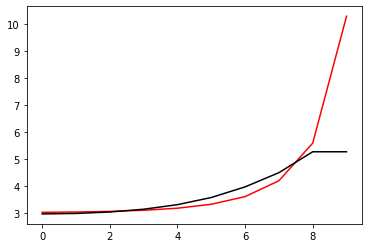

431200 0.012700121234507597
[2.97266752 2.99217033 3.04632636 3.14937406 3.3209721  3.5911566
 3.99813719 4.56246507 5.33590872 5.31916272]


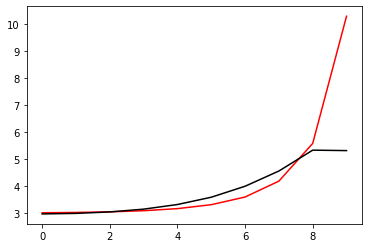

432300 0.030096917647611146
[2.9785223  3.00024855 3.05536783 3.15941246 3.33358096 3.60993147
 4.03404898 4.64905434 5.44089366 5.43517097]


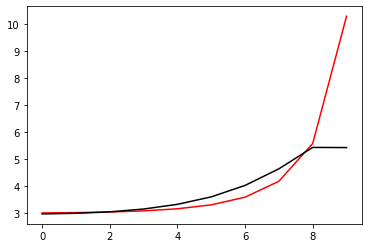

433400 0.019578043834646407
[2.93034209 2.95501883 3.0132028  3.12098172 3.30218844 3.5945121
 4.05971853 4.77641498 5.65416479 5.64659442]


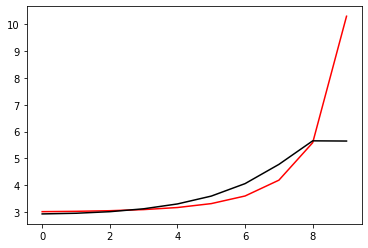

434500 0.021800626774720014
[2.88631523 2.91803455 2.98578335 3.10021721 3.2833123  3.57099226
 4.02076711 4.7227901  5.66327551 5.69604551]


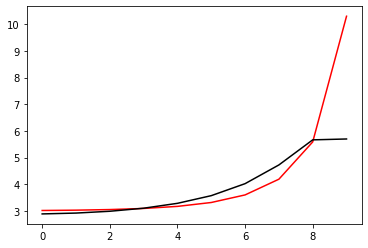

435600 0.6408355384041196
[3.16896012 3.2003685  3.27370214 3.40155835 3.60823091 3.93841139
 4.46319112 5.17180779 5.916066   6.11710429]


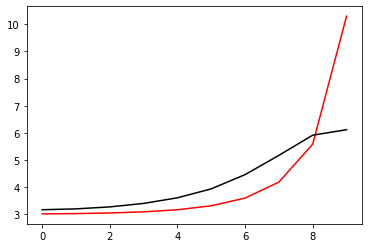

436700 0.011640479806529422
[2.99441235 3.01223609 3.0633609  3.16495912 3.34021796 3.62882831
 4.09197074 4.75376725 5.53330171 5.53116942]


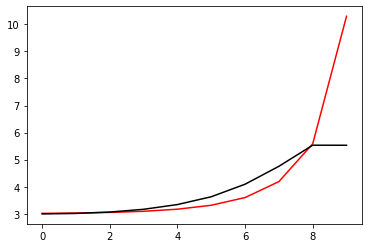

437800 0.02174646917950537
[2.99616177 3.01875793 3.07343033 3.1773891  3.35623288 3.64977208
 4.11683408 4.80840156 5.65937997 5.66351511]


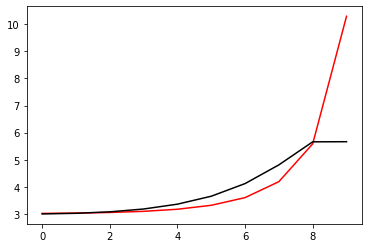

438900 0.01191623763646704
[2.93714013 2.9467534  2.98760417 3.08108676 3.25637008 3.5580334
 4.05451571 4.82962582 5.84683352 5.8109993 ]


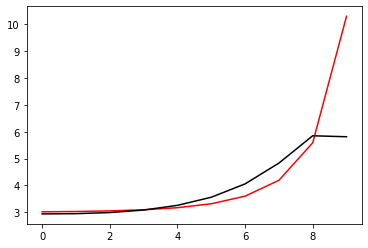

440000 0.03218600348247963
[2.93656767 2.94048148 2.97172281 3.05181244 3.20859688 3.48098044
 3.91992294 4.57428902 5.43254224 5.42529751]


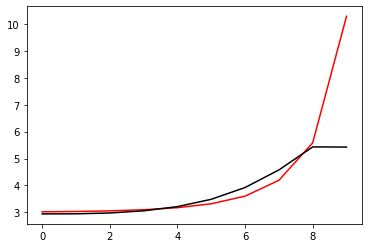

441100 0.050222602128429
[2.94507568 2.95483709 2.99024586 3.07377297 3.23430696 3.51224284
 3.96238257 4.64108535 5.52183354 5.518021  ]


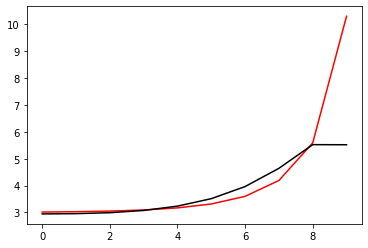

442200 0.01401829159454529
[2.94431054 2.96175642 3.00624589 3.09806922 3.26751358 3.5581831
 4.03216706 4.75806699 5.68880466 5.64709052]


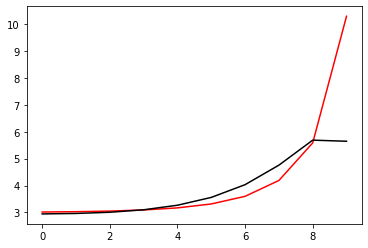

443300 0.029825302092685742
[2.94846907 2.93413101 2.9469598  3.00612858 3.13898434 3.38469015
 3.79582515 4.41829612 5.21851898 5.20417376]


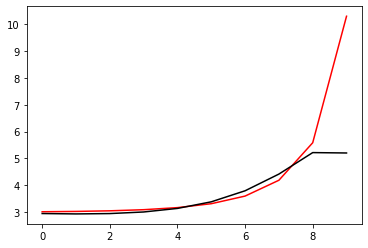

444400 0.018132307783759908
[2.95784293 2.95361959 2.97216519 3.03655482 3.17481964 3.42686915
 3.8470484  4.48691592 5.31812619 5.3151828 ]


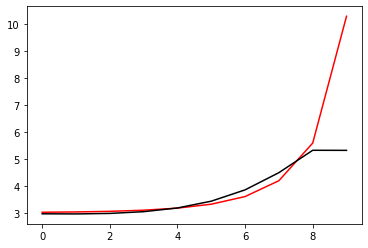

445500 0.02133411641699694
[2.97690796 2.98183194 3.00732881 3.07636567 3.21799749 3.47278916
 3.89690065 4.54933601 5.41041152 5.4364265 ]


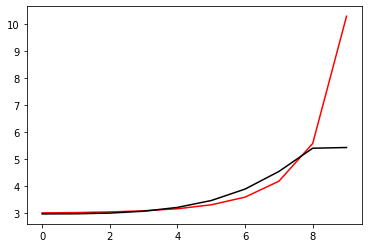

446600 0.011610019775412239
[3.03199876 3.04278823 3.07481404 3.1482163  3.29244629 3.54964883
 3.97963048 4.65281383 5.56444479 5.44986802]


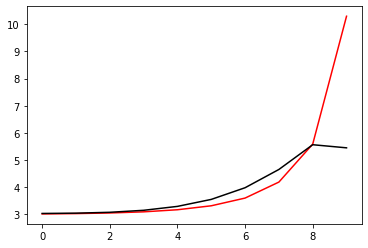

447700 0.011600552573649555
[2.99792546 3.0145588  3.05585861 3.13873211 3.29144301 3.55796161
 4.0045218  4.71885652 5.72034693 5.78509314]


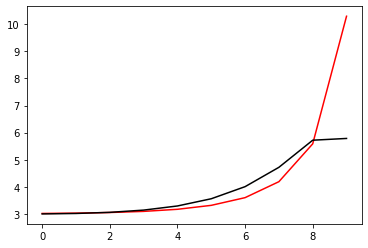

448800 0.011541678824272466
[2.85540344 2.90463105 2.97932656 3.09380156 3.27300037 3.55296754
 3.96246096 4.11245308 5.24048811 5.37139669]


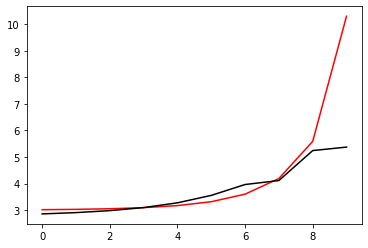

449900 0.01166749838027411
[2.90223905 2.94691297 3.02399289 3.14313669 3.32906871 3.61811398
 4.02802551 4.28614041 5.34819304 5.35229183]


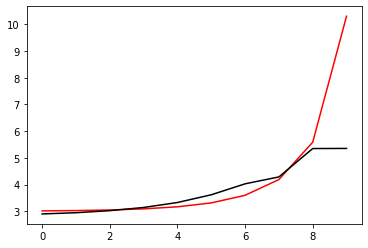

451000 0.031790473713663565
[2.88834234 2.93163084 3.01285286 3.13913743 3.33286726 3.62773461
 4.03761767 4.43070833 5.44841749 5.44846464]


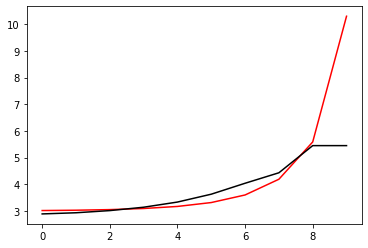

452100 0.053999726609202825
[2.78505328 2.79954746 2.85403401 2.95637998 3.12558083 3.39005699
 3.75942745 4.14377169 5.01377472 5.01351001]


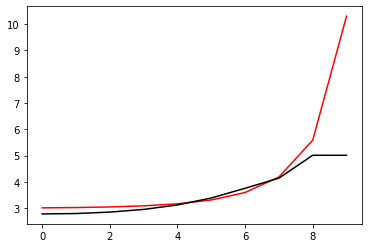

453200 0.018526768704124275
[2.94478745 2.95652943 3.00389146 3.09937119 3.26090562 3.51446821
 3.86973244 4.25476561 5.09207579 5.08542373]


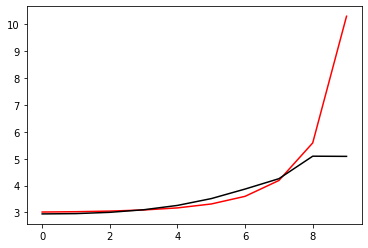

454300 0.027988601391874535
[2.96538384 2.98318925 3.03358959 3.13203463 3.29748554 3.55525152
 3.91951332 4.34858104 5.20090353 5.21759472]


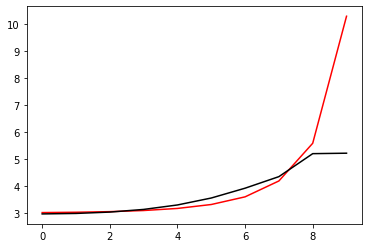

455400 0.02062166113474221
[2.94884303 2.96873008 3.02043377 3.12001951 3.28825086 3.55159373
 3.93294945 4.43028372 5.31954837 5.2619411 ]


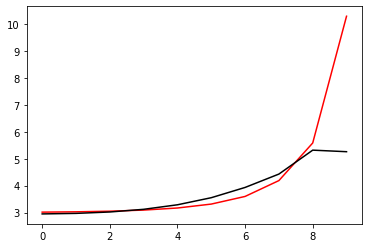

456500 0.02149071294103309
[2.92494363 2.94665875 3.00022276 3.10148433 3.27263446 3.54362561
 3.95084262 4.53499829 5.48335279 5.52649544]


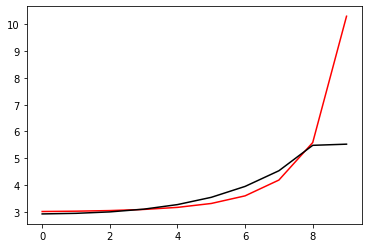

457600 0.02376474429464329
[2.91183944 2.9271229  2.97377338 3.06811975 3.23225538 3.49925464
 3.91915316 4.57127507 5.581009   5.61271978]


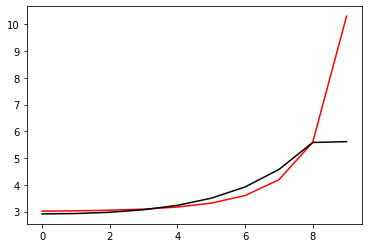

458700 0.021194198206001203
[2.92490229 2.92086184 2.94978761 3.0274787  3.17687731 3.43340707
 3.85133879 4.50554156 5.47460389 5.9058677 ]


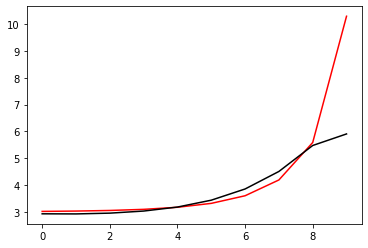

459800 0.02217093093160557
[3.05823941 3.06513794 3.0967096  3.17205469 3.31526862 3.56085762
 3.96180555 4.59677106 5.54462944 5.55597585]


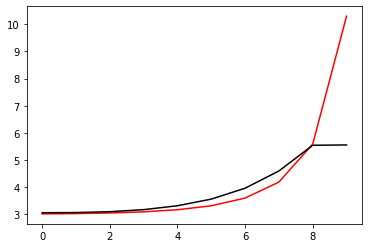

460900 0.01203733457378331
[2.94574154 2.9743339  3.03384363 3.13879647 3.3142971  3.59897251
 4.0533797  4.76782957 5.81137899 5.8157115 ]


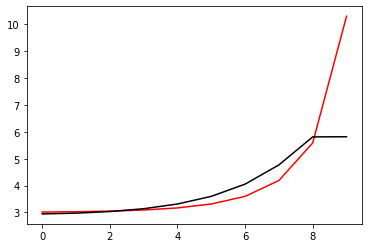

462000 0.03316732794743564
[2.87043758 2.90792911 2.98007907 3.09436448 3.26903904 3.53504903
 3.94162084 4.56586877 5.48402045 5.41630067]


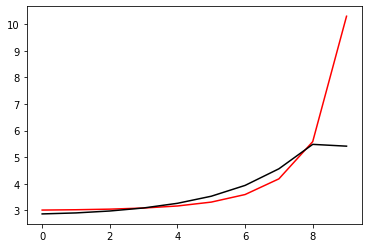

463100 0.04692472448079566
[2.96656389 2.99358192 3.05589968 3.16352396 3.3350172  3.60308342
 4.02260573 4.68089364 5.644169   5.61200931]


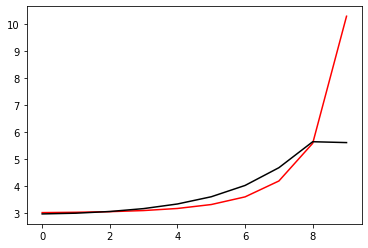

464200 0.012359168492707358
[2.95419092 2.9782601  3.03709632 3.14521373 3.32517137 3.61631504
 4.08810687 4.8514356  5.9601892  5.87465001]


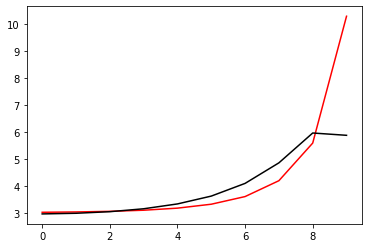

465300 0.1326472217093363
[2.68273362 2.71652585 2.783317   2.8982108  3.08548834 3.38557686
 3.86658991 4.63160541 5.73136047 6.04008856]


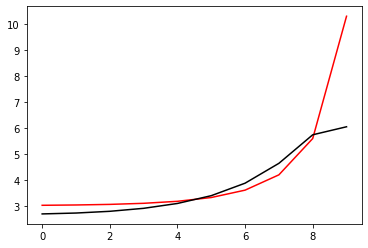

466400 0.01252333182956572
[2.8729786  2.89289403 2.94649565 3.04816284 3.22060201 3.50144555
 3.95369072 4.67347047 5.71255967 5.70862377]


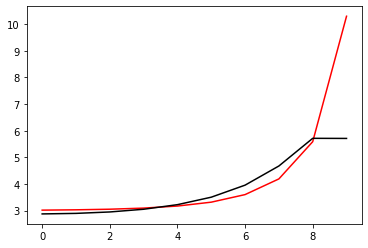

467500 0.021790255493299205
[2.9101277  2.92882857 2.98089857 3.08197534 3.25530243 3.53921029
 3.99782485 4.72893735 5.78496753 5.79160694]


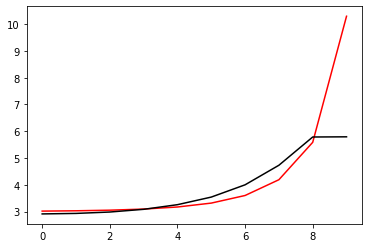

468600 0.01883876044183228
[2.92074951 2.94363151 3.00009602 3.10444836 3.28058901 3.56739447
 4.02949217 4.76646996 5.83705162 5.88237049]


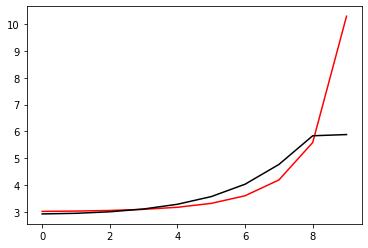

469700 0.011978334506930779
[2.99280042 3.01406758 3.06970764 3.17468934 3.35321405 3.64525801
 4.11710745 4.87011265 5.96367087 6.04010907]


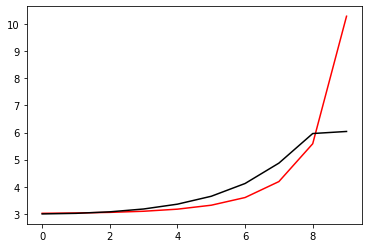

470800 0.09708000911657626
[2.68814833 2.70942756 2.7664463  2.87149278 3.04744864 3.33129527
 3.78104868 4.47543628 5.47449783 5.92130254]


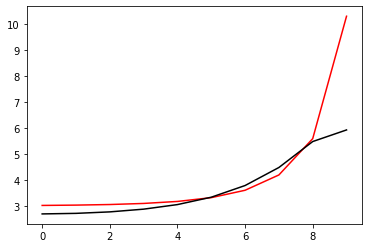

471900 0.011435463334066143
[2.91581168 2.92677974 2.97046499 3.06084687 3.21866053 3.47767465
 3.891213   4.53311873 5.45879575 5.46099948]


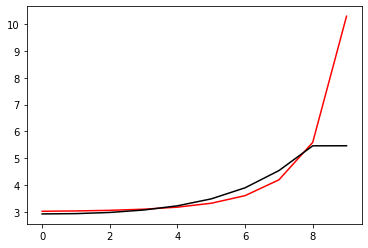

473000 0.03156431155379845
[2.94363032 2.95947417 3.00530585 3.09753584 3.25779935 3.52040074
 3.93992405 4.59404132 5.53959436 5.53995457]


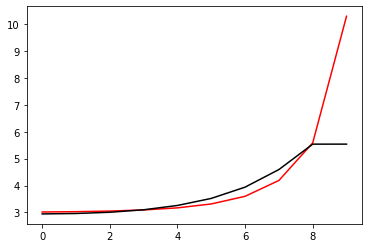

474100 0.050106622322613446
[2.92365648 2.94636227 2.99927661 3.0979671  3.26563937 3.53825686
 3.97333461 4.65553196 5.64564076 5.65531822]


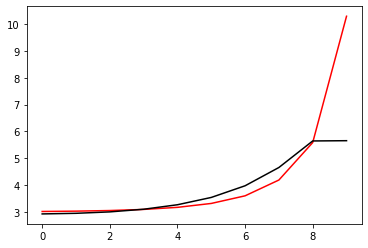

475200 0.012535066249163215
[2.92958762 2.96632667 3.03872998 3.15805226 3.34787698 3.64697808
 4.11782661 4.85398333 5.91855578 5.8753284 ]


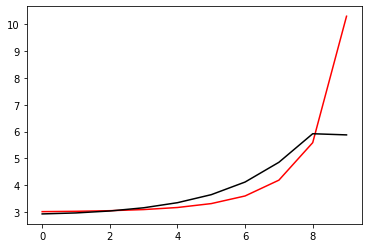

476300 0.030498985426039748
[3.01736531 3.02967658 3.07417053 3.16444168 3.3203218  3.57436924
 3.97640208 4.59573382 5.52421382 5.52096538]


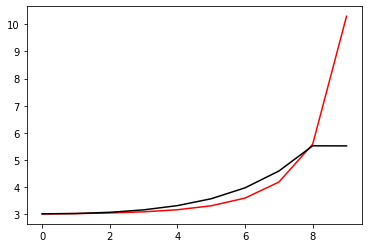

477400 0.02047798122242128
[2.96259547 2.97712019 3.02119472 3.11221037 3.27333482 3.54054087
 3.97074745 4.64645508 5.64436249 5.61575346]


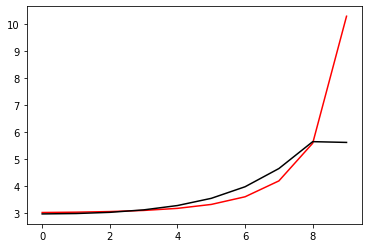

478500 0.021791649190987354
[2.9135569  2.93336168 2.98417006 3.08234542 3.25306459 3.53625706
 3.99639457 4.73015815 5.80525338 5.85374453]


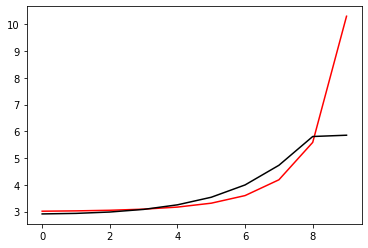

479600 0.16385936427478218
[3.04958396 3.08178784 3.14805877 3.26366818 3.45385727 3.76017653
 4.24963576 5.02149586 6.1381271  5.97643595]


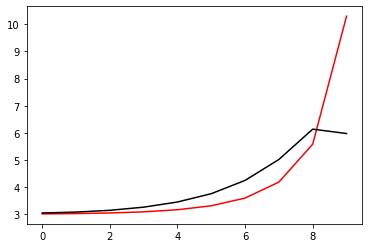

480700 0.013408941688299527
[2.93130517 2.95079602 3.0031042  3.10129688 3.26649996 3.53268691
 3.95276629 4.60479652 5.55059573 5.52154439]


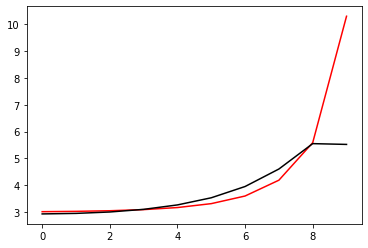

481800 0.012592624381144755
[2.91032575 2.9361051  2.99415024 3.09856548 3.27139001 3.54830423
 3.9860869  4.6684987  5.65156724 5.64957195]


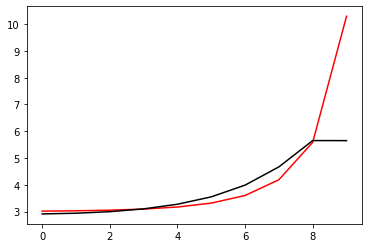

482900 0.011973852867286257
[2.85260778 2.88825426 2.9573963  3.07330168 3.25911607 3.55287587
 4.01661624 4.74274898 5.78309822 5.79847208]


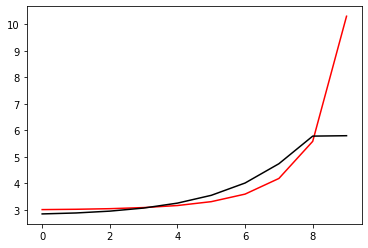

484000 0.031881761993934055
[2.94305749 2.97113688 3.03601808 3.1494331  3.33333239 3.62522108
 4.08655124 4.8128463  5.87278067 5.89507344]


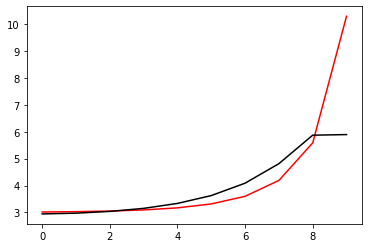

485100 0.0497307758031309
[2.90706713 2.93775581 3.00929393 3.13389829 3.3343167  3.65133145
 4.15487454 4.95236633 6.09773835 6.04024329]


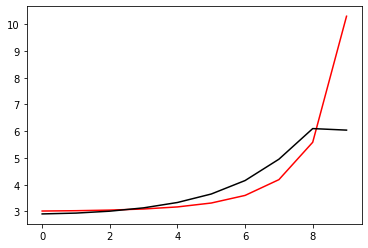

486200 0.03096198858898179
[2.79545076 2.83079986 2.90286366 3.02677497 3.22565727 3.53828821
 4.03309313 4.82777101 6.0274858  6.25571037]


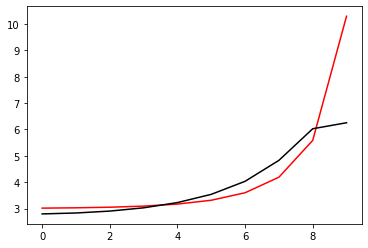

487300 0.029120907460137953
[2.99687026 3.00043273 3.03629407 3.11905298 3.26584046 3.50252133
 3.86832237 4.42364423 5.28592792 5.27417297]


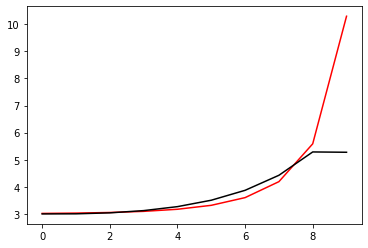

488400 0.02120133505448566
[2.98202011 2.99092905 3.02798873 3.11136736 3.26071995 3.50454899
 3.88779165 4.48146844 5.38616741 5.36498038]


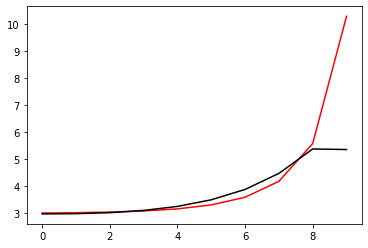

489500 0.021415343523395337
[2.96480068 2.97833637 3.01836859 3.10310867 3.2554569  3.50820963
 3.91406665 4.55746368 5.52184628 5.55717195]


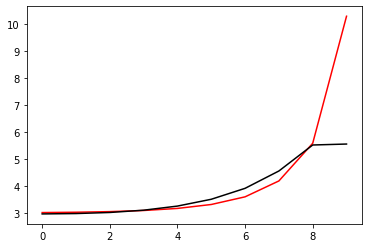

490600 0.011799547177009017
[2.99133192 3.01085184 3.05834085 3.15052487 3.31290478 3.58466492
 4.02916625 4.74389788 5.79157612 5.69472484]


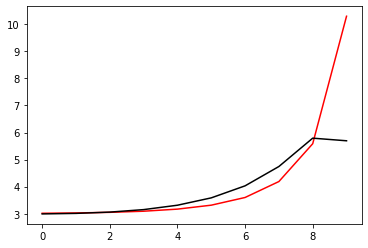

491700 0.01175498017913681
[2.9722935  2.99493633 3.0428151  3.13070917 3.28053954 3.52468622
 3.90267935 4.42169792 5.2522831  5.58625897]


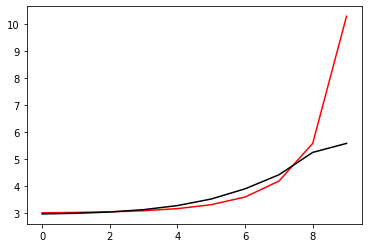

492800 0.021290553530779622
[3.00152109 3.02366404 3.073145   3.16328868 3.316365   3.56621468
 3.95963326 4.54579587 5.3567251  5.36684172]


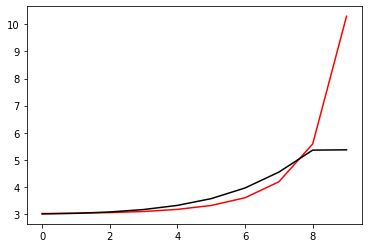

493900 0.011869507815515977
[2.96266059 2.98262332 3.03218292 3.12489376 3.28389783 3.54754553
 3.98078272 4.6873672  5.59265359 5.54450235]


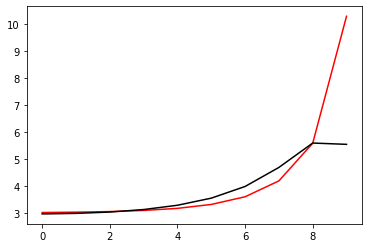

495000 0.031263952967931954
[3.02021221 3.0433718  3.09749898 3.1945631  3.35795559 3.62755025
 4.0689122  4.76414734 5.68887201 5.69247732]


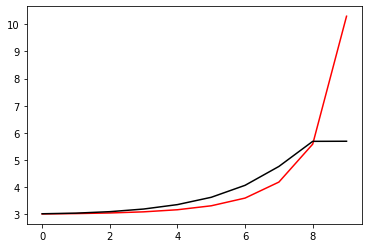

496100 0.05020229252874028
[2.92252585 2.94639651 3.00343615 3.10491691 3.27213489 3.54269868
 3.97992597 4.67751693 5.66482604 5.65325334]


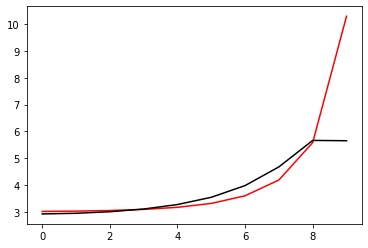

497200 0.012387288370427504
[2.96861643 2.98422116 3.02908388 3.12251204 3.29102828 3.57893259
 4.06472688 4.8659513  5.99473815 5.86202859]


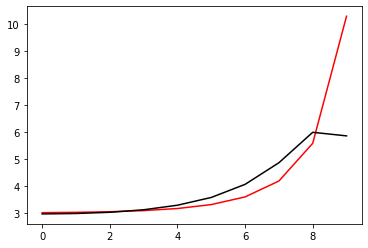

498300 0.023225007643022717
[2.95903291 2.95894755 2.98233995 3.04999684 3.18862432 3.44125897
 3.87700772 4.53452052 5.37886956 5.34719399]


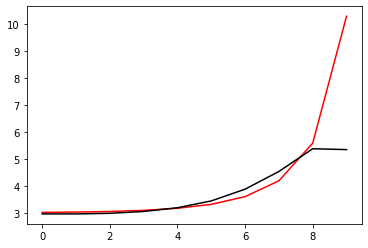

499400 0.020539185493848457
[2.96896925 2.98067511 3.01650204 3.09584809 3.24684433 3.51274036
 3.95872255 4.6442757  5.53923898 5.52018629]


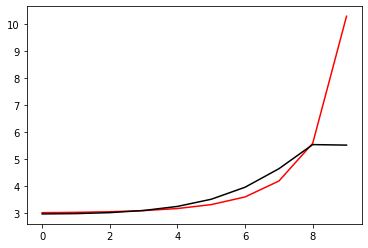

In [13]:
optimizer=tf.optimizers.Adam(learning_rate=0.001)
for j in range (5000):    
    with tf.GradientTape() as g:
        loss=Error_func(h, Positive[j%10], Negative[j%10])
        gradients=g.gradient(loss, [h])
    for i in range (100):
        optimizer.apply_gradients(zip(gradients, [h]))
    if j%11==0: 
        print(j*100, Error_func(h, Positive[j%10], Negative[j%10]).numpy()), print(h.numpy())
        plt.plot(h_real, 'r-'), plt.plot(h.numpy(), 'k-'), plt.show()

0 0.03350392710140826
[3.06103883 3.07450796 3.11385963 3.19673327 3.35095962 3.42268569
 3.87518897 4.5797253  5.51252728 5.67423838]


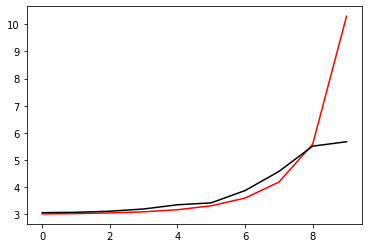

1100 0.051375610011643855
[2.75332325 2.99638125 3.08909791 3.17739704 3.32056176 3.41195486
 3.83970459 4.53527749 5.47322069 6.65888899]


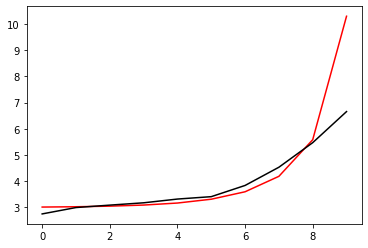

2200 0.01757941478134984
[2.76178576 2.92376198 3.05635439 3.17159731 3.31786815 3.46874628
 3.89277588 4.61714117 5.62482074 7.47110735]


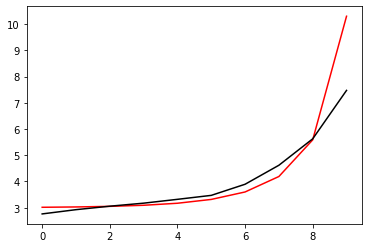

3300 0.030193486623284888
[2.9064551  2.99395333 3.11858154 3.24826806 3.39693393 3.5916491
 3.99646153 4.71752109 5.7822254  8.09179223]


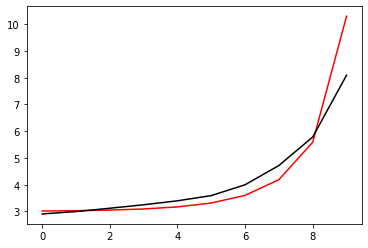

4400 0.05834412886299575
[2.667931   2.73170385 2.84223509 2.987734   3.16854072 3.41915933
 3.84268388 4.58486232 5.76317585 8.51023936]


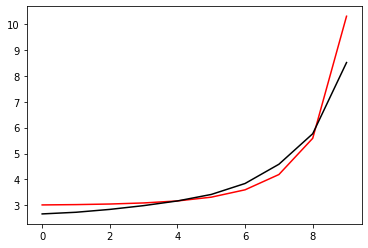

5500 0.022326729480589867
[2.95487189 2.99673287 3.08158796 3.20327081 3.36344865 3.58934229
 3.95906655 4.60015141 5.66677703 8.55680782]


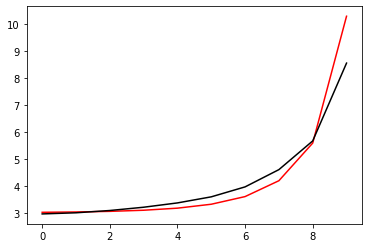

6600 0.012437106151997331
[2.96554032 3.00313912 3.08164132 3.20302076 3.3753669  3.62814435
 4.03487245 4.73231825 5.93044496 8.64326303]


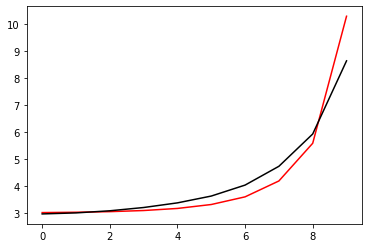

7700 0.012720729878846072
[2.93200927 2.97334158 3.05415247 3.1834262  3.37702913 3.6688009
 4.12938632 4.89059666 6.20278625 8.74447893]


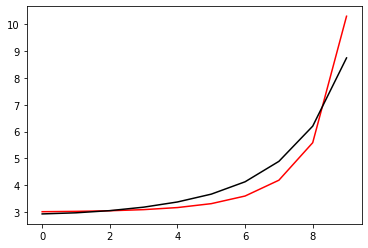

8800 0.0125042118242079
[2.85807063 2.90330034 2.98763583 3.11669651 3.30396555 3.57653984
 3.98743207 4.63897083 5.78615181 8.63371386]


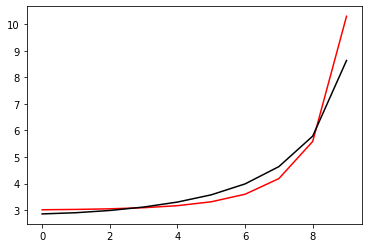

9900 0.01254006211191012
[2.8772934  2.91986967 3.00356199 3.13363603 3.32412039 3.60340581
 4.02667859 4.69804827 5.86194247 8.65768889]


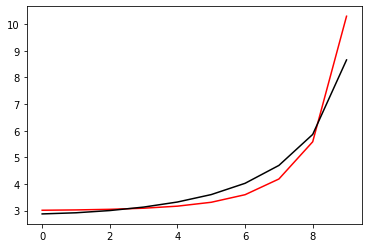

11000 0.032672531959191474
[2.87097805 2.91256483 2.99652771 3.12870807 3.32377366 3.61166055
 4.05053957 4.74981764 5.94673132 8.63547723]


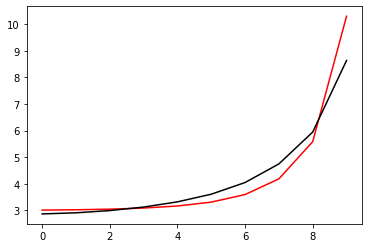

12100 0.1109967644006428
[3.0294434  3.06593001 3.14624496 3.28019503 3.48500135 3.79419018
 4.2699297  5.01721694 6.23861739 8.74377263]


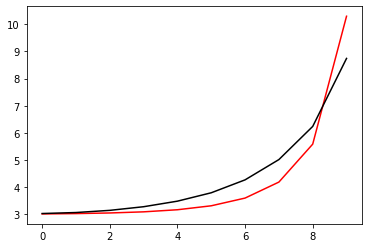

13200 0.01863193237952119
[2.8503343  2.88976098 2.96921514 3.09634855 3.28499604 3.56113515
 3.97084743 4.59386741 5.65238939 8.58622924]


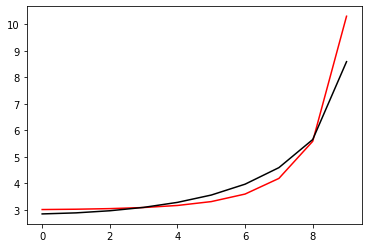

14300 0.023528411932689824
[2.89945533 2.93560348 3.01391741 3.14197123 3.3348368  3.62065478
 4.04961193 4.70443868 5.78208444 8.72140084]


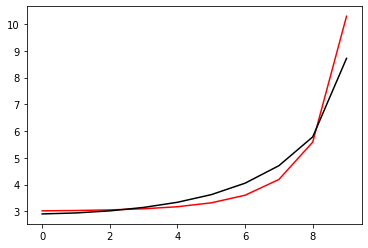

15400 0.012718560704430525
[2.82897512 2.8704546  2.95454346 3.089407   3.29180386 3.59317558
 4.05148964 4.76667095 5.92237212 8.65468001]


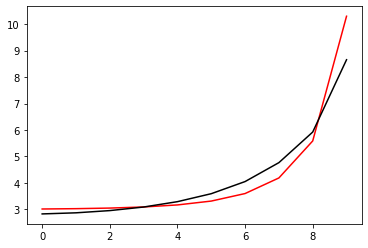

16500 0.06869300730343667
[2.7071194  2.75117209 2.83719551 2.97575931 3.18528604 3.50096173
 3.99228013 4.79057879 6.0695768  8.73846681]


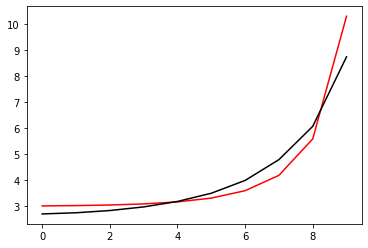

17600 0.012634646809167947
[2.96100192 2.99551666 3.069623   3.1950764  3.39038836 3.68784978
 4.14478779 4.86222764 6.06266357 8.68077763]


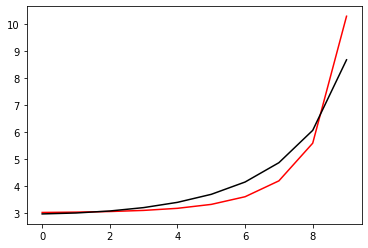

18700 0.01295445893401486
[2.90574083 2.94944915 3.03494801 3.17357641 3.38587571 3.707847
 4.20299337 4.98260388 6.2723145  8.6875233 ]


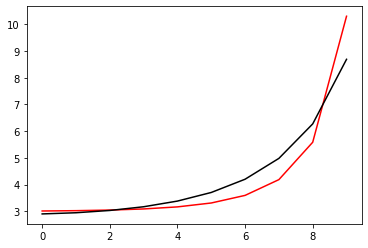

19800 0.01232026301314769
[2.86771005 2.88817368 2.95007404 3.06190582 3.24006169 3.51308787
 3.92877992 4.57187897 5.67818507 8.60088442]


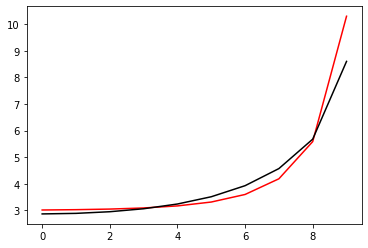

20900 0.012367417593417883
[2.87159323 2.89625122 2.96036697 3.07474873 3.2563406  3.53450687
 3.95877262 4.61603359 5.73595326 8.66032528]


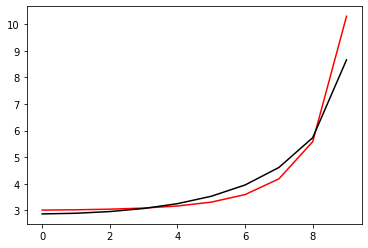

22000 0.03255541278866384
[2.8906659  2.92084372 2.98938096 3.10872213 3.29722021 3.58592856
 4.0273964  4.71131426 5.85476073 8.65686433]


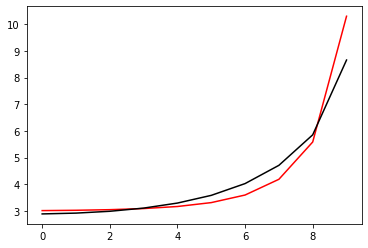

23100 0.04501355785658895
[2.84355912 2.87783903 2.95126375 3.07641872 3.27388624 3.57823608
 4.04933633 4.78976833 6.00618201 8.73222975]


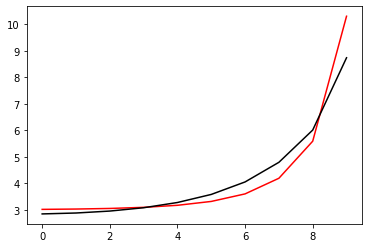

24200 0.01280581182985015
[2.8314748  2.86560611 2.93700805 3.05930743 3.25334352 3.55379753
 4.02104754 4.76349091 6.00280701 8.80443017]


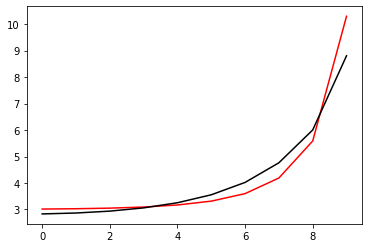

25300 0.0282445345320319
[2.98699101 3.02457627 3.10036773 3.22693422 3.42593684 3.73404419
 4.21421658 4.97192768 6.21016106 8.75919395]


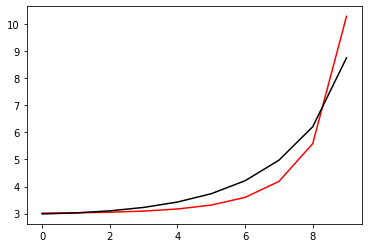

26400 0.013625878750791154
[2.86442989 2.89959497 2.97175522 3.09134977 3.27671338 3.55870106
 3.98915553 4.66347374 5.81294287 8.62724541]


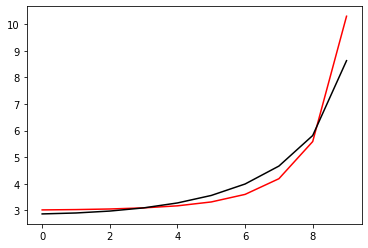

27500 0.02249009808186293
[2.88110336 2.9152827  2.98779494 3.10883109 3.2971994  3.58493928
 4.02646268 4.71924373 5.88515507 8.66740461]


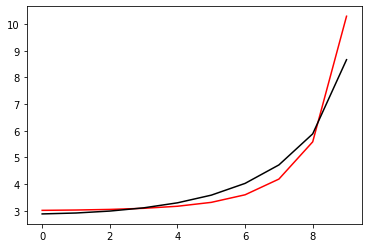

28600 0.021422590968691643
[2.88261526 2.91691792 2.99058456 3.11401312 3.30658799 3.60197177
 4.0583863  4.77855139 5.976083   8.67041443]


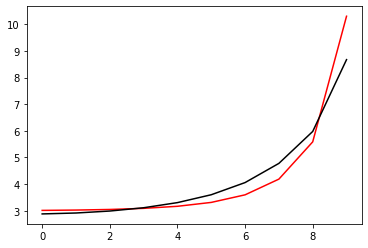

29700 0.012729479973718408
[2.94592389 2.97723863 3.049828   3.17540859 3.37471243 3.68442789
 4.16843703 4.93358967 6.17394532 8.78532571]


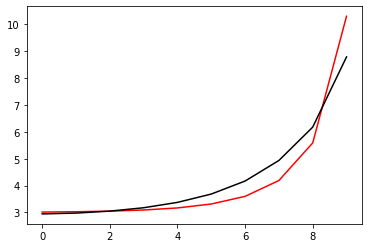

30800 0.01235025156738848
[2.86630956 2.89391266 2.95953606 3.07399006 3.25467028 3.53103642
 3.9516245  4.59787007 5.67239405 8.59691921]


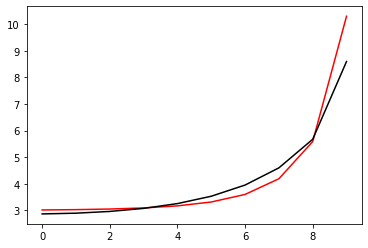

31900 0.012424331149645322
[2.88736421 2.91811344 2.98667239 3.1046495  3.29030368 3.57433289
 4.00756429 4.67357377 5.76649573 8.66260038]


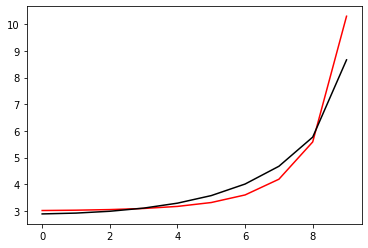

33000 0.03278125133391943
[2.86980186 2.90438305 2.9768443  3.09922396 3.29101999 3.58493687
 4.03624993 4.73711352 5.87811291 8.65909931]


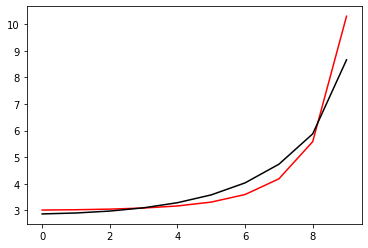

34100 0.044523086417183076
[2.8297435  2.86832795 2.94790837 3.0796012  3.28483444 3.60059376
 4.09095133 4.86243282 6.09483459 8.7334517 ]


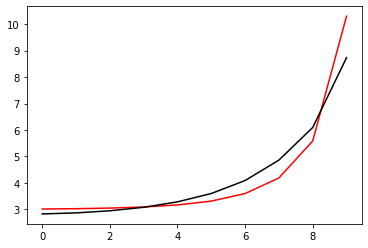

35200 0.014091597635342226
[2.82866482 2.85792484 2.92595347 3.04520773 3.23586222 3.53267965
 3.99742199 4.74547815 6.00623616 8.70986256]


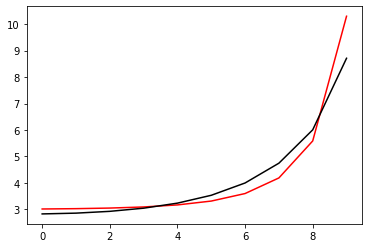

36300 0.02396685530232352
[2.91702156 2.94750639 3.01651982 3.1377818  3.33383883 3.64364111
 4.13738658 4.93769999 6.24685865 8.74682995]


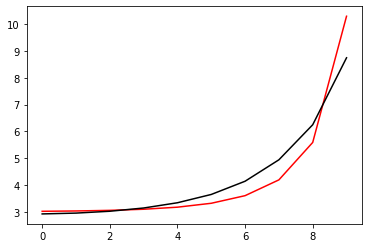

37400 0.03303196217289858
[2.77098051 2.80600861 2.88289979 3.01462408 3.2251985  3.55686465
 4.08315571 4.92455857 6.26159202 8.77851464]


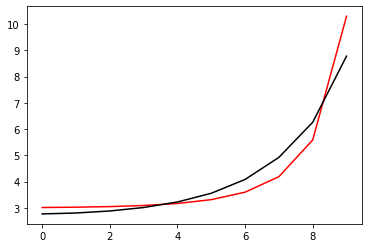

38500 0.02148612210081946
[2.85394253 2.88435399 2.95593017 3.08424542 3.29396779 3.6278131
 4.16024255 5.01611153 6.38975361 8.84007535]


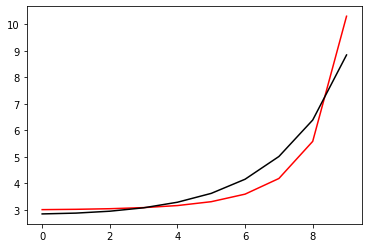

39600 0.012994019896637185
[2.95194961 2.9725039  3.0326638  3.15001005 3.35054175 3.67799941
 4.20863111 5.07458612 6.48956365 8.80154194]


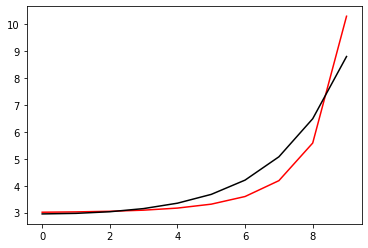

40700 0.01453883454230739
[2.88516995 2.91505938 2.97886096 3.09268389 3.27967343 3.57656829
 4.04598668 4.80314438 6.08022256 8.72424361]


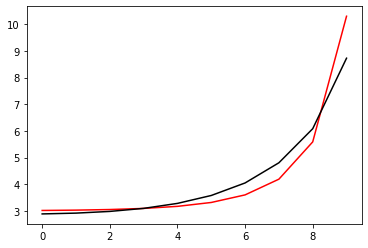

41800 0.012847122116448522
[2.89194226 2.92165492 2.98677551 3.10237712 3.29227458 3.59468204
 4.075025   4.85200497 6.15646155 8.74201726]


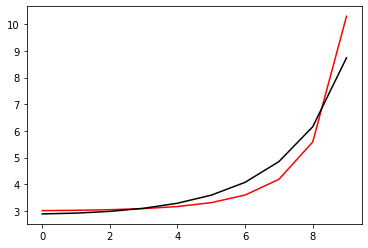

42900 0.01280192904678155
[2.88564592 2.91707293 2.98543744 3.1049796  3.30007071 3.61092861
 4.10693774 4.91271709 6.25997179 8.78648571]


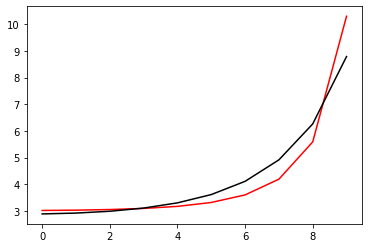

44000 0.03291748565215444
[2.90635271 2.93627746 3.00444079 3.12589787 3.32580781 3.64689686
 4.16390898 5.01077748 6.42224178 8.75987319]


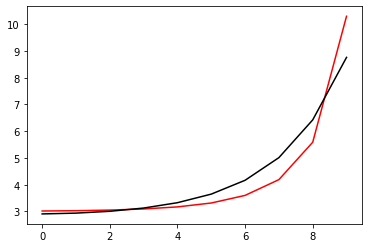

45100 0.04421381298004495
[2.82384835 2.85958345 2.9406982  3.07936956 3.30177048 3.65535495
 4.22429752 5.15489588 6.67444026 8.87531892]


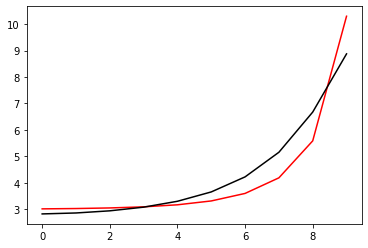

46200 0.6558700739381379
[3.17013754 3.19245689 3.25740205 3.38158951 3.59230992 3.93589405
 4.4912943  5.3830838  6.83207213 8.99757206]


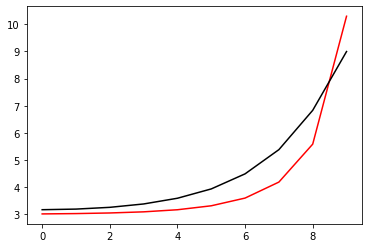

47300 0.08914586132685812
[2.79565418 2.81000299 2.85251708 2.94451951 3.111128   3.391754
 3.85497314 4.62420886 5.95242794 8.6524357 ]


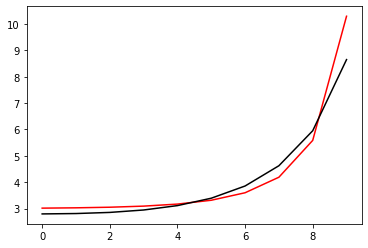

48400 0.0157372352705091
[2.93351416 2.93489087 2.96503483 3.04547975 3.20104599 3.46987378
 3.91768328 4.66359841 5.96157356 8.69015179]


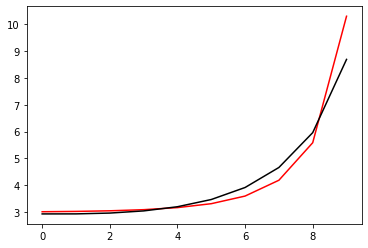

49500 0.02237855633428417
[2.9227646  2.93095226 2.96618666 3.05088259 3.2116408  3.48854797
 3.9502889  4.72021591 6.04945812 8.84916474]


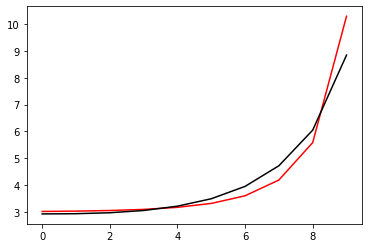

50600 0.02870527729554007
[2.867987   2.88965297 2.93826023 3.03334026 3.20331566 3.49080946
 3.96800861 4.76463218 6.13442228 8.75558562]


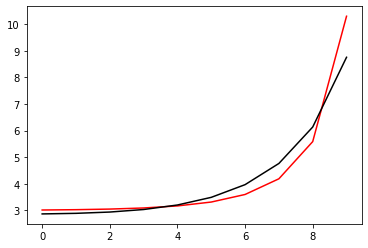

51700 0.012463125598136077
[3.0061063  3.01772309 3.05751676 3.14411245 3.30534902 3.58459669
 4.05437583 4.84548489 6.21674239 8.76810052]


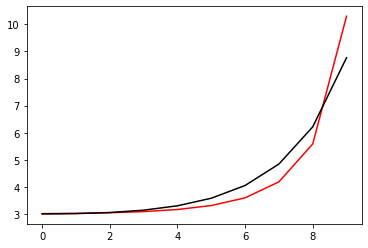

52800 0.013176303006972428
[2.91054643 2.93687484 2.99179837 3.09216498 3.26551708 3.55628373
 4.04018595 4.85417405 6.26629981 8.80514096]


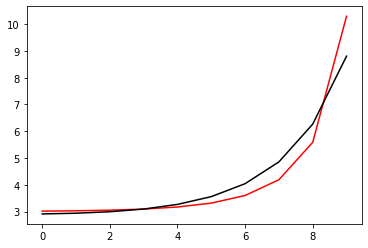

53900 0.012970024228354148
[2.95250646 2.97622921 3.03320222 3.13884298 3.32056485 3.62562564
 4.13700486 5.00547146 6.49641238 8.90805224]


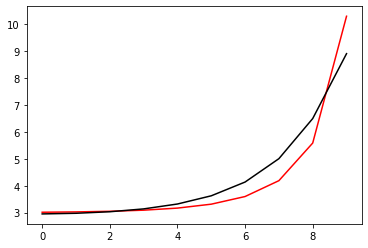

55000 0.03289001333521753
[2.87251079 2.90418744 2.96959814 3.08161782 3.26551118 3.56581676
 4.06123732 4.89464786 6.33010461 8.80971285]


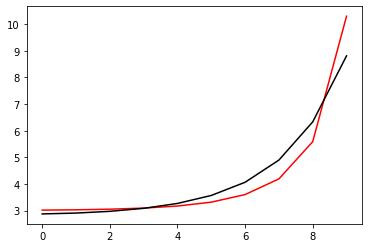

56100 0.16464067089387194
[3.05510817 3.08510459 3.14829447 3.25935097 3.44294339 3.74263821
 4.23616743 5.06696076 6.50589476 8.85728761]


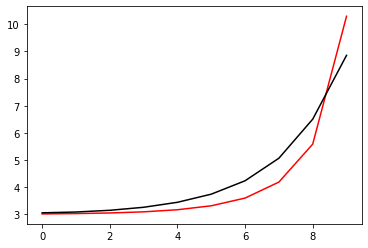

57200 0.017753420479122973
[2.92545493 2.93875488 2.98378462 3.07366048 3.22905609 3.48591783
 3.90772554 4.61732357 5.89416732 8.66644194]


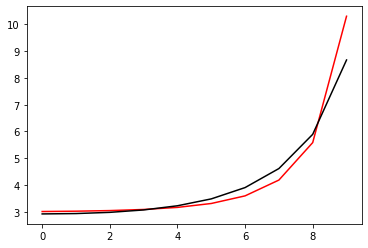

58300 0.02305867340564529
[2.92884918 2.94605172 2.99413638 3.08778056 3.24884274 3.51488613
 3.95269023 4.68851066 5.99420774 8.76056086]


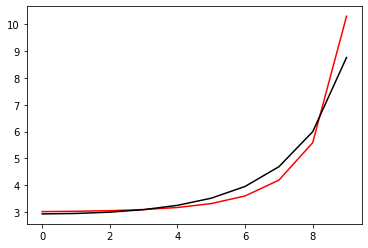

59400 0.012674562927126182
[2.85599367 2.88393297 2.94314389 3.04790903 3.22192333 3.50564255
 3.97172989 4.75524254 6.12194925 8.71740378]


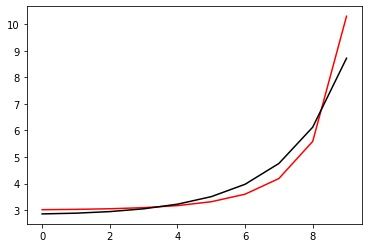

60500 0.022491307525633202
[2.94042034 2.96275822 3.01651863 3.11606635 3.28481901 3.56282951
 4.02203493 4.79768266 6.16092379 8.76868547]


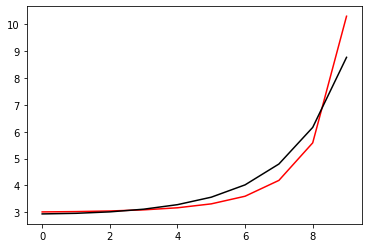

61600 0.031592236701028585
[2.84870396 2.87864152 2.93937225 3.04318639 3.21256093 3.48634881
 3.93489915 4.69532773 6.05940562 8.78227669]


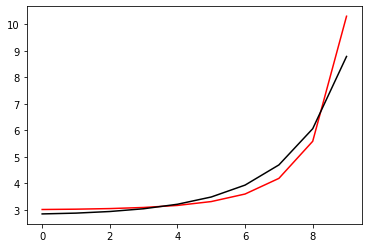

62700 0.012358787996026903
[2.98264408 3.00397746 3.0590021  3.15823777 3.32284803 3.59086915
 4.03045815 4.7646129  6.03789998 8.71875038]


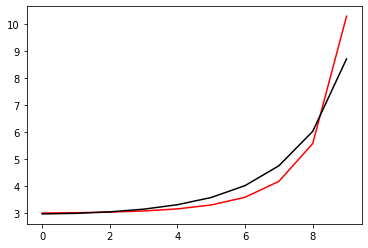

63800 0.02033089678188261
[2.94244941 2.96556693 3.02089815 3.11893085 3.27911699 3.53625273
 3.95286354 4.64680718 5.88236657 8.62417929]


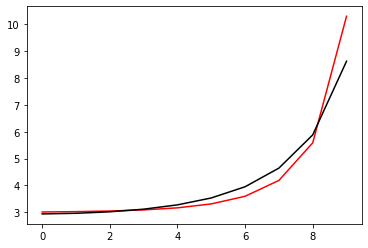

64900 0.012755240660902743
[2.85176393 2.88176277 2.94554388 3.05559341 3.23374395 3.51922282
 3.98504681 4.77254572 6.16596278 8.78928296]


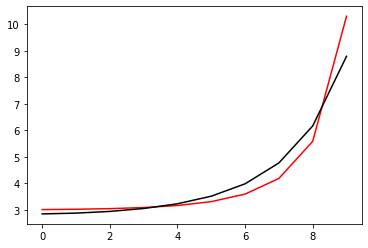

66000 0.03318383566574071
[2.8520142  2.89483127 2.97937152 3.11518675 3.32547646 3.65323971
 4.1770056  5.04276066 6.53051167 8.90721925]


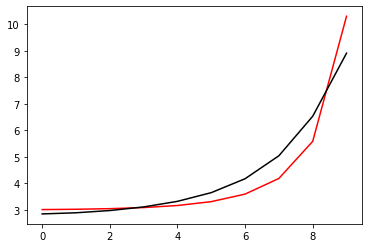

67100 0.05552630966060284
[2.77068353 2.79587836 2.8634839  2.98343757 3.17573628 3.47654929
 3.94563066 4.68297912 6.02652652 8.67402052]


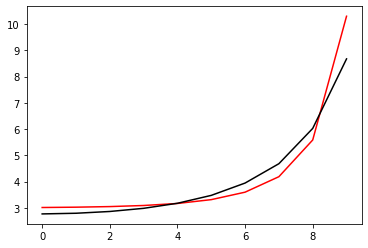

68200 0.01602204329458524
[2.86415296 2.88387586 2.94437403 3.05809481 3.24451388 3.53845164
 3.99752167 4.72042727 6.03839546 8.77638433]


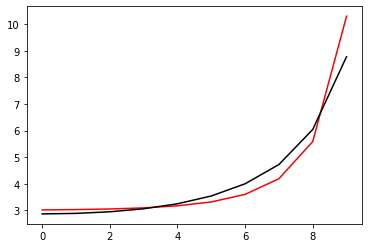

69300 0.02302464063518042
[2.9056516  2.92639231 2.98581115 3.09901697 3.2865396  3.58369863
 4.04980134 4.78856091 6.11609126 8.69652773]


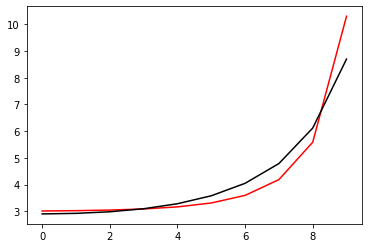

70400 0.01612506003771599
[2.90770404 2.931728   2.99421308 3.11182926 3.30800416 3.62144886
 4.11852428 4.91539327 6.30108283 8.81196927]


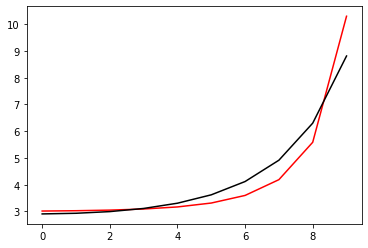

71500 0.029957432932358384
[2.81034942 2.83200936 2.8883923  2.9949849  3.17325093 3.45668869
 3.9010363  4.60797485 5.85572017 8.63198996]


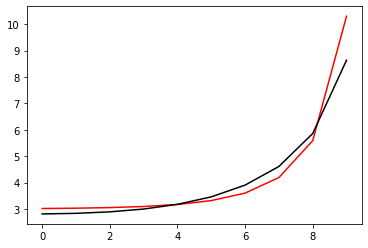

72600 0.02386818158182971
[2.89753031 2.91409843 2.96502388 3.06692144 3.24140761 3.52192967
 3.96389133 4.66806567 5.90714962 8.65372763]


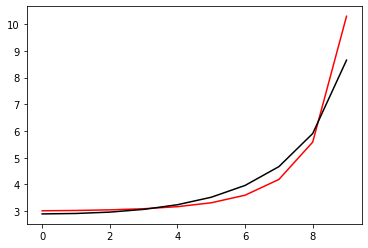

73700 0.012985738577126153
[2.92320679 2.94348582 2.99726809 3.10203775 3.28069156 3.56831276
 4.0231612  4.75017016 6.01347137 8.70696447]


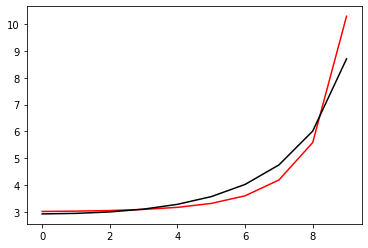

74800 0.012743794888069666
[2.89170334 2.92138072 2.98511928 3.09805387 3.28426278 3.58100829
 4.05043994 4.80515089 6.10605267 8.64975061]


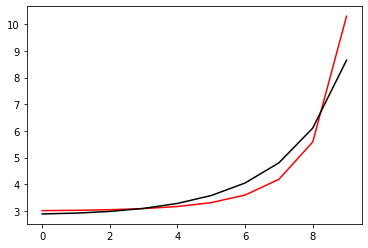

75900 0.012949997555276411
[2.94844138 2.97453893 3.03692567 3.15077029 3.34089589 3.64797546
 4.1411699  4.94451173 6.30881236 8.83608565]


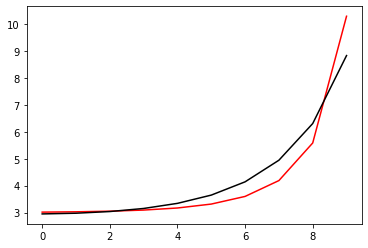

77000 0.03254219137239922
[2.89578033 2.92474531 2.98698407 3.0958019  3.27289541 3.5525777
 3.99043734 4.68704067 5.89286928 8.66837495]


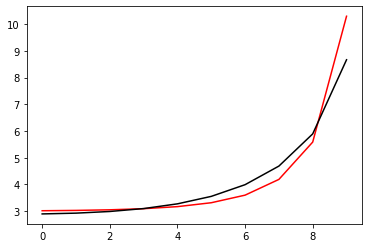

78100 0.04790478433327665
[2.88217001 2.91224731 2.97676391 3.08864824 3.2701505  3.55728023
 4.00974469 4.73447967 5.97463156 8.77605806]


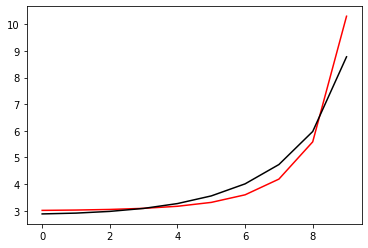

79200 0.014738304665282483
[2.8168234  2.85550893 2.92985902 3.05269649 3.24763499 3.55446034
 4.04131035 4.82733815 6.14076561 8.74131955]


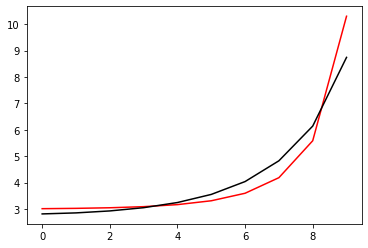

80300 0.024831406078042993
[2.92654952 2.95624866 3.02601974 3.14765082 3.3447032  3.65835372
 4.15926812 4.96860227 6.31079049 8.83644675]


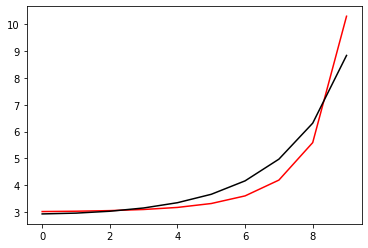

81400 0.042614918961826814
[2.75417518 2.78988156 2.86116388 2.98044863 3.16863896 3.46167583
 3.92061173 4.65038958 5.8703674  8.67157019]


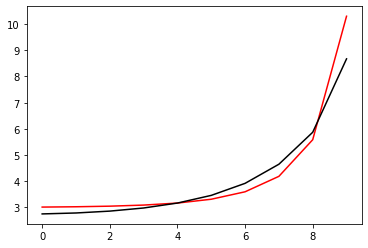

82500 0.018482000447820206
[2.86318784 2.888268   2.94963687 3.06011839 3.24021618 3.52500984
 3.97422156 4.69163683 5.898391   8.67183424]


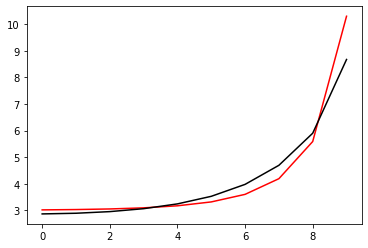

83600 0.02119475516913117
[2.8977923  2.92430102 2.98731033 3.10042604 3.28503723 3.57737681
 4.03944199 4.77895841 6.01762023 8.64526578]


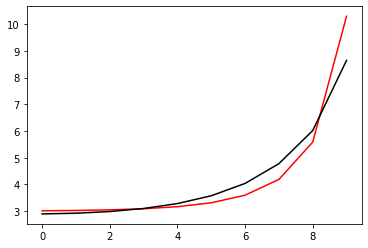

84700 0.012973388631056754
[2.89568737 2.92806671 2.99816848 3.11973173 3.31575962 3.62512733
 4.11477989 4.90083028 6.2062634  8.79677897]


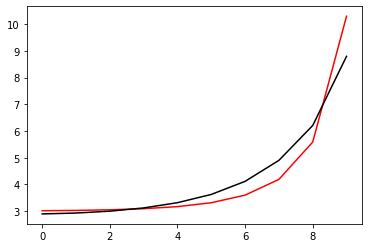

85800 0.022360908628804792
[2.93626726 2.96472008 3.03168309 3.15121248 3.34656753 3.65756727
 4.15363924 4.9594633  6.31184582 8.80308297]


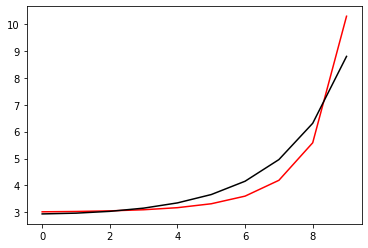

86900 0.012325571845078091
[2.88365844 2.90075304 2.95442882 3.05700351 3.2281324  3.50059907
 3.93050067 4.6219852  5.81146182 8.63953928]


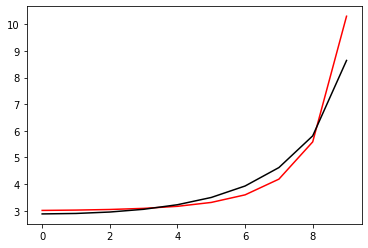

88000 0.032507669106807136
[2.90534203 2.92748187 2.98458043 3.0909204  3.26698688 3.54663402
 3.98789717 4.69706854 5.90891373 8.6639338 ]


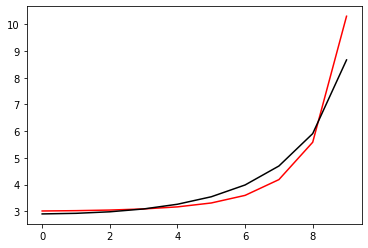

89100 0.04541098633661956
[2.86224044 2.89034    2.95339418 3.06622206 3.2511902  3.54489325
 4.01065289 4.76309997 6.03802692 8.70827903]


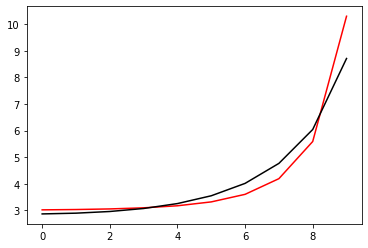

90200 0.01692145058621175
[2.8781925  2.9102389  2.97614794 3.09107753 3.27804035 3.57456638
 4.0456827  4.81020945 6.11020885 8.78395656]


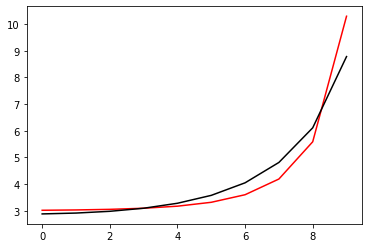

91300 0.025619857608110787
[2.98274082 3.00687626 3.07065079 3.18744027 3.38180364 3.69555733
 4.20125614 5.02831147 6.41926934 8.76441885]


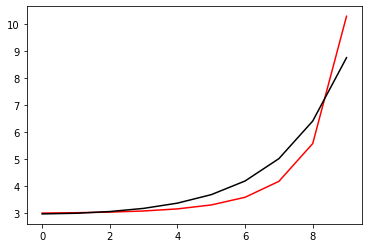

92400 0.017053294991776775
[2.79385453 2.82705116 2.90301424 3.0385026  3.2628219  3.62587618
 4.21504866 5.17907771 6.74833614 9.01079356]


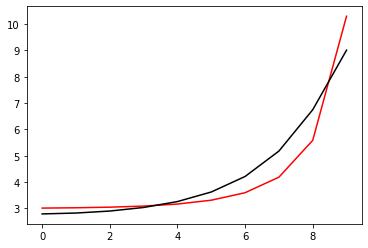

93500 0.02298162519919543
[2.96561616 3.00415225 3.08112403 3.21068883 3.41782354 3.74193585
 4.23678658 4.92476716 6.04210336 8.71458494]


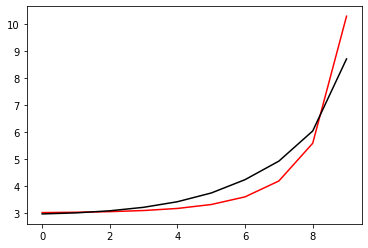

94600 0.02068624719080788
[2.85890855 2.90478088 2.9909904  3.12866209 3.34164648 3.66822816
 4.16465616 4.92156458 6.11514514 8.7403072 ]


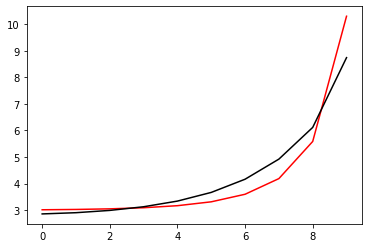

95700 0.01328313354040503
[2.90974447 2.95060937 3.03701712 3.18032993 3.40545754 3.75826239
 4.3224739  5.21652763 6.42239049 8.93907767]


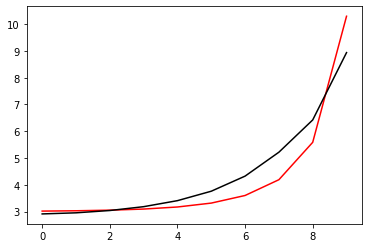

96800 0.013715849055642809
[2.81263548 2.86105382 2.95720244 3.11349635 3.35514003 3.73007511
 4.32416178 5.27689111 6.64126485 8.90799355]


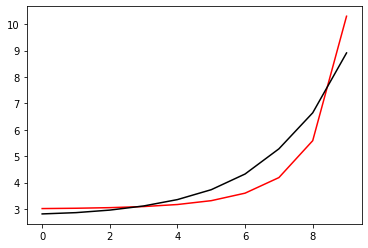

97900 0.013194086139320828
[2.95915878 2.97645842 3.03976535 3.16132576 3.36169917 3.67724304
 4.16439823 4.89364415 6.0108511  8.70496408]


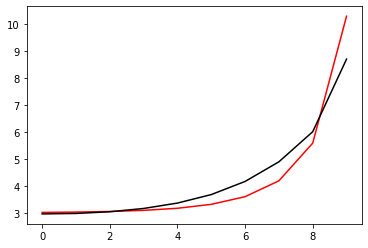

99000 0.03246779745317499
[2.96396662 2.98594188 3.05075288 3.17430194 3.37840468 3.70063884
 4.20087076 4.95799898 6.1000454  8.78095416]


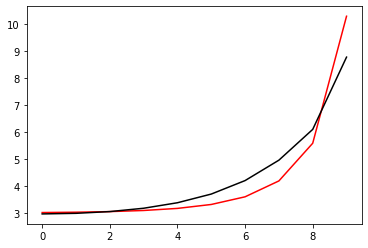

100100 0.031102717339157877
[2.99524785 3.02383384 3.09379136 3.22272579 3.43507361 3.77109007
 4.29586685 5.09405008 6.2654037  8.76173405]


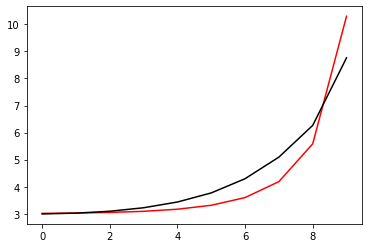

101200 0.01689006365416156
[2.79581231 2.83933486 2.9254947  3.06821995 3.29306912 3.64328245
 4.19325144 5.05985343 6.36574153 8.83856608]


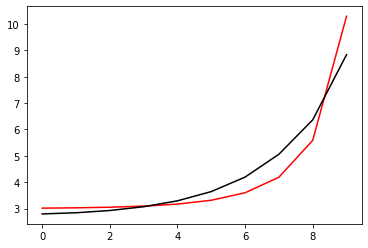

102300 0.07836618189495864
[2.76641294 2.79746819 2.86717968 2.99122641 3.19280498 3.50968768
 4.00300819 4.7636762  5.93849957 8.66327379]


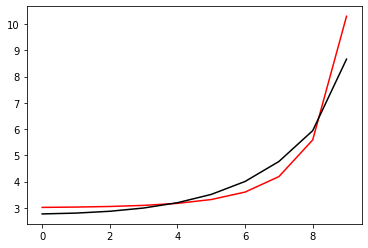

103400 0.015324124504590501
[2.90014897 2.91766615 2.97447942 3.08692285 3.27742486 3.58207066
 4.05881242 4.79520018 5.94427805 8.67911574]


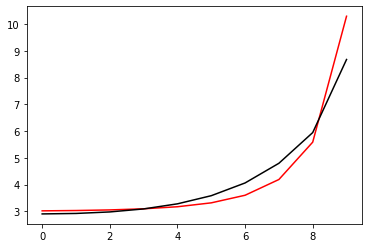

104500 0.022567599692539318
[2.88641394 2.90782974 2.96670757 3.0810312  3.27446633 3.58444721
 4.07179265 4.83035082 6.01714536 8.76839642]


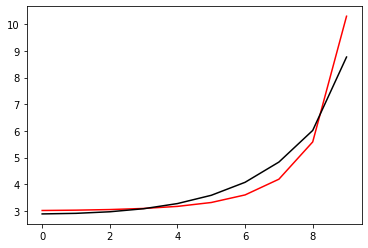

105600 0.020394047104404938
[2.89160843 2.91693301 2.97948327 3.09748471 3.29660102 3.61686935
 4.12370526 4.91934478 6.16412975 8.72282639]


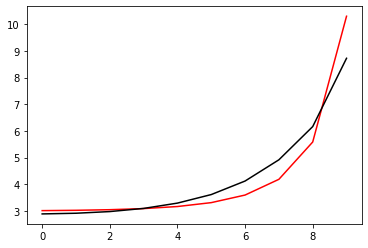

106700 0.012754250654313983
[2.97191777 2.99235951 3.0495947  3.16208976 3.35644143 3.67424845
 4.1832743  4.99379193 6.2839637  8.80934287]


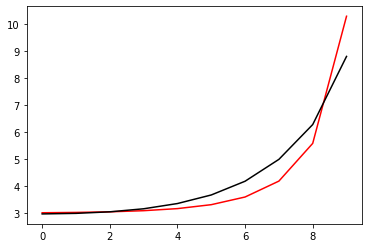

107800 0.012503200318557273
[2.89073974 2.9165575  2.97507245 3.08338597 3.26545993 3.55678301
 4.01107492 4.7132858  5.85019555 8.65628046]


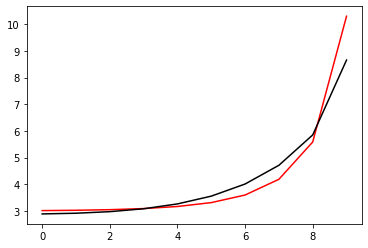

108900 0.01250253808266924
[2.89708069 2.92372748 2.98386272 3.0940178  3.27868618 3.57459443
 4.03831203 4.75927736 5.92011142 8.6809175 ]


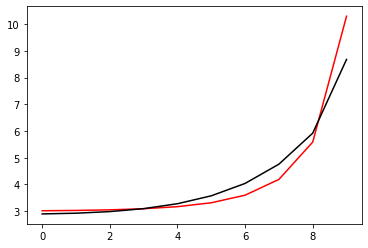

110000 0.032672232055444145
[2.88650167 2.91606545 2.98014562 3.09426557 3.28339857 3.5859794
 4.06269265 4.81092014 6.01222814 8.70827256]


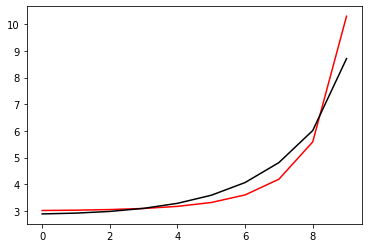

111100 0.1271258966842491
[3.04599128 3.07382295 3.138637   3.25706099 3.45546113 3.77584964
 4.28445217 5.07920109 6.31738428 8.82548837]


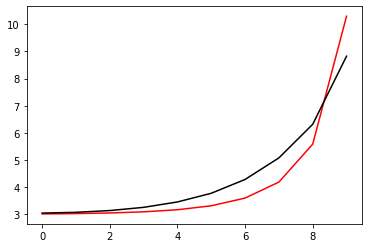

112200 0.018743546232817838
[2.86935224 2.89623725 2.95692813 3.0657391  3.24523433 3.53006358
 3.97211057 4.64904134 5.73565984 8.61171964]


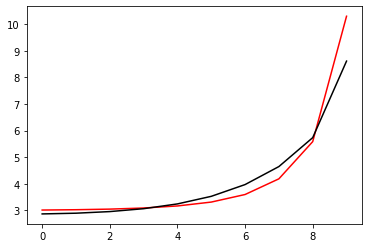

113300 0.023136284269503274
[2.90684432 2.93368073 2.99566189 3.10679796 3.2901761  3.5818461
 4.03684084 4.73670481 5.84683894 8.65474917]


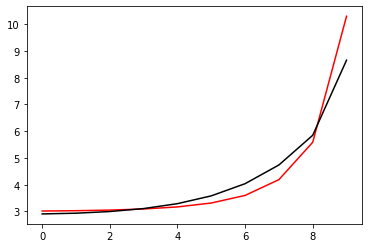

114400 0.01315713474584878
[2.86689318 2.89649193 2.96341939 3.08090416 3.27284235 3.57813636
 4.05926965 4.81247375 5.99770827 8.6197904 ]


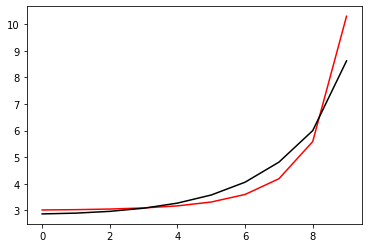

115500 0.02232247124794334
[2.85883286 2.89038628 2.96332028 3.09037179 3.29602222 3.62284748
 4.14228373 4.96557915 6.24267556 8.82337072]


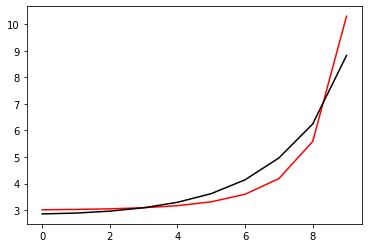

116600 0.014055100333477523
[2.97602734 3.00056743 3.0658685  3.19129917 3.40484617 3.75483991
 4.32417555 5.23755114 6.626749   8.82717227]


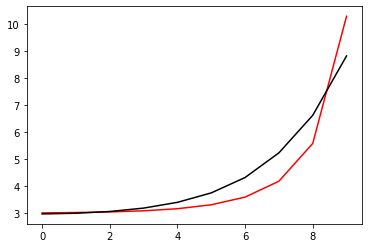

117700 0.01566560332715547
[2.85964275 2.87417336 2.93267098 3.05258897 3.26384806 3.61713822
 4.19537919 5.11088362 6.52033185 9.0343718 ]


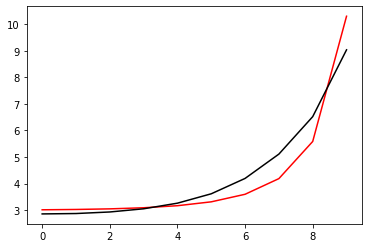

118800 0.02303989347841255
[2.95085455 2.97182575 3.02892055 3.14499729 3.3512968  3.69744494
 4.26504903 5.177622   6.61352102 8.8931563 ]


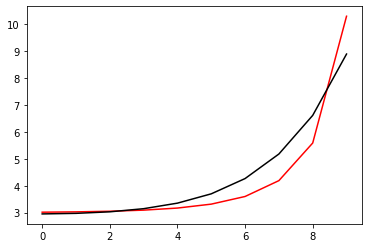

119900 0.012621469531404894
[2.89257105 2.91956136 2.9790901  3.09016907 3.28025481 3.58935496
 4.07513159 4.82060131 6.05514616 8.71915636]


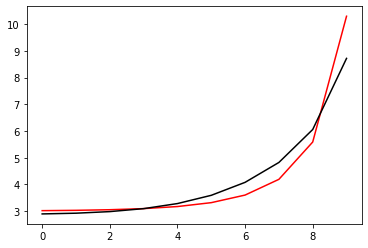

121000 0.03271502169508487
[2.89435344 2.92174114 2.98329818 3.09645727 3.28885811 3.60184702
 4.09758944 4.8709301  6.13158756 8.65157158]


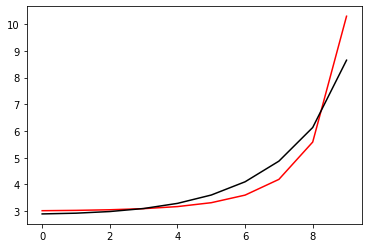

122100 0.046055838207677224
[2.86697131 2.89528819 2.96015955 3.07777149 3.27606259 3.59951365
 4.12003828 4.95410468 6.28157452 8.78833503]


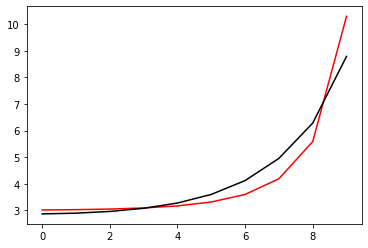

123200 0.2246699700912402
[2.63865564 2.66787702 2.73508338 2.85872838 3.06853712 3.41346311
 3.97171623 4.84938457 6.18240881 8.94243181]


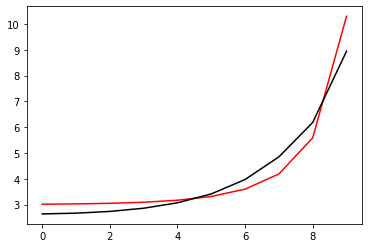

124300 0.02306554411392556
[2.90074558 2.92715202 2.98867891 3.10146309 3.29133449 3.59902854
 4.08580032 4.83537839 6.00953372 8.70773311]


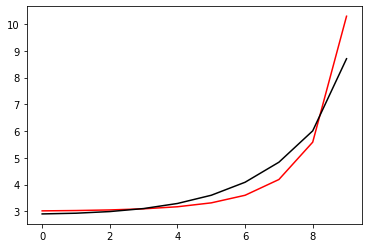

125400 0.013611161191569854
[2.87892869 2.90726878 2.97165002 3.08803362 3.28286439 3.59860269
 4.10155873 4.88684289 6.10747165 8.63814417]


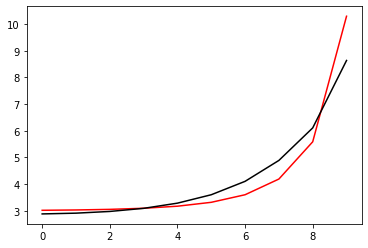

126500 0.021731516868538883
[2.85860732 2.88937503 2.9576708  3.07928042 3.28135468 3.60878338
 4.13465409 4.9684098  6.25470725 8.81283259]


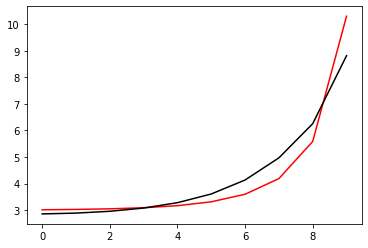

127600 0.012961937432787965
[2.94949662 2.96839508 3.02545611 3.1379452  3.33250334 3.65355828
 4.17450312 5.01472146 6.35025884 8.79224343]


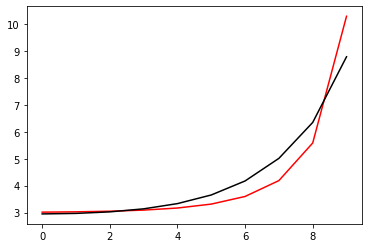

128700 0.012760003750647413
[2.96221172 2.98871631 3.05048492 3.16399774 3.35535252 3.66680004
 4.16936842 4.98398114 6.31892911 8.81141544]


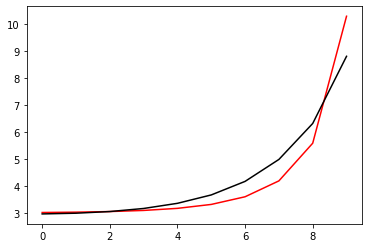

129800 0.012412126022825081
[2.87413078 2.89641285 2.95245209 3.05627881 3.23040804 3.51077176
 3.95653336 4.67259316 5.8778548  8.66442549]


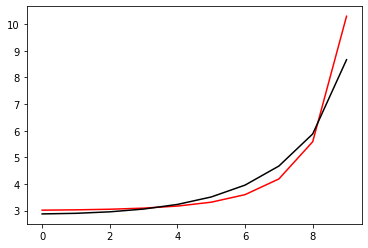

130900 0.012464500234988293
[2.87914756 2.9048306  2.96399232 3.07097128 3.24864193 3.53371875
 3.98694546 4.71503164 5.93592179 8.68287217]


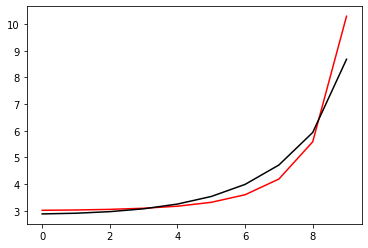

132000 0.03261896925891853
[2.89336617 2.92399758 2.98895661 3.10204875 3.28677811 3.58131081
 4.04911591 4.79980739 6.04824901 8.71700656]


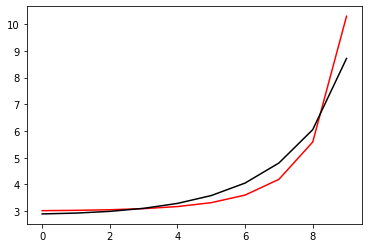

133100 0.045275101455590994
[2.85405213 2.88636379 2.95594909 3.07563276 3.26965791 3.57908676
 4.07394552 4.87501022 6.19742949 8.78349873]


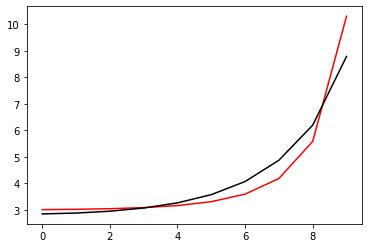

134200 0.37321809163295727
[2.62098819 2.64769626 2.70985235 2.82448007 3.01678404 3.32892491
 3.83207454 4.64445366 5.9753902  8.88932951]


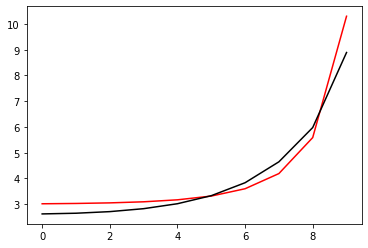

135300 0.02913642509534849
[2.89575564 2.90938941 2.95650459 3.05287773 3.22045789 3.49511399
 3.93674041 4.64840799 5.84348076 8.65239647]


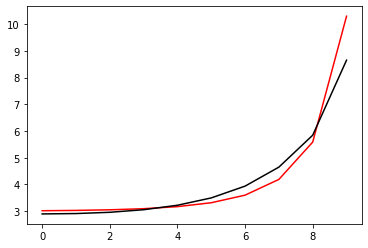

136400 0.015564521289247754
[2.90961024 2.92642421 2.97589358 3.07505733 3.24703762 3.52907025
 3.98358839 4.71731221 5.94268531 8.59378886]


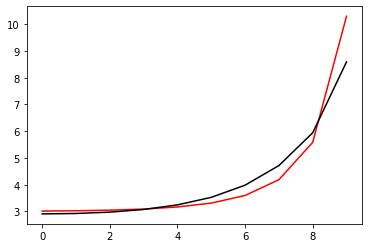

137500 0.03119157667807269
[2.79363366 2.82843792 2.89473999 3.00886672 3.19597895 3.4962816
 3.97787111 4.7578374  6.05295608 8.72566435]


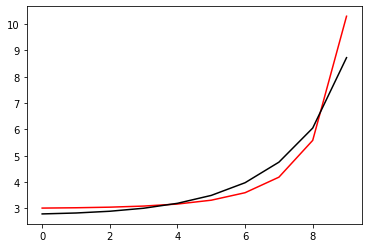

138600 0.019459638826905365
[2.90077569 2.93330027 2.99812078 3.11008288 3.2936039  3.58791462
 4.05917143 4.82320703 6.10621715 8.71177209]


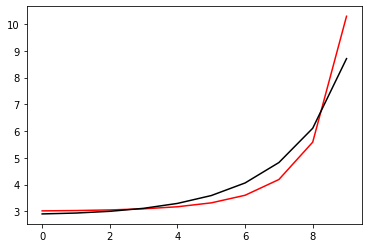

139700 0.012926152197237688
[2.95967603 2.99415346 3.06643226 3.18956391 3.38862989 3.70684068
 4.21770349 5.0442567  6.39948823 8.89838621]


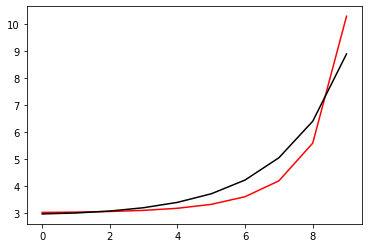

140800 0.02027117191047919
[2.93052777 2.95663315 3.02012003 3.13206994 3.31374658 3.60199626
 4.05879682 4.79115716 6.01649055 8.70816674]


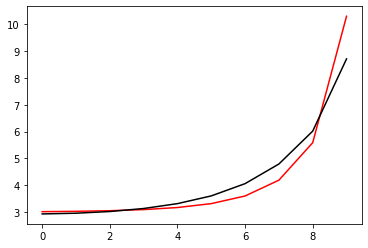

141900 0.012630927814894445
[2.92872264 2.95683087 3.02161378 3.13555998 3.32022415 3.61310008
 4.07827759 4.8273168  6.08019991 8.75130056]


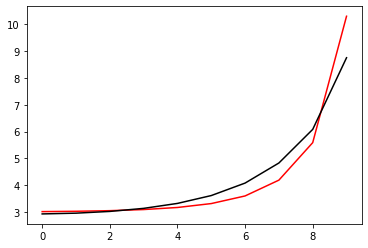

143000 0.032626855205709064
[2.92920343 2.9589914  3.02589676 3.14289341 3.33224569 3.63253977
 4.11092373 4.88584743 6.18210613 8.75875296]


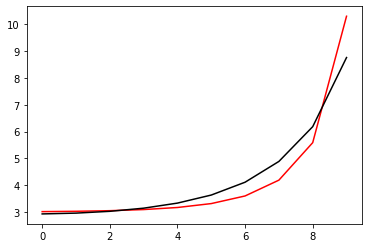

144100 0.3467884450439778
[3.05328281 3.089391   3.16496534 3.29340584 3.49830178 3.82047025
 4.33013275 5.14747191 6.48932551 8.73955059]


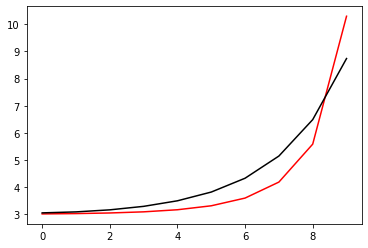

145200 0.01672189090830778
[2.85873516 2.88704954 2.95251477 3.06681106 3.24991581 3.53600525
 3.98335373 4.69664772 5.90313467 8.66862638]


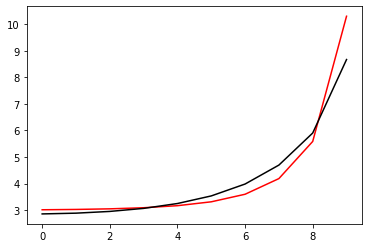

146300 0.023065399968150074
[2.90279116 2.92904023 2.99288701 3.10669069 3.29082885 3.58013435
 4.03426599 4.75910887 5.97874478 8.68415551]


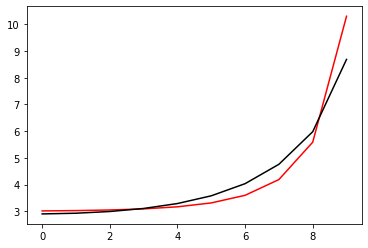

147400 0.01796164248912204
[2.91493709 2.94160463 3.00704211 3.12472349 3.31670212 3.62073016
 4.10218321 4.87375931 6.14967749 8.74495224]


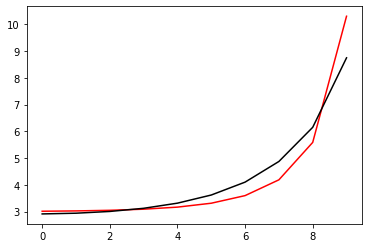

148500 0.013673923109040347
[2.85650582 2.87673921 2.93289868 3.03820278 3.21324394 3.49254726
 3.93613459 4.6511624  5.85792019 8.65186641]


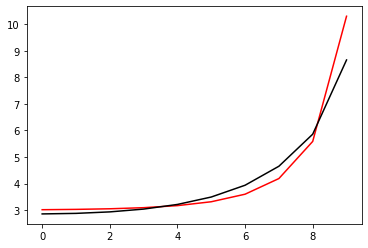

149600 0.02026832473234521
[2.91354998 2.93554542 2.99216232 3.09871441 3.27705484 3.56322
 4.01992512 4.76001656 6.01301508 8.6838093 ]


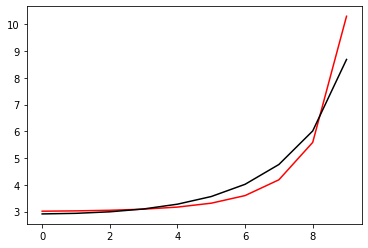

150700 0.012745358008258087
[2.95452379 2.98240863 3.04745942 3.16411524 3.35632533 3.66394835
 4.15615523 4.9571395  6.30557483 8.80857714]


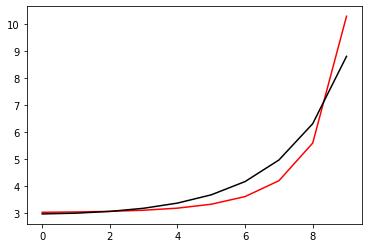

151800 0.012533707904562024
[2.89256469 2.92289796 2.98686381 3.09697717 3.27358634 3.54953329
 3.97980179 4.66771402 5.86517225 8.66120898]


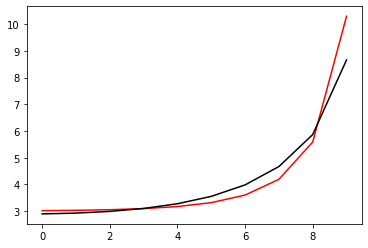

152900 0.012466770578912633
[2.89158604 2.92305129 2.98899476 3.10163973 3.28179943 3.56359438
 4.00492616 4.71273378 5.93211308 8.68557032]


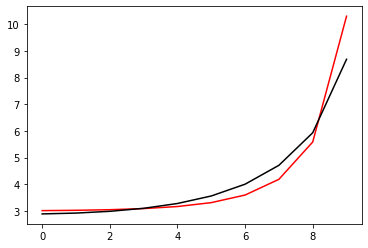

154000 0.03269381162009489
[2.87838395 2.91220268 2.98181722 3.09895907 3.28501502 3.57601287
 4.03421666 4.7729641  6.0302425  8.71317408]


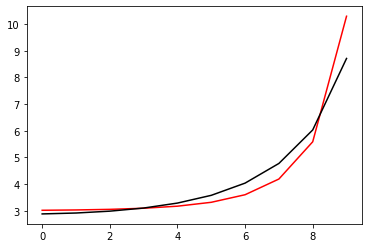

155100 0.04479158466002437
[2.83873451 2.87717691 2.95456279 3.08082313 3.27805985 3.58546118
 4.07233852 4.86210996 6.18141655 8.69935587]


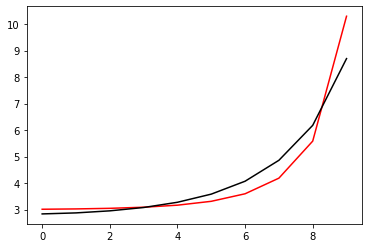

156200 0.32273393509899917
[2.61098975 2.64922433 2.72717631 2.85718033 3.06169521 3.38084677
 3.88314903 4.67928224 5.97830501 8.95412491]


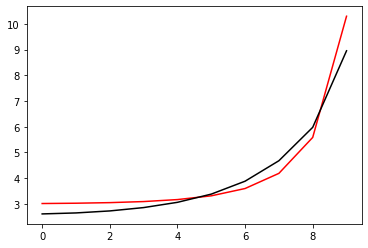

157300 0.03087971254659881
[2.8631839  2.89304389 2.96064525 3.07654514 3.25968197 3.54347375
 3.98423377 4.67692425 5.83854949 8.65041745]


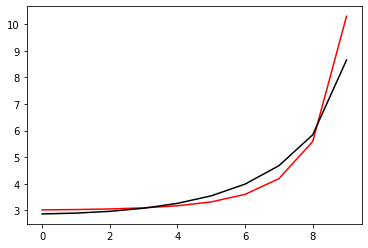

158400 0.015908706313026943
[2.89344643 2.92162813 2.98856942 3.10557157 3.29232885 3.58353438
 4.03820082 4.75496062 5.9446298  8.69006043]


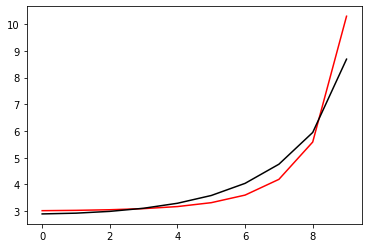

159500 0.030878733559743635
[2.78139658 2.82360913 2.90327735 3.03231393 3.23199083 3.53951624
 4.01972338 4.78344026 6.0424076  8.71713459]


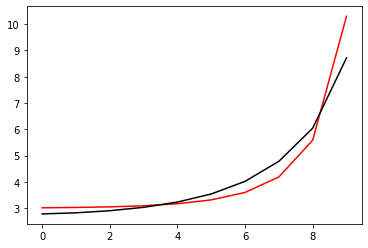

160600 0.15077727043214773
[3.06957646 3.09388382 3.15446499 3.2636791  3.44148977 3.72092531
 4.15665876 4.84127671 5.99837531 8.72234535]


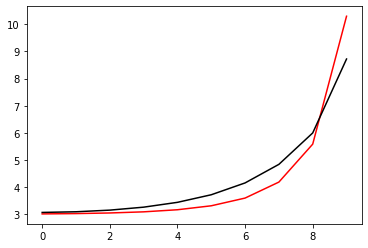

161700 0.012720606914130574
[2.97721069 2.98147084 3.01836266 3.1025249  3.25189089 3.49590099
 3.88471712 4.50952924 5.60476632 8.57253857]


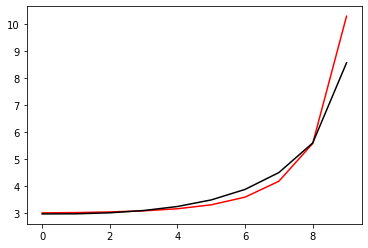

162800 0.02178925585512756
[2.97171432 2.98349834 3.02359561 3.1097132  3.26186435 3.51090399
 3.90964627 4.55580134 5.69316655 8.72873978]


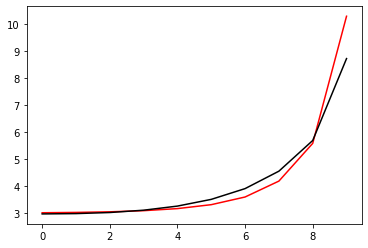

163900 0.012357506539206253
[2.96607111 2.9830302  3.02717026 3.11515083 3.2693262  3.52316723
 3.93361496 4.60802064 5.80379467 8.65078161]


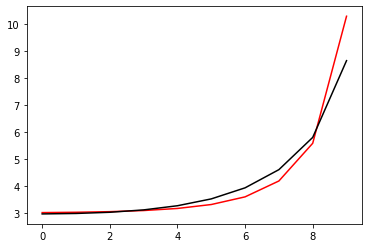

165000 0.03235631396268714
[2.93564277 2.9538731  3.00152179 3.09353341 3.25366382 3.52011558
 3.95861283 4.69330499 5.99895832 8.71534335]


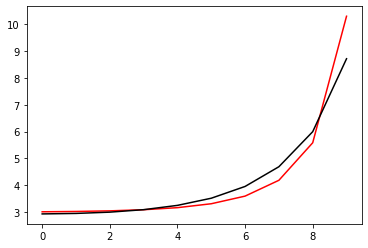

166100 0.05089952179850041
[2.96095748 2.9678274  3.00006005 3.07378928 3.21097336 3.44622001
 3.83491862 4.46186219 5.60199858 8.60168925]


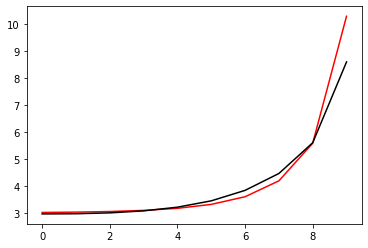

167200 0.012918579096359965
[2.98897354 3.00598118 3.04812165 3.13135955 3.27878018 3.52609832
 3.93114329 4.59088337 5.77455949 8.56294669]


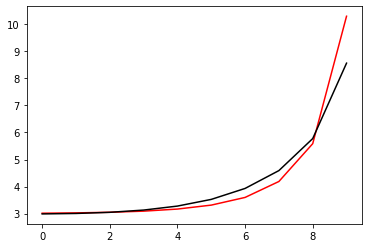

168300 0.024462324298401453
[2.95098441 2.96890496 3.01499555 3.10428121 3.26089878 3.52386442
 3.95826414 4.67880548 5.95194475 8.68457706]


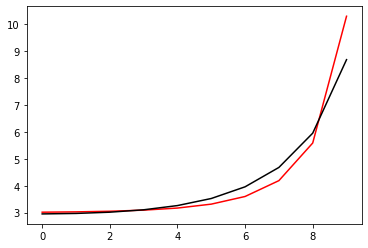

169400 0.017976949764939736
[2.92370599 2.94996192 3.01096745 3.12040736 3.30357422 3.60360979
 4.09411579 4.90173927 6.28243687 8.76762807]


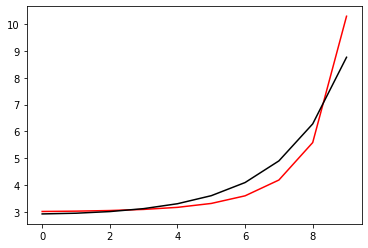

170500 0.022124957801633878
[2.90595947 2.92099963 2.9689393  3.06150243 3.21893534 3.47517771
 3.88681293 4.55878059 5.75476627 8.62522391]


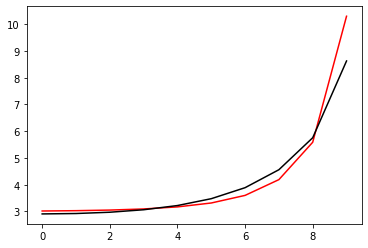

171600 0.020509372130741547
[2.92722725 2.94698535 2.99879669 3.09628263 3.26062885 3.5273381
 3.95641858 4.65709497 5.88618443 8.65571983]


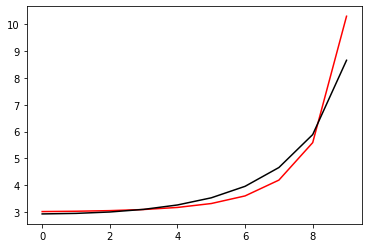

172700 0.02972710266479226
[2.87806433 2.88252122 2.91860002 2.99864798 3.14278933 3.38399122
 3.77842544 4.43504316 5.63923641 8.66856796]


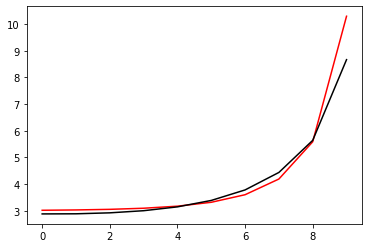

173800 0.02179339905117609
[2.97591507 2.98638265 3.02351216 3.10427283 3.24963236 3.49298704
 3.89172927 4.55669335 5.76990909 8.60895076]


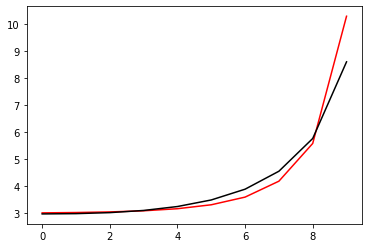

174900 0.012320838927541156
[2.96650932 2.98250307 3.02427952 3.10824171 3.25730474 3.50719517
 3.92006863 4.61658339 5.88385778 8.67171631]


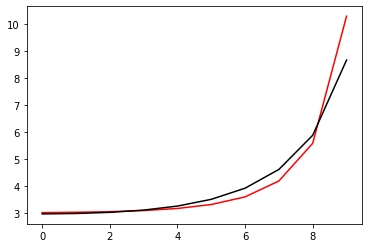

176000 0.03232578010595576
[2.94269971 2.96442724 3.01433552 3.10600051 3.26263435 3.52265951
 3.95421957 4.69052259 6.02786567 8.67060192]


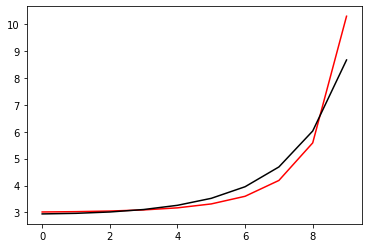

177100 0.051387088881401
[2.9839645  2.98886163 3.02041796 3.0929343  3.22644613 3.45190573
 3.81488889 4.39417748 5.53325708 8.55340397]


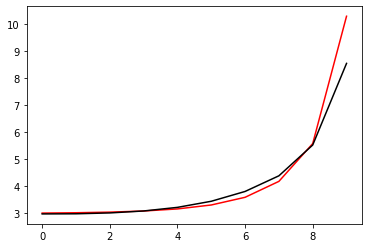

178200 0.01341184251022448
[3.00073237 3.00985639 3.04348911 3.11814806 3.25523983 3.48774695
 3.86821117 4.49014528 5.6408617  8.54399531]


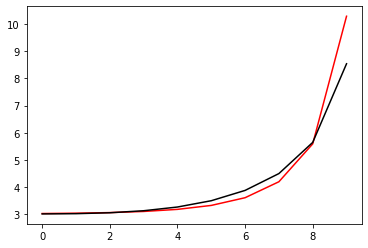

179300 0.03016187872734745
[2.99919138 3.01256438 3.04975389 3.12742321 3.26883477 3.51012391
 3.91294406 4.59076914 5.78512614 8.6610114 ]


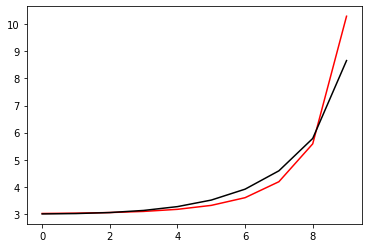

180400 0.01275534767794537
[2.87280575 2.89350068 2.94029797 3.02932616 3.18696063 3.45821536
 3.92805758 4.75647329 6.11609433 8.72368882]


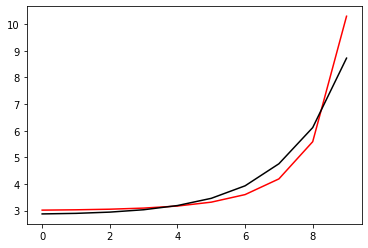

181500 0.022792405575617136
[2.9274137  2.96600727 3.04059329 3.1585036  3.34417451 3.64483688
 4.146913   4.99137295 6.24149956 8.79838341]


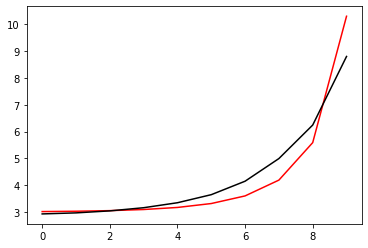

182600 0.04866549593260945
[2.83304273 2.85704114 2.91792427 3.02382262 3.19454923 3.47057594
 3.92454643 4.65515136 5.77713631 8.63328848]


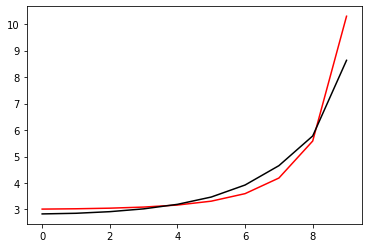

183700 0.013414795175154398
[2.92634216 2.94365269 2.9972299  3.09794776 3.26553315 3.53972346
 3.99152754 4.71966149 5.84494651 8.65200825]


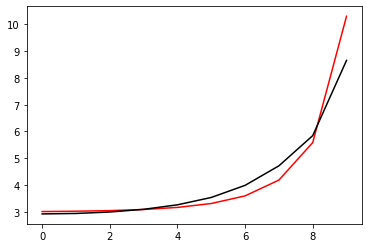

184800 0.012532826674451944
[2.8810206  2.90819102 2.96917389 3.07772969 3.25528293 3.54266311
 4.01264016 4.77103457 5.95058742 8.57497664]


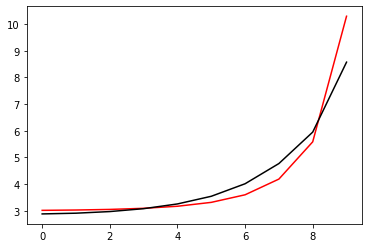

185900 0.012569983748109522
[2.89116296 2.92091257 2.98544301 3.0970929  3.27822995 3.56929819
 4.04163966 4.80644704 6.02114888 8.68399101]


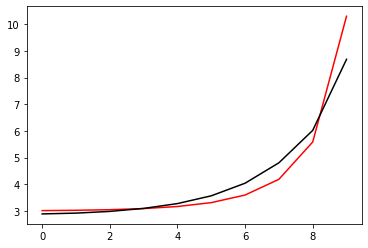

187000 0.03264036119338063
[2.94432362 2.97003967 3.03229019 3.14537111 3.33350481 3.63952919
 4.13854884 4.95317726 6.26028849 8.82503552]


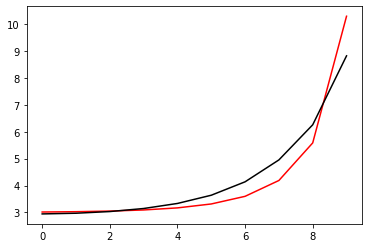

188100 0.04764125600346649
[2.90309357 2.91508665 2.9624798  3.0586409  3.22456862 3.49680321
 3.93816237 4.65189598 5.81279998 8.64038461]


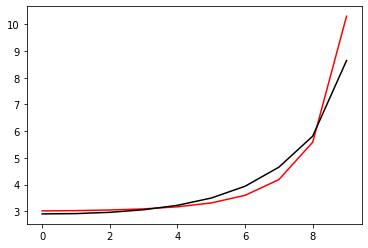

189200 0.017781151175769106
[2.90839869 2.92491162 2.97474616 3.07384416 3.24431939 3.52386428
 3.97732949 4.71144996 5.90466979 8.67010058]


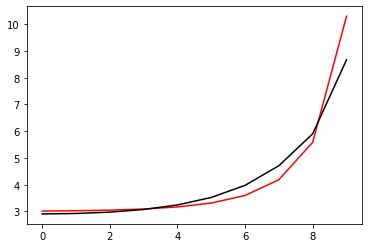

190300 0.0323065692744927
[2.85283023 2.87984961 2.93927958 3.0475974  3.2290525  3.52372873
 4.00066093 4.77439806 6.03107835 8.71508751]


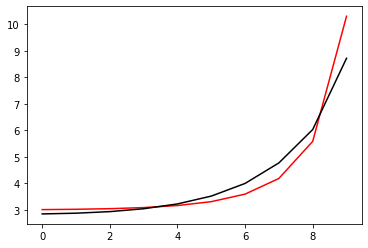

191400 0.019708821576419573
[2.96013671 2.98197037 3.03638434 3.13977376 3.31687633 3.60804771
 4.08215127 4.85526549 6.12536969 8.78085648]


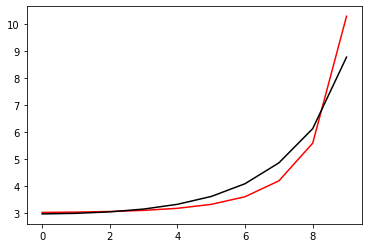

192500 0.06856232376528794
[2.72647159 2.76171294 2.82877455 2.9425257  3.12760477 3.42521198
 3.90744838 4.70369526 6.04770331 8.71564391]


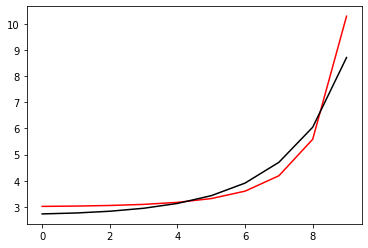

193600 0.030467611953242227
[2.90201114 2.91002672 2.94701793 3.02733077 3.17211093 3.41607485
 3.81869271 4.49559485 5.74593342 8.66993533]


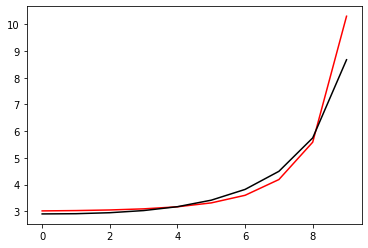

194700 0.2597295141223141
[3.11716646 3.13418775 3.1788941  3.26705098 3.42158994 3.67902207
 4.10066378 4.79363644 6.01304651 8.6899502 ]


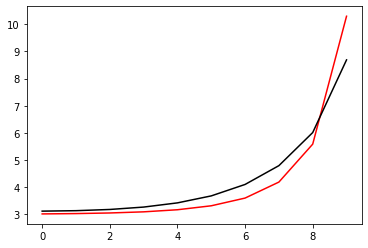

195800 0.012283573365690251
[2.94639809 2.94298218 2.96516459 3.03022073 3.15907913 3.38505278
 3.76503697 4.40223396 5.552548   8.55618984]


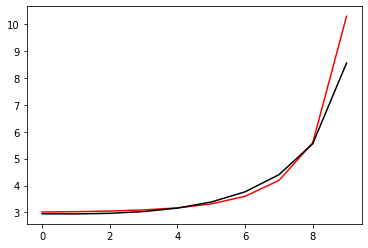

196900 0.012180230653424657
[2.98579206 2.99141608 3.01928883 3.0887859  3.22237963 3.45436585
 3.84318698 4.49600305 5.67376637 8.67471173]


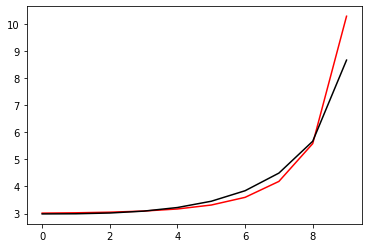

198000 0.03202673851894708
[2.98834634 2.99897003 3.03109981 3.10273432 3.23799255 3.4728795
 3.86832808 4.53785988 5.75130294 8.59831971]


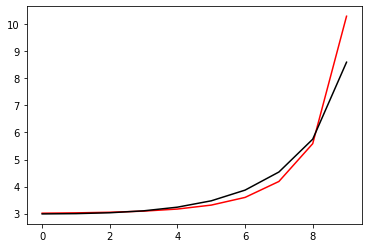

199100 0.05119824127169353
[2.96513436 2.98065196 3.01991704 3.0981743  3.24031016 3.48561123
 3.90067696 4.61028866 5.89708815 8.66010615]


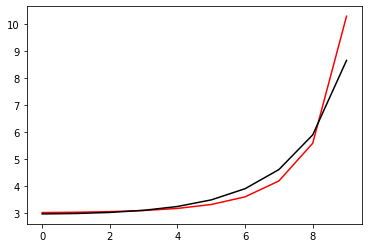

200200 0.012640006654870917
[2.97875403 3.00042597 3.05160672 3.14502952 3.30428351 3.57092533
 4.01849209 4.78580878 6.16674707 8.75346436]


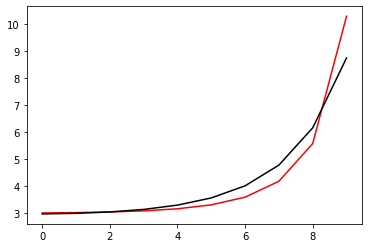

201300 0.023183607912137798
[2.93725834 2.95297707 2.9961865  3.08030305 3.22615713 3.46979099
 3.87589975 4.5726824  5.86301374 8.6415202 ]


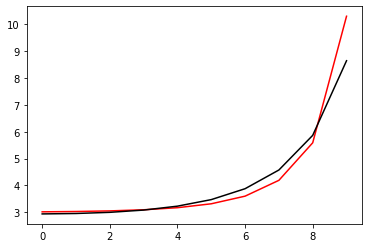

202400 0.012732269572565123
[2.85843574 2.88047549 2.93376632 3.03220414 3.19990679 3.47967415
 3.95174559 4.77114083 6.21985087 8.74301049]


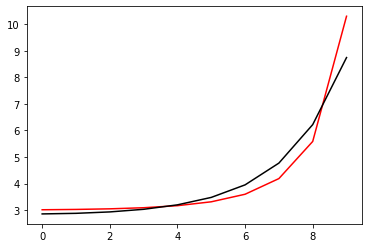

203500 0.021935230506353355
[2.96246743 2.96036899 2.98112691 3.04189253 3.16345761 3.38038708
 3.75463959 4.40949364 5.68239573 8.60840665]


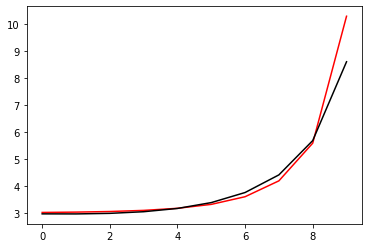

204600 0.012873127566016614
[3.03887476 3.05180225 3.0858909  3.15844661 3.29297819 3.52654455
 3.92499006 4.61863142 5.93158041 8.62422616]


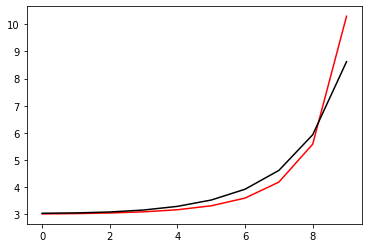

205700 0.07312930407247799
[2.7693872  2.7991585  2.85268079 2.94387255 3.09637378 3.35017163
 3.77768658 4.52304198 5.91241338 8.84139478]


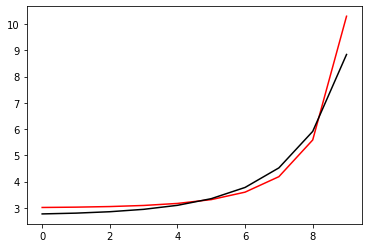

206800 0.011872181640047668
[2.92643783 2.91857188 2.9364831  2.99168591 3.1040468  3.30820687
 3.66353983 4.27594955 5.47608185 8.44797045]


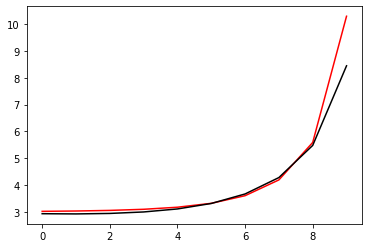

207900 0.011999575519586032
[2.89958456 2.91182801 2.94455385 3.01392717 3.14145009 3.36245532
 3.73850129 4.38419983 5.62515103 8.59758434]


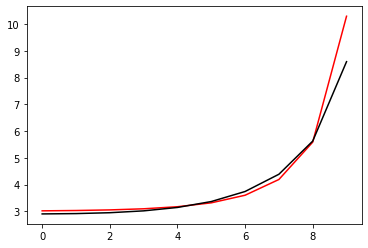

209000 0.0320645649026193
[2.97212739 2.98899537 3.03032498 3.1085255  3.24497864 3.47533501
 3.86226397 4.52829354 5.7956665  8.64514342]


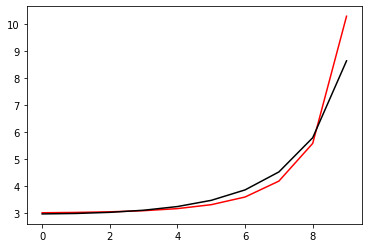

210100 0.0474944829823232
[2.91311489 2.92680637 2.96834468 3.0517425  3.20029477 3.45465966
 3.8884498  4.64316891 6.02943825 8.73240758]


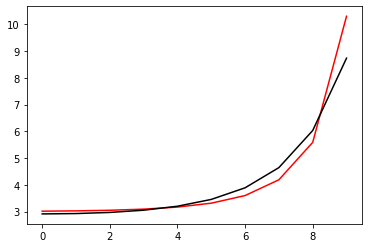

211200 0.013465910390601094
[2.99239956 3.00443847 3.03924884 3.11269756 3.24639227 3.47562981
 3.86314774 4.53557839 5.81643431 8.60242967]


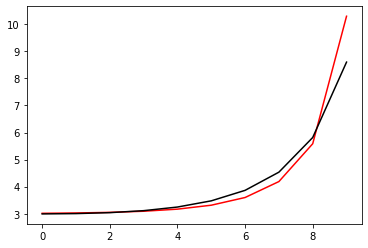

212300 0.02435857964218544
[2.95712908 2.97359022 3.01546532 3.09729622 3.242798   3.4916792
 3.91606669 4.65767417 6.02576714 8.72282361]


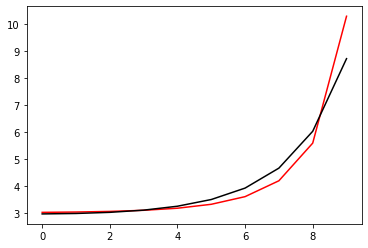

213400 0.018677531658979715
[2.94457213 2.968079   3.02308594 3.12364068 3.29547316 3.58433392
 4.07329786 4.91166288 6.37693741 8.80487109]


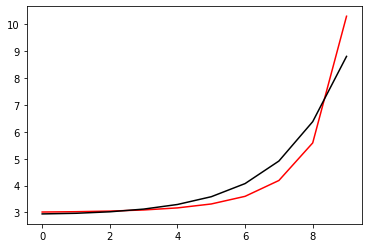

214500 0.06680800872113062
[2.73166505 2.76380734 2.82615926 2.93627198 3.12314889 3.44017154
 3.97868056 4.69949737 5.84155867 8.62008983]


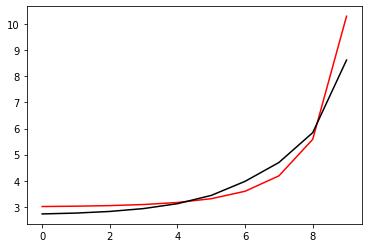

215600 0.022367355610476373
[2.90673629 2.92394453 2.97217054 3.06883079 3.24212965 3.54288597
 4.05304889 4.75832473 5.88242602 8.65377039]


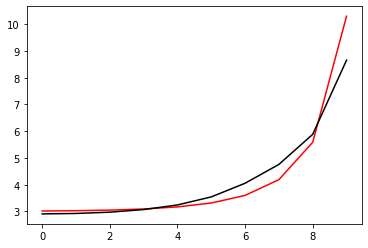

216700 0.012893831059454526
[2.91801922 2.94076404 2.99558453 3.09988147 3.28280856 3.59476702
 4.11231009 4.85890154 6.0405758  8.71973744]


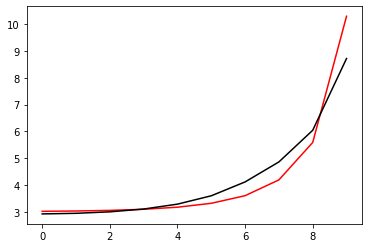

217800 0.022565558593658545
[2.97949508 2.99921255 3.05164686 3.153925   3.3344288  3.64067368
 4.14340261 4.90657492 6.12840527 8.69761441]


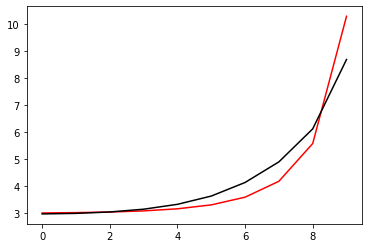

218900 0.012237269391396048
[2.88165328 2.90121237 2.95065558 3.04534173 3.20964008 3.48226844
 3.9170389  4.56595772 5.63545501 8.58390827]


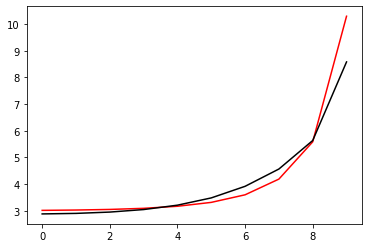

220000 0.032608628716429465
[2.90046089 2.92512289 2.98006209 3.08093969 3.25291194 3.53585185
 3.98624857 4.66419239 5.7598761  8.58065211]


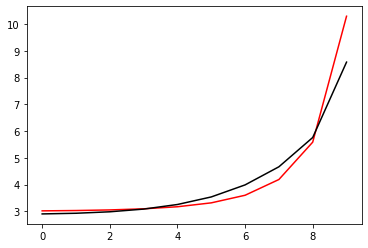

221100 0.0457788667391511
[2.86538336 2.89431746 2.95525904 3.06320374 3.24424288 3.5402961
 4.01389211 4.74393049 5.90861467 8.6747676 ]


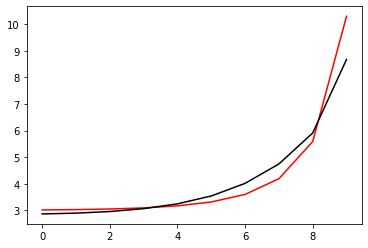

222200 0.03145776490491362
[2.79482543 2.83229886 2.90524591 3.02642651 3.2217901  3.53525711
 4.03682854 4.82843561 6.08084122 8.66791519]


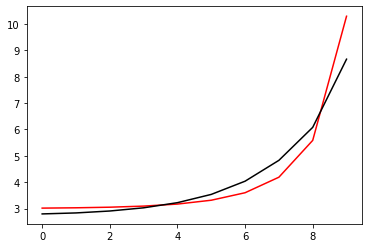

223300 0.025809793566856983
[2.93876591 2.96724303 3.02679248 3.13158717 3.30339926 3.57572166
 3.99085133 4.58337558 5.58427929 8.56202894]


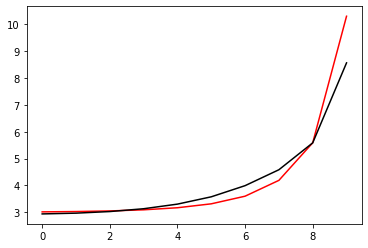

224400 0.021810946154583812
[2.96167156 2.98987529 3.05038476 3.15638936 3.32977457 3.60421279
 4.02438859 4.63778215 5.63970054 8.58287814]


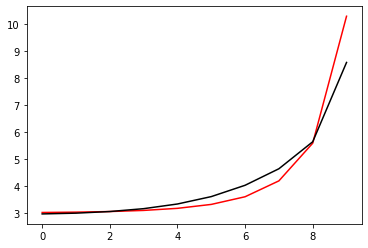

225500 0.0223873564144498
[2.96091339 2.98896944 3.05094753 3.15965608 3.33737897 3.61965108
 4.05989034 4.73307105 5.77415286 8.7047488 ]


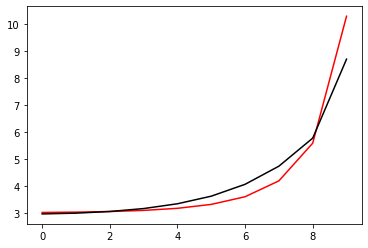

226600 0.020023207868821835
[2.88881861 2.93041061 3.00625815 3.12739051 3.31595181 3.60835864
 4.06345378 4.77463834 5.87708537 8.69679108]


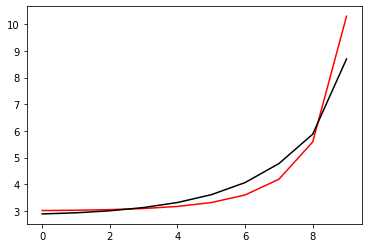

227700 0.015554557059368208
[2.87113139 2.91453495 2.99570009 3.12086207 3.30766553 3.58703008
 4.00856755 4.65783296 5.75968968 8.56479704]


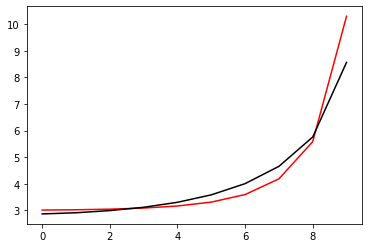

228800 0.01942080737493432
[2.90571969 2.94831967 3.03155032 3.16220754 3.35695655 3.6473628
 4.08776671 4.76259924 5.90056737 8.72374686]


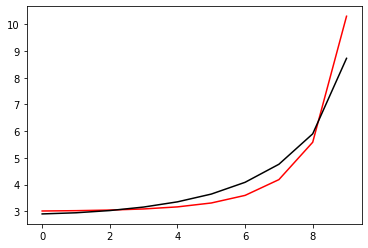

229900 0.013050509983508062
[2.92115355 2.95758768 3.03733606 3.17070629 3.37786067 3.69752561
 4.20230102 5.01587956 6.29472004 8.82608257]


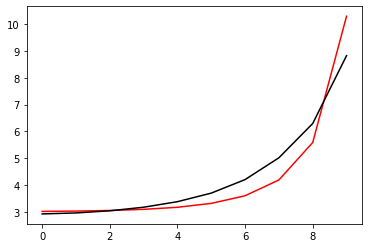

231000 0.0328721240783198
[2.86554291 2.90365003 2.98438296 3.1174124  3.32240965 3.63658778
 4.12781583 4.90839875 6.13867717 8.74772486]


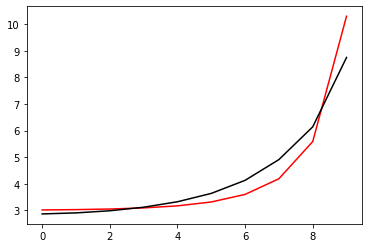

232100 0.34158070921436556
[3.04829567 3.0878328  3.16778967 3.30181549 3.51108874 3.83298559
 4.33346113 5.12510651 6.39011586 8.78546268]


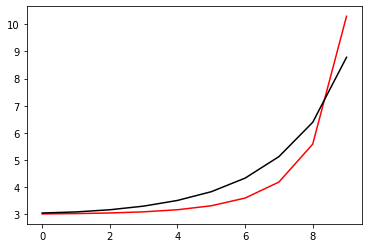

233200 0.01629025075679229
[2.85083312 2.88266141 2.95300916 3.07347988 3.26198613 3.5494881
 3.99004806 4.68019923 5.81291704 8.6391867 ]


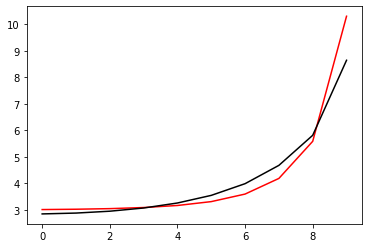

234300 0.023219943457256767
[2.91056469 2.93596785 3.00006677 3.11519911 3.29949393 3.58388967
 4.02247651 4.71206008 5.84928008 8.59502479]


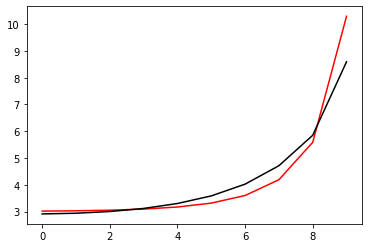

235400 0.012716057888972364
[2.84496923 2.87805201 2.94939211 3.07180519 3.26531464 3.56377199
 4.02717922 4.761992   5.96466053 8.68183103]


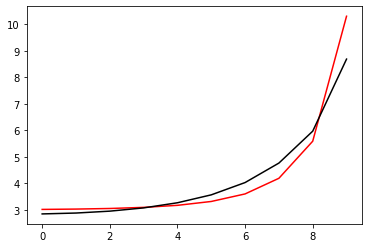

236500 0.022727016274731254
[2.92700179 2.95694334 3.02699736 3.15017519 3.34808201 3.6575828
 4.1431212  4.91452231 6.16186811 8.7544838 ]


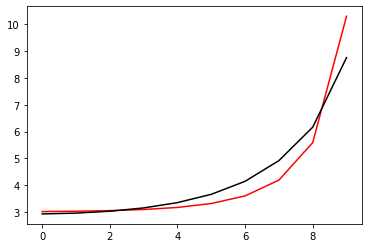

237600 0.021894874746378204
[2.88661254 2.92096801 2.99165002 3.11031801 3.29628624 3.58151516
 4.02034366 4.70799886 5.84822718 8.63824036]


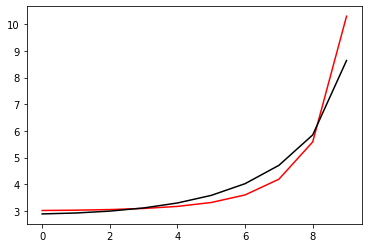

238700 0.012469426448898834
[2.96905517 2.99540842 3.06024467 3.17500914 3.35949851 3.64729246
 4.09588872 4.80677985 5.98882081 8.74360954]


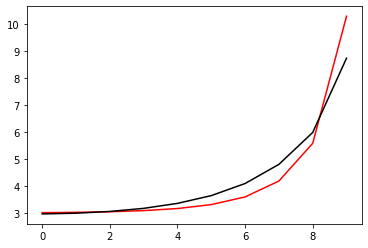

239800 0.022622243562738703
[2.96350468 2.99632594 3.06711767 3.18790135 3.37950582 3.67737775
 4.14340012 4.88872853 6.1325988  8.73699347]


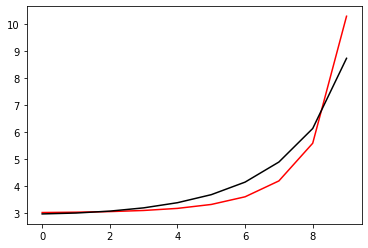

240900 0.012269055037431335
[2.8794654  2.90728878 2.97145003 3.08199737 3.25615804 3.52229281
 3.92744108 4.5593988  5.64995633 8.58900777]


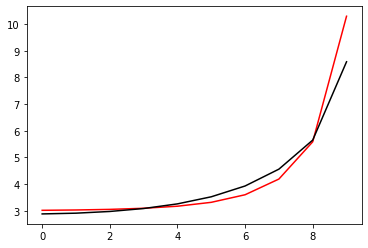

242000 0.03261742162676957
[2.88730848 2.91856243 2.98609297 3.10096358 3.28133568 3.55745263
 3.98024921 4.64121855 5.7601801  8.61819236]


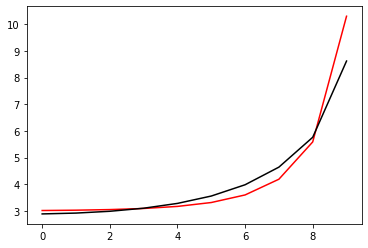

243100 0.048111701551128296
[2.87874941 2.90977117 2.97786844 3.09474636 3.27989416 3.56624068
 4.01080749 4.7150949  5.89140324 8.65953718]


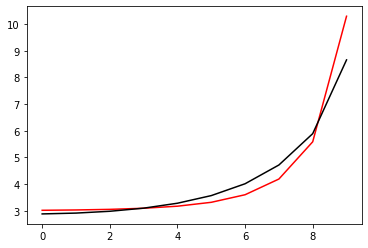

244200 0.03463073669039312
[2.76631659 2.81272672 2.89896374 3.0364782  3.24801753 3.57366993
 4.08475272 4.90090339 6.20472807 8.68671426]


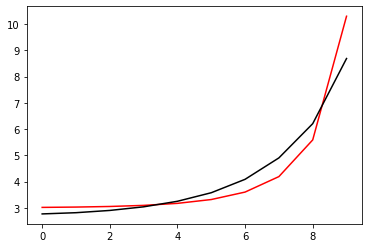

245300 0.1131785078536482
[2.7191463  2.7558042  2.8322602  2.96087489 3.16341279 3.47812619
 3.97028805 4.74441407 5.98229377 8.63878271]


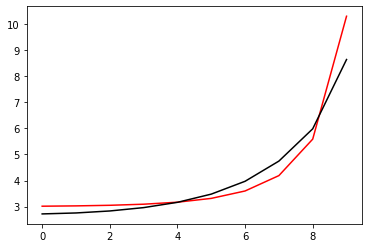

246400 0.02209231740876023
[2.99373874 3.01001391 3.06332079 3.16964197 3.34978451 3.63954802
 4.10078788 4.83656862 6.03613467 8.71297859]


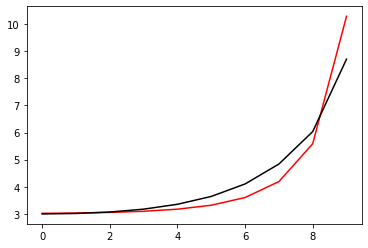

247500 0.013559832495870526
[2.83603762 2.86748543 2.93407998 3.05282349 3.24739098 3.55600581
 4.04441987 4.8243768  6.09897557 8.68866352]


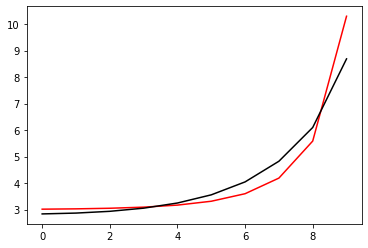

248600 0.44332769146660883
[3.09900841 3.13157571 3.19909286 3.31196377 3.49061657 3.76723413
 4.19412337 4.86370186 6.00167349 8.7661058 ]


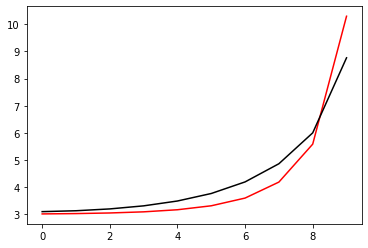

249700 0.012664109809676532
[2.97127348 2.9806101  3.02090456 3.10666795 3.25676648 3.50152059
 3.89210171 4.52454788 5.6403298  8.5925504 ]


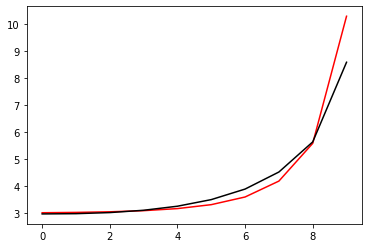

250800 0.02141453453349705
[2.95840885 2.97601441 3.02179948 3.11210547 3.26775001 3.52079053
 3.92565313 4.58444254 5.74591165 8.61746051]


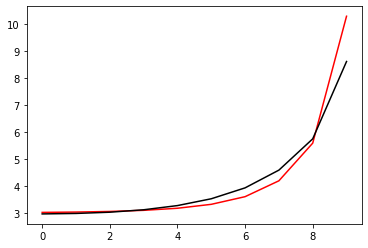

251900 0.012380821212542428
[2.94319964 2.96751122 3.02169807 3.11975007 3.28397274 3.54933343
 3.97528133 4.67330449 5.90162581 8.74359312]


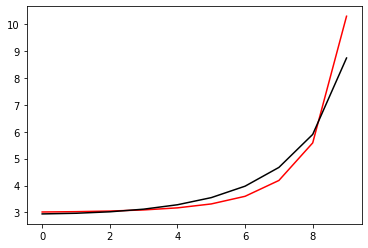

253000 0.03205144549577703
[2.98354996 3.01682109 3.07963172 3.18313814 3.34593762 3.59744545
 3.98537473 4.59979304 5.70773458 8.60308075]


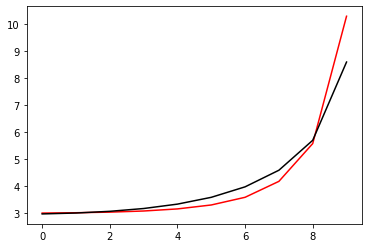

254100 0.050692936772509356
[2.92598665 2.95036925 3.0050576  3.09956572 3.25079208 3.48650485
 3.85295021 4.43663011 5.48543206 8.54462097]


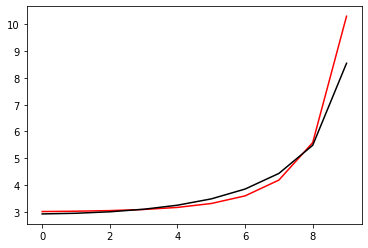

255200 0.013315019173267972
[2.96255191 2.99014897 3.04948298 3.15020815 3.30975989 3.55754182
 3.94390152 4.56412325 5.67360014 8.51661822]


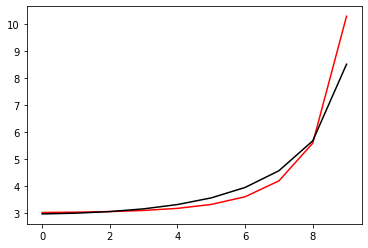

KeyboardInterrupt: 

In [15]:
c_reg2=0.0001
optimizer=tf.optimizers.Adam(learning_rate=0.001)
for j in range (5000):    
    with tf.GradientTape() as g:
        loss=Error_func(h, Positive[j%10], Negative[j%10])
        gradients=g.gradient(loss, [h])
    for i in range (100):
        optimizer.apply_gradients(zip(gradients, [h]))
    if j%11==0: 
        print(j*100, Error_func(h, Positive[j%10], Negative[j%10]).numpy()), print(h.numpy())
        plt.plot(h_real, 'r-'), plt.plot(h.numpy(), 'k-'), plt.show()

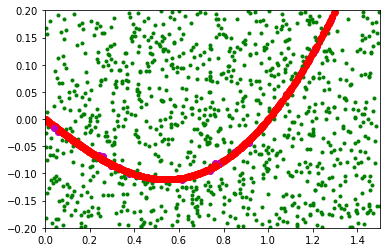

In [16]:
for i in range (set):
    [Positive0[i], Positive1[i]]=NN_func_01(h, Positive[i])
    [Negative0[i], Negative1[i]]=NN_func_01(h, Negative[i])
for i in range (set):
    x_data1[i]=[v[0] for v in Positive0[i]]
    y_data1[i]=[v[1] for v in Positive0[i]]
    x_data2[i]=[v[0] for v in Positive1[i]]
    y_data2[i]=[v[1] for v in Positive1[i]]
    x_data3[i]=[v[0] for v in Negative0[i]]
    y_data3[i]=[v[1] for v in Negative0[i]]
    x_data4[i]=[v[0] for v in Negative1[i]]
    y_data4[i]=[v[1] for v in Negative1[i]]
    plt.plot(x_data4[i], y_data4[i], 'g.')
    plt.plot(x_data2[i], y_data2[i], 'co')
    plt.plot(x_data1[i], y_data1[i], 'ro')
    plt.plot(x_data3[i], y_data3[i], 'mo')
plt.xlim(0.0, 1.5)
plt.ylim(-0.2, 0.2)
plt.show()